In [1]:
pip install jupyter-autotime

Note: you may need to restart the kernel to use updated packages.


In [2]:
# Alternative: Use %time for single lines
import pandas as pd
%time df = pd.DataFrame({'A': range(1000), 'B': range(1000)})
%time result = df.groupby('A').sum()

CPU times: total: 0 ns
Wall time: 998 µs
CPU times: total: 0 ns
Wall time: 9.06 ms


In [3]:
%%time
import sys
import os
import open3d as o3d
import numpy as np
import ifcopenshell
import scipy.ndimage as ndimage
import matplotlib.pyplot as plt
from open3d.visualization import draw_geometries
# Temporary placeholder for writeIFC
def writeIFC(*args, **kwargs):
    print("writeIFC function not implemented")
from mpl_toolkits.mplot3d import Axes3D
from scipy.spatial import ConvexHull
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
from scipy.spatial import QhullError

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.
CPU times: total: 3.52 s
Wall time: 2.6 s


In [4]:
%%time
# Define the directory path
directory_path = r'C:\open3d-env\ScantoIFC\pipeline'

# Change the current working directory to the specified path
os.chdir(directory_path)

# Add the directory to the system path for module imports
sys.path.insert(0, directory_path)

# Print the current working directory to verify
print("Current working directory:", os.getcwd())

Current working directory: C:\open3d-env\ScantoIFC\pipeline
CPU times: total: 0 ns
Wall time: 996 µs


In [5]:
%%time
import numpy as np

def read_ply_header(file_path):
    """
    Read the header of a PLY file and extract property names.
    
    :param file_path: Path to the PLY file
    :return: List of property names
    """
    properties = []
    with open(file_path, 'r') as f:
        for line in f:
            if line.startswith('property'):
                parts = line.split()
                if len(parts) == 3:
                    properties.append(parts[2])
            elif line.strip() == 'end_header':
                break
    return properties

def load_point_cloud(file_path):
    """
    Load a point cloud from a PLY file and convert it to a NumPy array.
    
    :param file_path: Path to the PLY file
    :return: NumPy array with all columns
    """
    # Read the PLY file manually
    with open(file_path, 'r') as f:
        lines = f.readlines()
    
    # Find the start of the data
    data_start = next(i for i, line in enumerate(lines) if line.strip() == 'end_header') + 1
    
    # Parse the data
    data = []
    for line in lines[data_start:]:
        values = line.strip().split()
        # Convert all values to float, except RGB which should be int
        row = [float(v) for v in values[:3]] + [int(v) for v in values[3:6]] + [float(v) if v != 'nan' else np.nan for v in values[6:]]
        data.append(row)
    
    # Convert to numpy array
    pcd_array = np.array(data)
    
    return pcd_array

# File path
file_path = "1.35_with_scalars.ply"

# Read PLY header and extract property names
column_names = read_ply_header(file_path)
print("Extracted column names from PLY header:")
for i, name in enumerate(column_names):
    print(f"Column {i}: {name}")

# Load the point cloud
initial_pcd = load_point_cloud(file_path)

print("\nPoint cloud dimensions are: ", initial_pcd.shape)
np.set_printoptions(precision=3, suppress=True)
print("Point cloud data (first 5 rows):")
print(initial_pcd[:5])

# Function to analyze the point cloud structure
def analyze_point_cloud(pcd_data, column_names):
    for i, name in enumerate(column_names):
        column = pcd_data[:, i]
        print(f"\nColumn {i} ({name}):")
        print(f"  Data type: {column.dtype}")
        print(f"  Unique values: {len(np.unique(column))}")
        
        if np.isnan(column).all():
            print("  All values are NaN")
        else:
            non_nan = column[~np.isnan(column)]
            print(f"  Range: {np.min(non_nan)} to {np.max(non_nan)}")
            print(f"  Sample values: {np.unique(non_nan)[:5]}")
            print(f"  Non-NaN values: {len(non_nan)}")
            print(f"  Unique non-NaN values: {np.unique(non_nan)}")

# Analyze the point cloud
analyze_point_cloud(initial_pcd, column_names)

# Find the column indices for different components
component_indices = {name: i for i, name in enumerate(column_names) if name.startswith('scalar_')}

print("\nComponent column indices:")
for component, index in component_indices.items():
    print(f"{component}: {index}")

# Calculate the number of points for each component
print("\nNumber of points for each component:")
for component, index in component_indices.items():
    num_points = np.sum(~np.isnan(initial_pcd[:, index]))
    print(f"{component}: {num_points}")

Extracted column names from PLY header:
Column 0: x
Column 1: y
Column 2: z
Column 3: red
Column 4: green
Column 5: blue
Column 6: scalar_AC_Ledge
Column 7: scalar_Classification
Column 8: scalar_Wall2
Column 9: scalar_Wall3
Column 10: scalar_Original_cloud_index
Column 11: scalar_Wall6
Column 12: scalar_Wall4
Column 13: scalar_Wall5
Column 14: scalar_Wall1
Column 15: scalar_Slab

Point cloud dimensions are:  (458300, 16)
Point cloud data (first 5 rows):
[[-1268.34  -1958.766    33.596   102.       99.       93.      100.
        nan       nan       nan       nan       nan       nan       nan
        nan       nan]
 [-1262.072 -2008.815    29.44    115.      114.      107.      100.
        nan       nan       nan       nan       nan       nan       nan
        nan       nan]
 [-1389.362 -1976.195    32.867   110.      109.      102.      100.
        nan       nan       nan       nan       nan       nan       nan
        nan       nan]
 [-1471.879 -1965.011    35.888    92.       90. 

In [6]:
%%time
def pcd_rotation(pcd, bins_size=0.1):
    def find_best_angle(xy, min_angle, max_angle, bins=9):
        gap = (max_angle - min_angle) / bins
        best_index, best_value = 0, 0
        for i in range(bins):
            if i == 0:
                best_value = sum_hist_maximums(xy, (min_angle+gap/2) + i*gap)
                continue
            cur = sum_hist_maximums(xy, (min_angle+gap/2) + i*gap)
            if cur > best_value:
                best_value, best_index = cur, i
        new_min_angle, new_max_angle = min_angle + best_index*gap, min_angle + (best_index+1)*gap
        return new_min_angle, new_max_angle
            
    def sum_hist_maximums(xy, angle):
        R = create_rotation_matrix(angle)
        xy_rotated = np.matmul(R, xy.transpose())
        xy_rotated = xy_rotated.transpose()
        xy_range = np.max(xy_rotated, axis=0) - np.min(xy_rotated, axis=0)
        [bins_num_x, bins_num_y] = xy_range / bins_size
        [n_x, _] = np.histogram(xy_rotated[:,0], bins=int(bins_num_x))
        [n_y, _] = np.histogram(xy_rotated[:,1], bins=int(bins_num_y))
        # non-maximal suppression
        margin_eps = 0.3
        padding = np.ceil(margin_eps / bins_size)
        n_x_maxpooled = ndimage.maximum_filter1d(n_x, int(padding*2+1)) 
        n_y_maxpooled = ndimage.maximum_filter1d(n_y, int(padding*2+1)) 
        n_x_sorted = -np.sort(-n_x[n_x == n_x_maxpooled])
        n_y_sorted = -np.sort(-n_y[n_y == n_y_maxpooled])
        return np.sum(n_x_sorted[:20]) + np.sum(n_y_sorted[:20])

    def create_rotation_matrix(angle):
        theta = np.radians(angle)
        c, s = np.cos(theta), np.sin(theta)
        R = np.array(((c, -s), (s, c)))
        return R
        
    epsilon = 0.001
    min_angle, max_angle = -45, 45
    xy = pcd[:, 0:2]
    while (max_angle - min_angle) > epsilon:
        min_angle, max_angle = find_best_angle(xy, min_angle, max_angle)
    best_angle = (max_angle + min_angle) / 2
    R = create_rotation_matrix(best_angle)
    xy_rotated = np.matmul(R, xy.transpose())
    xy_rotated = xy_rotated.transpose()
    pcd_rotated = pcd.copy()
    pcd_rotated[:, 0:2] = xy_rotated
    return best_angle, pcd_rotated

# Perform rotation
best_angle, rotated_pcd = pcd_rotation(initial_pcd, bins_size=0.1)
print(f"Best rotation angle: {best_angle} degrees")


Best rotation angle: -0.3212586157259225 degrees
CPU times: total: 3 s
Wall time: 1.17 s


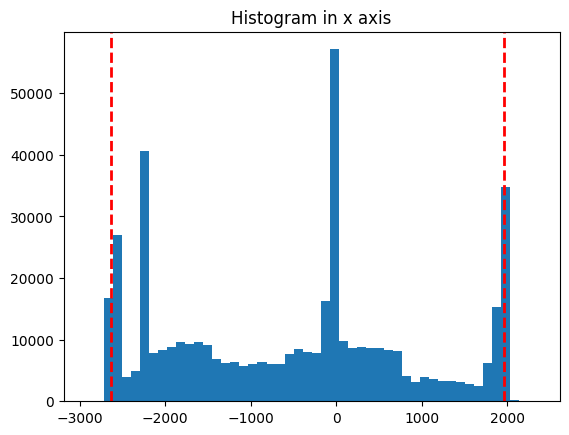

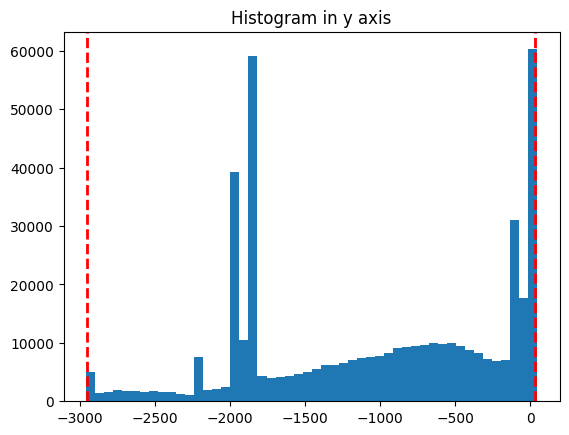

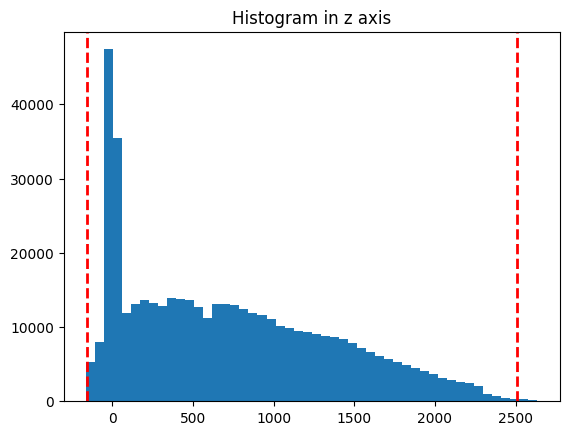

X boundaries: -2627.92, 1957.47
Y boundaries: -2954.53, 33.59
Z boundaries: -154.45, 2511.03
Original point cloud size: 458300
Filtered point cloud size: 455551


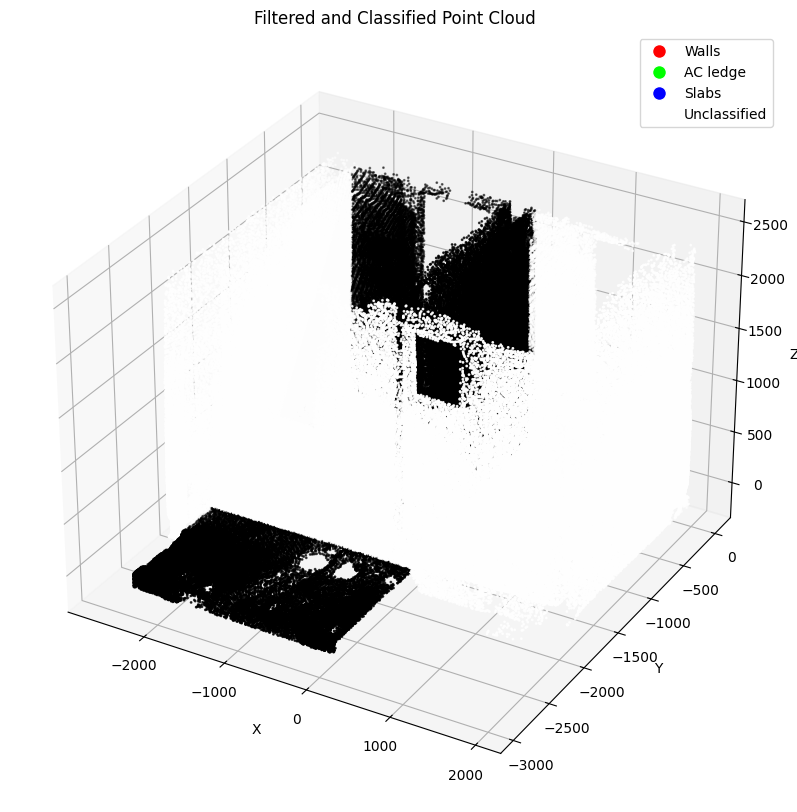

Filtering and classification completed.
CPU times: total: 7.02 s
Wall time: 6.93 s


In [8]:
%%time
def pcd_remove_unconnected_clusters(rotated_pcd, bins_size=0.1, percentile_cutoff=0.1):
    """
    Remove unconnected clusters from the point cloud by filtering points outside specified percentile boundaries.
    :param rotated_pcd: NumPy array of the rotated point cloud data
    :param bins_size: Bin size for the histogram (not used in this function but kept for consistency)
    :param percentile_cutoff: Percentile cutoff to determine the boundaries
    :return: Filtered point cloud with only connected clusters
    """
    def find_boundary(samples, direction):
        plt.figure()
        plt.hist(samples, bins=50)
        plt.title(f'Histogram in {direction} axis')
        
        # Use percentile-based boundary calculation
        left_bndry = np.percentile(samples, percentile_cutoff)
        right_bndry = np.percentile(samples, 100 - percentile_cutoff)
        
        plt.axvline(left_bndry, color='r', linestyle='dashed', linewidth=2)
        plt.axvline(right_bndry, color='r', linestyle='dashed', linewidth=2)
        plt.show()
        
        return left_bndry, right_bndry

    x, y, z = rotated_pcd[:, 0], rotated_pcd[:, 1], rotated_pcd[:, 2]
    x_left_bndry, x_right_bndry = find_boundary(x, 'x')
    y_left_bndry, y_right_bndry = find_boundary(y, 'y')
    z_left_bndry, z_right_bndry = find_boundary(z, 'z')
    
    # Filter points based on the boundaries
    mask = (x >= x_left_bndry) & (x <= x_right_bndry) & \
           (y >= y_left_bndry) & (y <= y_right_bndry) & \
           (z >= z_left_bndry) & (z <= z_right_bndry)
    
    pcd_preprocessed = rotated_pcd[mask]
    
    # Print boundary information
    print(f"X boundaries: {x_left_bndry:.2f}, {x_right_bndry:.2f}")
    print(f"Y boundaries: {y_left_bndry:.2f}, {y_right_bndry:.2f}")
    print(f"Z boundaries: {z_left_bndry:.2f}, {z_right_bndry:.2f}")
    
    return pcd_preprocessed

# Apply the function to remove unconnected clusters
filtered_pcd = pcd_remove_unconnected_clusters(rotated_pcd, percentile_cutoff=0.1)

# Create color array based on classification for the filtered point cloud
filtered_colors = np.zeros((len(filtered_pcd), 3))
filtered_colors[filtered_pcd[:, 6] == 200.0] = [1, 0, 0]  # Red for walls
filtered_colors[filtered_pcd[:, 8] == 50.0] = [0, 1, 0]   # Green for AC ledge
filtered_colors[filtered_pcd[:, 9] == 0.0] = [0, 0, 1]    # Blue for slabs
filtered_colors[np.isnan(filtered_pcd[:, 6]) & 
               np.isnan(filtered_pcd[:, 8]) & 
               np.isnan(filtered_pcd[:, 9])] = [1, 1, 1]  # White for unclassified

# Visualize the filtered point cloud using matplotlib
def visualize_point_cloud(points, colors, title="Point Cloud Visualization"):
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection='3d')
    
    # Plot points
    scatter = ax.scatter(points[:, 0], points[:, 1], points[:, 2],
                        c=colors, s=1)
    
    # Set labels and title
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.set_title(title)
    
    # Add legend
    legend_elements = [plt.Line2D([0], [0], marker='o', color='w', 
                                 markerfacecolor=c, label=l, markersize=10)
                      for c, l in zip([[1,0,0], [0,1,0], [0,0,1], [1,1,1]], 
                                    ['Walls', 'AC ledge', 'Slabs', 'Unclassified'])]
    ax.legend(handles=legend_elements)
    
    plt.show()

print(f"Original point cloud size: {len(rotated_pcd)}")
print(f"Filtered point cloud size: {len(filtered_pcd)}")

# Visualize the filtered point cloud
visualize_point_cloud(filtered_pcd[:, :3], filtered_colors, 
                     "Filtered and Classified Point Cloud")

print("Filtering and classification completed.")

In [9]:
# Floor Extraction

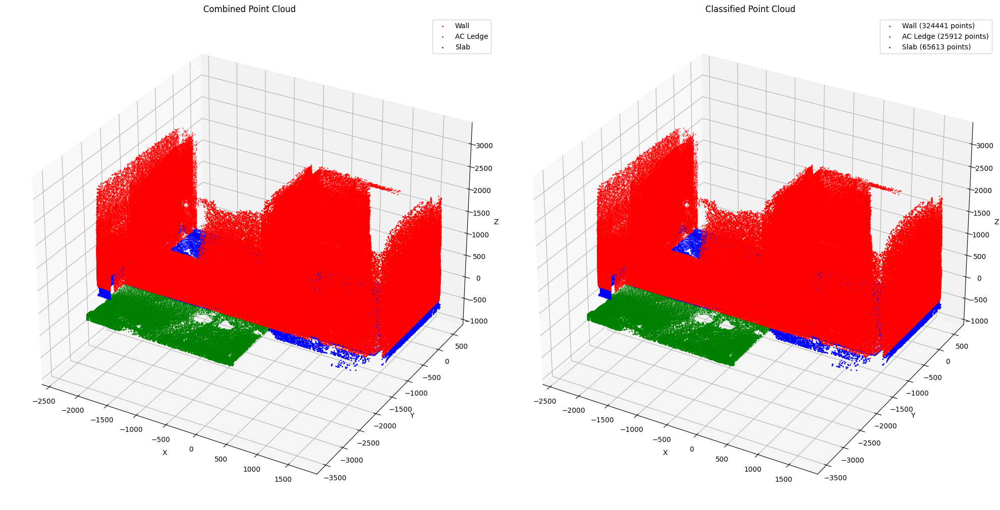

Number of wall points: 324441
Number of AC ledge points: 25912
Number of slab points: 65613
Point clouds have been created and are ready for further processing.
CPU times: total: 11.8 s
Wall time: 11.8 s


In [10]:
%%time
import numpy as np
import matplotlib.pyplot as plt

def classify_and_visualize_wall_slab(filtered_pcd):
    """
    Classify points as wall, slab, or AC ledge based on their scalar values and visualize the result.
    
    :param filtered_pcd: numpy array of point cloud data
    :return: tuple of (wall_points, ac_ledge_points, slab_points)
    """
    # Updated classification based on new column indices
    ac_ledge_mask = ~np.isnan(filtered_pcd[:, 6])  # scalar_AC_Ledge
    wall_mask = np.any(~np.isnan(filtered_pcd[:, [9, 11, 12, 13, 14]]), axis=1)  # All scalar_Wall columns
    slab_mask = ~np.isnan(filtered_pcd[:, 15])  # scalar_Slab
    
    # Create separate point clouds
    wall_points = filtered_pcd[wall_mask]
    ac_ledge_points = filtered_pcd[ac_ledge_mask]
    slab_points = filtered_pcd[slab_mask]
    
    # Function to set consistent axis limits
    def set_axes_equal(ax):
        """Set 3D plot axes to equal scale with a common range."""
        x_limits = []
        y_limits = []
        z_limits = []
        
        for points in [wall_points, ac_ledge_points, slab_points]:
            if len(points) > 0:
                x_limits.extend([np.min(points[:, 0]), np.max(points[:, 0])])
                y_limits.extend([np.min(points[:, 1]), np.max(points[:, 1])])
                z_limits.extend([np.min(points[:, 2]), np.max(points[:, 2])])
        
        x_range = [np.min(x_limits), np.max(x_limits)]
        y_range = [np.min(y_limits), np.max(y_limits)]
        z_range = [np.min(z_limits), np.max(z_limits)]
        
        # Get the largest range for equal scaling
        max_range = max(x_range[1] - x_range[0],
                       y_range[1] - y_range[0],
                       z_range[1] - z_range[0])
        
        x_middle = np.mean(x_range)
        y_middle = np.mean(y_range)
        z_middle = np.mean(z_range)
        
        ax.set_xlim(x_middle - max_range/2, x_middle + max_range/2)
        ax.set_ylim(y_middle - max_range/2, y_middle + max_range/2)
        ax.set_zlim(z_middle - max_range/2, z_middle + max_range/2)

    # Combined visualization using Matplotlib
    fig = plt.figure(figsize=(20, 10))
    
    # First subplot: Combined view
    ax_combined = fig.add_subplot(121, projection='3d')
    if len(wall_points) > 0:
        ax_combined.scatter(wall_points[:, 0], wall_points[:, 1], wall_points[:, 2], 
                          c='red', s=1, label='Wall')
    if len(ac_ledge_points) > 0:
        ax_combined.scatter(ac_ledge_points[:, 0], ac_ledge_points[:, 1], ac_ledge_points[:, 2], 
                          c='green', s=1, label='AC Ledge')
    if len(slab_points) > 0:
        ax_combined.scatter(slab_points[:, 0], slab_points[:, 1], slab_points[:, 2], 
                          c='blue', s=1, label='Slab')
    
    ax_combined.set_title('Combined Point Cloud')
    ax_combined.set_xlabel('X')
    ax_combined.set_ylabel('Y')
    ax_combined.set_zlabel('Z')
    ax_combined.legend()
    set_axes_equal(ax_combined)

    # Second subplot: Separate views
    ax_separate = fig.add_subplot(122, projection='3d')
    plots = []
    labels = []
    
    if len(wall_points) > 0:
        wall_plot = ax_separate.scatter(wall_points[:, 0], wall_points[:, 1], wall_points[:, 2], 
                                      c='red', s=1)
        plots.append(wall_plot)
        labels.append(f'Wall ({len(wall_points)} points)')
    
    if len(ac_ledge_points) > 0:
        ac_plot = ax_separate.scatter(ac_ledge_points[:, 0], ac_ledge_points[:, 1], ac_ledge_points[:, 2], 
                                    c='green', s=1)
        plots.append(ac_plot)
        labels.append(f'AC Ledge ({len(ac_ledge_points)} points)')
    
    if len(slab_points) > 0:
        slab_plot = ax_separate.scatter(slab_points[:, 0], slab_points[:, 1], slab_points[:, 2], 
                                      c='blue', s=1)
        plots.append(slab_plot)
        labels.append(f'Slab ({len(slab_points)} points)')
    
    ax_separate.set_title('Classified Point Cloud')
    ax_separate.set_xlabel('X')
    ax_separate.set_ylabel('Y')
    ax_separate.set_zlabel('Z')
    ax_separate.legend(plots, labels)
    set_axes_equal(ax_separate)

    plt.tight_layout()
    plt.show()
    
    # Print statistics
    print(f"Number of wall points: {len(wall_points)}")
    print(f"Number of AC ledge points: {len(ac_ledge_points)}")
    print(f"Number of slab points: {len(slab_points)}")
    
    return wall_points, ac_ledge_points, slab_points

# Run the function to classify and visualize
wall_points, ac_ledge_points, slab_points = classify_and_visualize_wall_slab(filtered_pcd)

# Create colored point clouds (keeping the structure but removing Open3D dependency)
def create_colored_pcd(points):
    return points if len(points) > 0 else None

wall_pcd = create_colored_pcd(wall_points)
ac_ledge_pcd = create_colored_pcd(ac_ledge_points)
slab_pcd = create_colored_pcd(slab_points)

print("Point clouds have been created and are ready for further processing.")

Analysis of original slab points:

=== Original Slab Points ===
Total number of points: 65613
Point cloud shape: (65613, 16)
Number of points with non-finite coordinates: 0

X-coordinate statistics:
Range: -2627.820 to 1957.456
Mean: -377.739
Median: -605.110
Standard deviation: 1300.928

Y-coordinate statistics:
Range: -2289.786 to 33.589
Mean: -724.953
Median: -623.966
Standard deviation: 612.334

Z-coordinate statistics:
Range: -154.440 to 54.409
Mean: -17.683
Median: -5.762
Standard deviation: 40.882


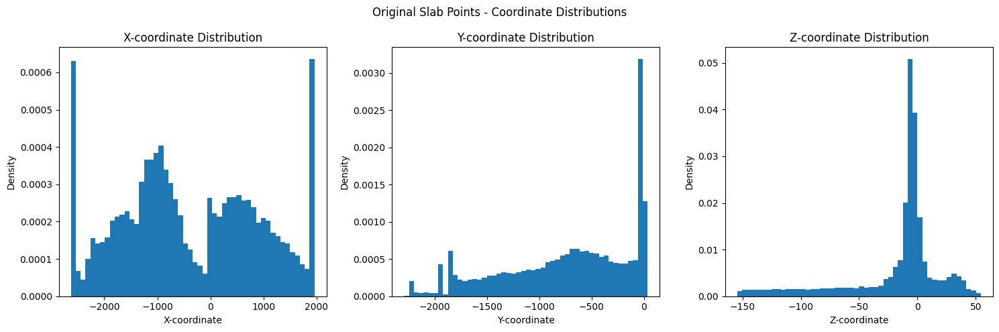


Analysis of refined slab points:

=== Refined Slab Points ===
Total number of points: 64299
Point cloud shape: (64299, 16)
Number of points with non-finite coordinates: 0

X-coordinate statistics:
Range: -2627.820 to 1957.456
Mean: -365.283
Median: -592.281
Standard deviation: 1296.377

Y-coordinate statistics:
Range: -2289.786 to 33.589
Mean: -717.545
Median: -619.667
Standard deviation: 603.790

Z-coordinate statistics:
Range: -146.262 to 44.209
Mean: -17.005
Median: -5.762
Standard deviation: 38.489


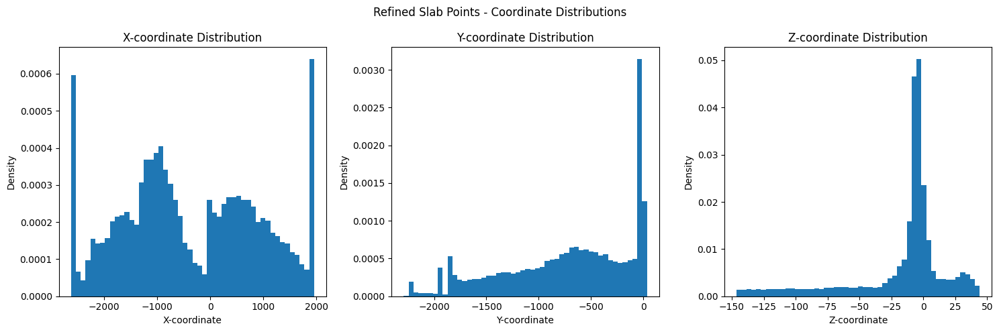

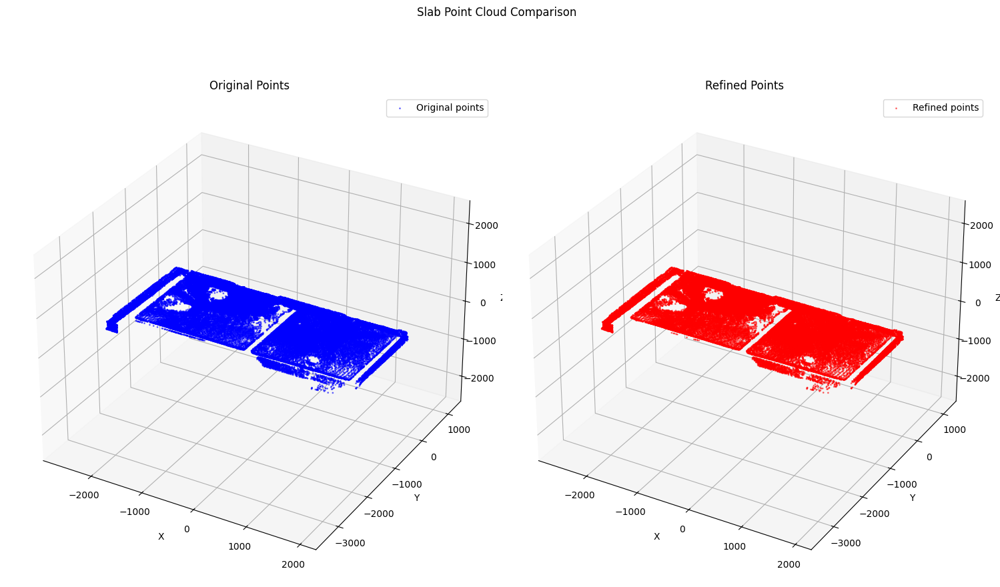

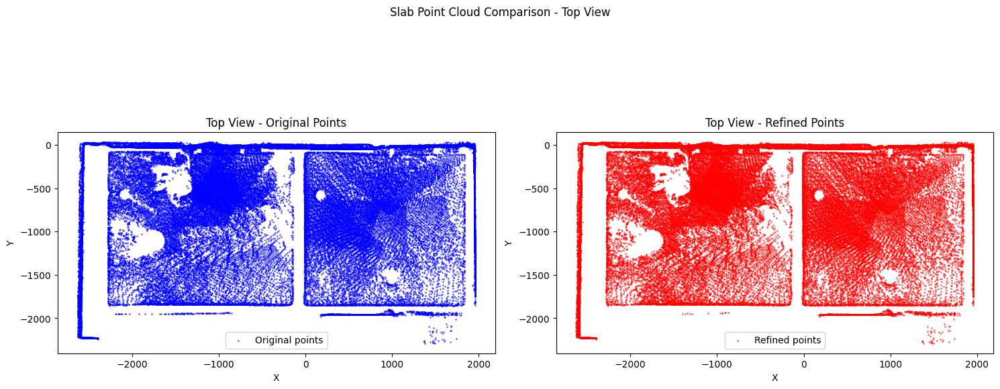


Comparison Statistics:
Number of original slab points: 65613
Number of refined slab points: 64299
Percentage of points retained: 98.00%
CPU times: total: 5.67 s
Wall time: 5.67 s


In [11]:
%%time
import numpy as np
from scipy.spatial import cKDTree
import matplotlib.pyplot as plt

def set_axes_equal(ax):
    """Set 3D plot axes to equal scale."""
    x_limits = ax.get_xlim3d()
    y_limits = ax.get_ylim3d()
    z_limits = ax.get_zlim3d()
    
    x_range = abs(x_limits[1] - x_limits[0])
    x_middle = np.mean(x_limits)
    y_range = abs(y_limits[1] - y_limits[0])
    y_middle = np.mean(y_limits)
    z_range = abs(z_limits[1] - z_limits[0])
    z_middle = np.mean(z_limits)
    
    # The plot bounding box is a sphere in the sense of the infinity
    # norm, hence I call half the max range the plot radius.
    plot_radius = 0.5 * max([x_range, y_range, z_range])
    
    ax.set_xlim3d([x_middle - plot_radius, x_middle + plot_radius])
    ax.set_ylim3d([y_middle - plot_radius, y_middle + plot_radius])
    ax.set_zlim3d([z_middle - plot_radius, z_middle + plot_radius])

def analyze_point_cloud(points, title="Point Cloud Analysis"):
    """
    Analyze the point cloud and print diagnostic information.
    
    Args:
        points: numpy array of shape (N, M) where N is number of points
        title: string for plot titles
    """
    print(f"\n=== {title} ===")
    print(f"Total number of points: {len(points)}")
    print(f"Point cloud shape: {points.shape}")
    
    # Analyze coordinates
    coord_data = points[:, :3]  # Only spatial coordinates
    non_finite = np.any(~np.isfinite(coord_data), axis=1)
    print(f"Number of points with non-finite coordinates: {np.sum(non_finite)}")
    
    # Coordinate statistics
    for i, axis in enumerate(['X', 'Y', 'Z']):
        coords = coord_data[:, i]
        print(f"\n{axis}-coordinate statistics:")
        print(f"Range: {np.min(coords):.3f} to {np.max(coords):.3f}")
        print(f"Mean: {np.mean(coords):.3f}")
        print(f"Median: {np.median(coords):.3f}")
        print(f"Standard deviation: {np.std(coords):.3f}")
    
    # Create subplots for coordinate distributions
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    fig.suptitle(f"{title} - Coordinate Distributions")
    
    for i, (ax, axis) in enumerate(zip(axes, ['X', 'Y', 'Z'])):
        coords = coord_data[:, i]
        ax.hist(coords, bins=50, density=True)
        ax.set_title(f"{axis}-coordinate Distribution")
        ax.set_xlabel(f"{axis}-coordinate")
        ax.set_ylabel("Density")
    
    plt.tight_layout()
    plt.show()

def extract_slab_points(points, z_percentile_low=5, z_percentile_high=95, slab_scalar_threshold=None):
    """
    Extract points that are likely to be part of the slab using both height and scalar values.
    
    Args:
        points: numpy array containing point cloud data
        z_percentile_low: lower percentile for z-coordinate filtering
        z_percentile_high: upper percentile for z-coordinate filtering
        slab_scalar_threshold: threshold for slab scalar values (column 15)
    """
    # Height-based filtering
    z_coords = points[:, 2]
    z_low = np.percentile(z_coords, z_percentile_low)
    z_high = np.percentile(z_coords, z_percentile_high)
    height_mask = (z_coords >= z_low) & (z_coords <= z_high)
    
    # Scalar-based filtering (using column 15 for slab)
    if slab_scalar_threshold is not None:
        scalar_mask = ~np.isnan(points[:, 15]) & (points[:, 15] > slab_scalar_threshold)
        combined_mask = height_mask & scalar_mask
    else:
        combined_mask = height_mask
    
    return points[combined_mask]

def visualize_extracted_slab(original_points, extracted_points, title="Slab Point Cloud Comparison"):
    """
    Visualize the original point cloud and the extracted slab points with equal axes.
    
    Args:
        original_points: numpy array of original points
        extracted_points: numpy array of extracted points
        title: string for plot title
    """
    fig = plt.figure(figsize=(15, 10))
    
    # Create two subplots side by side
    ax1 = fig.add_subplot(121, projection='3d')
    ax2 = fig.add_subplot(122, projection='3d')
    
    # Plot original points
    ax1.scatter(original_points[:, 0], original_points[:, 1], original_points[:, 2],
                c='blue', s=1, alpha=0.5, label='Original points')
    ax1.set_title('Original Points')
    
    # Plot extracted points
    ax2.scatter(extracted_points[:, 0], extracted_points[:, 1], extracted_points[:, 2],
                c='red', s=1, alpha=0.5, label='Refined points')
    ax2.set_title('Refined Points')
    
    # Set labels and properties for both plots
    for ax in [ax1, ax2]:
        ax.set_xlabel('X')
        ax.set_ylabel('Y')
        ax.set_zlabel('Z')
        ax.legend()
        set_axes_equal(ax)
    
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()
    
    # Additional top view visualization
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 7))
    
    # Plot top view (X-Y projection)
    ax1.scatter(original_points[:, 0], original_points[:, 1],
                c='blue', s=1, alpha=0.5, label='Original points')
    ax1.set_title('Top View - Original Points')
    
    ax2.scatter(extracted_points[:, 0], extracted_points[:, 1],
                c='red', s=1, alpha=0.5, label='Refined points')
    ax2.set_title('Top View - Refined Points')
    
    for ax in [ax1, ax2]:
        ax.set_xlabel('X')
        ax.set_ylabel('Y')
        ax.set_aspect('equal')
        ax.legend()
    
    plt.suptitle(f"{title} - Top View")
    plt.tight_layout()
    plt.show()

def analyze_slab(slab_points):
    """Main function to analyze slab points."""
    # Initial analysis
    print("Analysis of original slab points:")
    analyze_point_cloud(slab_points, "Original Slab Points")
    
    # Extract refined slab points using both height and scalar value
    refined_slab_points = extract_slab_points(
        slab_points,
        z_percentile_low=1,
        z_percentile_high=99,
        slab_scalar_threshold=0  # Adjust this threshold based on your data
    )
    
    # Analyze refined points
    print("\nAnalysis of refined slab points:")
    analyze_point_cloud(refined_slab_points, "Refined Slab Points")
    
    # Visualize both point clouds
    visualize_extracted_slab(slab_points, refined_slab_points)
    
    # Print comparison statistics
    print("\nComparison Statistics:")
    print(f"Number of original slab points: {len(slab_points)}")
    print(f"Number of refined slab points: {len(refined_slab_points)}")
    print(f"Percentage of points retained: {(len(refined_slab_points)/len(slab_points))*100:.2f}%")

# Run the analysis
if __name__ == "__main__":
    analyze_slab(slab_points)

Starting enhanced slab analysis...
Filtering slab points...
Initial slab points: 65613
Downsampled to: 19683 points
Height filter: -36.63 to 25.92
Points after height filter: 47955
Voxel downsampled for clustering: 47948
Final surface points: 47948
Successfully extracted 47948 slab surface points
Creating mesh...
Calculated slab thickness: 172.72 units
Z-top: 54.41, Z-bottom: -118.31
Estimated slab area: 13330.82 square units
Estimated slab volume: 2302543.60 cubic units
Creating visualization...


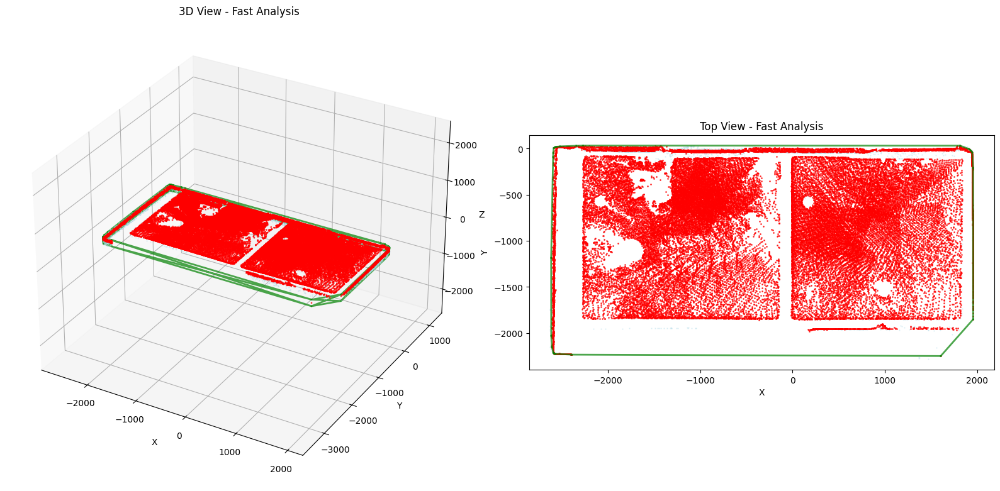


Enhanced Slab Analysis Results:
Total processing time: 1.04 seconds
Total points processed: 65613
Surface points identified: 47948
Surface point density: 3.60 points/unit²
Slab thickness: 172.72 units
Slab area: 13330.82 square units
Slab volume: 2302543.60 cubic units
CPU times: total: 1.05 s
Wall time: 1.04 s


In [16]:
%%time
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import ConvexHull
from sklearn.cluster import DBSCAN
from scipy.ndimage import gaussian_filter
import time

def set_axes_equal(ax):
    """Set 3D plot axes to equal scale."""
    x_limits = ax.get_xlim3d()
    y_limits = ax.get_ylim3d()
    z_limits = ax.get_zlim3d()
    
    x_range = abs(x_limits[1] - x_limits[0])
    x_middle = np.mean(x_limits)
    y_range = abs(y_limits[1] - y_limits[0])
    y_middle = np.mean(y_limits)
    z_range = abs(z_limits[1] - z_limits[0])
    z_middle = np.mean(z_limits)
    
    plot_radius = 0.5 * max([x_range, y_range, z_range])
    
    ax.set_xlim3d([x_middle - plot_radius, x_middle + plot_radius])
    ax.set_ylim3d([y_middle - plot_radius, y_middle + plot_radius])
    ax.set_zlim3d([z_middle - plot_radius, z_middle + plot_radius])

def fast_density_estimation(points, grid_size=50):
    """
    Fast histogram-based density estimation instead of KDE.
    """
    hist, bin_edges = np.histogram(points, bins=grid_size, density=True)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
    
    # Apply light smoothing
    smoothed_hist = gaussian_filter(hist, sigma=1)
    
    return bin_centers, smoothed_hist

def voxel_downsample(points, voxel_size):
    """
    Fast voxel-based downsampling to reduce point cloud size.
    """
    # Calculate voxel indices
    voxel_indices = np.floor(points[:, :3] / voxel_size).astype(int)
    
    # Create unique voxel keys
    voxel_keys = voxel_indices[:, 0] * 1000000 + voxel_indices[:, 1] * 1000 + voxel_indices[:, 2]
    
    # Get unique voxels and their first occurrence indices
    unique_keys, unique_indices = np.unique(voxel_keys, return_index=True)
    
    return points[unique_indices]

def extract_slab_surface_fast(points, z_percentile_low=95, z_percentile_high=99.9, 
                              downsample_factor=0.3):
    """
    Fast slab surface extraction using optimized density-based clustering.
    """
    print("Filtering slab points...")
    
    # Use slab scalar values with robust statistics
    slab_scalar_mask = ~np.isnan(points[:, 15])
    slab_points = points[slab_scalar_mask]
    
    if len(slab_points) == 0:
        raise ValueError("No slab points found using scalar values")
    
    print(f"Initial slab points: {len(slab_points)}")
    
    # Fast downsampling to reduce computation time
    if len(slab_points) > 20000:
        n_sample = int(len(slab_points) * downsample_factor)
        indices = np.random.choice(len(slab_points), n_sample, replace=False)
        slab_points_sample = slab_points[indices]
        print(f"Downsampled to: {len(slab_points_sample)} points")
    else:
        slab_points_sample = slab_points
    
    # Fast histogram-based height filtering
    valid_z = slab_points_sample[:, 2]
    bin_centers, z_density = fast_density_estimation(valid_z, grid_size=100)
    
    # Find peaks efficiently
    peak_indices = np.where((z_density[1:-1] > z_density[:-2]) & 
                          (z_density[1:-1] > z_density[2:]))[0] + 1
    
    if len(peak_indices) > 0:
        main_peak_z = bin_centers[peak_indices[np.argmax(z_density[peak_indices])]]
        z_range = np.max(valid_z) - np.min(valid_z)
        adaptive_window = 0.15 * z_range
        z_low = main_peak_z - adaptive_window
        z_high = main_peak_z + adaptive_window
    else:
        z_low = np.percentile(valid_z, z_percentile_low)
        z_high = np.percentile(valid_z, z_percentile_high)
    
    print(f"Height filter: {z_low:.2f} to {z_high:.2f}")
    
    # Apply height filter to original slab points
    height_mask = (slab_points[:, 2] >= z_low) & (slab_points[:, 2] <= z_high)
    potential_surface = slab_points[height_mask]
    
    print(f"Points after height filter: {len(potential_surface)}")
    
    # Fast clustering using reduced dataset
    if len(potential_surface) > 10000:
        # Use voxel downsampling for clustering
        voxel_size = np.percentile(np.diff(np.sort(potential_surface[:, 0])), 90) * 2
        clustered_points = voxel_downsample(potential_surface, voxel_size)
        print(f"Voxel downsampled for clustering: {len(clustered_points)}")
    else:
        clustered_points = potential_surface
    
    # Fast DBSCAN with optimized parameters
    if len(clustered_points) > 0:
        # Estimate eps more efficiently
        sample_size = min(1000, len(clustered_points))
        sample_indices = np.random.choice(len(clustered_points), sample_size, replace=False)
        sample_points = clustered_points[sample_indices, :3]
        
        # Use approximate nearest neighbor distance
        center = np.mean(sample_points, axis=0)
        distances = np.linalg.norm(sample_points - center, axis=1)
        eps = np.percentile(distances, 75) * 0.2
        
        # Apply DBSCAN only if dataset is manageable
        if len(clustered_points) < 15000:
            clustering = DBSCAN(eps=eps, min_samples=3, n_jobs=-1).fit(clustered_points[:, :3])
            cluster_mask = clustering.labels_ != -1
            if np.sum(cluster_mask) > 0:
                main_cluster_label = np.bincount(clustering.labels_[cluster_mask]).argmax()
                cluster_mask = clustering.labels_ == main_cluster_label
                surface_points = clustered_points[cluster_mask]
            else:
                surface_points = clustered_points
        else:
            # Skip clustering for very large datasets
            surface_points = clustered_points
    else:
        surface_points = potential_surface
    
    print(f"Final surface points: {len(surface_points)}")
    return surface_points

def create_slab_mesh_fast(slab_points, all_points):
    """
    Fast mesh creation with simplified boundary detection.
    Uses original slab points for accurate thickness calculation.
    """
    print("Creating mesh...")
    
    points_2d = slab_points[:, :2]
    
    try:
        # Simple convex hull without refinement for speed
        hull = ConvexHull(points_2d)
        slab_vertices_2d = points_2d[hull.vertices]
        
        # CRITICAL FIX: Use all original slab points for thickness calculation
        # Get all slab points (not just the filtered surface points)
        slab_mask = ~np.isnan(all_points[:, 15])
        all_slab_points = all_points[slab_mask]
        
        # Calculate thickness using ALL slab points like the attached code
        z_top = np.max(all_slab_points[:, 2])  # True maximum from all slab points
        z_bottom = np.percentile(all_slab_points[:, 2], 5)  # Same as attached code
        
        calculated_thickness = z_top - z_bottom
        print(f"Calculated slab thickness: {calculated_thickness:.2f} units")
        print(f"Z-top: {z_top:.2f}, Z-bottom: {z_bottom:.2f}")
        
        # Create mesh vertices
        slab_vertices_top = np.column_stack((slab_vertices_2d, np.full(len(slab_vertices_2d), z_top)))
        slab_vertices_bottom = np.column_stack((slab_vertices_2d, np.full(len(slab_vertices_2d), z_bottom)))
        slab_vertices = np.vstack((slab_vertices_top, slab_vertices_bottom))
        
        # Fast area and volume calculation
        area = ConvexHull(slab_vertices_2d).area
        volume = area * calculated_thickness
        
        print(f"Estimated slab area: {area:.2f} square units")
        print(f"Estimated slab volume: {volume:.2f} cubic units")
        
        return slab_vertices, calculated_thickness, area, volume
        
    except Exception as e:
        print(f"Error creating slab mesh: {str(e)}")
        return None, None, None, None

def visualize_slab_fast(original_points, slab_points, slab_mesh, downsample_viz=True):
    """
    Fast visualization with optional downsampling for display.
    """
    print("Creating visualization...")
    
    fig = plt.figure(figsize=(16, 8))
    
    # Downsample for visualization if needed
    if downsample_viz and len(original_points) > 10000:
        viz_indices = np.random.choice(len(original_points), 10000, replace=False)
        viz_points = original_points[viz_indices]
    else:
        viz_points = original_points
    
    # 3D view
    ax1 = fig.add_subplot(121, projection='3d')
    
    # Simple scatter without density calculation for speed
    ax1.scatter(viz_points[:, 0], viz_points[:, 1], viz_points[:, 2],
                c='lightblue', s=0.5, alpha=0.3)
    ax1.scatter(slab_points[:, 0], slab_points[:, 1], slab_points[:, 2],
                c='red', s=1, alpha=0.7)
    
    # Mesh visualization
    if slab_mesh is not None:
        n = len(slab_mesh) // 2
        for i in range(n):
            ax1.plot3D(slab_mesh[[i, (i+1)%n, n+i, n+(i+1)%n, i], 0],
                      slab_mesh[[i, (i+1)%n, n+i, n+(i+1)%n, i], 1],
                      slab_mesh[[i, (i+1)%n, n+i, n+(i+1)%n, i], 2],
                      'g-', alpha=0.7, linewidth=2)
    
    ax1.set_xlabel('X')
    ax1.set_ylabel('Y')
    ax1.set_zlabel('Z')
    ax1.set_title('3D View - Fast Analysis')
    set_axes_equal(ax1)
    
    # Top view
    ax2 = fig.add_subplot(122)
    ax2.scatter(viz_points[:, 0], viz_points[:, 1],
                c='lightblue', s=0.5, alpha=0.3)
    ax2.scatter(slab_points[:, 0], slab_points[:, 1],
                c='red', s=1, alpha=0.7)
    
    # Plot mesh boundary
    if slab_mesh is not None:
        n = len(slab_mesh) // 2
        for i in range(n):
            ax2.plot(slab_mesh[[i, (i+1)%n], 0],
                    slab_mesh[[i, (i+1)%n], 1],
                    'g-', alpha=0.7, linewidth=2)
    
    ax2.set_xlabel('X')
    ax2.set_ylabel('Y')
    ax2.set_title('Top View - Fast Analysis')
    ax2.set_aspect('equal')
    
    plt.tight_layout()
    plt.show()

def analyze_slab(points):
    """Main function optimized for speed."""
    print("Starting enhanced slab analysis...")
    start_time = time.time()
    
    try:
        # Extract surface points with speed optimizations
        slab_surface_points = extract_slab_surface_fast(points)
        print(f"Successfully extracted {len(slab_surface_points)} slab surface points")
        
        # Create mesh with simplified approach
        slab_mesh, thickness, area, volume = create_slab_mesh_fast(slab_surface_points, points)
        
        if slab_mesh is not None:
            # Fast visualization
            visualize_slab_fast(points, slab_surface_points, slab_mesh)
            
            # Results
            end_time = time.time()
            print(f"\nEnhanced Slab Analysis Results:")
            print(f"Total processing time: {end_time - start_time:.2f} seconds")
            print(f"Total points processed: {len(points)}")
            print(f"Surface points identified: {len(slab_surface_points)}")
            print(f"Surface point density: {len(slab_surface_points)/area:.2f} points/unit²")
            print(f"Slab thickness: {thickness:.2f} units")
            print(f"Slab area: {area:.2f} square units")
            print(f"Slab volume: {volume:.2f} cubic units")
            
            return slab_surface_points, slab_mesh, thickness, area, volume
            
    except Exception as e:
        print(f"Error in enhanced slab analysis: {str(e)}")
        return None, None, None, None, None

# Run the analysis
slab_surface_points, slab_mesh, thickness, area, volume = analyze_slab(slab_points)

# Comparitive Analysis for slab geometry extraction

Starting slab analysis with best-fit rectangle...
Successfully extracted 3215 slab surface points
Best fit rectangle covers 100.0% of points

Rectangle Properties:
Length: 2266.16 units
Width: 4582.30 units
Rotation Angle: 90.05 degrees
Area: 10384222.22 square units
Volume: 1767332756.51 cubic units
Thickness: 170.19 units


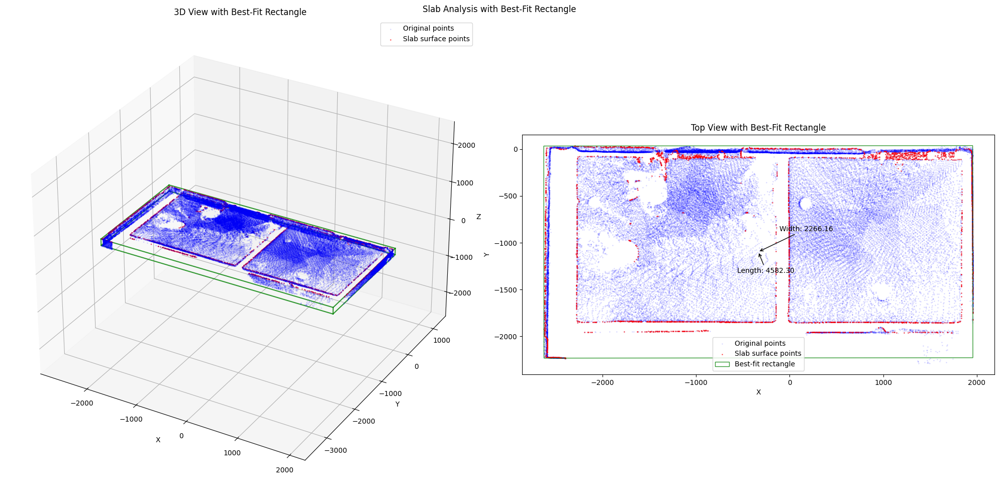

CPU times: total: 2.89 s
Wall time: 2.89 s


In [13]:
%%time
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import ConvexHull
from sklearn.decomposition import PCA
from matplotlib.patches import Rectangle, Polygon

def find_best_fit_rectangle(points_2d, coverage_threshold=0.90):
    """
    Find the best-fit rectangle that covers at least coverage_threshold of points.
    
    Args:
        points_2d: numpy array of shape (N, 2) containing XY coordinates
        coverage_threshold: minimum fraction of points that must be within rectangle
        
    Returns:
        rect_points: corners of the best-fit rectangle
        best_angle: rotation angle of the rectangle
        width: width of the rectangle
        length: length of the rectangle
    """
    # Get the convex hull of points to reduce computation
    hull = ConvexHull(points_2d)
    hull_points = points_2d[hull.vertices]
    
    def check_point_coverage(rotated_points, min_pts, max_pts):
        """Check what fraction of points lie within the rectangle"""
        points_within = np.all((rotated_points >= min_pts) & (rotated_points <= max_pts), axis=1)
        coverage = np.sum(points_within) / len(rotated_points)
        return coverage, points_within
    
    def expand_bounds_for_coverage(rotated_points, min_pts, max_pts, target_coverage):
        """Expand bounds until desired coverage is reached"""
        current_coverage, points_within = check_point_coverage(rotated_points, min_pts, max_pts)
        
        if current_coverage >= target_coverage:
            return min_pts, max_pts
        
        # Calculate how much we need to expand in each direction
        expansion_steps = 20
        best_coverage = current_coverage
        best_min_pts = min_pts.copy()
        best_max_pts = max_pts.copy()
        
        original_width = max_pts[1] - min_pts[1]
        original_length = max_pts[0] - min_pts[0]
        
        for expansion in np.linspace(0, 0.5, expansion_steps):
            width_expand = original_width * expansion
            length_expand = original_length * expansion
            
            test_min = min_pts - [length_expand, width_expand]
            test_max = max_pts + [length_expand, width_expand]
            
            coverage, _ = check_point_coverage(rotated_points, test_min, test_max)
            
            if coverage > best_coverage:
                best_coverage = coverage
                best_min_pts = test_min
                best_max_pts = test_max
            
            if coverage >= target_coverage:
                break
        
        return best_min_pts, best_max_pts
    
    def get_rectangle_metrics(angle):
        # Create rotation matrix
        theta = np.radians(angle)
        rotation_matrix = np.array([
            [np.cos(theta), -np.sin(theta)],
            [np.sin(theta), np.cos(theta)]
        ])
        
        # Rotate points
        rotated_points = np.dot(points_2d, rotation_matrix)
        
        # Find initial min/max in rotated space
        min_pts = np.min(rotated_points, axis=0)
        max_pts = np.max(rotated_points, axis=0)
        
        # Expand bounds to achieve desired coverage
        min_pts, max_pts = expand_bounds_for_coverage(
            rotated_points, min_pts, max_pts, coverage_threshold)
        
        # Calculate width and length
        width = max_pts[1] - min_pts[1]
        length = max_pts[0] - min_pts[0]
        
        # Calculate area
        area = width * length
        
        coverage, _ = check_point_coverage(rotated_points, min_pts, max_pts)
        
        return area, width, length, min_pts, max_pts, rotated_points, coverage
    
    # Search for best angle by checking angles of hull edges
    best_area = float('inf')
    best_angle = 0
    best_width = 0
    best_length = 0
    best_rotated_points = None
    best_min_pts = None
    best_coverage = 0
    
    # Check angles from convex hull edges
    for i in range(len(hull_points)):
        edge = hull_points[(i + 1) % len(hull_points)] - hull_points[i]
        angle = np.degrees(np.arctan2(edge[1], edge[0]))
        
        # Check both the edge angle and perpendicular angle
        for test_angle in [angle, angle + 90]:
            metrics = get_rectangle_metrics(test_angle)
            area, width, length, min_pts, max_pts, rotated_points, coverage = metrics
            
            if coverage >= coverage_threshold and area < best_area:
                best_area = area
                best_angle = test_angle
                best_width = width
                best_length = length
                best_rotated_points = rotated_points
                best_min_pts = min_pts
                best_coverage = coverage
    
    print(f"Best fit rectangle covers {best_coverage*100:.1f}% of points")
    
    # Create rectangle corners in rotated space
    rect_rotated = np.array([
        [best_min_pts[0], best_min_pts[1]],
        [best_min_pts[0] + best_length, best_min_pts[1]],
        [best_min_pts[0] + best_length, best_min_pts[1] + best_width],
        [best_min_pts[0], best_min_pts[1] + best_width]
    ])
    
    # Rotate back to original space
    theta = np.radians(-best_angle)  # Note the negative angle for inverse rotation
    rotation_matrix = np.array([
        [np.cos(theta), -np.sin(theta)],
        [np.sin(theta), np.cos(theta)]
    ])
    rect_points = np.dot(rect_rotated, rotation_matrix)
    
    return rect_points, best_angle, best_width, best_length

# Rest of the code remains the same
def extract_slab_surface(points, z_percentile_low=95, z_percentile_high=99.9):
    """Extract points that are likely to be part of the slab's top surface using scalar values."""
    # Use slab scalar values (column 15) to identify slab points
    slab_scalar_mask = ~np.isnan(points[:, 15])
    slab_points = points[slab_scalar_mask]
    
    if len(slab_points) == 0:
        raise ValueError("No slab points found using scalar values")
    
    # Height-based filtering on slab points
    valid_z = slab_points[:, 2]
    z_low = np.percentile(valid_z, z_percentile_low)
    z_high = np.percentile(valid_z, z_percentile_high)
    height_mask = (valid_z >= z_low) & (valid_z <= z_high)
    
    return slab_points[height_mask]

# The rest of your functions (create_slab_mesh, visualize_slab_with_rectangle, etc.) 
# can remain exactly the same, as they don't depend on OpenCV

def create_slab_mesh(slab_points, all_points):
    """Create a mesh representation of the slab using best-fit rectangle."""
    # Project slab points to the XY plane
    points_2d = slab_points[:, :2]
    
    try:
        # Find best-fit rectangle
        rect_points, angle, width, length = find_best_fit_rectangle(points_2d)
        
        # Get Z coordinates for top and bottom surfaces
        z_top = np.max(slab_points[:, 2])
        
        # Use scalar information to identify bottom surface
        slab_mask = ~np.isnan(all_points[:, 15])
        slab_only_points = all_points[slab_mask]
        z_bottom = np.percentile(slab_only_points[:, 2], 5)
        
        # Calculate thickness
        calculated_thickness = z_top - z_bottom
        
        # Create top and bottom faces using rectangle corners
        rect_top = np.column_stack((rect_points, np.full(len(rect_points), z_top)))
        rect_bottom = np.column_stack((rect_points, np.full(len(rect_points), z_bottom)))
        
        # Combine vertices
        slab_vertices = np.vstack((rect_top, rect_bottom))
        
        # Calculate area and volume
        area = width * length
        volume = area * calculated_thickness
        
        print("\nRectangle Properties:")
        print(f"Length: {length:.2f} units")
        print(f"Width: {width:.2f} units")
        print(f"Rotation Angle: {angle:.2f} degrees")
        print(f"Area: {area:.2f} square units")
        print(f"Volume: {volume:.2f} cubic units")
        print(f"Thickness: {calculated_thickness:.2f} units")
        
        return slab_vertices, calculated_thickness, area, volume, rect_points, angle
        
    except Exception as e:
        print(f"Error creating slab mesh: {str(e)}")
        return None, None, None, None, None, None

def visualize_slab_with_rectangle(original_points, slab_points, slab_mesh, rect_points):
    """Visualize the slab with best-fit rectangle."""
    fig = plt.figure(figsize=(20, 10))
    
    # 3D view
    ax1 = fig.add_subplot(121, projection='3d')
    
    # Plot original points
    ax1.scatter(original_points[:, 0], original_points[:, 1], original_points[:, 2],
               c='blue', s=1, alpha=0.1, label='Original points')
    
    # Plot extracted slab points
    ax1.scatter(slab_points[:, 0], slab_points[:, 1], slab_points[:, 2],
               c='red', s=1, alpha=0.5, label='Slab surface points')
    
    # Plot rectangular mesh
    n = len(slab_mesh) // 2
    for i in range(4):
        # Vertical edges
        ax1.plot3D([slab_mesh[i, 0], slab_mesh[i+4, 0]],
                   [slab_mesh[i, 1], slab_mesh[i+4, 1]],
                   [slab_mesh[i, 2], slab_mesh[i+4, 2]], 'g-', alpha=0.8)
        # Top and bottom edges
        ax1.plot3D([slab_mesh[i, 0], slab_mesh[(i+1)%4, 0]],
                   [slab_mesh[i, 1], slab_mesh[(i+1)%4, 1]],
                   [slab_mesh[i, 2], slab_mesh[(i+1)%4, 2]], 'g-', alpha=0.8)
        ax1.plot3D([slab_mesh[i+4, 0], slab_mesh[((i+1)%4)+4, 0]],
                   [slab_mesh[i+4, 1], slab_mesh[((i+1)%4)+4, 1]],
                   [slab_mesh[i+4, 2], slab_mesh[((i+1)%4)+4, 2]], 'g-', alpha=0.8)
    
    ax1.set_xlabel('X')
    ax1.set_ylabel('Y')
    ax1.set_zlabel('Z')
    ax1.set_title('3D View with Best-Fit Rectangle')
    ax1.legend()
    
    # Ensure equal scale
    set_axes_equal(ax1)
    
    # Top view (2D)
    ax2 = fig.add_subplot(122)
    
    # Plot points
    ax2.scatter(original_points[:, 0], original_points[:, 1],
               c='blue', s=1, alpha=0.1, label='Original points')
    ax2.scatter(slab_points[:, 0], slab_points[:, 1],
               c='red', s=1, alpha=0.5, label='Slab surface points')
    
    # Plot best-fit rectangle
    rect_polygon = Polygon(rect_points, fill=False, color='green', alpha=0.8, label='Best-fit rectangle')
    ax2.add_patch(rect_polygon)
    
    # Add dimensions and angle annotation
    center = rect_points.mean(axis=0)
    width = np.linalg.norm(rect_points[1] - rect_points[0])
    length = np.linalg.norm(rect_points[2] - rect_points[1])
    
    # Add dimension lines and labels
    ax2.annotate(f'Width: {width:.2f}', 
                xy=(center[0], center[1]),
                xytext=(30, 30),
                textcoords='offset points',
                arrowprops=dict(arrowstyle='->'))
    
    ax2.annotate(f'Length: {length:.2f}',
                xy=(center[0], center[1]),
                xytext=(-30, -30),
                textcoords='offset points',
                arrowprops=dict(arrowstyle='->'))
    
    ax2.set_xlabel('X')
    ax2.set_ylabel('Y')
    ax2.set_title('Top View with Best-Fit Rectangle')
    ax2.set_aspect('equal')
    ax2.legend()
    
    plt.suptitle('Slab Analysis with Best-Fit Rectangle')
    plt.tight_layout()
    plt.show()

def analyze_slab_with_rectangle(points):
    """Main function to analyze slab geometry with best-fit rectangle."""
    print("Starting slab analysis with best-fit rectangle...")
    
    try:
        # Extract slab surface points
        slab_surface_points = extract_slab_surface(points)
        print(f"Successfully extracted {len(slab_surface_points)} slab surface points")
        
        # Create slab mesh with best-fit rectangle
        results = create_slab_mesh(slab_surface_points, points)
        
        if results[0] is not None:
            slab_mesh, thickness, area, volume, rect_points, angle = results
            
            # Visualize results
            visualize_slab_with_rectangle(points, slab_surface_points, slab_mesh, rect_points)
            
            return slab_surface_points, slab_mesh, thickness, area, volume, rect_points, angle
            
    except Exception as e:
        print(f"Error in slab analysis: {str(e)}")
        return None, None, None, None, None, None, None

# Function to set equal axes (from previous code)
def set_axes_equal(ax):
    """Set 3D plot axes to equal scale."""
    x_limits = ax.get_xlim3d()
    y_limits = ax.get_ylim3d()
    z_limits = ax.get_zlim3d()
    
    x_range = abs(x_limits[1] - x_limits[0])
    x_middle = np.mean(x_limits)
    y_range = abs(y_limits[1] - y_limits[0])
    y_middle = np.mean(y_limits)
    z_range = abs(z_limits[1] - z_limits[0])
    z_middle = np.mean(z_limits)
    
    plot_radius = 0.5 * max([x_range, y_range, z_range])
    
    ax.set_xlim3d([x_middle - plot_radius, x_middle + plot_radius])
    ax.set_ylim3d([y_middle - plot_radius, y_middle + plot_radius])
    ax.set_zlim3d([z_middle - plot_radius, z_middle + plot_radius])

# Run the analysis
if __name__ == "__main__":
    # Assuming slab_points is your input array
    results = analyze_slab_with_rectangle(slab_points)
    if results is not None:
        slab_surface_points, slab_mesh, thickness, area, volume, rect_points, angle = results

# Comparitive Analysis using KDE

Starting enhanced slab analysis...
Successfully extracted 39490 slab surface points
Using accurate max method on ALL slab points: z_top=54.41, z_bottom=-118.31
Total slab points used for thickness: 65613
Filtered surface points for mesh: 39490
Calculated slab thickness: 172.72 units
Estimated slab area: 13024.15 ± 7479.63 square units
Estimated slab volume: 2249574.10 ± 1291907.37 cubic units


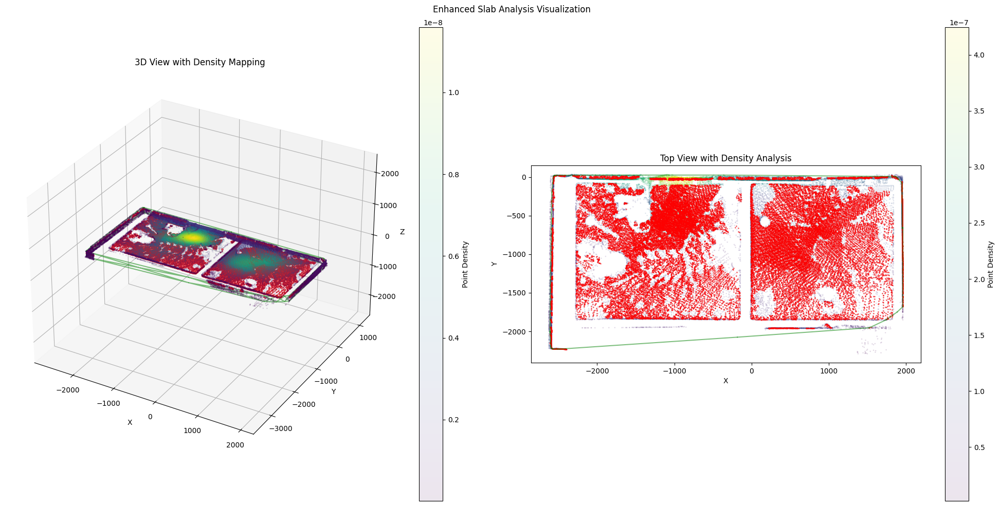


Enhanced Slab Analysis Results:
Total points processed: 65613
Surface points identified: 39490
Surface point density: 3.03 points/unit²
Slab thickness: 172.72 units
Slab area: 13024.15 square units
Slab volume: 2249574.10 cubic units
CPU times: total: 5min 14s
Wall time: 5min 14s


In [38]:
%%time
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import ConvexHull
from sklearn.cluster import DBSCAN
from scipy.stats import gaussian_kde
from scipy.ndimage import gaussian_filter
from sklearn.neighbors import LocalOutlierFactor

def set_axes_equal(ax):
    """Set 3D plot axes to equal scale."""
    x_limits = ax.get_xlim3d()
    y_limits = ax.get_ylim3d()
    z_limits = ax.get_zlim3d()
    
    x_range = abs(x_limits[1] - x_limits[0])
    x_middle = np.mean(x_limits)
    y_range = abs(y_limits[1] - y_limits[0])
    y_middle = np.mean(y_limits)
    z_range = abs(z_limits[1] - z_limits[0])
    z_middle = np.mean(z_limits)
    
    plot_radius = 0.5 * max([x_range, y_range, z_range])
    
    ax.set_xlim3d([x_middle - plot_radius, x_middle + plot_radius])
    ax.set_ylim3d([y_middle - plot_radius, y_middle + plot_radius])
    ax.set_zlim3d([z_middle - plot_radius, z_middle + plot_radius])

def extract_slab_surface(points, z_percentile_low=95, z_percentile_high=99.9):
    """
    Enhanced slab surface extraction using density-based clustering and outlier detection.
    """
    # Use slab scalar values with robust statistics
    slab_scalar_mask = ~np.isnan(points[:, 15])
    slab_points = points[slab_scalar_mask]
    
    if len(slab_points) == 0:
        raise ValueError("No slab points found using scalar values")
    
    # Improved height-based filtering using kernel density estimation
    valid_z = slab_points[:, 2]
    kde = gaussian_kde(valid_z)
    z_grid = np.linspace(np.min(valid_z), np.max(valid_z), 100)
    z_density = kde(z_grid)
    
    # Find major peaks in density
    smoothed_density = gaussian_filter(z_density, sigma=2)
    peak_indices = np.where((smoothed_density[1:-1] > smoothed_density[:-2]) & 
                          (smoothed_density[1:-1] > smoothed_density[2:]))[0] + 1
    
    if len(peak_indices) > 0:
        main_peak_z = z_grid[peak_indices[np.argmax(smoothed_density[peak_indices])]]
        # Adjust percentiles based on density distribution
        z_range = np.max(valid_z) - np.min(valid_z)
        adaptive_window = 0.1 * z_range
        z_low = main_peak_z - adaptive_window
        z_high = main_peak_z + adaptive_window
    else:
        # Fallback to percentile-based filtering
        z_low = np.percentile(valid_z, z_percentile_low)
        z_high = np.percentile(valid_z, z_percentile_high)
    
    height_mask = (valid_z >= z_low) & (valid_z <= z_high)
    
    # DBSCAN clustering to remove noise
    potential_surface = slab_points[height_mask]
    if len(potential_surface) > 0:
        # Estimate DBSCAN parameters from point density
        points_tree = potential_surface[:, :3]
        distances = np.linalg.norm(points_tree - points_tree.mean(axis=0), axis=1)
        eps = np.percentile(distances, 90) * 0.1
        
        clustering = DBSCAN(eps=eps, min_samples=5).fit(points_tree)
        cluster_mask = clustering.labels_ != -1
        
        # Local Outlier Factor for additional noise removal
        lof = LocalOutlierFactor(n_neighbors=20, contamination=0.1)
        outlier_mask = lof.fit_predict(points_tree) != -1
        
        # Combine filters
        final_mask = cluster_mask & outlier_mask
        surface_points = potential_surface[final_mask]
    else:
        surface_points = potential_surface
    
    return surface_points

def create_slab_mesh(slab_points, all_points):
    """
    Enhanced mesh creation with robust boundary detection and statistical refinement.
    ONLY THICKNESS CALCULATION OPTIMIZED - everything else unchanged.
    """
    points_2d = slab_points[:, :2]
    
    try:
        # Robust convex hull with alpha shape approximation
        hull = ConvexHull(points_2d)
        hull_points = points_2d[hull.vertices]
        
        # Refine boundary using local point density
        refined_vertices = []
        for i in range(len(hull_points)):
            p1 = hull_points[i]
            p2 = hull_points[(i + 1) % len(hull_points)]
            
            # Find points near the boundary
            direction = p2 - p1
            distance = np.linalg.norm(direction)
            direction = direction / distance
            normal = np.array([-direction[1], direction[0]])
            
            # Check points near the edge
            margin = distance * 0.1
            mask = np.abs(np.dot(points_2d - p1, normal)) < margin
            if np.sum(mask) > 10:
                edge_points = points_2d[mask]
                # Project points to edge line
                projected = p1 + np.dot(edge_points - p1, direction)[:, None] * direction
                refined_vertices.append(np.mean(projected, axis=0))
            else:
                refined_vertices.append(p1)
        
        slab_vertices_2d = np.array(refined_vertices)
        
        # ACCURATE thickness calculation using ALL slab points (not filtered ones)
        
        # Get ALL slab points before any filtering for accurate thickness
        slab_mask = ~np.isnan(all_points[:, 15])
        all_slab_points = all_points[slab_mask]
        
        # Use true maximum and minimum from ALL slab points
        z_top = np.max(all_slab_points[:, 2])     # TRUE maximum from all slab points
        z_bottom = np.percentile(all_slab_points[:, 2], 5)  # 5th percentile from all slab points
        
        print(f"Using accurate max method on ALL slab points: z_top={z_top:.2f}, z_bottom={z_bottom:.2f}")
        print(f"Total slab points used for thickness: {len(all_slab_points)}")
        print(f"Filtered surface points for mesh: {len(slab_points)}")
        
        calculated_thickness = z_top - z_bottom
        print(f"Calculated slab thickness: {calculated_thickness:.2f} units")
        
        # Create refined mesh vertices
        slab_vertices_top = np.column_stack((slab_vertices_2d, np.full(len(slab_vertices_2d), z_top)))
        slab_vertices_bottom = np.column_stack((slab_vertices_2d, np.full(len(slab_vertices_2d), z_bottom)))
        slab_vertices = np.vstack((slab_vertices_top, slab_vertices_bottom))
        
        # Calculate statistics with uncertainty estimates
        area = ConvexHull(slab_vertices_2d).area
        volume = area * calculated_thickness
        
        # Estimate uncertainties
        point_density = len(slab_points) / area
        uncertainty_factor = 1 / np.sqrt(point_density)
        area_uncertainty = area * uncertainty_factor
        volume_uncertainty = volume * uncertainty_factor
        
        print(f"Estimated slab area: {area:.2f} ± {area_uncertainty:.2f} square units")
        print(f"Estimated slab volume: {volume:.2f} ± {volume_uncertainty:.2f} cubic units")
        
        return slab_vertices, calculated_thickness, area, volume
        
    except Exception as e:
        print(f"Error creating slab mesh: {str(e)}")
        return None, None, None, None

def visualize_slab(original_points, slab_points, slab_mesh):
    """
    Enhanced visualization with additional analysis views.
    """
    # Create multiple views with enhanced layout
    fig = plt.figure(figsize=(20, 10))
    
    # 3D view with improved visibility
    ax1 = fig.add_subplot(121, projection='3d')
    
    # Plot with density-based coloring
    density = gaussian_kde(original_points[:, :3].T)
    colors = density(original_points[:, :3].T)
    
    scatter1 = ax1.scatter(original_points[:, 0], original_points[:, 1], original_points[:, 2],
                          c=colors, cmap='viridis', s=1, alpha=0.1)
    ax1.scatter(slab_points[:, 0], slab_points[:, 1], slab_points[:, 2],
                c='red', s=1, alpha=0.5)
    
    # Enhanced mesh visualization
    n = len(slab_mesh) // 2
    for i in range(n):
        ax1.plot3D(slab_mesh[[i, (i+1)%n, n+i, n+(i+1)%n, i], 0],
                  slab_mesh[[i, (i+1)%n, n+i, n+(i+1)%n, i], 1],
                  slab_mesh[[i, (i+1)%n, n+i, n+(i+1)%n, i], 2],
                  'g-', alpha=0.5)
    
    plt.colorbar(scatter1, ax=ax1, label='Point Density')
    ax1.set_xlabel('X')
    ax1.set_ylabel('Y')
    ax1.set_zlabel('Z')
    ax1.set_title('3D View with Density Mapping')
    
    set_axes_equal(ax1)
    
    # Top view with enhanced analysis
    ax2 = fig.add_subplot(122)
    density_2d = gaussian_kde(original_points[:, :2].T)
    colors_2d = density_2d(original_points[:, :2].T)
    
    scatter2 = ax2.scatter(original_points[:, 0], original_points[:, 1],
                          c=colors_2d, cmap='viridis', s=1, alpha=0.1)
    ax2.scatter(slab_points[:, 0], slab_points[:, 1],
                c='red', s=1, alpha=0.5)
    
    # Plot refined mesh boundary
    for i in range(n):
        ax2.plot(slab_mesh[[i, (i+1)%n], 0],
                slab_mesh[[i, (i+1)%n], 1],
                'g-', alpha=0.5)
    
    plt.colorbar(scatter2, ax=ax2, label='Point Density')
    ax2.set_xlabel('X')
    ax2.set_ylabel('Y')
    ax2.set_title('Top View with Density Analysis')
    ax2.set_aspect('equal')
    
    plt.suptitle('Enhanced Slab Analysis Visualization')
    plt.tight_layout()
    plt.show()

def analyze_slab(points):
    """Main function with enhanced error handling and analysis."""
    print("Starting enhanced slab analysis...")
    
    try:
        # Extract surface points with improved accuracy
        slab_surface_points = extract_slab_surface(points)
        print(f"Successfully extracted {len(slab_surface_points)} slab surface points")
        
        # Create refined mesh
        slab_mesh, thickness, area, volume = create_slab_mesh(slab_surface_points, points)
        
        if slab_mesh is not None:
            # Enhanced visualization
            visualize_slab(points, slab_surface_points, slab_mesh)
            
            # Detailed analysis results
            print("\nEnhanced Slab Analysis Results:")
            print(f"Total points processed: {len(points)}")
            print(f"Surface points identified: {len(slab_surface_points)}")
            print(f"Surface point density: {len(slab_surface_points)/area:.2f} points/unit²")
            print(f"Slab thickness: {thickness:.2f} units")
            print(f"Slab area: {area:.2f} square units")
            print(f"Slab volume: {volume:.2f} cubic units")
            
            return slab_surface_points, slab_mesh, thickness, area, volume
            
    except Exception as e:
        print(f"Error in enhanced slab analysis: {str(e)}")
        return None, None, None, None, None

slab_surface_points, slab_mesh, thickness, area, volume = analyze_slab(slab_points)

# Create AC-ledge


AC Ledge Analysis Summary:
Estimated thickness: 140.39 units
Highest point: (-2221.99, -2319.70, 43.64)
Lowest point: (-1290.18, -2953.37, -96.73)
Height range: -124.23 to 53.55 units
Mean height: 16.11 units
Median height: 26.11 units
Height standard deviation: 29.24 units
Total valid points: 25912
Total inlier points: 25392
Estimated area: 6957.58 square units


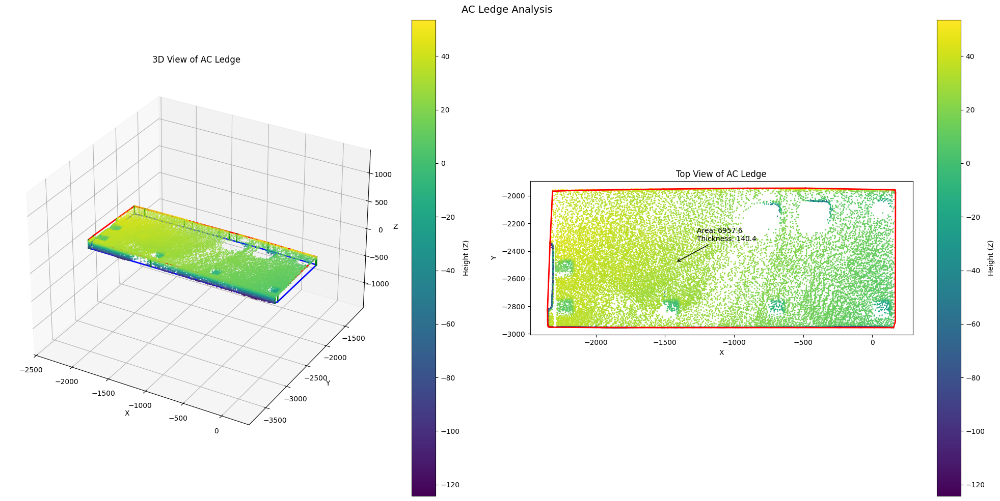

CPU times: total: 1.09 s
Wall time: 1.1 s


In [21]:
%%time
import numpy as np
from scipy.spatial import ConvexHull
import matplotlib.pyplot as plt

def filter_nan_points(points):
    """Remove points with NaN values from coordinates."""
    return points[~np.isnan(points[:, :3]).any(axis=1)]

def extract_ac_ledge_points(points, min_points=10):
    """
    Extract AC ledge points using scalar_AC_Ledge (column 6).
    
    Args:
        points: numpy array of point cloud data
        min_points: minimum number of points required
    """
    # Use scalar_AC_Ledge (column 6) to identify AC ledge points
    ac_ledge_mask = ~np.isnan(points[:, 6])
    ac_ledge_points = points[ac_ledge_mask]
    
    if len(ac_ledge_points) < min_points:
        print(f"Warning: Not enough AC ledge points. Found {len(ac_ledge_points)}, need at least {min_points}.")
        return None
        
    return ac_ledge_points

def estimate_ac_ledge_thickness(points, min_points=10, outlier_percentile=1):
    """
    Estimate thickness of the AC ledge based on the z-range after outlier removal.
    """
    # Extract AC ledge points
    ac_points = extract_ac_ledge_points(points, min_points)
    if ac_points is None:
        return None, None
        
    # Filter out NaN values from coordinates
    filtered_points = filter_nan_points(ac_points)
    
    if len(filtered_points) < min_points:
        print(f"Warning: Not enough valid points after NaN filtering. Found {len(filtered_points)}, need at least {min_points}.")
        return None, None
    
    # Extract z coordinates
    z = filtered_points[:, 2]
    
    # Remove outliers
    z_low = np.percentile(z, outlier_percentile)
    z_high = np.percentile(z, 100 - outlier_percentile)
    inlier_mask = (z >= z_low) & (z <= z_high)
    inlier_points = filtered_points[inlier_mask]
    
    if len(inlier_points) < min_points:
        print(f"Warning: Not enough inlier points after outlier removal. Found {len(inlier_points)}, need at least {min_points}.")
        return None, None
    
    # Estimate thickness
    estimated_thickness = z_high - z_low
    
    # Find highest and lowest points
    highest_point = inlier_points[np.argmax(inlier_points[:, 2])]
    lowest_point = inlier_points[np.argmin(inlier_points[:, 2])]
    
    try:
        # Compute the convex hull of the top surface
        hull = ConvexHull(inlier_points[:, :2])
        area = hull.area
        vertices = inlier_points[hull.vertices]
    except Exception as e:
        print(f"Warning: Could not compute convex hull - {str(e)}")
        area = None
        vertices = None
    
    # Calculate summary statistics
    summary = {
        'min_height': np.min(z),
        'max_height': np.max(z),
        'mean_height': np.mean(z),
        'median_height': np.median(z),
        'std_height': np.std(z),
        'total_valid_points': len(filtered_points),
        'total_inlier_points': len(inlier_points),
        'highest_point': highest_point,
        'lowest_point': lowest_point,
        'z_range_after_outlier_removal': estimated_thickness,
        'estimated_area': area,
        'vertices': vertices,
        'z_range': (z_low, z_high)
    }
    
    return estimated_thickness, summary

def visualize_ac_ledge(points, estimated_thickness, summary):
    """
    Visualize the AC ledge points and estimated thickness with equal axes.
    """
    fig = plt.figure(figsize=(20, 10))
    
    # 3D view
    ax1 = fig.add_subplot(121, projection='3d')
    
    # Plot points
    scatter = ax1.scatter(points[:, 0], points[:, 1], points[:, 2],
                         c=points[:, 2], cmap='viridis', s=1)
    
    # Plot boundary if vertices available
    if summary['vertices'] is not None:
        vertices = summary['vertices']
        z_top = summary['z_range'][1]
        z_bottom = summary['z_range'][0]
        
        # Plot top and bottom outlines
        for i in range(len(vertices)):
            j = (i + 1) % len(vertices)
            # Top edge
            ax1.plot3D([vertices[i, 0], vertices[j, 0]],
                      [vertices[i, 1], vertices[j, 1]],
                      [z_top, z_top], 'r-', linewidth=2)
            # Bottom edge
            ax1.plot3D([vertices[i, 0], vertices[j, 0]],
                      [vertices[i, 1], vertices[j, 1]],
                      [z_bottom, z_bottom], 'b-', linewidth=2)
            # Vertical edge
            ax1.plot3D([vertices[i, 0], vertices[i, 0]],
                      [vertices[i, 1], vertices[i, 1]],
                      [z_bottom, z_top], 'g-', linewidth=2)
    
    ax1.set_xlabel('X')
    ax1.set_ylabel('Y')
    ax1.set_zlabel('Z')
    ax1.set_title('3D View of AC Ledge')
    fig.colorbar(scatter, ax=ax1, label='Height (Z)')
    
    # Set equal axes
    x_limits = ax1.get_xlim3d()
    y_limits = ax1.get_ylim3d()
    z_limits = ax1.get_zlim3d()
    x_range = abs(x_limits[1] - x_limits[0])
    y_range = abs(y_limits[1] - y_limits[0])
    z_range = abs(z_limits[1] - z_limits[0])
    max_range = max(x_range, y_range, z_range)
    
    x_mid = np.mean(x_limits)
    y_mid = np.mean(y_limits)
    z_mid = np.mean(z_limits)
    
    ax1.set_xlim3d([x_mid - max_range/2, x_mid + max_range/2])
    ax1.set_ylim3d([y_mid - max_range/2, y_mid + max_range/2])
    ax1.set_zlim3d([z_mid - max_range/2, z_mid + max_range/2])
    
    # Top view
    ax2 = fig.add_subplot(122)
    scatter_2d = ax2.scatter(points[:, 0], points[:, 1],
                           c=points[:, 2], cmap='viridis', s=1)
    
    # Plot convex hull in top view
    if summary['vertices'] is not None:
        vertices = summary['vertices']
        for i in range(len(vertices)):
            j = (i + 1) % len(vertices)
            ax2.plot([vertices[i, 0], vertices[j, 0]],
                    [vertices[i, 1], vertices[j, 1]], 'r-', linewidth=2)
        
        # Add dimensions
        center = np.mean(vertices[:, :2], axis=0)
        ax2.annotate(f"Area: {summary['estimated_area']:.1f}\nThickness: {estimated_thickness:.1f}",
                    xy=(center[0], center[1]),
                    xytext=(30, 30),
                    textcoords='offset points',
                    arrowprops=dict(arrowstyle='->'))
    
    ax2.set_xlabel('X')
    ax2.set_ylabel('Y')
    ax2.set_title('Top View of AC Ledge')
    ax2.set_aspect('equal')
    fig.colorbar(scatter_2d, ax=ax2, label='Height (Z)')
    
    plt.suptitle('AC Ledge Analysis', fontsize=14)
    plt.tight_layout()
    plt.show()

def print_ac_ledge_summary(thickness, summary):
    """Print comprehensive summary of AC ledge analysis."""
    if thickness is None or summary is None:
        print("\nAC Ledge Analysis Failed")
        return
    
    print("\nAC Ledge Analysis Summary:")
    print(f"Estimated thickness: {thickness:.2f} units")
    print(f"Highest point: ({summary['highest_point'][0]:.2f}, {summary['highest_point'][1]:.2f}, {summary['highest_point'][2]:.2f})")
    print(f"Lowest point: ({summary['lowest_point'][0]:.2f}, {summary['lowest_point'][1]:.2f}, {summary['lowest_point'][2]:.2f})")
    print(f"Height range: {summary['min_height']:.2f} to {summary['max_height']:.2f} units")
    print(f"Mean height: {summary['mean_height']:.2f} units")
    print(f"Median height: {summary['median_height']:.2f} units")
    print(f"Height standard deviation: {summary['std_height']:.2f} units")
    print(f"Total valid points: {summary['total_valid_points']}")
    print(f"Total inlier points: {summary['total_inlier_points']}")
    if summary['estimated_area'] is not None:
        print(f"Estimated area: {summary['estimated_area']:.2f} square units")

# Run the analysis
thickness, summary = estimate_ac_ledge_thickness(ac_ledge_points)
if thickness is not None:
    print_ac_ledge_summary(thickness, summary)
    visualize_ac_ledge(ac_ledge_points[~np.isnan(ac_ledge_points[:, 6])][:, :3], thickness, summary)


AC Ledge Analysis Summary:
Estimated thickness: 140.39 units
Highest point: (-2221.99, -2319.70, 43.64)
Lowest point: (-1290.18, -2953.37, -96.73)
Height range: -124.23 to 53.55 units
Mean height: 16.11 units
Median height: 26.11 units
Height standard deviation: 29.24 units
Total valid points: 25912
Total inlier points: 25392
Estimated area: 6957.58 square units


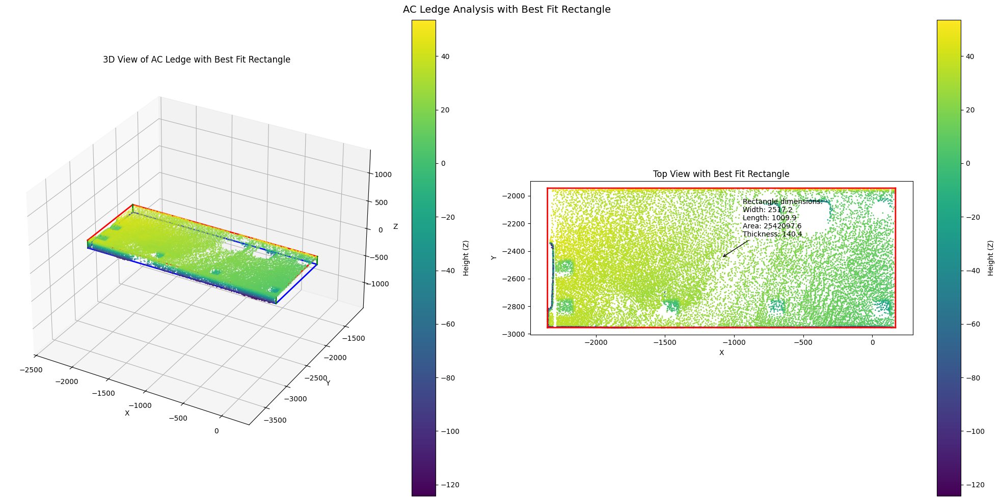


Best Fit Rectangle Analysis:
Width: 2517.15 units
Length: 1009.91 units
Area: 2542097.56 square units
Thickness: 140.39 units
Volume: 356892461.18 cubic units
Rotation angle: 0.00 degrees
CPU times: total: 1.05 s
Wall time: 1.03 s


In [22]:
%%time
def find_best_fit_rectangle(points):
    """
    Find the minimum area rectangle that contains all points.
    Returns rectangle vertices and dimensions.
    """
    # Get 2D points for rectangle fitting
    points_2d = points[:, :2]
    
    # Get convex hull
    hull = ConvexHull(points_2d)
    hull_points = points_2d[hull.vertices]
    
    # Function to compute rectangle area for a given angle
    def get_rectangle_area(angle):
        # Rotate points
        rotation_matrix = np.array([
            [np.cos(angle), -np.sin(angle)],
            [np.sin(angle), np.cos(angle)]
        ])
        rotated_points = np.dot(hull_points, rotation_matrix)
        
        # Get min/max for rotated points
        min_x, max_x = np.min(rotated_points[:, 0]), np.max(rotated_points[:, 0])
        min_y, max_y = np.min(rotated_points[:, 1]), np.max(rotated_points[:, 1])
        
        return (max_x - min_x) * (max_y - min_y)

    # Find best angle by checking hull edges
    best_angle = 0
    min_area = float('inf')
    best_rect = None
    
    # Check angles from hull edges
    for i in range(len(hull_points)):
        edge = hull_points[(i + 1) % len(hull_points)] - hull_points[i]
        angle = np.arctan2(edge[1], edge[0])
        
        # Rotate points
        rotation_matrix = np.array([
            [np.cos(angle), -np.sin(angle)],
            [np.sin(angle), np.cos(angle)]
        ])
        rotated_points = np.dot(hull_points, rotation_matrix)
        
        # Get bounding box
        min_x, max_x = np.min(rotated_points[:, 0]), np.max(rotated_points[:, 0])
        min_y, max_y = np.min(rotated_points[:, 1]), np.max(rotated_points[:, 1])
        area = (max_x - min_x) * (max_y - min_y)
        
        if area < min_area:
            min_area = area
            best_angle = angle
            
            # Calculate rectangle vertices
            corners = np.array([
                [min_x, min_y],
                [max_x, min_y],
                [max_x, max_y],
                [min_x, max_y]
            ])
            
            # Rotate back
            rotation_matrix_inv = np.array([
                [np.cos(-angle), -np.sin(-angle)],
                [np.sin(-angle), np.cos(-angle)]
            ])
            best_rect = np.dot(corners, rotation_matrix_inv)
    
    # Calculate dimensions
    width = np.linalg.norm(best_rect[1] - best_rect[0])
    height = np.linalg.norm(best_rect[3] - best_rect[0])
    
    return best_rect, width, height, best_angle

def visualize_ac_ledge_with_rectangle(points, estimated_thickness, summary):
    """
    Enhanced visualization including the best fit rectangle.
    """
    # Find best fit rectangle
    best_rect, width, height, angle = find_best_fit_rectangle(points)
    
    fig = plt.figure(figsize=(20, 10))
    
    # 3D view
    ax1 = fig.add_subplot(121, projection='3d')
    
    # Plot points
    scatter = ax1.scatter(points[:, 0], points[:, 1], points[:, 2],
                         c=points[:, 2], cmap='viridis', s=1)
    
    # Plot rectangle at top and bottom
    z_top = summary['z_range'][1]
    z_bottom = summary['z_range'][0]
    
    for i in range(len(best_rect)):
        j = (i + 1) % len(best_rect)
        # Top edge
        ax1.plot3D([best_rect[i, 0], best_rect[j, 0]],
                  [best_rect[i, 1], best_rect[j, 1]],
                  [z_top, z_top], 'r-', linewidth=2)
        # Bottom edge
        ax1.plot3D([best_rect[i, 0], best_rect[j, 0]],
                  [best_rect[i, 1], best_rect[j, 1]],
                  [z_bottom, z_bottom], 'b-', linewidth=2)
        # Vertical edges
        ax1.plot3D([best_rect[i, 0], best_rect[i, 0]],
                  [best_rect[i, 1], best_rect[i, 1]],
                  [z_bottom, z_top], 'g-', linewidth=2)
    
    ax1.set_xlabel('X')
    ax1.set_ylabel('Y')
    ax1.set_zlabel('Z')
    ax1.set_title('3D View of AC Ledge with Best Fit Rectangle')
    fig.colorbar(scatter, ax=ax1, label='Height (Z)')
    
    # Set equal axes
    x_limits = ax1.get_xlim3d()
    y_limits = ax1.get_ylim3d()
    z_limits = ax1.get_zlim3d()
    max_range = max(abs(x_limits[1] - x_limits[0]),
                   abs(y_limits[1] - y_limits[0]),
                   abs(z_limits[1] - z_limits[0]))
    
    x_mid = np.mean(x_limits)
    y_mid = np.mean(y_limits)
    z_mid = np.mean(z_limits)
    
    ax1.set_xlim3d([x_mid - max_range/2, x_mid + max_range/2])
    ax1.set_ylim3d([y_mid - max_range/2, y_mid + max_range/2])
    ax1.set_zlim3d([z_mid - max_range/2, z_mid + max_range/2])
    
    # Top view
    ax2 = fig.add_subplot(122)
    scatter_2d = ax2.scatter(points[:, 0], points[:, 1],
                           c=points[:, 2], cmap='viridis', s=1)
    
    # Plot best fit rectangle
    for i in range(len(best_rect)):
        j = (i + 1) % len(best_rect)
        ax2.plot([best_rect[i, 0], best_rect[j, 0]],
                [best_rect[i, 1], best_rect[j, 1]], 'r-', linewidth=2)
    
    # Add dimensions
    center = np.mean(best_rect, axis=0)
    ax2.annotate(
        f"Rectangle dimensions:\nWidth: {width:.1f}\nLength: {height:.1f}\n"
        f"Area: {width * height:.1f}\nThickness: {estimated_thickness:.1f}",
        xy=(center[0], center[1]),
        xytext=(30, 30),
        textcoords='offset points',
        arrowprops=dict(arrowstyle='->')
    )
    
    ax2.set_xlabel('X')
    ax2.set_ylabel('Y')
    ax2.set_title('Top View with Best Fit Rectangle')
    ax2.set_aspect('equal')
    fig.colorbar(scatter_2d, ax=ax2, label='Height (Z)')
    
    plt.suptitle('AC Ledge Analysis with Best Fit Rectangle', fontsize=14)
    plt.tight_layout()
    plt.show()

# Run the enhanced analysis
valid_points = ac_ledge_points[~np.isnan(ac_ledge_points[:, 6])][:, :3]
thickness, summary = estimate_ac_ledge_thickness(ac_ledge_points)
if thickness is not None:
    print_ac_ledge_summary(thickness, summary)
    visualize_ac_ledge_with_rectangle(valid_points, thickness, summary)
    
    # Print rectangle dimensions
    best_rect, width, length, angle = find_best_fit_rectangle(valid_points)
    print("\nBest Fit Rectangle Analysis:")
    print(f"Width: {width:.2f} units")
    print(f"Length: {length:.2f} units")
    print(f"Area: {width * length:.2f} square units")
    print(f"Thickness: {thickness:.2f} units")
    print(f"Volume: {width * length * thickness:.2f} cubic units")
    print(f"Rotation angle: {np.degrees(angle):.2f} degrees")

In [23]:
%%time
ac_ledge_thickness = float(thickness)  # Ensure it's a float

CPU times: total: 0 ns
Wall time: 0 ns


# Wall Point Cloud Clustering

All points investigation:
Number of points: 455551
Data shape: (455551, 16)

Coordinate ranges:
X: -2627.911 to 1957.465 millimeters
Y: -2954.532 to 33.589 millimeters
Z: -154.440 to 2510.979 millimeters

Geometric height: 2657.373 millimeters
Vertical direction: [-0.008, -0.228, 0.974]

Point density: 0.00 points/m³

Color statistics:
RGB value range: 5.00 to 239.00
Mean RGB values: [109.988 110.472 105.907]

Additional scalar fields statistics:
Column 6:
  Range: 100.00 to 100.00
  Mean: 100.00
  Unique values: 1
Column 7:
  Range: 0.00 to 10.00
  Mean: 1.39
  Unique values: 2
Column 8:
  Range: 10.00 to 10.00
  Mean: 10.00
  Unique values: 1
Column 9:
  Range: 20.00 to 20.00
  Mean: 20.00
  Unique values: 1
Column 10:
  Range: 0.00 to 1.00
  Mean: 0.71
  Unique values: 2
Column 11:
  Range: 60.00 to 60.00
  Mean: 60.00
  Unique values: 1
Column 12:
  Range: 30.00 to 30.00
  Mean: 30.00
  Unique values: 1
Column 13:
  Range: 40.00 to 40.00
  Mean: 40.00
  Unique values: 1
Column 14:


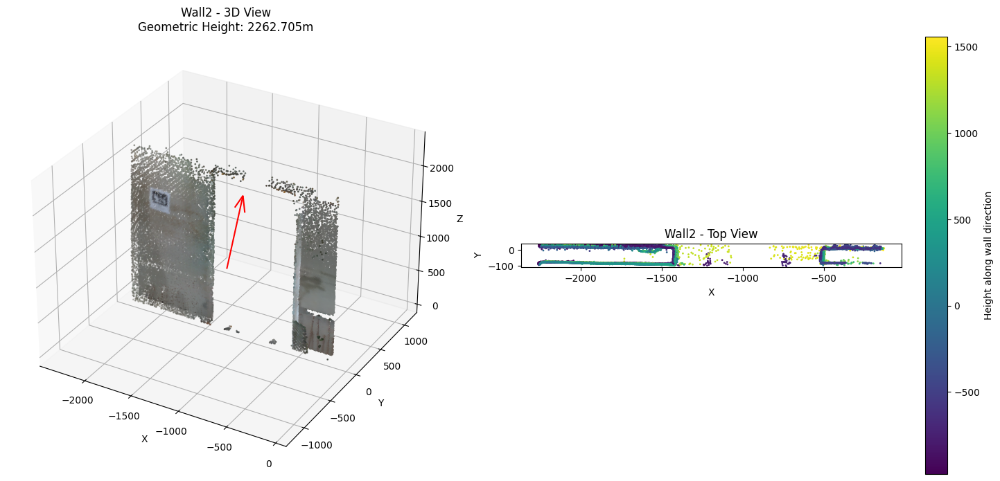


Analyzing Wall3:
Number of points: 62894
Number of points: 62894
Data shape: (62894, 16)

Coordinate ranges:
X: -172.117 to 33.403 millimeters
Y: -1834.898 to 26.924 millimeters
Z: 41.568 to 2510.979 millimeters

Geometric height: 2405.146 millimeters
Vertical direction: [-0.010, 0.144, 0.990]

Point density: 0.00 points/m³

Color statistics:
RGB value range: 35.00 to 239.00
Mean RGB values: [110.39  111.527 108.501]

Additional scalar fields statistics:
Column 6: All NaN values
Column 7:
  Range: 0.00 to 0.00
  Mean: 0.00
  Unique values: 1
Column 8: All NaN values
Column 9:
  Range: 20.00 to 20.00
  Mean: 20.00
  Unique values: 1
Column 10: All NaN values
Column 11: All NaN values
Column 12: All NaN values
Column 13: All NaN values
Column 14: All NaN values
Column 15: All NaN values

Wall3 Statistics:
  Dimensions (millimeters):
    Width (X): 205.521
    Geometric Height: 2405.146
    Depth (Z): 2469.410
  Center: (-45.634, -828.601, 1151.737)
  Vertical Direction: [-0.010, 0.144, 

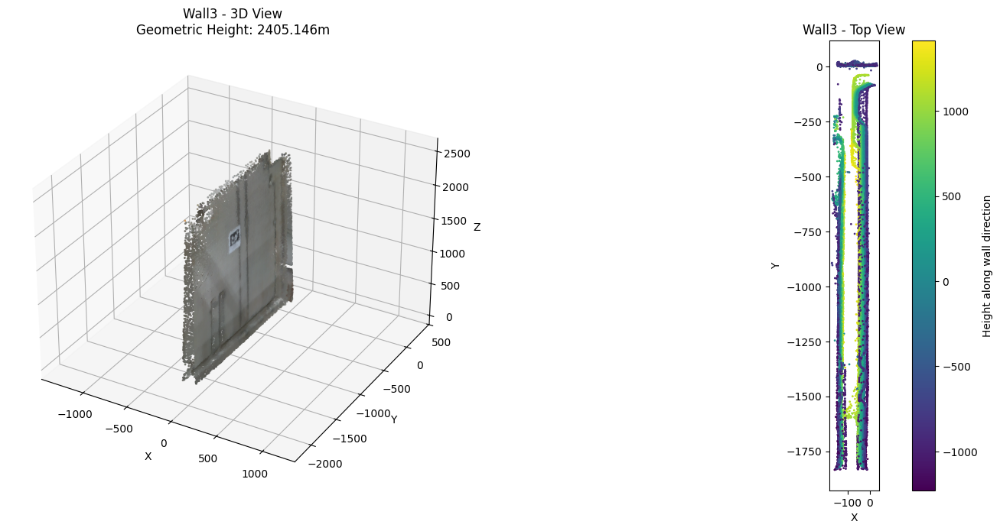


Analyzing Wall6:
Number of points: 99984
Number of points: 99984
Data shape: (99984, 16)

Coordinate ranges:
X: -2301.414 to 1830.949 millimeters
Y: -2079.337 to -1787.278 millimeters
Z: 52.388 to 2411.899 millimeters

Geometric height: 2413.871 millimeters
Vertical direction: [-0.134, 0.021, 0.991]

Point density: 0.00 points/m³

Color statistics:
RGB value range: 29.00 to 225.00
Mean RGB values: [93.845 92.566 85.735]

Additional scalar fields statistics:
Column 6: All NaN values
Column 7:
  Range: 0.00 to 0.00
  Mean: 0.00
  Unique values: 1
Column 8: All NaN values
Column 9: All NaN values
Column 10:
  Range: 1.00 to 1.00
  Mean: 1.00
  Unique values: 1
Column 11:
  Range: 60.00 to 60.00
  Mean: 60.00
  Unique values: 1
Column 12: All NaN values
Column 13: All NaN values
Column 14: All NaN values
Column 15: All NaN values

Wall6 Statistics:
  Dimensions (millimeters):
    Width (X): 4132.363
    Geometric Height: 2413.871
    Depth (Z): 2359.511
  Center: (-388.102, -1886.552, 796

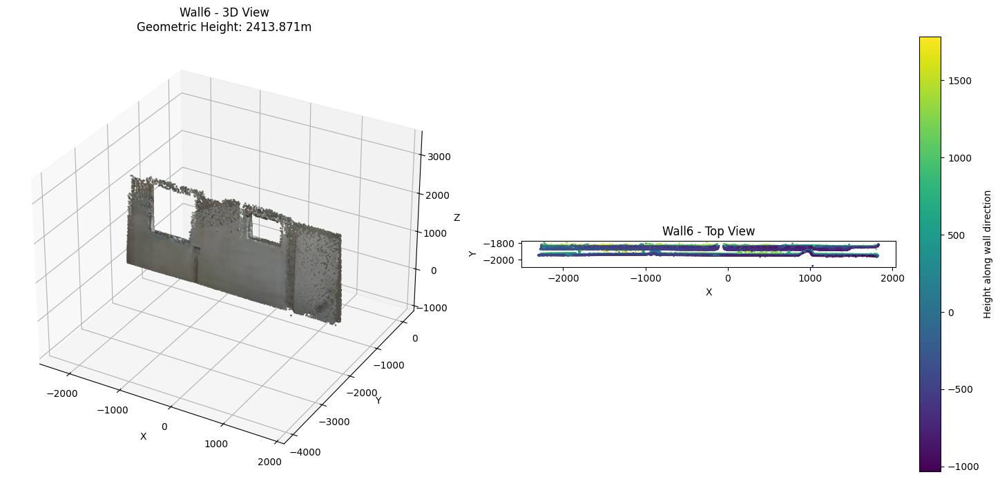


Analyzing Wall4:
Number of points: 32050
Number of points: 32050
Data shape: (32050, 16)

Coordinate ranges:
X: -5.708 to 1752.386 millimeters
Y: -129.584 to 32.777 millimeters
Z: 41.161 to 2294.032 millimeters

Geometric height: 2193.828 millimeters
Vertical direction: [-0.009, -0.025, 1.000]

Point density: 0.00 points/m³

Color statistics:
RGB value range: 32.00 to 194.00
Mean RGB values: [109.079 109.908 106.792]

Additional scalar fields statistics:
Column 6: All NaN values
Column 7:
  Range: 0.00 to 0.00
  Mean: 0.00
  Unique values: 1
Column 8: All NaN values
Column 9: All NaN values
Column 10: All NaN values
Column 11: All NaN values
Column 12:
  Range: 30.00 to 30.00
  Mean: 30.00
  Unique values: 1
Column 13: All NaN values
Column 14: All NaN values
Column 15: All NaN values

Wall4 Statistics:
  Dimensions (millimeters):
    Width (X): 1758.095
    Geometric Height: 2193.828
    Depth (Z): 2252.871
  Center: (398.852, -23.872, 942.852)
  Vertical Direction: [-0.009, -0.025, 

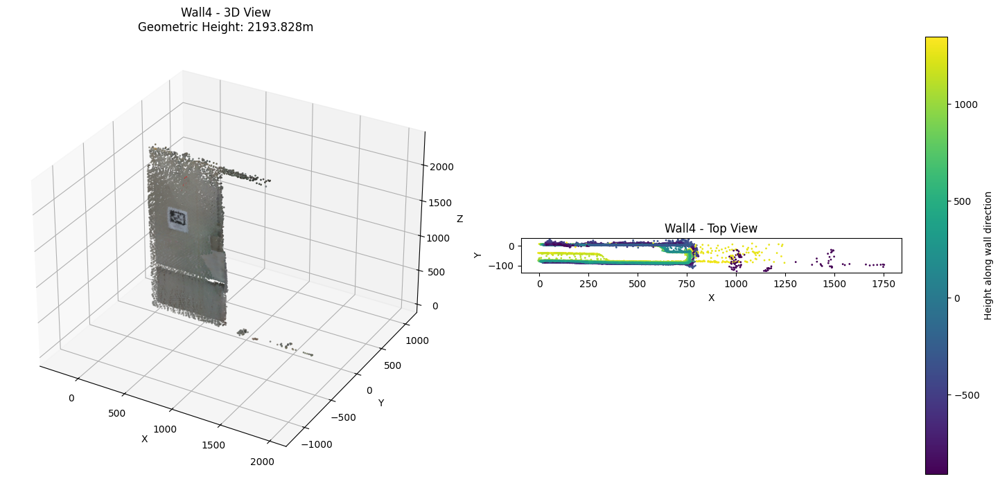


Analyzing Wall5:
Number of points: 49563
Number of points: 49563
Data shape: (49563, 16)

Coordinate ranges:
X: 1762.866 to 1957.465 millimeters
Y: -1965.190 to 31.035 millimeters
Z: 41.186 to 2510.721 millimeters

Geometric height: 2586.460 millimeters
Vertical direction: [-0.019, -0.440, 0.898]

Point density: 0.00 points/m³

Color statistics:
RGB value range: 44.00 to 217.00
Mean RGB values: [112.594 113.87  109.778]

Additional scalar fields statistics:
Column 6: All NaN values
Column 7:
  Range: 0.00 to 0.00
  Mean: 0.00
  Unique values: 1
Column 8: All NaN values
Column 9: All NaN values
Column 10:
  Range: 0.00 to 1.00
  Mean: 0.12
  Unique values: 2
Column 11: All NaN values
Column 12: All NaN values
Column 13:
  Range: 40.00 to 40.00
  Mean: 40.00
  Unique values: 1
Column 14: All NaN values
Column 15: All NaN values

Wall5 Statistics:
  Dimensions (millimeters):
    Width (X): 194.599
    Geometric Height: 2586.460
    Depth (Z): 2469.535
  Center: (1905.947, -703.375, 868.8

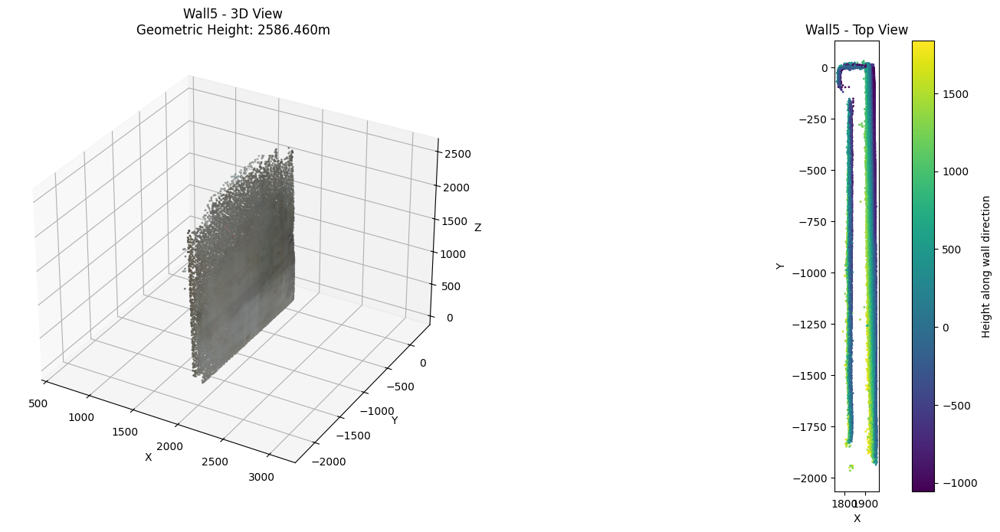


Analyzing Wall1:
Number of points: 79950
Number of points: 79950
Data shape: (79950, 16)

Coordinate ranges:
X: -2627.911 to -2240.763 millimeters
Y: -2237.141 to 33.586 millimeters
Z: 42.571 to 2443.991 millimeters

Geometric height: 2525.534 millimeters
Vertical direction: [0.057, -0.459, 0.887]

Point density: 0.00 points/m³

Color statistics:
RGB value range: 20.00 to 197.00
Mean RGB values: [116.563 119.976 117.259]

Additional scalar fields statistics:
Column 6: All NaN values
Column 7: All NaN values
Column 8: All NaN values
Column 9: All NaN values
Column 10: All NaN values
Column 11: All NaN values
Column 12: All NaN values
Column 13: All NaN values
Column 14:
  Range: 0.00 to 0.00
  Mean: 0.00
  Unique values: 1
Column 15: All NaN values

Wall1 Statistics:
  Dimensions (millimeters):
    Width (X): 387.148
    Geometric Height: 2525.534
    Depth (Z): 2401.420
  Center: (-2439.989, -1039.241, 927.426)
  Vertical Direction: [0.057, -0.459, 0.887]


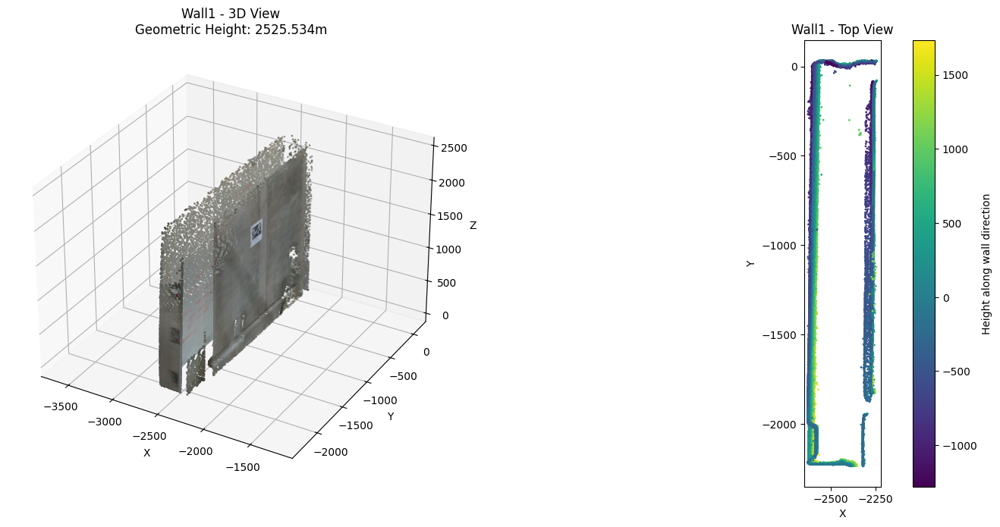


Overlap Analysis:
Total points in all wall entities: 364026
Unique points across all entities: 364026
Overlapping points: 0
Overlap percentage: 0.00%

Total wall points from combined mask: 364026
CPU times: total: 10.5 s
Wall time: 10.5 s


In [27]:
%%time
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

def extract_wall_height_geometric(points):
    """
    Extract wall height using PCA-based geometric method for points in millimeters
    
    Args:
        points: Nx3 array of point coordinates (x,y,z) in millimeters
    Returns:
        height: Estimated wall height in millimeters
        vertical_dir: Estimated vertical direction (unit vector)
    """
    # Center the points (keeping in millimeters)
    centered_points = points - np.mean(points, axis=0)
    
    # Perform PCA to find principal directions
    covariance_matrix = np.cov(centered_points.T)
    eigenvalues, eigenvectors = np.linalg.eigh(covariance_matrix)
    
    # Sort eigenvectors by eigenvalues in descending order
    idx = eigenvalues.argsort()[::-1]
    eigenvalues = eigenvalues[idx]
    eigenvectors = eigenvectors[:, idx]
    
    # The wall normal should be the direction with smallest variance
    wall_normal = eigenvectors[:, 2]
    
    # Find vertical direction (assuming it's closest to [0,0,1])
    vertical_dir = eigenvectors[:, np.argmax(np.abs(eigenvectors[2, :]))]
    if vertical_dir[2] < 0:  # Ensure vertical points upward
        vertical_dir = -vertical_dir
    
    # Project points onto vertical direction
    heights = np.dot(centered_points, vertical_dir)
    
    # Calculate height using robust percentiles (result in millimeters)
    wall_height = np.percentile(heights, 99.5) - np.percentile(heights, 0.5)
    
    return wall_height, vertical_dir

def investigate_wall_points(points):
    """Investigate and print statistics about wall points."""
    if len(points) == 0:
        print("No points to investigate")
        return
        
    try:
        # Basic point statistics
        print(f"Number of points: {len(points)}")
        print(f"Data shape: {points.shape}")
        
        # Calculate geometric height
        geometric_height, vertical_dir = extract_wall_height_geometric(points[:, :3])
        
        # Coordinate ranges
        coord_ranges = {
            'X': (np.min(points[:, 0]), np.max(points[:, 0])),
            'Y': (np.min(points[:, 1]), np.max(points[:, 1])),
            'Z': (np.min(points[:, 2]), np.max(points[:, 2]))
        }
        
        print("\nCoordinate ranges:")
        for coord, (min_val, max_val) in coord_ranges.items():
            print(f"{coord}: {min_val:.3f} to {max_val:.3f} millimeters")
        
        print(f"\nGeometric height: {geometric_height:.3f} millimeters")
        print(f"Vertical direction: [{vertical_dir[0]:.3f}, {vertical_dir[1]:.3f}, {vertical_dir[2]:.3f}]")
            
        # Point density statistics
        x_range = coord_ranges['X'][1] - coord_ranges['X'][0]
        y_range = coord_ranges['Y'][1] - coord_ranges['Y'][0]
        z_range = coord_ranges['Z'][1] - coord_ranges['Z'][0]
        volume = x_range * y_range * z_range
        density = len(points) / volume if volume > 0 else 0
        
        print(f"\nPoint density: {density:.2f} points/m³")
        
        # Color information if available (columns 3-5)
        if points.shape[1] > 5:
            rgb_vals = points[:, 3:6]
            print("\nColor statistics:")
            print(f"RGB value range: {np.min(rgb_vals):.2f} to {np.max(rgb_vals):.2f}")
            print("Mean RGB values:", np.mean(rgb_vals, axis=0))
            
        # Additional scalar fields if available (columns 6+)
        if points.shape[1] > 6:
            print("\nAdditional scalar fields statistics:")
            for i in range(6, points.shape[1]):
                non_nan_vals = points[:, i][~np.isnan(points[:, i])]
                if len(non_nan_vals) > 0:
                    print(f"Column {i}:")
                    print(f"  Range: {np.min(non_nan_vals):.2f} to {np.max(non_nan_vals):.2f}")
                    print(f"  Mean: {np.mean(non_nan_vals):.2f}")
                    print(f"  Unique values: {len(np.unique(non_nan_vals))}")
                else:
                    print(f"Column {i}: All NaN values")
                    
    except Exception as e:
        print(f"Error during investigation: {str(e)}")

def separate_wall_entities(filtered_pcd):
    """Separate wall points into different entities based on the scalar_Wall columns."""
    wall_masks = {
        'Wall2': filtered_pcd[:, 8] == 10,
        'Wall3': filtered_pcd[:, 9] == 20,
        'Wall6': filtered_pcd[:, 11] == 60,
        'Wall4': filtered_pcd[:, 12] == 30,
        'Wall5': filtered_pcd[:, 13] == 40,
        'Wall1': filtered_pcd[:, 14] == 0
    }
    
    # Handle NaN values in masks
    for wall_name, mask in wall_masks.items():
        nan_mask = np.isnan(filtered_pcd[:, {
            'Wall2': 8, 'Wall3': 9, 'Wall6': 11,
            'Wall4': 12, 'Wall5': 13, 'Wall1': 14
        }[wall_name]])
        wall_masks[wall_name] = mask & ~nan_mask

    wall_entities = {
        wall_name: filtered_pcd[mask] 
        for wall_name, mask in wall_masks.items()
    }
    
    all_wall_mask = np.any(list(wall_masks.values()), axis=0)
    
    return wall_entities, all_wall_mask

def visualize_wall_entity(points, title):
    """Visualize wall entity using matplotlib."""
    if len(points) == 0:
        print(f"No points to visualize for {title}")
        return
    
    try:
        # Calculate geometric height and vertical direction
        geometric_height, vertical_dir = extract_wall_height_geometric(points[:, :3])
        
        # Create figure with two subplots: 3D view and top view
        fig = plt.figure(figsize=(15, 7))
        
        # 3D view
        ax1 = fig.add_subplot(121, projection='3d')
        
        # Color points by height if no RGB values
        if points.shape[1] <= 5:
            # Project points onto vertical direction for coloring
            centered_points = points[:, :3] - np.mean(points[:, :3], axis=0)
            heights = np.dot(centered_points, vertical_dir)
            scatter = ax1.scatter(points[:, 0], points[:, 1], points[:, 2],
                                c=heights, cmap='viridis', s=1)
            plt.colorbar(scatter, ax=ax1, label='Height along wall direction')
        else:
            # Use RGB values if available
            colors = points[:, 3:6].copy()
            if np.max(colors) > 1:
                colors = colors / 255.0
            ax1.scatter(points[:, 0], points[:, 1], points[:, 2],
                       color=colors, s=1)
        
        # Add vertical direction arrow
        mean_point = np.mean(points[:, :3], axis=0)
        arrow_length = geometric_height / 2
        ax1.quiver(mean_point[0], mean_point[1], mean_point[2],
                  vertical_dir[0] * arrow_length,
                  vertical_dir[1] * arrow_length,
                  vertical_dir[2] * arrow_length,
                  color='red', arrow_length_ratio=0.2)
        
        ax1.set_title(f'{title} - 3D View\nGeometric Height: {geometric_height:.3f}m')
        ax1.set_xlabel('X')
        ax1.set_ylabel('Y')
        ax1.set_zlabel('Z')
        
        # Set equal aspect ratio for 3D plot
        x_limits = ax1.get_xlim3d()
        y_limits = ax1.get_ylim3d()
        z_limits = ax1.get_zlim3d()
        max_range = max([x_limits[1]-x_limits[0],
                        y_limits[1]-y_limits[0],
                        z_limits[1]-z_limits[0]])
        mid_x = np.mean(x_limits)
        mid_y = np.mean(y_limits)
        mid_z = np.mean(z_limits)
        ax1.set_xlim(mid_x - max_range/2, mid_x + max_range/2)
        ax1.set_ylim(mid_y - max_range/2, mid_y + max_range/2)
        ax1.set_zlim(mid_z - max_range/2, mid_z + max_range/2)
        
        # Top view (2D)
        ax2 = fig.add_subplot(122)
        heights = np.dot(points[:, :3] - np.mean(points[:, :3], axis=0), vertical_dir)
        scatter2d = ax2.scatter(points[:, 0], points[:, 1], c=heights,
                              cmap='viridis', s=1)
        plt.colorbar(scatter2d, ax=ax2, label='Height along wall direction')
        ax2.set_title(f'{title} - Top View')
        ax2.set_xlabel('X')
        ax2.set_ylabel('Y')
        ax2.set_aspect('equal')
        
        plt.tight_layout()
        plt.show()
        
    except Exception as e:
        print(f"Visualization error for {title}: {str(e)}")

def analyze_walls(filtered_pcd):
    """Complete wall analysis pipeline."""
    # Initial investigation
    print("All points investigation:")
    investigate_wall_points(filtered_pcd)

    # Separate wall entities
    wall_entities, all_wall_mask = separate_wall_entities(filtered_pcd)

    # Investigate each wall entity
    print("\nWall entities investigation:")
    for wall_name, wall_data in wall_entities.items():
        if len(wall_data) == 0:
            print(f"\nSkipping {wall_name} - no points found")
            continue
            
        print(f"\nAnalyzing {wall_name}:")
        print(f"Number of points: {len(wall_data)}")
        
        # Investigate wall entity
        investigate_wall_points(wall_data)
        
        # Calculate geometric height and basic statistics
        geometric_height, vertical_dir = extract_wall_height_geometric(wall_data[:, :3])
        min_coords = np.min(wall_data[:, :3], axis=0)
        max_coords = np.max(wall_data[:, :3], axis=0)
        dimensions = max_coords - min_coords
        center = np.mean(wall_data[:, :3], axis=0)
        
        print(f"\n{wall_name} Statistics:")
        print(f"  Dimensions (millimeters):")
        print(f"    Width (X): {dimensions[0]:.3f}")
        print(f"    Geometric Height: {geometric_height:.3f}")
        print(f"    Depth (Z): {dimensions[2]:.3f}")
        print(f"  Center: ({center[0]:.3f}, {center[1]:.3f}, {center[2]:.3f})")
        print(f"  Vertical Direction: [{vertical_dir[0]:.3f}, {vertical_dir[1]:.3f}, {vertical_dir[2]:.3f}]")
        
        # Visualize wall entity
        visualize_wall_entity(wall_data, wall_name)

    # Overlap analysis
    wall_points_list = [points for points in wall_entities.values() if len(points) > 0]
    if wall_points_list:
        total_wall_points = sum(len(points) for points in wall_points_list)
        unique_wall_points = len(np.unique(np.vstack(wall_points_list), axis=0))
        
        print("\nOverlap Analysis:")
        print(f"Total points in all wall entities: {total_wall_points}")
        print(f"Unique points across all entities: {unique_wall_points}")
        print(f"Overlapping points: {total_wall_points - unique_wall_points}")
        print(f"Overlap percentage: {((total_wall_points - unique_wall_points) / total_wall_points * 100):.2f}%")
    
    print(f"\nTotal wall points from combined mask: {np.sum(all_wall_mask)}")
    
    return wall_entities, all_wall_mask

# Execute the analysis
if __name__ == "__main__":
    wall_entities, all_wall_mask = analyze_walls(filtered_pcd)


Processing Wall2
Number of points: 39585
Number of groups found: 4
Top 10 group sizes: [24774, 14753, 32, 26]


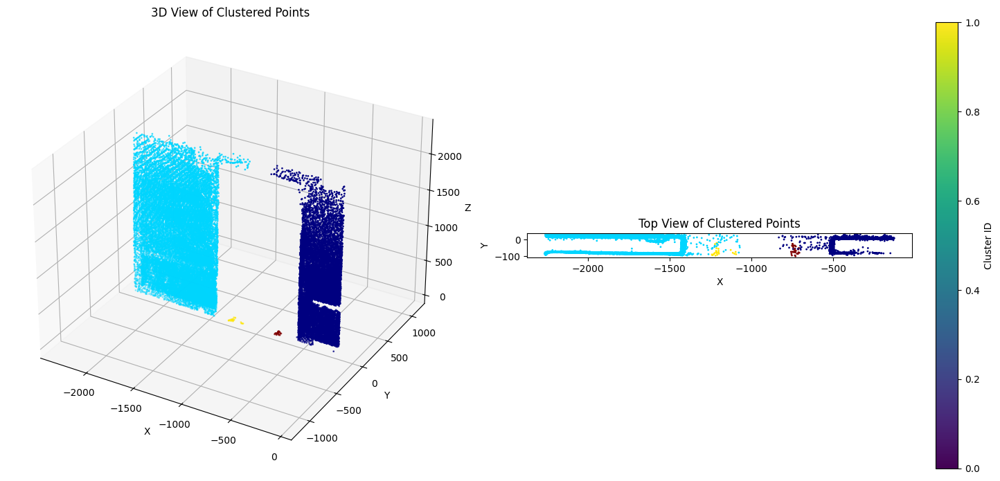


Processing Wall3
Number of points: 62894
Number of groups found: 2
Top 10 group sizes: [62877, 13]


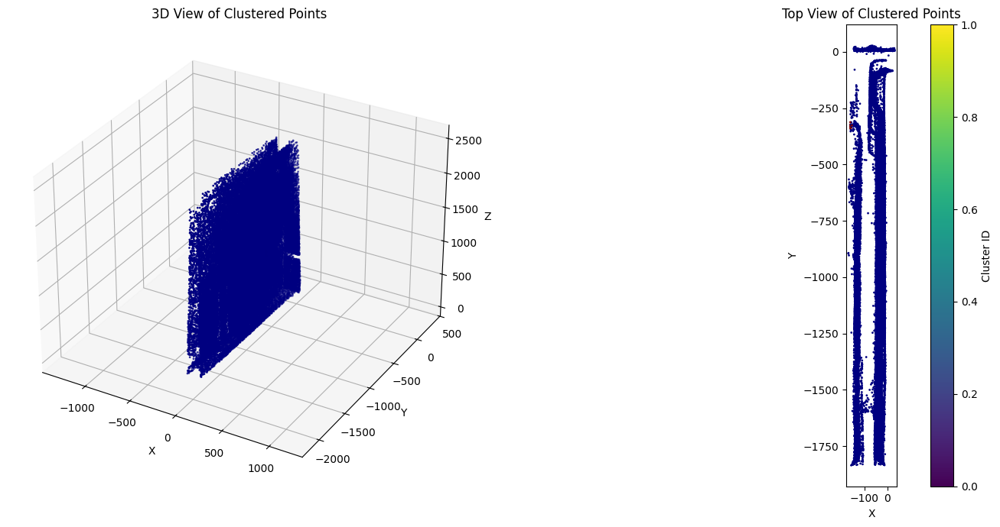


Processing Wall6
Number of points: 99984
Number of groups found: 1
Top 10 group sizes: [99983]


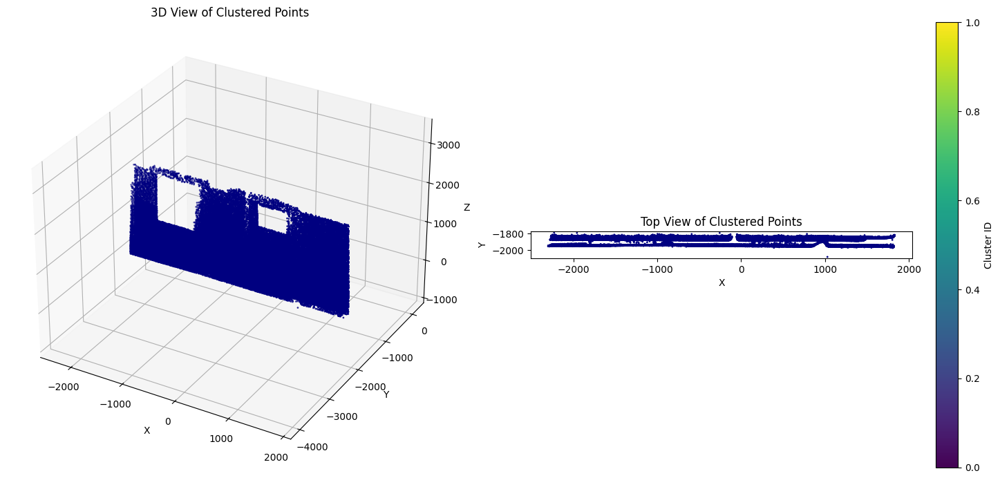


Processing Wall4
Number of points: 32050
Number of groups found: 4
Top 10 group sizes: [31955, 49, 27, 12]


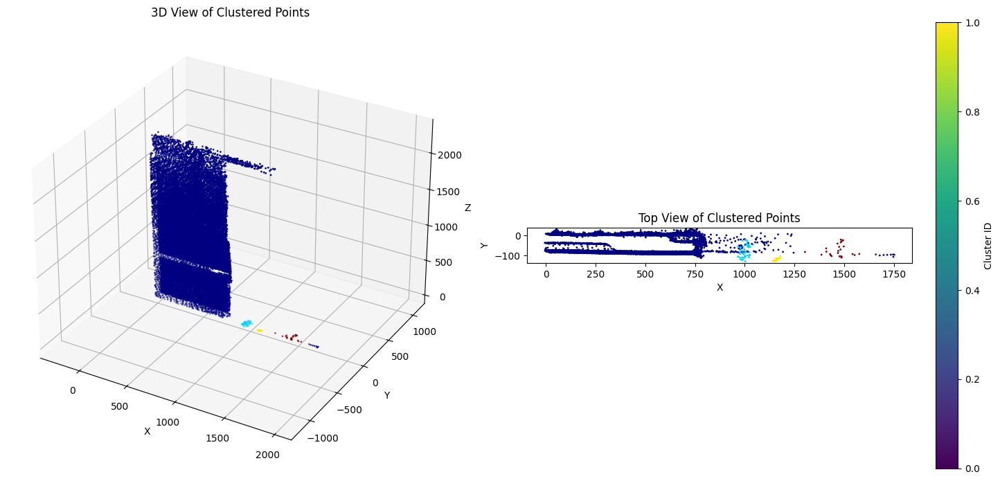


Processing Wall5
Number of points: 49563
Number of groups found: 1
Top 10 group sizes: [49557]


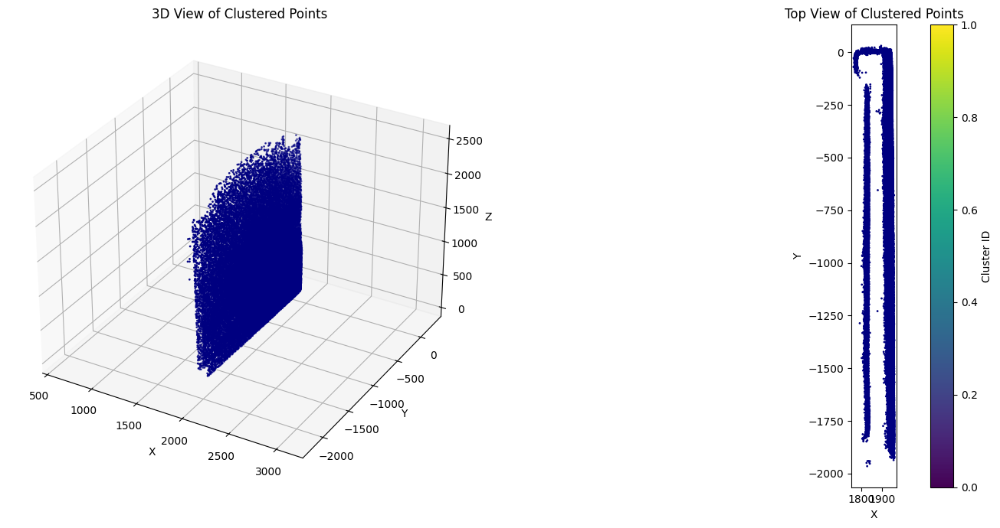


Processing Wall1
Number of points: 79950
Number of groups found: 2
Top 10 group sizes: [79936, 10]


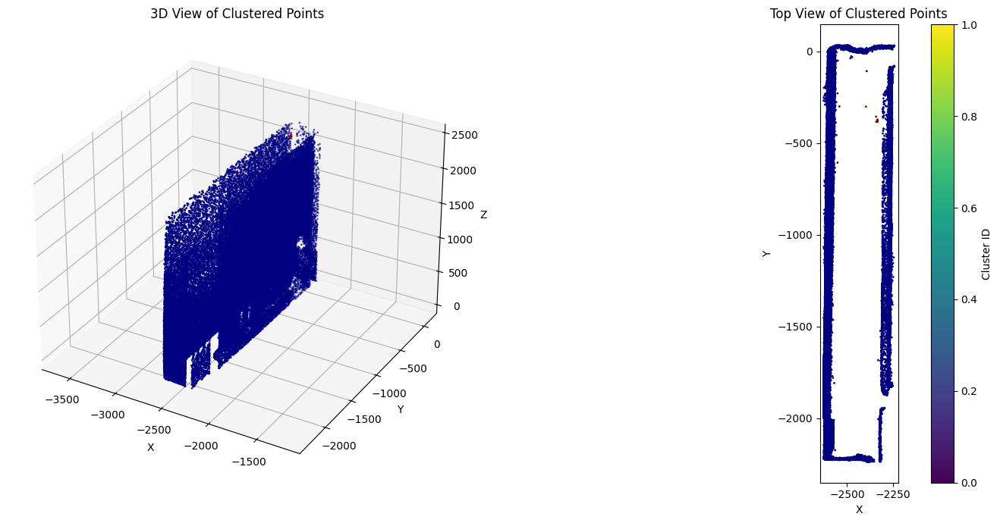


Wall entity processing and visualization completed.
CPU times: total: 46.1 s
Wall time: 46.1 s


In [28]:
%%time
import numpy as np
from scipy.spatial import cKDTree
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

def group_wall_clusters(points, labels, normals, distance_threshold=200, angle_threshold=0.1):
    unique_labels = np.unique(labels)
    unique_labels = unique_labels[unique_labels != -1]  # Exclude noise points
    
    if len(unique_labels) == 0:
        return labels, []
    
    cluster_centers = np.array([np.mean(points[labels == label], axis=0) for label in unique_labels])
    cluster_normals = np.array([np.mean(normals[labels == label], axis=0) for label in unique_labels])
    
    tree = cKDTree(cluster_centers)
    
    groups = []
    processed = set()
    
    for i, (center, normal) in enumerate(zip(cluster_centers, cluster_normals)):
        if i in processed:
            continue
        
        group = [i]
        processed.add(i)
        
        # Find nearby clusters
        nearby_indices = tree.query_ball_point(center, distance_threshold)
        
        for j in nearby_indices:
            if j not in processed and np.abs(np.dot(normal, cluster_normals[j])) > 1 - angle_threshold:
                group.append(j)
                processed.add(j)
        
        groups.append(group)
    
    # Create new labels
    new_labels = np.copy(labels)
    for i, group in enumerate(groups):
        for label in group:
            new_labels[labels == unique_labels[label]] = i
    
    return new_labels, groups

def estimate_normals(points, k=30):
    """
    Estimate normals using PCA on local neighborhoods.
    """
    tree = cKDTree(points)
    normals = np.zeros_like(points)
    
    for i, point in enumerate(points):
        distances, indices = tree.query(point, k=k)
        neighbors = points[indices]
        centered = neighbors - np.mean(neighbors, axis=0)
        cov = np.dot(centered.T, centered)
        eigenvalues, eigenvectors = np.linalg.eigh(cov)
        normals[i] = eigenvectors[:, 0]  # Smallest eigenvector
        
    return normals

def dbscan_clustering(points, eps=100, min_samples=10):
    """
    Perform DBSCAN clustering using scikit-learn.
    """
    from sklearn.cluster import DBSCAN
    clustering = DBSCAN(eps=eps, min_samples=min_samples).fit(points)
    return clustering.labels_

def visualize_clusters(points, labels):
    """
    Visualize clustered points using matplotlib.
    """
    max_label = labels.max()
    colors = plt.cm.jet(labels / (max_label if max_label > 0 else 1))
    
    # Create two subplots: 3D view and top view
    fig = plt.figure(figsize=(15, 7))
    
    # 3D view
    ax1 = fig.add_subplot(121, projection='3d')
    ax1.scatter(points[:, 0], points[:, 1], points[:, 2], 
                c=colors[:, :3], s=1)
    ax1.set_title('3D View of Clustered Points')
    ax1.set_xlabel('X')
    ax1.set_ylabel('Y')
    ax1.set_zlabel('Z')
    
    # Set equal aspect ratio for 3D plot
    limits = np.array([
        ax1.get_xlim3d(),
        ax1.get_ylim3d(),
        ax1.get_zlim3d()
    ])
    center = np.mean(limits, axis=1)
    radius = 0.5 * np.max(np.abs(limits[:, 1] - limits[:, 0]))
    ax1.set_xlim3d([center[0] - radius, center[0] + radius])
    ax1.set_ylim3d([center[1] - radius, center[1] + radius])
    ax1.set_zlim3d([center[2] - radius, center[2] + radius])
    
    # Top view (2D)
    ax2 = fig.add_subplot(122)
    scatter = ax2.scatter(points[:, 0], points[:, 1], 
                         c=colors[:, :3], s=1)
    ax2.set_title('Top View of Clustered Points')
    ax2.set_xlabel('X')
    ax2.set_ylabel('Y')
    ax2.set_aspect('equal')
    
    # Add colorbar
    plt.colorbar(scatter, ax=ax2, label='Cluster ID')
    
    plt.tight_layout()
    plt.show()

def process_wall_entity(wall_points, name):
    print(f"\nProcessing {name}")
    print(f"Number of points: {len(wall_points)}")
    
    if len(wall_points) == 0:
        print(f"Skipping {name} due to no points")
        return
    
    # Estimate normals
    normals = estimate_normals(wall_points[:, :3])
    
    # Perform DBSCAN clustering
    labels = dbscan_clustering(wall_points[:, :3])
    
    # Group wall clusters
    grouped_labels, groups = group_wall_clusters(wall_points[:, :3], labels, normals)
    
    print(f"Number of groups found: {len(groups)}")
    if len(groups) > 0:
        group_sizes = [sum(grouped_labels == i) for i in range(len(groups))]
        group_sizes.sort(reverse=True)
        print("Top 10 group sizes:", group_sizes[:10])
    
        # Visualize clusters
        visualize_clusters(wall_points[:, :3], grouped_labels)
    else:
        print("No groups found for clustering visualization")

# Main execution
# Assuming wall_entities is already defined from previous steps
for name, points in wall_entities.items():
    process_wall_entity(points, name)
print("\nWall entity processing and visualization completed.")

Starting parallel processing of 6 walls...
Using 20 CPU cores for parallel processing

Parallel processing completed in 1.18 seconds


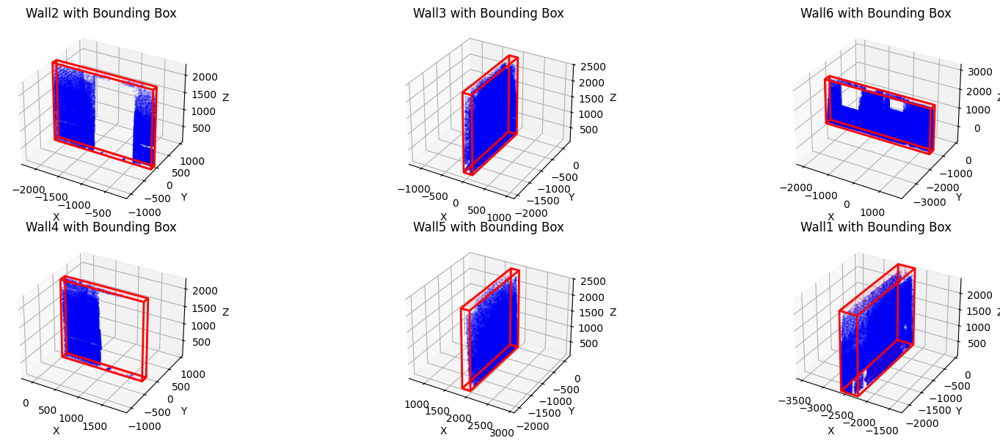


All walls processing and visualization completed.
CPU times: total: 4.75 s
Wall time: 5.6 s


In [29]:
%%time
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
from sklearn.cluster import DBSCAN
from scipy.spatial import cKDTree
import multiprocessing as mp
from joblib import Parallel, delayed
import time

def process_walls(wall_entities):
    """Process multiple walls with visualization"""
    fig = plt.figure(figsize=(18, 6))
    
    # Process walls in parallel and collect results
    start_time = time.time()
    print(f"Starting parallel processing of {len(wall_entities)} walls...")
    
    # Get available CPU cores
    num_cores = mp.cpu_count()
    print(f"Using {num_cores} CPU cores for parallel processing")
    
    # Process walls in parallel
    results = Parallel(n_jobs=num_cores)(
        delayed(process_wall_parallel)(wall_name, wall_points) 
        for wall_name, wall_points in wall_entities.items()
    )
    
    # Create visualizations from results
    for i, (wall_name, wall_points, bounding_box) in enumerate(results, 1):
        ax = fig.add_subplot(2, 3, i, projection='3d')
        visualize_wall(wall_points, bounding_box, ax, wall_name)
    
    elapsed_time = time.time() - start_time
    print(f"\nParallel processing completed in {elapsed_time:.2f} seconds")
    
    plt.tight_layout()
    plt.show()

def process_wall_parallel(wall_name, wall_points):
    """Process a single wall for parallel execution"""
    print(f"Processing {wall_name}")
    print(f"Number of points: {len(wall_points)}")
    print(f"Shape of wall_points: {wall_points.shape}")
    
    if wall_points.shape[1] > 3:
        wall_points = wall_points[:, :3]
        
    # Validation check for minimum points required
    min_points_required = 100  # Minimum points needed for meaningful analysis
    if len(wall_points) < min_points_required:
        print(f"Warning: {wall_name} has fewer than {min_points_required} points ({len(wall_points)}). Results may be unreliable.")
    
    bounding_box = create_bounding_box(wall_points)
    
    # Use KD-tree for spatial indexing and calculate adaptive parameters
    if len(wall_points) >= min_points_required:
        tree = cKDTree(wall_points)
        eps, min_samples = calculate_adaptive_params(wall_points, tree)
        print(f"Adaptive parameters for {wall_name}: eps={eps:.3f}, min_samples={min_samples}")
        
        # Optional: Perform clustering with DBSCAN using adaptive parameters
        # This is prepared but commented out as the original function doesn't use clustering
        # dbscan = DBSCAN(eps=eps, min_samples=min_samples, algorithm='kd_tree', n_jobs=1)
        # labels = dbscan.fit_predict(wall_points)
        # n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        # print(f"Number of clusters found in {wall_name}: {n_clusters}")
    
    return wall_name, wall_points, bounding_box

def calculate_adaptive_params(points, tree=None, k=10):
    """Calculate adaptive parameters based on point density"""
    if tree is None:
        tree = cKDTree(points)
    
    # Sample points for efficiency
    sample_size = min(1000, len(points))
    sample_indices = np.random.choice(len(points), sample_size, replace=False)
    
    # Calculate average distance to k nearest neighbors
    distances = []
    for idx in sample_indices:
        dist, _ = tree.query(points[idx], k=min(k+1, len(points)))
        distances.extend(dist[1:])  # Skip first (self) distance
    
    # Calculate adaptive eps as the average distance + standard deviation
    eps = np.mean(distances) + np.std(distances)
    
    # Calculate min_samples based on point density and log of point count
    point_density = len(points) / (np.max(points, axis=0) - np.min(points, axis=0)).prod()
    min_samples = max(5, int(np.log(len(points)) * np.log10(point_density + 1)))
    
    return eps, min_samples

def process_wall(wall_name, wall_points, ax):
    """Original process_wall function kept for compatibility"""
    print(f"Processing {wall_name}")
    print(f"Number of points: {len(wall_points)}")
    print(f"Shape of wall_points: {wall_points.shape}")
    
    if wall_points.shape[1] > 3:
        wall_points = wall_points[:, :3]
        
    bounding_box = create_bounding_box(wall_points)
    visualize_wall(wall_points, bounding_box, ax, wall_name)

def create_bounding_box(points):
    """Create a bounding box for the given points"""
    min_bound = np.min(points, axis=0)
    max_bound = np.max(points, axis=0)
    
    print(f"Min bound: {min_bound}")
    print(f"Max bound: {max_bound}")
    
    return (min_bound, max_bound)

def visualize_wall(wall_points, bounding_box, ax, wall_name):
    """Visualize wall points and bounding box"""
    ax.scatter(wall_points[:, 0], wall_points[:, 1], wall_points[:, 2], c='blue', s=1, alpha=0.1)
    plot_box(ax, bounding_box[0], bounding_box[1], color='r')
    
    ax.set_title(f'{wall_name} with Bounding Box')
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    
    # Set equal scaling for x and y axes
    max_range = np.array([wall_points[:, 0].max() - wall_points[:, 0].min(),
                          wall_points[:, 1].max() - wall_points[:, 1].min(),
                          wall_points[:, 2].max() - wall_points[:, 2].min()]).max() / 2.0
    mid_x = (wall_points[:, 0].max() + wall_points[:, 0].min()) * 0.5
    mid_y = (wall_points[:, 1].max() + wall_points[:, 1].min()) * 0.5
    mid_z = (wall_points[:, 2].max() + wall_points[:, 2].min()) * 0.5
    ax.set_xlim(mid_x - max_range, mid_x + max_range)
    ax.set_ylim(mid_y - max_range, mid_y + max_range)
    ax.set_zlim(mid_z - max_range, mid_z + max_range)

def plot_box(ax, min_point, max_point, color):
    """Plot a 3D bounding box"""
    x_min, y_min, z_min = min_point
    x_max, y_max, z_max = max_point
    
    vertices = [
        [x_min, y_min, z_min], [x_max, y_min, z_min],
        [x_max, y_max, z_min], [x_min, y_max, z_min],
        [x_min, y_min, z_max], [x_max, y_min, z_max],
        [x_max, y_max, z_max], [x_min, y_max, z_max]
    ]
    
    edges = [
        [vertices[0], vertices[1], vertices[2], vertices[3]],
        [vertices[4], vertices[5], vertices[6], vertices[7]],
        [vertices[0], vertices[4]], [vertices[1], vertices[5]],
        [vertices[2], vertices[6]], [vertices[3], vertices[7]]
    ]
    
    face_collection = Poly3DCollection(edges, linewidths=2, edgecolors=color, alpha=0.1)
    face_collection.set_facecolor(color)
    ax.add_collection3d(face_collection)

# Main execution
# Assuming wall_entities is already defined from previous steps
process_walls(wall_entities)
print("\nAll walls processing and visualization completed.")

Starting parallel processing of 6 walls...
Using 20 CPU cores for parallel processing

Parallel processing completed in 3.93 seconds


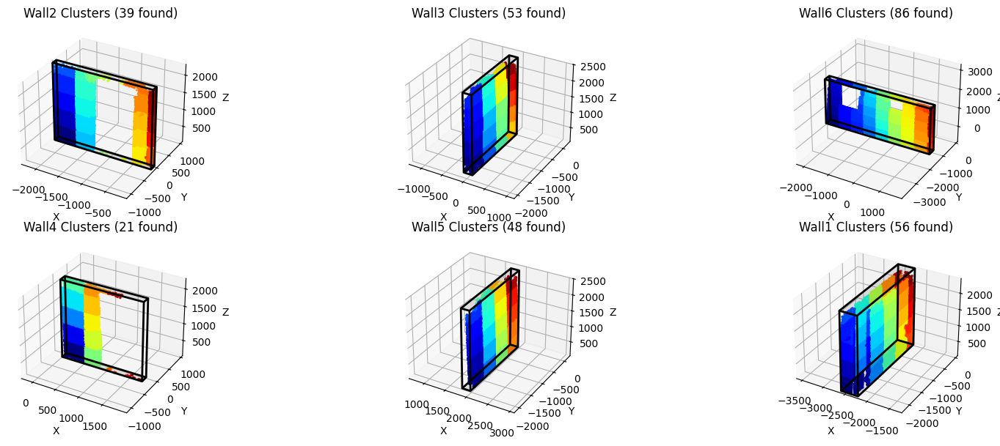


All walls processing and visualization completed.
CPU times: total: 5.62 s
Wall time: 8.8 s


In [30]:
%%time
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
from sklearn.cluster import DBSCAN
from scipy.spatial import cKDTree
import multiprocessing as mp
from joblib import Parallel, delayed
import time

def process_walls(wall_entities, grid_size=500):
    """Process multiple walls with clustering and visualization"""
    fig = plt.figure(figsize=(18, 6))
    
    # Start timing for performance measurement
    start_time = time.time()
    print(f"Starting parallel processing of {len(wall_entities)} walls...")
    
    # Get number of available CPU cores
    num_cores = mp.cpu_count()
    print(f"Using {num_cores} CPU cores for parallel processing")
    
    # Process walls in parallel
    results = Parallel(n_jobs=num_cores)(
        delayed(process_wall_parallel)(wall_name, wall_points, grid_size) 
        for wall_name, wall_points in wall_entities.items()
    )
    
    # Create visualizations from results
    for i, (wall_name, wall_points, bounding_box, clusters) in enumerate(results, 1):
        ax = fig.add_subplot(2, 3, i, projection='3d')
        visualize_clusters(wall_points, bounding_box, clusters, ax, wall_name)
    
    elapsed_time = time.time() - start_time
    print(f"\nParallel processing completed in {elapsed_time:.2f} seconds")
    
    plt.tight_layout()
    plt.show()

def process_wall_parallel(wall_name, wall_points, grid_size):
    """Process a single wall for parallel execution"""
    print(f"Processing {wall_name}")
    print(f"Number of points: {len(wall_points)}")
    
    if wall_points.shape[1] > 3:
        wall_points = wall_points[:, :3]
    
    # Validation check for minimum points required
    min_points_required = 100  # Minimum points needed for meaningful analysis
    if len(wall_points) < min_points_required:
        print(f"Warning: {wall_name} has fewer than {min_points_required} points ({len(wall_points)}). Results may be unreliable.")
    
    bounding_box = create_bounding_box(wall_points)
    clusters = cluster_points(wall_points, bounding_box, grid_size)
    
    return wall_name, wall_points, bounding_box, clusters

def process_wall(wall_name, wall_points, grid_size, ax):
    """Original process_wall function kept for compatibility"""
    print(f"Processing {wall_name}")
    print(f"Number of points: {len(wall_points)}")
    
    if wall_points.shape[1] > 3:
        wall_points = wall_points[:, :3]
    
    bounding_box = create_bounding_box(wall_points)
    clusters = cluster_points(wall_points, bounding_box, grid_size)
    visualize_clusters(wall_points, bounding_box, clusters, ax, wall_name)
    
    return clusters

def create_bounding_box(points):
    """Create a bounding box for the given points"""
    min_bound = np.min(points, axis=0)
    max_bound = np.max(points, axis=0)
    return (min_bound, max_bound)

def calculate_adaptive_dbscan_params(points, k=10):
    """Calculate adaptive DBSCAN parameters based on point density"""
    # Build KD-tree for efficient nearest neighbor search
    tree = cKDTree(points)
    
    # Find distances to k-nearest neighbors for a sample of points
    sample_size = min(1000, len(points))  # Limit sample size for performance
    sample_indices = np.random.choice(len(points), sample_size, replace=False)
    
    distances = []
    for idx in sample_indices:
        # Get k nearest neighbors
        dist, _ = tree.query(points[idx], k=min(k+1, len(points)))
        # Skip the first distance (distance to self = 0)
        distances.extend(dist[1:])
    
    # Calculate adaptive eps as the average distance + standard deviation
    eps = np.mean(distances) + np.std(distances)
    
    # Calculate min_samples based on point density
    # Higher density means higher min_samples
    point_density = len(points) / (np.max(points, axis=0) - np.min(points, axis=0)).prod()
    min_samples = max(5, int(np.log(len(points)) * np.log10(point_density + 1)))
    
    return eps, min_samples

def cluster_points(points, bounding_box, grid_size):
    """Cluster points using grid-based approach with adaptive DBSCAN"""
    min_bound, max_bound = bounding_box
    grid_shape = np.ceil((max_bound - min_bound) / grid_size).astype(int)
    
    clusters = []
    
    # Build a KD-tree for the entire point cloud for more efficient cell selection
    tree = cKDTree(points)
    
    for i in range(grid_shape[0]):
        for j in range(grid_shape[1]):
            for k in range(grid_shape[2]):
                cell_min = min_bound + np.array([i, j, k]) * grid_size
                cell_max = cell_min + grid_size
                
                # Use KD-tree to find points in the cell more efficiently
                cell_center = (cell_min + cell_max) / 2
                cell_radius = np.linalg.norm(cell_max - cell_min) / 2
                indices = tree.query_ball_point(cell_center, cell_radius)
                
                # Refine selection to exact cell bounds
                cell_points = points[indices]
                mask = np.all((cell_points >= cell_min) & (cell_points < cell_max), axis=1)
                cell_points = cell_points[mask]
                
                # Minimum validation check
                min_cell_points = 10  # Minimum points for clustering
                if len(cell_points) > min_cell_points:
                    # Calculate adaptive DBSCAN parameters for this cell
                    eps, min_samples = calculate_adaptive_dbscan_params(cell_points)
                    
                    # Ensure reasonable bounds for parameters
                    eps = min(max(eps, 50), 200)  # Between 50 and 200
                    min_samples = min(max(min_samples, 3), 15)  # Between 3 and 15
                    
                    # Apply DBSCAN with adaptive parameters
                    db = DBSCAN(eps=eps, min_samples=min_samples, algorithm='kd_tree', n_jobs=1).fit(cell_points)
                    labels = db.labels_
                    
                    for label in set(labels):
                        if label != -1:  # Ignore noise points
                            cluster = cell_points[labels == label]
                            # Validation: ensure cluster has minimum size
                            if len(cluster) >= min_samples:
                                clusters.append(cluster)
    
    return clusters

def visualize_clusters(wall_points, bounding_box, clusters, ax, wall_name):
    """Visualize wall clusters and bounding box"""
    # Plot clusters
    colors = plt.cm.jet(np.linspace(0, 1, len(clusters)))
    for cluster, color in zip(clusters, colors):
        ax.scatter(cluster[:, 0], cluster[:, 1], cluster[:, 2], c=[color], s=2)
    
    # Plot bounding box
    plot_box(ax, bounding_box[0], bounding_box[1], color='k')
    
    ax.set_title(f'{wall_name} Clusters ({len(clusters)} found)')
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    
    # Set equal scaling for x and y axes
    max_range = np.array([wall_points[:, 0].max() - wall_points[:, 0].min(),
                          wall_points[:, 1].max() - wall_points[:, 1].min(),
                          wall_points[:, 2].max() - wall_points[:, 2].min()]).max() / 2.0
    mid_x = (wall_points[:, 0].max() + wall_points[:, 0].min()) * 0.5
    mid_y = (wall_points[:, 1].max() + wall_points[:, 1].min()) * 0.5
    mid_z = (wall_points[:, 2].max() + wall_points[:, 2].min()) * 0.5
    ax.set_xlim(mid_x - max_range, mid_x + max_range)
    ax.set_ylim(mid_y - max_range, mid_y + max_range)
    ax.set_zlim(mid_z - max_range, mid_z + max_range)

def plot_box(ax, min_point, max_point, color):
    """Plot a 3D bounding box"""
    x_min, y_min, z_min = min_point
    x_max, y_max, z_max = max_point
    
    vertices = [
        [x_min, y_min, z_min], [x_max, y_min, z_min],
        [x_max, y_max, z_min], [x_min, y_max, z_min],
        [x_min, y_min, z_max], [x_max, y_min, z_max],
        [x_max, y_max, z_max], [x_min, y_max, z_max]
    ]
    
    edges = [
        [vertices[0], vertices[1], vertices[2], vertices[3]],
        [vertices[4], vertices[5], vertices[6], vertices[7]],
        [vertices[0], vertices[4]], [vertices[1], vertices[5]],
        [vertices[2], vertices[6]], [vertices[3], vertices[7]]
    ]
    
    face_collection = Poly3DCollection(edges, linewidths=2, edgecolors=color, alpha=0.1)
    face_collection.set_facecolor(color)
    ax.add_collection3d(face_collection)

# Main execution
# Assuming wall_entities is already defined from previous steps
process_walls(wall_entities)
print("\nAll walls processing and visualization completed.")

Starting PROGRESSIVE EXTENSION rectangle fitting for 6 walls...
Strategy: Inscribed → Extend longer side → Extend shorter side
Target: 90% coverage with ±2° rotation

[1/6] Processing Wall2...
Removed 3167 outliers (8.0%)
  Processing 36418 points...
  Finding optimal inscribed rectangle...
    Using fallback: 88907 mm²
  Initial coverage: 35.4%
  Initial dimensions: 1211.7 × 73.4 mm
  Phase 1: Extending WIDTH (longer side) from 1211.7mm...
    Width 1214mm: 35.5% coverage
    Width 1216mm: 35.5% coverage
    Width 1218mm: 35.6% coverage
    Width 1220mm: 35.7% coverage
    Width 1222mm: 35.7% coverage
    Width 1224mm: 35.8% coverage
    Width 1226mm: 35.8% coverage
    Width 1228mm: 35.9% coverage
    Width 1230mm: 36.0% coverage
    Width 1232mm: 36.0% coverage
    Width 1234mm: 36.1% coverage
    Width 1236mm: 36.1% coverage
    Width 1238mm: 36.2% coverage
    Width 1240mm: 36.2% coverage
    Width 1242mm: 36.3% coverage
    Width 1244mm: 36.4% coverage
    Width 1246mm: 36.4% cov

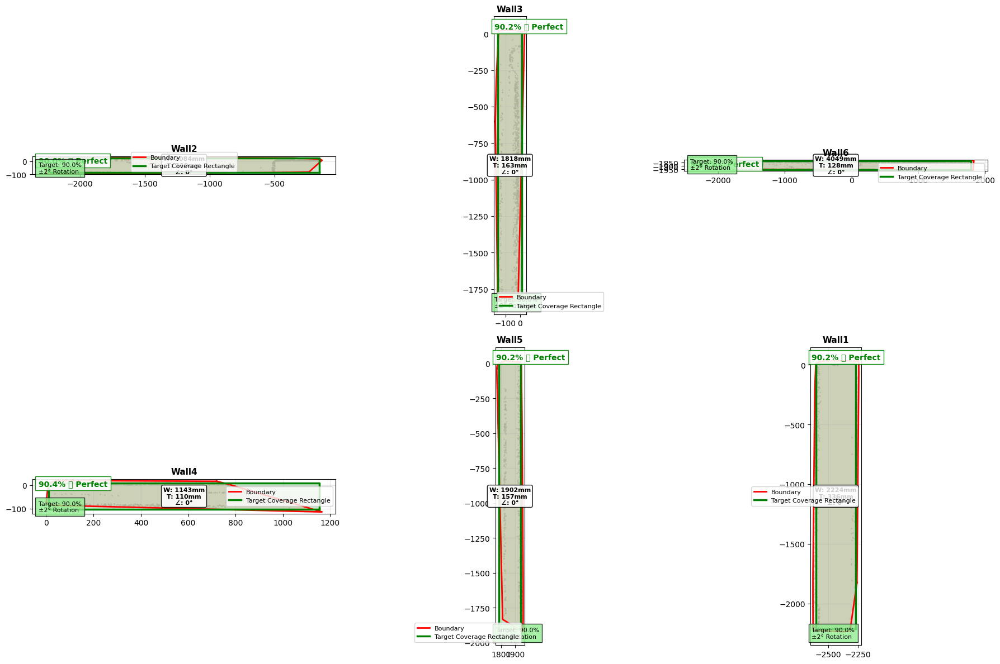


PROGRESSIVE EXTENSION ALGORITHM RESULTS
Target coverage: 90%
Average coverage: 90.2%
Average deviation from target: 0.2%
Coverage range: 90.0% - 90.4%
Average area: 369344 mm²
Average rotation: 0.00° (absolute)
Rotation range: 0.00° to 0.00°
Average enlargement ratio: 2.5x
Enlargement range: 2.5x - 2.6x

Precision analysis:
  Within ±1% of target: 6/6 walls
  Within ±3% of target: 6/6 walls
  Within ±5% of target: 6/6 walls
  Above 75% coverage: 6/6 walls

Rotation analysis:
  Walls with rotation > 0.1°: 0/6
  Walls with significant rotation > 0.5°: 0/6

Detailed results:
  🎯 Perfect Wall2: 90.0% (±0.0%) | 229985 mm² | 2084×110mm | ∠0° | Extended 2.6x | AR: 18.9
  🎯 Perfect Wall3: 90.2% (±0.2%) | 296638 mm² | 1818×163mm | ∠0° | Extended 2.5x | AR: 11.1
  🎯 Perfect Wall6: 90.1% (±0.1%) | 519309 mm² | 4049×128mm | ∠0° | Extended 2.6x | AR: 31.6
  🎯 Perfect Wall4: 90.4% (±0.4%) | 125629 mm² | 1143×110mm | ∠0° | Extended 2.5x | AR: 10.4
  🎯 Perfect Wall5: 90.2% (±0.2%) | 298128 mm² | 1902

In [35]:
%%time
# 85% Coverage 
import numpy as np
from scipy.optimize import minimize, differential_evolution
from shapely.geometry import Polygon, box
from shapely.affinity import rotate
from scipy.spatial import ConvexHull
import matplotlib.pyplot as plt
from sklearn.neighbors import LocalOutlierFactor
import time
import warnings
warnings.filterwarnings('ignore')

def ensure_point_format(wall_data):
    """
    Ensure point cloud data is in the correct format for processing.
    """
    try:
        if isinstance(wall_data, dict) and 'original_points' in wall_data:
            points = np.array(wall_data['original_points'])
        elif isinstance(wall_data, dict) and 'vertices' in wall_data:
            all_vertices = []
            for face_vertices in wall_data['vertices'].values():
                all_vertices.extend(face_vertices)
            points = np.array(all_vertices)
        else:
            points = np.array(wall_data)
        
        if points.ndim == 1:
            if len(points) % 3 == 0:
                points = points.reshape(-1, 3)
            else:
                raise ValueError("Points array cannot be reshaped to Nx3 array")
        
        if points.shape[1] < 2:
            raise ValueError("Points must have at least 2 dimensions (X,Y)")
            
        if len(points) < 3:
            raise ValueError("At least 3 points are required for boundary creation")
            
        return points
    
    except Exception as e:
        print(f"Error in point format conversion: {str(e)}")
        return np.array([])

def conservative_outlier_removal(points, contamination=0.08):
    """
    Conservative outlier removal similar to original algorithm.
    """
    if len(points) < 20:
        return points
    
    try:
        n_neighbors = min(20, len(points) - 1)
        lof = LocalOutlierFactor(n_neighbors=n_neighbors, contamination=contamination)
        outlier_labels = lof.fit_predict(points[:, :2])
        
        inlier_mask = outlier_labels == 1
        filtered_points = points[inlier_mask]
        
        num_outliers = len(points) - len(filtered_points)
        if num_outliers > 0:
            print(f"Removed {num_outliers} outliers ({(num_outliers/len(points))*100:.1f}%)")
        
        if len(filtered_points) < 3:
            print("Warning: Too many points removed, using original points.")
            return points
            
        return filtered_points
    
    except Exception as e:
        print(f"Warning: Outlier removal failed - {str(e)}. Using original points.")
        return points

def create_simple_boundary(points_2d):
    """
    Create boundary using improved approach but keeping it simple and robust.
    """
    try:
        hull = ConvexHull(points_2d)
        hull_poly = Polygon(points_2d[hull.vertices])
        
        if len(points_2d) < 100:
            return hull_poly
        
        try:
            from scipy.spatial import Delaunay
            
            tri = Delaunay(points_2d)
            
            edge_lengths = []
            for simplex in tri.simplices:
                for i in range(3):
                    p1, p2 = points_2d[simplex[i]], points_2d[simplex[(i+1)%3]]
                    edge_length = np.linalg.norm(p1 - p2)
                    edge_lengths.append(edge_length)
            
            threshold = np.percentile(edge_lengths, 80)
            
            boundary_points = set()
            for simplex in tri.simplices:
                for i in range(3):
                    p1_idx, p2_idx = simplex[i], simplex[(i+1)%3]
                    p1, p2 = points_2d[p1_idx], points_2d[p2_idx]
                    edge_length = np.linalg.norm(p1 - p2)
                    
                    if edge_length <= threshold:
                        boundary_points.add(p1_idx)
                        boundary_points.add(p2_idx)
            
            if len(boundary_points) >= 4:
                boundary_coords = points_2d[list(boundary_points)]
                boundary_hull = ConvexHull(boundary_coords)
                return Polygon(boundary_coords[boundary_hull.vertices])
            else:
                return hull_poly
                
        except Exception:
            return hull_poly
    
    except Exception as e:
        print(f"Warning: Boundary creation failed: {str(e)}. Using convex hull.")
        hull = ConvexHull(points_2d)
        return Polygon(points_2d[hull.vertices])

def create_rotated_rectangle(center_x, center_y, width, thickness, angle_deg):
    """
    Create a rotated rectangle polygon.
    """
    # Create axis-aligned rectangle first
    rectangle = box(center_x - width/2, center_y - thickness/2,
                   center_x + width/2, center_y + thickness/2)
    
    # Rotate around center
    if abs(angle_deg) > 1e-6:  # Only rotate if angle is significant
        rectangle = rotate(rectangle, angle_deg, origin=(center_x, center_y))
    
    return rectangle

def find_optimal_inscribed_rectangle(boundary):
    """
    Find optimal inscribed rectangle as starting point using efficient optimization.
    """
    minx, miny, maxx, maxy = boundary.bounds
    
    def inscribed_objective(params):
        """Objective for finding maximum inscribed rectangle."""
        center_x, center_y, width, thickness, angle_deg = params
        
        rectangle = create_rotated_rectangle(center_x, center_y, width, thickness, angle_deg)
        
        if not rectangle.is_valid:
            return 1e6
        
        # Strong penalty for going outside boundary
        if not rectangle.within(boundary):
            return 1e6
        
        # Maximize area (minimize negative area)
        return -rectangle.area
    
    # Conservative bounds to ensure we stay inside
    center_x = (minx + maxx) / 2
    center_y = (miny + maxy) / 2
    width_range = (maxx - minx) * 0.95
    height_range = (maxy - miny) * 0.95
    
    bounds = [
        (minx + width_range*0.05, maxx - width_range*0.05),   # center_x
        (miny + height_range*0.05, maxy - height_range*0.05), # center_y  
        (width_range*0.1, width_range),                       # width
        (height_range*0.1, height_range),                     # thickness
        (-2.0, 2.0)                                           # angle ±2°
    ]
    
    print("  Finding optimal inscribed rectangle...")
    best_result = None
    best_area = 0
    
    # Try differential evolution first
    try:
        de_result = differential_evolution(inscribed_objective, bounds, 
                                         seed=42, maxiter=200, popsize=10,
                                         tol=1e-6, atol=1e-8)
        
        if de_result.success and de_result.fun < 1e5:
            best_area = -de_result.fun
            best_result = de_result.x
            print(f"    DE found: {best_area:.0f} mm² at {best_result[4]:.2f}°")
    except Exception as e:
        print(f"    DE failed: {e}")
    
    # Try L-BFGS-B with multiple starting points
    initial_guesses = [
        [center_x, center_y, width_range * 0.7, height_range * 0.7, 0.0],
        [center_x, center_y, width_range * 0.8, height_range * 0.5, 0.0],
        [center_x, center_y, width_range * 0.5, height_range * 0.8, 0.0],
        [center_x, center_y, width_range * 0.7, height_range * 0.7, 1.0],
        [center_x, center_y, width_range * 0.7, height_range * 0.7, -1.0],
    ]
    
    if best_result is not None:
        initial_guesses.insert(0, best_result)
    
    for i, guess in enumerate(initial_guesses):
        try:
            lbfgs_result = minimize(inscribed_objective, guess, bounds=bounds, 
                                  method='L-BFGS-B', 
                                  options={'maxiter': 300, 'ftol': 1e-9})
            
            if lbfgs_result.success and lbfgs_result.fun < 1e5:
                area = -lbfgs_result.fun
                if area > best_area:
                    best_result = lbfgs_result.x
                    best_area = area
        except Exception:
            continue
    
    if best_result is not None:
        print(f"    Final inscribed: {best_area:.0f} mm² at {best_result[4]:.2f}°")
        return best_result, best_area
    else:
        # Fallback to conservative rectangle
        conservative = [center_x, center_y, width_range * 0.6, height_range * 0.6, 0.0]
        area = conservative[2] * conservative[3]
        print(f"    Using fallback: {area:.0f} mm²")
        return conservative, area

def extend_rectangle_to_target_coverage(boundary, initial_params, target_coverage=0.9):
    """
    Progressive extension strategy: extend longer side first, then shorter side.
    Stop when boundary is reached OR target coverage is achieved.
    """
    center_x, center_y, width, thickness, angle_deg = initial_params
    boundary_area = boundary.area
    
    # Get boundary limits
    minx, miny, maxx, maxy = boundary.bounds
    
    # Calculate initial coverage
    initial_rect = create_rotated_rectangle(center_x, center_y, width, thickness, angle_deg)
    initial_coverage = (initial_rect.intersection(boundary).area / boundary_area)
    
    print(f"  Initial coverage: {initial_coverage*100:.1f}%")
    print(f"  Initial dimensions: {width:.1f} × {thickness:.1f} mm")
    
    current_width = width
    current_thickness = thickness
    current_angle = angle_deg
    best_coverage = initial_coverage
    
    # Determine which dimension is longer
    is_width_longer = width >= thickness
    
    # PHASE 1: Extend the longer side
    if is_width_longer:
        print(f"  Phase 1: Extending WIDTH (longer side) from {width:.1f}mm...")
        
        # Calculate maximum possible width based on boundary
        max_width = (maxx - minx) * 0.98  # 98% to avoid edge issues
        
        # Extend width gradually
        for test_width in np.arange(width, max_width + 1, 2.0):  # 2mm steps
            test_rectangle = create_rotated_rectangle(center_x, center_y, test_width, 
                                                    current_thickness, current_angle)
            
            if test_rectangle.is_valid:
                intersection = test_rectangle.intersection(boundary)
                coverage = intersection.area / boundary_area
                
                if coverage > best_coverage:
                    current_width = test_width
                    best_coverage = coverage
                    
                    print(f"    Width {test_width:.0f}mm: {coverage*100:.1f}% coverage")
                
                # Check if we hit target coverage
                if coverage >= target_coverage:
                    print(f"    Target achieved with width={test_width:.1f}mm: {coverage*100:.1f}%")
                    current_width = test_width
                    best_coverage = coverage
                    break
                    
                # Check if we're at practical boundary limit
                if test_width >= max_width:
                    print(f"    Boundary limit reached with width={current_width:.1f}mm: {best_coverage*100:.1f}%")
                    break
    else:
        print(f"  Phase 1: Extending THICKNESS (longer side) from {thickness:.1f}mm...")
        
        # Calculate maximum possible thickness based on boundary
        max_thickness = (maxy - miny) * 0.98  # 98% to avoid edge issues
        
        # Extend thickness gradually
        for test_thickness in np.arange(thickness, max_thickness + 1, 2.0):  # 2mm steps
            test_rectangle = create_rotated_rectangle(center_x, center_y, current_width, 
                                                    test_thickness, current_angle)
            
            if test_rectangle.is_valid:
                intersection = test_rectangle.intersection(boundary)
                coverage = intersection.area / boundary_area
                
                if coverage > best_coverage:
                    current_thickness = test_thickness
                    best_coverage = coverage
                    
                    print(f"    Thickness {test_thickness:.0f}mm: {coverage*100:.1f}% coverage")
                
                # Check if we hit target coverage
                if coverage >= target_coverage:
                    print(f"    Target achieved with thickness={test_thickness:.1f}mm: {coverage*100:.1f}%")
                    current_thickness = test_thickness
                    best_coverage = coverage
                    break
                    
                # Check if we're at practical boundary limit
                if test_thickness >= max_thickness:
                    print(f"    Boundary limit reached with thickness={current_thickness:.1f}mm: {best_coverage*100:.1f}%")
                    break
    
    print(f"  After Phase 1: {best_coverage*100:.1f}% coverage")
    
    # PHASE 2: Extend the shorter side if target not met
    if best_coverage < target_coverage:
        print(f"  Phase 2: Target not met, extending shorter side...")
        
        if is_width_longer:
            # Now extend thickness (shorter side)
            print(f"    Extending THICKNESS (shorter side) from {current_thickness:.1f}mm...")
            
            max_thickness = (maxy - miny) * 0.98
            
            for test_thickness in np.arange(current_thickness, max_thickness + 1, 1.0):  # 1mm steps
                test_rectangle = create_rotated_rectangle(center_x, center_y, current_width, 
                                                        test_thickness, current_angle)
                
                if test_rectangle.is_valid:
                    intersection = test_rectangle.intersection(boundary)
                    coverage = intersection.area / boundary_area
                    
                    if coverage > best_coverage:
                        current_thickness = test_thickness
                        best_coverage = coverage
                        
                        print(f"    Thickness {test_thickness:.0f}mm: {coverage*100:.1f}% coverage")
                    
                    # Check if we hit target coverage
                    if coverage >= target_coverage:
                        print(f"    Target achieved with thickness={test_thickness:.1f}mm: {coverage*100:.1f}%")
                        current_thickness = test_thickness
                        best_coverage = coverage
                        break
                        
                    # Check if we're at practical boundary limit
                    if test_thickness >= max_thickness:
                        print(f"    Boundary limit reached with thickness={current_thickness:.1f}mm: {best_coverage*100:.1f}%")
                        break
        else:
            # Now extend width (shorter side)
            print(f"    Extending WIDTH (shorter side) from {current_width:.1f}mm...")
            
            max_width = (maxx - minx) * 0.98
            
            for test_width in np.arange(current_width, max_width + 1, 1.0):  # 1mm steps
                test_rectangle = create_rotated_rectangle(center_x, center_y, test_width, 
                                                        current_thickness, current_angle)
                
                if test_rectangle.is_valid:
                    intersection = test_rectangle.intersection(boundary)
                    coverage = intersection.area / boundary_area
                    
                    if coverage > best_coverage:
                        current_width = test_width
                        best_coverage = coverage
                        
                        print(f"    Width {test_width:.0f}mm: {coverage*100:.1f}% coverage")
                    
                    # Check if we hit target coverage
                    if coverage >= target_coverage:
                        print(f"    Target achieved with width={test_width:.1f}mm: {coverage*100:.1f}%")
                        current_width = test_width
                        best_coverage = coverage
                        break
                        
                    # Check if we're at practical boundary limit
                    if test_width >= max_width:
                        print(f"    Boundary limit reached with width={current_width:.1f}mm: {best_coverage*100:.1f}%")
                        break
        
        print(f"  After Phase 2: {best_coverage*100:.1f}% coverage")
    
    final_params = [center_x, center_y, current_width, current_thickness, current_angle]
    print(f"  Final dimensions: {current_width:.1f} × {current_thickness:.1f} mm")
    
    return final_params, best_coverage

def visualize_target_coverage_rectangle(ax, boundary, rectangle, points, wall_name, coverage_pct, params, target_coverage=90):
    """
    Enhanced visualization for target coverage rectangles.
    """
    # Sample points for visualization
    if len(points) > 1000:
        indices = np.random.choice(len(points), 1000, replace=False)
        sample_points = points[indices]
        ax.scatter(sample_points[:, 0], sample_points[:, 1], c='lightgray', s=1, alpha=0.5)
    else:
        ax.scatter(points[:, 0], points[:, 1], c='lightgray', s=1.5, alpha=0.6)
    
    # Plot boundary
    x, y = boundary.exterior.xy
    ax.plot(x, y, 'red', linewidth=2, label='Boundary')
    ax.fill(x, y, color='red', alpha=0.1)
    
    # Plot target coverage rectangle
    x, y = rectangle.exterior.xy
    ax.plot(x, y, 'green', linewidth=2.5, label='Target Coverage Rectangle')
    ax.fill(x, y, color='green', alpha=0.2)
    
    # Annotations
    center_x, center_y, width, thickness, angle_deg = params
    
    # Ensure width is longer dimension, thickness is shorter
    if width < thickness:
        width, thickness = thickness, width
    
    center = rectangle.centroid
    rotation_text = f'∠: {angle_deg:.1f}°' if abs(angle_deg) > 0.1 else '∠: 0°'
    ax.text(center.x, center.y, 
            f'W: {width:.0f}mm\nT: {thickness:.0f}mm\n{rotation_text}',
            ha='center', va='center', fontsize=8, weight='bold',
            bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.9))
    
    # Coverage status relative to target
    diff_from_target = abs(coverage_pct - target_coverage)
    
    if diff_from_target <= 1:
        color, status = 'green', '🎯 Perfect'
    elif diff_from_target <= 3:
        color, status = 'green', '✓ Target'
    elif diff_from_target <= 5:
        color, status = 'orange', '~ Close'
    elif coverage_pct >= 75:
        color, status = 'orange', '✓ Good'
    else:
        color, status = 'red', '✗ Low'
    
    ax.text(0.02, 0.98, f'{coverage_pct:.1f}% {status}', transform=ax.transAxes,
            fontsize=10, va='top', weight='bold', color=color,
            bbox=dict(facecolor='white', alpha=0.9, edgecolor=color))
    
    # Algorithm info
    ax.text(0.02, 0.02, f'Target: {target_coverage}%\n±2° Rotation', 
            transform=ax.transAxes, fontsize=8, va='bottom', 
            bbox=dict(facecolor='lightgreen', alpha=0.8))
    
    ax.set_title(f'{wall_name}', fontsize=11, weight='bold')
    ax.set_aspect('equal')
    ax.legend(fontsize=8)
    ax.grid(True, alpha=0.3)

def find_improved_target_coverage_rectangles(wall_entities, target_coverage=0.90):
    """
    Improved algorithm: start with inscribed rectangle, then progressively extend.
    """
    results = {}
    fig = plt.figure(figsize=(18, 12))
    
    start_time = time.time()
    total_walls = len(wall_entities)
    print(f"Starting PROGRESSIVE EXTENSION rectangle fitting for {total_walls} walls...")
    print(f"Strategy: Inscribed → Extend longer side → Extend shorter side")
    print(f"Target: {target_coverage*100:.0f}% coverage with ±2° rotation")
    
    successful_walls = 0
    
    for i, (wall_name, wall_data) in enumerate(wall_entities.items(), 1):
        wall_start = time.time()
        print(f"\n[{i}/{total_walls}] Processing {wall_name}...")
        
        ax = fig.add_subplot(2, 3, i) if i <= 6 else None
        
        try:
            # Process points conservatively
            points = ensure_point_format(wall_data)
            if len(points) == 0:
                raise ValueError("No valid points found")
            
            # Conservative outlier removal
            points = conservative_outlier_removal(points, contamination=0.08)
            points_2d = points[:, :2]
            
            print(f"  Processing {len(points_2d)} points...")
            
            # Simple boundary
            boundary = create_simple_boundary(points_2d)
            
            # Step 1: Find optimal inscribed rectangle
            initial_params, initial_area = find_optimal_inscribed_rectangle(boundary)
            
            # Step 2: Progressive extension strategy
            final_params, final_coverage = extend_rectangle_to_target_coverage(boundary, initial_params, target_coverage)
            
            # Create final rectangle
            rectangle = create_rotated_rectangle(*final_params)
            
            # Calculate metrics
            intersection = rectangle.intersection(boundary)
            coverage_percent = final_coverage * 100
            
            # Ensure width > thickness for reporting
            width, thickness = final_params[2], final_params[3]
            if width < thickness:
                width, thickness = thickness, width
            
            # Store results
            results[wall_name] = {
                'center': (final_params[0], final_params[1]),
                'width': width,
                'thickness': thickness,
                'angle': final_params[4],
                'area': rectangle.area,
                'coverage_percent': coverage_percent,
                'rectangle_polygon': rectangle,
                'boundary_polygon': boundary,
                'intersection_area': intersection.area,
                'boundary_area': boundary.area,
                'initial_area': initial_area
            }
            
            # Visualization
            if ax is not None:
                display_params = [final_params[0], final_params[1], width, thickness, final_params[4]]
                visualize_target_coverage_rectangle(ax, boundary, rectangle, points_2d, 
                                                  wall_name, coverage_percent, display_params, target_coverage*100)
            
            # Results
            wall_time = time.time() - wall_start
            
            diff_from_target = abs(coverage_percent - target_coverage*100)
            
            if diff_from_target <= 1:
                status = "🎯 PERFECT HIT"
                successful_walls += 1
            elif diff_from_target <= 3:
                status = "✓ TARGET ACHIEVED"
                successful_walls += 1
            elif diff_from_target <= 5:
                status = "✓ CLOSE TO TARGET"
                successful_walls += 1
            elif coverage_percent >= 75:
                status = "✓ GOOD (75%+)"
            else:
                status = "⚠ Below 75%"
            
            enlargement_ratio = rectangle.area / initial_area
            
            print(f"  {wall_name} completed in {wall_time:.2f}s - {status}")
            print(f"    Initial inscribed area: {initial_area:.0f} mm²")
            print(f"    Final center: ({final_params[0]:.1f}, {final_params[1]:.1f})")
            print(f"    Final dimensions: {width:.1f} × {thickness:.1f} mm")
            print(f"    Final rotation: {final_params[4]:.2f}°")
            print(f"    Final area: {rectangle.area:.0f} mm²")
            print(f"    Coverage: {coverage_percent:.1f}% (target: {target_coverage*100:.0f}%, diff: {diff_from_target:.1f}%)")
            print(f"    Enlargement ratio: {enlargement_ratio:.1f}x")
            
        except Exception as e:
            print(f"  ERROR processing {wall_name}: {str(e)}")
            if ax is not None:
                ax.text(0.5, 0.5, f'Failed: {wall_name}\n{str(e)[:50]}...', 
                       ha='center', va='center', fontsize=10, color='red')
                ax.set_title(f'{wall_name} (Failed)', color='red')
    
    elapsed_time = time.time() - start_time
    success_rate = (successful_walls / total_walls) * 100
    
    print(f"\n" + "="*80)
    print(f"PROGRESSIVE EXTENSION RECTANGLE FITTING COMPLETED")
    print(f"="*80)
    print(f"Total time: {elapsed_time:.2f} seconds")
    print(f"Average per wall: {elapsed_time/total_walls:.2f} seconds") 
    print(f"Target achieved (±5%): {successful_walls}/{total_walls} ({success_rate:.1f}%)")
    
    plt.tight_layout()
    plt.show()
    return results

def analyze_target_coverage_results(rectangle_results, target_coverage=0.90):
    """Analyze results from the improved progressive extension algorithm."""
    if not rectangle_results:
        return
    
    coverages = [params['coverage_percent'] for params in rectangle_results.values()]
    areas = [params['area'] for params in rectangle_results.values()]
    angles = [params['angle'] for params in rectangle_results.values()]
    target_pct = target_coverage * 100
    
    # Calculate enlargement ratios
    enlargement_ratios = []
    for params in rectangle_results.values():
        if 'initial_area' in params:
            ratio = params['area'] / params['initial_area']
            enlargement_ratios.append(ratio)
    
    print(f"\n" + "="*70)
    print(f"PROGRESSIVE EXTENSION ALGORITHM RESULTS")
    print(f"="*70)
    print(f"Target coverage: {target_pct:.0f}%")
    print(f"Average coverage: {np.mean(coverages):.1f}%")
    print(f"Average deviation from target: {np.mean([abs(c - target_pct) for c in coverages]):.1f}%")
    print(f"Coverage range: {np.min(coverages):.1f}% - {np.max(coverages):.1f}%")
    print(f"Average area: {np.mean(areas):.0f} mm²")
    print(f"Average rotation: {np.mean(np.abs(angles)):.2f}° (absolute)")
    print(f"Rotation range: {np.min(angles):.2f}° to {np.max(angles):.2f}°")
    
    if enlargement_ratios:
        print(f"Average enlargement ratio: {np.mean(enlargement_ratios):.1f}x")
        print(f"Enlargement range: {np.min(enlargement_ratios):.1f}x - {np.max(enlargement_ratios):.1f}x")
    
    print(f"\nPrecision analysis:")
    within_1pct = sum(1 for c in coverages if abs(c - target_pct) <= 1)
    within_3pct = sum(1 for c in coverages if abs(c - target_pct) <= 3)
    within_5pct = sum(1 for c in coverages if abs(c - target_pct) <= 5)
    above_75pct = sum(1 for c in coverages if c >= 75)
    
    print(f"  Within ±1% of target: {within_1pct}/{len(coverages)} walls")
    print(f"  Within ±3% of target: {within_3pct}/{len(coverages)} walls")
    print(f"  Within ±5% of target: {within_5pct}/{len(coverages)} walls") 
    print(f"  Above 75% coverage: {above_75pct}/{len(coverages)} walls")
    
    print(f"\nRotation analysis:")
    rotated_walls = sum(1 for angle in angles if abs(angle) > 0.1)
    significant_rotation = sum(1 for angle in angles if abs(angle) > 0.5)
    print(f"  Walls with rotation > 0.1°: {rotated_walls}/{len(coverages)}")
    print(f"  Walls with significant rotation > 0.5°: {significant_rotation}/{len(coverages)}")
    
    print(f"\nDetailed results:")
    for wall_name, params in rectangle_results.items():
        coverage = params['coverage_percent']
        diff = abs(coverage - target_pct)
        angle = params['angle']
        
        if diff <= 1:
            status = "🎯 Perfect"
        elif diff <= 3:
            status = "✓ Target"
        elif diff <= 5:
            status = "✓ Close"
        elif coverage >= 75:
            status = "✓ Good"
        else:
            status = "⚠ Low"
        
        aspect_ratio = params['width'] / params['thickness']
        rotation_str = f"{angle:+.2f}°" if abs(angle) > 0.1 else "0°"
        
        if 'initial_area' in params:
            enlargement_ratio = params['area'] / params['initial_area']
            enlargement_str = f"Extended {enlargement_ratio:.1f}x"
        else:
            enlargement_str = "N/A"
        
        print(f"  {status} {wall_name}: {coverage:.1f}% (±{diff:.1f}%) | "
              f"{params['area']:.0f} mm² | {params['width']:.0f}×{params['thickness']:.0f}mm | "
              f"∠{rotation_str} | {enlargement_str} | AR: {aspect_ratio:.1f}")

# Main execution
if 'wall_entities' in globals() and isinstance(wall_entities, dict) and len(wall_entities) > 0:
    # Run improved progressive extension optimization
    improved_results = find_improved_target_coverage_rectangles(wall_entities, target_coverage=0.90)
    
    # Analyze results
    analyze_target_coverage_results(improved_results, target_coverage=0.90)
    
else:
    print("wall_entities not found. Please ensure wall data is loaded first.")
    print("Expected format: wall_entities = {'wall_name': wall_data, ...}")

# Comparitive Analysis 100% Coverage

Starting ENHANCED rectangle fitting for 6 walls...
Target coverage: 90.0%

[1/6] Processing Wall2...
Removed 34735 outliers (87.7%)
  Processing 4850 points...
Optimizing for 90.0% coverage...
  Method SLSQP, guess 1: 100.0% coverage
  ✓ Target coverage achieved: 100.0%
  Wall2 completed in 0.30s - ✓ TARGET MET
    Center: (-1200.3, -30.8)
    Dimensions: 2119.2 × 128.5 mm
    Rotation: 0.0°
    Area: 272283 sq mm
    Coverage: 100.0% (target: 90.0%)

[2/6] Processing Wall3...
Removed 58044 outliers (92.3%)
  Processing 4850 points...
Optimizing for 90.0% coverage...
  Method SLSQP, guess 1: 100.0% coverage
  ✓ Target coverage achieved: 100.0%
  Wall3 completed in 0.28s - ✓ TARGET MET
    Center: (-70.6, -909.5)
    Dimensions: 188.8 × 1846.0 mm
    Rotation: 0.0°
    Area: 348574 sq mm
    Coverage: 100.0% (target: 90.0%)

[3/6] Processing Wall6...
Removed 95134 outliers (95.1%)
  Processing 4850 points...
Optimizing for 90.0% coverage...
  Method SLSQP, guess 1: 100.0% coverage
  ✓ T

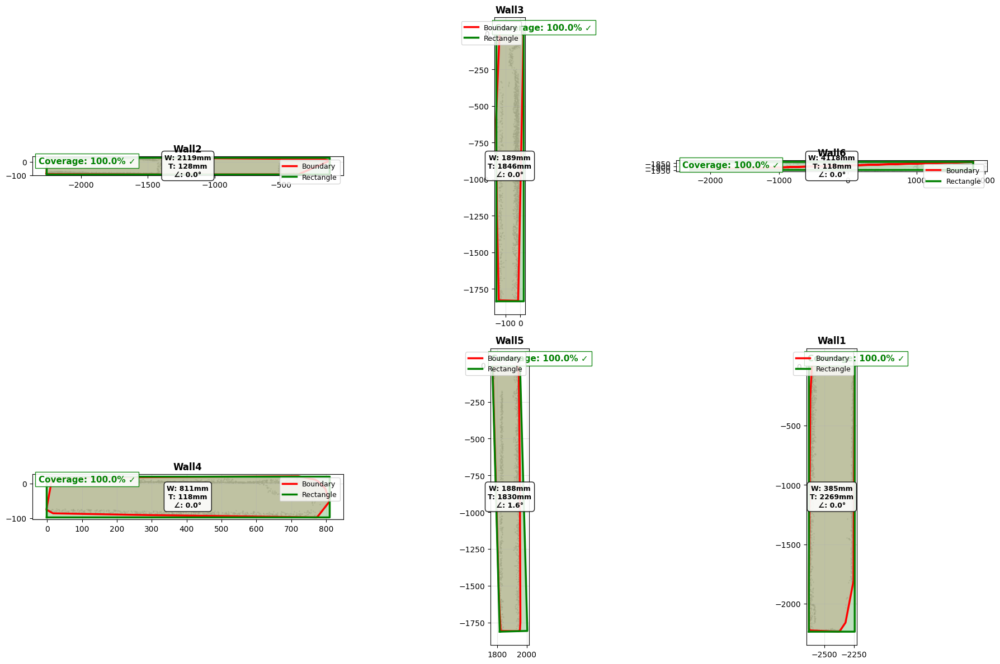


COVERAGE ANALYSIS
Target coverage: 90.0%
Walls meeting target: 6/6
Average coverage: 100.0%
Median coverage: 100.0%
Min coverage: 100.0%
Max coverage: 100.0%

Detailed results:
  ✓ Wall2: 100.0%
  ✓ Wall3: 100.0%
  ✓ Wall6: 100.0%
  ✓ Wall4: 100.0%
  ✓ Wall5: 100.0%
  ✓ Wall1: 100.0%
CPU times: total: 2.47 s
Wall time: 2.48 s


In [31]:
%%time
import numpy as np
from scipy.optimize import minimize, differential_evolution
from shapely.geometry import Polygon, box
from scipy.spatial import ConvexHull
import matplotlib.pyplot as plt
from sklearn.neighbors import LocalOutlierFactor
import time
from scipy.spatial import Delaunay

def ensure_point_format(wall_data):
    """
    Ensure point cloud data is in the correct format for processing.
    Optimized for speed.
    """
    try:
        if isinstance(wall_data, dict) and 'original_points' in wall_data:
            points = np.array(wall_data['original_points'])
        elif isinstance(wall_data, dict) and 'vertices' in wall_data:
            all_vertices = []
            for face_vertices in wall_data['vertices'].values():
                all_vertices.extend(face_vertices)
            points = np.array(all_vertices)
        else:
            points = np.array(wall_data)
        
        if points.ndim == 1:
            if len(points) % 3 == 0:
                points = points.reshape(-1, 3)
            else:
                raise ValueError("Points array cannot be reshaped to Nx3 array")
        
        if points.shape[1] < 2:
            raise ValueError("Points must have at least 2 dimensions (X,Y)")
            
        if len(points) < 3:
            raise ValueError("At least 3 points are required for boundary creation")
            
        return points
    
    except Exception as e:
        print(f"Error in point format conversion: {str(e)}")
        return np.array([])

def enhanced_outlier_removal(points, contamination=0.03, max_points=8000):
    """
    Enhanced outlier removal with better sampling and multiple passes.
    """
    if len(points) < 20:
        return points
    
    try:
        # First pass - aggressive outlier removal
        if len(points) > max_points:
            indices = np.random.choice(len(points), max_points, replace=False)
            sample_points = points[indices]
            points_2d = sample_points[:, :2]
        else:
            points_2d = points[:, :2]
            indices = np.arange(len(points))
        
        # Use more neighbors for better detection
        n_neighbors = min(20, len(points_2d) - 1)
        lof = LocalOutlierFactor(n_neighbors=n_neighbors, contamination=contamination)
        outlier_labels = lof.fit_predict(points_2d)
        
        # Apply filtering
        if len(points) > max_points:
            inlier_mask = outlier_labels == 1
            inlier_indices = indices[inlier_mask]
            filtered_points = points[inlier_indices]
        else:
            inlier_mask = outlier_labels == 1
            filtered_points = points[inlier_mask]
        
        # Second pass - statistical outlier removal based on distance from centroid
        if len(filtered_points) > 50:
            points_2d = filtered_points[:, :2]
            centroid = np.mean(points_2d, axis=0)
            distances = np.linalg.norm(points_2d - centroid, axis=1)
            threshold = np.mean(distances) + 2.5 * np.std(distances)
            distance_mask = distances <= threshold
            filtered_points = filtered_points[distance_mask]
        
        num_outliers = len(points) - len(filtered_points)
        if num_outliers > 0:
            print(f"Removed {num_outliers} outliers ({(num_outliers/len(points))*100:.1f}%)")
        
        if len(filtered_points) < 3:
            return points
            
        return filtered_points
    
    except Exception as e:
        print(f"Warning: Enhanced outlier removal failed - {str(e)}. Using original points.")
        return points

def create_concave_boundary(points_2d, alpha_factor=0.3, max_points=3000):
    """
    Create a more accurate concave boundary using alpha shapes approximation.
    """
    try:
        # Sample points if too many
        if len(points_2d) > max_points:
            # Use stratified sampling to preserve boundary structure
            hull = ConvexHull(points_2d)
            boundary_indices = set(hull.vertices)
            
            # Add random interior points
            remaining_count = max_points - len(boundary_indices)
            if remaining_count > 0:
                all_indices = set(range(len(points_2d)))
                interior_indices = all_indices - boundary_indices
                if len(interior_indices) > remaining_count:
                    sampled_interior = np.random.choice(list(interior_indices), 
                                                      remaining_count, replace=False)
                    selected_indices = list(boundary_indices) + list(sampled_interior)
                else:
                    selected_indices = list(all_indices)
            else:
                selected_indices = list(boundary_indices)
            
            points_2d = points_2d[selected_indices]
        
        # Create Delaunay triangulation
        tri = Delaunay(points_2d)
        
        # Calculate alpha (edge length threshold)
        edges = []
        for simplex in tri.simplices:
            for i in range(3):
                p1, p2 = points_2d[simplex[i]], points_2d[simplex[(i+1)%3]]
                edge_length = np.linalg.norm(p1 - p2)
                edges.append(edge_length)
        
        alpha = np.percentile(edges, 70) * alpha_factor  # Use 70th percentile
        
        # Extract boundary edges
        edge_counts = {}
        for simplex in tri.simplices:
            for i in range(3):
                p1_idx, p2_idx = simplex[i], simplex[(i+1)%3]
                p1, p2 = points_2d[p1_idx], points_2d[p2_idx]
                edge_length = np.linalg.norm(p1 - p2)
                
                if edge_length <= alpha:
                    edge = tuple(sorted([p1_idx, p2_idx]))
                    edge_counts[edge] = edge_counts.get(edge, 0) + 1
        
        # Find boundary edges (appear only once)
        boundary_edges = [edge for edge, count in edge_counts.items() if count == 1]
        
        if len(boundary_edges) < 3:
            # Fallback to convex hull
            hull = ConvexHull(points_2d)
            return Polygon(points_2d[hull.vertices])
        
        # Construct boundary polygon from edges
        # This is a simplified approach - in practice, you'd need proper edge ordering
        boundary_points = set()
        for edge in boundary_edges:
            boundary_points.update(edge)
        
        boundary_coords = points_2d[list(boundary_points)]
        hull = ConvexHull(boundary_coords)
        return Polygon(boundary_coords[hull.vertices])
        
    except Exception as e:
        print(f"Concave boundary creation failed: {str(e)}. Using convex hull.")
        hull = ConvexHull(points_2d)
        return Polygon(points_2d[hull.vertices])

def coverage_based_optimization(boundary, target_coverage=0.90, max_iterations=500):
    """
    Optimize rectangle to achieve target coverage percentage.
    """
    minx, miny, maxx, maxy = boundary.bounds
    boundary_area = boundary.area
    
    def coverage_objective(params):
        """Objective function that prioritizes coverage over area."""
        center_x, center_y, width, thickness, angle = params
        
        # Create rotated rectangle
        cos_a, sin_a = np.cos(angle), np.sin(angle)
        
        # Rectangle corners relative to center
        hw, ht = width/2, thickness/2
        corners = np.array([
            [-hw, -ht], [hw, -ht], [hw, ht], [-hw, ht]
        ])
        
        # Rotate corners
        rotated_corners = np.array([
            [cos_a * x - sin_a * y, sin_a * x + cos_a * y] 
            for x, y in corners
        ])
        
        # Translate to center position
        final_corners = rotated_corners + np.array([center_x, center_y])
        
        try:
            rectangle = Polygon(final_corners)
            if not rectangle.is_valid:
                return 1e6
            
            # Calculate intersection
            intersection = rectangle.intersection(boundary)
            if intersection.area == 0:
                return 1e6
            
            # Coverage percentage
            coverage = intersection.area / boundary_area
            
            # Penalty for going outside boundary
            if not rectangle.within(boundary):
                outside_area = rectangle.difference(boundary).area
                penalty = 1000 * outside_area / rectangle.area
            else:
                penalty = 0
            
            # Primary objective: maximize coverage
            # Secondary objective: maximize area (when coverage is similar)
            objective = -(coverage * 1000 + rectangle.area * 0.01) + penalty
            
            return objective
            
        except Exception as e:
            return 1e6
    
    # Enhanced bounds including rotation
    bounds = [
        (minx, maxx),           # center_x
        (miny, maxy),           # center_y  
        (0, maxx - minx),       # width
        (0, maxy - miny),       # thickness
        (0, np.pi/2)            # angle (0 to 90 degrees)
    ]
    
    # Strategic initial guesses with rotations
    initial_guesses = []
    
    # Different size ratios
    for width_factor in [0.95, 0.85, 0.75, 0.90]:
        for thickness_factor in [0.95, 0.85, 0.75, 0.90]:
            # Different angles
            for angle in [0, np.pi/6, np.pi/4, np.pi/3, np.pi/2]:
                initial_guesses.append([
                    (minx + maxx) / 2,
                    (miny + maxy) / 2,
                    (maxx - minx) * width_factor,
                    (maxy - miny) * thickness_factor,
                    angle
                ])
    
    # Different center positions
    for cx_factor in [0.4, 0.5, 0.6]:
        for cy_factor in [0.4, 0.5, 0.6]:
            initial_guesses.append([
                minx + (maxx - minx) * cx_factor,
                miny + (maxy - miny) * cy_factor,
                (maxx - minx) * 0.8,
                (maxy - miny) * 0.8,
                0
            ])
    
    best_result = None
    best_coverage = 0
    best_objective = float('inf')
    
    print(f"Optimizing for {target_coverage*100}% coverage...")
    
    # Phase 1: Local optimization with multiple starts
    methods = ['SLSQP', 'L-BFGS-B']
    
    for method in methods:
        for i, guess in enumerate(initial_guesses[:20]):  # Limit initial guesses
            try:
                result = minimize(coverage_objective, guess, bounds=bounds, 
                                method=method, options={'maxiter': 150})
                
                if result.success:
                    # Calculate actual coverage for this result
                    test_params = result.x
                    center_x, center_y, width, thickness, angle = test_params
                    
                    cos_a, sin_a = np.cos(angle), np.sin(angle)
                    hw, ht = width/2, thickness/2
                    corners = np.array([[-hw, -ht], [hw, -ht], [hw, ht], [-hw, ht]])
                    rotated_corners = np.array([
                        [cos_a * x - sin_a * y, sin_a * x + cos_a * y] 
                        for x, y in corners
                    ])
                    final_corners = rotated_corners + np.array([center_x, center_y])
                    
                    try:
                        test_rectangle = Polygon(final_corners)
                        if test_rectangle.is_valid:
                            intersection = test_rectangle.intersection(boundary)
                            coverage = intersection.area / boundary_area
                            
                            print(f"  Method {method}, guess {i+1}: {coverage*100:.1f}% coverage")
                            
                            if coverage >= target_coverage:
                                print(f"  ✓ Target coverage achieved: {coverage*100:.1f}%")
                                return result.x, coverage
                            
                            if coverage > best_coverage:
                                best_result = result.x
                                best_coverage = coverage
                                best_objective = result.fun
                    except:
                        continue
                        
            except Exception as e:
                continue
    
    # Phase 2: Differential evolution if target not met
    if best_coverage < target_coverage:
        print(f"  Local optimization best: {best_coverage*100:.1f}%, trying global search...")
        
        try:
            result = differential_evolution(
                coverage_objective, bounds, 
                maxiter=200, popsize=15, seed=42,
                atol=1e-6, tol=1e-6
            )
            
            if result.success:
                # Test the global result
                test_params = result.x
                center_x, center_y, width, thickness, angle = test_params
                
                cos_a, sin_a = np.cos(angle), np.sin(angle)
                hw, ht = width/2, thickness/2
                corners = np.array([[-hw, -ht], [hw, -ht], [hw, ht], [-hw, ht]])
                rotated_corners = np.array([
                    [cos_a * x - sin_a * y, sin_a * x + cos_a * y] 
                    for x, y in corners
                ])
                final_corners = rotated_corners + np.array([center_x, center_y])
                
                try:
                    test_rectangle = Polygon(final_corners)
                    if test_rectangle.is_valid:
                        intersection = test_rectangle.intersection(boundary)
                        coverage = intersection.area / boundary_area
                        
                        print(f"  Global optimization: {coverage*100:.1f}% coverage")
                        
                        if coverage > best_coverage:
                            best_result = result.x
                            best_coverage = coverage
                            
                        if coverage >= target_coverage:
                            print(f"  ✓ Target coverage achieved: {coverage*100:.1f}%")
                            return result.x, coverage
                except:
                    pass
        except Exception as e:
            print(f"  Global optimization failed: {str(e)}")
    
    # Return best result found
    if best_result is not None:
        print(f"  Best coverage achieved: {best_coverage*100:.1f}%")
        return best_result, best_coverage
    else:
        # Fallback to simple axis-aligned rectangle
        print("  Optimization failed, using fallback solution")
        fallback = [(minx + maxx) / 2, (miny + maxy) / 2, 
                   (maxx - minx) * 0.8, (maxy - miny) * 0.8, 0]
        return fallback, 0.0

def create_rotated_rectangle_polygon(params):
    """Create rotated rectangle polygon from parameters."""
    center_x, center_y, width, thickness, angle = params
    
    cos_a, sin_a = np.cos(angle), np.sin(angle)
    hw, ht = width/2, thickness/2
    
    # Rectangle corners relative to center
    corners = np.array([[-hw, -ht], [hw, -ht], [hw, ht], [-hw, ht]])
    
    # Rotate corners
    rotated_corners = np.array([
        [cos_a * x - sin_a * y, sin_a * x + cos_a * y] 
        for x, y in corners
    ])
    
    # Translate to center position
    final_corners = rotated_corners + np.array([center_x, center_y])
    
    return Polygon(final_corners)

def enhanced_visualize(ax, boundary, rectangle, points, wall_name, coverage_pct, params):
    """
    Enhanced visualization with coverage information.
    """
    # Sample points for visualization if too many
    if len(points) > 2000:
        indices = np.random.choice(len(points), 2000, replace=False)
        sample_points = points[indices]
        ax.scatter(sample_points[:, 0], sample_points[:, 1], c='lightgray', s=0.8, alpha=0.4)
    else:
        ax.scatter(points[:, 0], points[:, 1], c='lightgray', s=1.2, alpha=0.6)
    
    # Plot boundary
    x, y = boundary.exterior.xy
    ax.plot(x, y, 'red', linewidth=2.5, label='Boundary')
    ax.fill(x, y, color='red', alpha=0.15)
    
    # Plot rectangle
    x, y = rectangle.exterior.xy
    ax.plot(x, y, 'green', linewidth=2.5, label='Rectangle')
    ax.fill(x, y, color='green', alpha=0.25)
    
    # Calculate dimensions and angle
    center_x, center_y, width, thickness, angle = params
    angle_deg = np.degrees(angle)
    
    # Enhanced annotations
    center = rectangle.centroid
    ax.text(center.x, center.y, 
            f'W: {width:.0f}mm\nT: {thickness:.0f}mm\n∠: {angle_deg:.1f}°',
            ha='center', va='center', fontsize=9, weight='bold',
            bbox=dict(boxstyle='round,pad=0.4', facecolor='white', alpha=0.9))
    
    # Coverage indicator with color coding
    color = 'green' if coverage_pct >= 90 else 'orange' if coverage_pct >= 80 else 'red'
    coverage_text = f'Coverage: {coverage_pct:.1f}%'
    if coverage_pct >= 90:
        coverage_text += ' ✓'
    
    ax.text(0.02, 0.98, coverage_text, transform=ax.transAxes,
            fontsize=11, va='top', weight='bold', color=color,
            bbox=dict(facecolor='white', alpha=0.9, edgecolor=color))
    
    ax.set_title(f'{wall_name}', fontsize=12, weight='bold')
    ax.set_aspect('equal')
    ax.legend(fontsize=9, loc='upper right')
    ax.grid(True, alpha=0.3)

def find_optimal_inscribed_rectangles(wall_entities, target_coverage=0.90):
    """
    Enhanced rectangle fitting targeting specific coverage percentage.
    """
    results = {}
    fig = plt.figure(figsize=(18, 12))
    
    start_time = time.time()
    total_walls = len(wall_entities)
    print(f"Starting ENHANCED rectangle fitting for {total_walls} walls...")
    print(f"Target coverage: {target_coverage*100}%")
    
    successful_walls = 0
    
    for i, (wall_name, wall_data) in enumerate(wall_entities.items(), 1):
        wall_start = time.time()
        print(f"\n[{i}/{total_walls}] Processing {wall_name}...")
        
        ax = fig.add_subplot(2, 3, i) if i <= 6 else None
        
        try:
            # Enhanced point processing
            points = ensure_point_format(wall_data)
            if len(points) == 0:
                raise ValueError("No valid points found")
            
            # Enhanced outlier removal
            points = enhanced_outlier_removal(points, max_points=5000)
            points_2d = points[:, :2]
            
            print(f"  Processing {len(points_2d)} points...")
            
            # Enhanced boundary creation
            boundary = create_concave_boundary(points_2d, max_points=4000)
            
            # Coverage-based optimization
            rect_params, coverage = coverage_based_optimization(boundary, target_coverage)
            rectangle = create_rotated_rectangle_polygon(rect_params)
            
            # Calculate final metrics
            intersection = rectangle.intersection(boundary)
            final_coverage = (intersection.area / boundary.area) * 100
            
            # Store results
            results[wall_name] = {
                'center': (rect_params[0], rect_params[1]),
                'width': rect_params[2],
                'thickness': rect_params[3],
                'angle': rect_params[4],
                'area': rectangle.area,
                'coverage_percent': final_coverage,
                'rectangle_polygon': rectangle,
                'boundary_polygon': boundary,
                'intersection_area': intersection.area,
                'boundary_area': boundary.area
            }
            
            # Enhanced visualization
            if ax is not None:
                enhanced_visualize(ax, boundary, rectangle, points_2d, 
                                 wall_name, final_coverage, rect_params)
            
            # Print detailed results
            wall_time = time.time() - wall_start
            status = "✓ TARGET MET" if final_coverage >= target_coverage*100 else "⚠ Below target"
            
            print(f"  {wall_name} completed in {wall_time:.2f}s - {status}")
            print(f"    Center: ({rect_params[0]:.1f}, {rect_params[1]:.1f})")
            print(f"    Dimensions: {rect_params[2]:.1f} × {rect_params[3]:.1f} mm")
            print(f"    Rotation: {np.degrees(rect_params[4]):.1f}°")
            print(f"    Area: {rectangle.area:.0f} sq mm")
            print(f"    Coverage: {final_coverage:.1f}% (target: {target_coverage*100}%)")
            
            if final_coverage >= target_coverage*100:
                successful_walls += 1
            
        except Exception as e:
            print(f"  ERROR processing {wall_name}: {str(e)}")
            if ax is not None:
                ax.text(0.5, 0.5, f'Failed: {wall_name}\n{str(e)[:50]}...', 
                       ha='center', va='center', fontsize=10, color='red')
                ax.set_title(f'{wall_name} (Failed)', color='red')
    
    elapsed_time = time.time() - start_time
    success_rate = (successful_walls / total_walls) * 100
    
    print(f"\n" + "="*60)
    print(f"ENHANCED RECTANGLE FITTING COMPLETED")
    print(f"="*60)
    print(f"Total time: {elapsed_time:.2f} seconds")
    print(f"Average per wall: {elapsed_time/total_walls:.2f} seconds") 
    print(f"Success rate: {successful_walls}/{total_walls} ({success_rate:.1f}%)")
    print(f"Target coverage ({target_coverage*100}%) achieved for {successful_walls} walls")
    
    plt.tight_layout()
    plt.show()
    return results

def analyze_coverage_results(rectangle_results, target_coverage=0.90):
    """Analyze and summarize coverage results."""
    if not rectangle_results:
        return
    
    coverages = [params['coverage_percent'] for params in rectangle_results.values()]
    
    print(f"\n" + "="*50)
    print(f"COVERAGE ANALYSIS")
    print(f"="*50)
    print(f"Target coverage: {target_coverage*100}%")
    print(f"Walls meeting target: {sum(1 for c in coverages if c >= target_coverage*100)}/{len(coverages)}")
    print(f"Average coverage: {np.mean(coverages):.1f}%")
    print(f"Median coverage: {np.median(coverages):.1f}%")
    print(f"Min coverage: {np.min(coverages):.1f}%")
    print(f"Max coverage: {np.max(coverages):.1f}%")
    
    # Detailed breakdown
    print(f"\nDetailed results:")
    for wall_name, params in rectangle_results.items():
        coverage = params['coverage_percent']
        status = "✓" if coverage >= target_coverage*100 else "✗"
        print(f"  {status} {wall_name}: {coverage:.1f}%")

# Main execution
if 'wall_entities' in globals() and isinstance(wall_entities, dict) and len(wall_entities) > 0:
    # Run enhanced optimization targeting 90% coverage
    rectangle_results = find_optimal_inscribed_rectangles(wall_entities, target_coverage=0.90)
    
    # Analyze results
    analyze_coverage_results(rectangle_results, target_coverage=0.90)
    
else:
    print("wall_entities not found. Please ensure wall data is loaded first.")
    print("Expected format: wall_entities = {'wall_name': wall_data, ...}")

In [32]:
# Comparitive Study Least Retangular


Wall2 Enlarged Rectangle Results:
Width: 2119.24 mm
Thickness: 128.48 mm
Area: 272282.90 sq mm
Wall orientation: Horizontal

Wall3 Enlarged Rectangle Results:
Width: 188.83 mm
Thickness: 1845.99 mm
Area: 348573.59 sq mm
Wall orientation: Vertical

Wall6 Enlarged Rectangle Results:
Width: 4118.03 mm
Thickness: 118.25 mm
Area: 486957.44 sq mm
Wall orientation: Horizontal

Wall4 Enlarged Rectangle Results:
Width: 811.40 mm
Thickness: 118.44 mm
Area: 96098.87 sq mm
Wall orientation: Horizontal

Wall5 Enlarged Rectangle Results:
Width: 187.62 mm
Thickness: 1830.11 mm
Area: 343364.13 sq mm
Wall orientation: Vertical

Wall1 Enlarged Rectangle Results:
Width: 384.98 mm
Thickness: 2268.87 mm
Area: 873464.44 sq mm
Wall orientation: Vertical


<timed exec>:209: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index


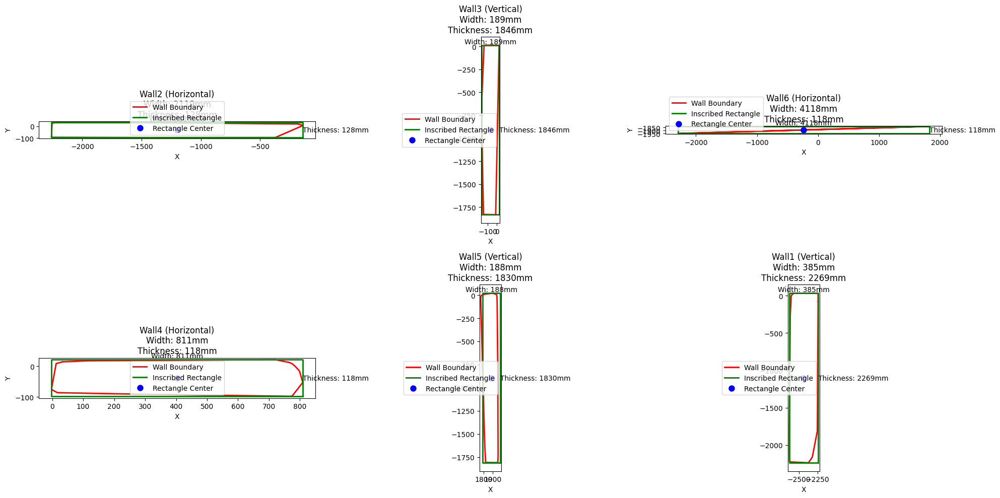

CPU times: total: 938 ms
Wall time: 961 ms


In [33]:
%%time
import numpy as np
from scipy.optimize import minimize
from shapely.geometry import Polygon, box
from shapely.affinity import translate
from scipy.spatial import ConvexHull
import matplotlib.pyplot as plt

def ensure_point_format(wall_data):
    """
    Ensure point cloud data is in the correct format for processing.
    """
    if isinstance(wall_data, dict) and 'original_points' in wall_data:
        points = np.array(wall_data['original_points'])
    elif isinstance(wall_data, dict) and 'vertices' in wall_data:
        all_vertices = []
        for face_vertices in wall_data['vertices'].values():
            all_vertices.extend(face_vertices)
        points = np.array(all_vertices)
    else:
        points = np.array(wall_data)
    
    if points.ndim == 1:
        if len(points) % 3 == 0:
            points = points.reshape(-1, 3)
        else:
            raise ValueError("Points array cannot be reshaped to Nx3 array")
            
    return points

def optimize_inscribed_rectangle(boundary):
    """
    Optimize to find the largest inscribed rectangle within the boundary without rotation.
    """
    minx, miny, maxx, maxy = boundary.bounds
    
    def objective(params):
        rectangle = create_rectangle_polygon(params)
        if not rectangle.within(boundary):
            return 1e6
        return -rectangle.area
    
    # Parameters: [center_x, center_y, width, Thickness]
    initial_guess = [
        (minx + maxx) / 2,  # center_x
        (miny + maxy) / 2,  # center_y
        (maxx - minx) * 0.8,  # initial width
        (maxy - miny) * 0.8   # initial Thickness
    ]
    
    bounds = [
        (minx, maxx),  # center_x bounds
        (miny, maxy),  # center_y bounds
        (0, maxx - minx),  # width bounds
        (0, maxy - miny)   # Thickness bounds
    ]
    
    result = minimize(objective, initial_guess, bounds=bounds, method='SLSQP')
    return result.x

def create_rectangle_polygon(params):
    """
    Create a rectangle polygon from parameters without rotation.
    """
    center_x, center_y, width, Thickness = params
    rectangle = box(
        center_x - width/2,
        center_y - Thickness/2,
        center_x + width/2,
        center_y + Thickness/2
    )
    return rectangle

def visualize_boundary_and_rectangle(ax, boundary, rectangle, points, title):
    """
    Visualize the wall boundary and inscribed rectangle.
    """
    ax.scatter(points[:, 0], points[:, 1], c='gray', s=1, alpha=0.1)
    
    x, y = boundary.exterior.xy
    ax.plot(x, y, 'r-', linewidth=2, label='Wall Boundary')
    
    x, y = rectangle.exterior.xy
    ax.plot(x, y, 'g-', linewidth=2, label='Inscribed Rectangle')
    
    center = rectangle.centroid
    ax.plot(center.x, center.y, 'bo', markersize=8, label='Rectangle Center')
    
    dims = rectangle.bounds
    width = dims[2] - dims[0]
    Thickness = dims[3] - dims[1]
    ax.text(center.x, center.y + Thickness/2, f'Width: {width:.0f}mm',
            horizontalalignment='center', verticalalignment='bottom')
    ax.text(center.x + width/2, center.y, f'Thickness: {Thickness:.0f}mm',
            horizontalalignment='left', verticalalignment='center')
    
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_aspect('equal', 'box')
    ax.legend()

def find_largest_inscribed_rectangle(wall_entities):
    """
    Find the largest inscribed rectangle within each wall boundary.
    """
    results = {}
    fig = plt.figure(figsize=(20, 10))
    
    for i, (wall_name, wall_data) in enumerate(wall_entities.items(), 1):
        print(f"\nProcessing {wall_name}...")
        ax = fig.add_subplot(2, 3, i)
        
        try:
            points = ensure_point_format(wall_data)
            points_2d = points[:, :2]
            hull = ConvexHull(points_2d)
            boundary = Polygon(points_2d[hull.vertices])
            
            rect_params = optimize_inscribed_rectangle(boundary)
            rectangle = create_rectangle_polygon(rect_params)
            
            results[wall_name] = {
                'center': (rect_params[0], rect_params[1]),
                'width': rect_params[2],
                'Thickness': rect_params[3],
                'area': rectangle.area,
                'rectangle_polygon': rectangle,
                'boundary_polygon': boundary
            }
            
            title = f"{wall_name}\nWidth: {rect_params[2]:.0f}mm\nThickness: {rect_params[3]:.0f}mm"
            visualize_boundary_and_rectangle(ax, boundary, rectangle, points_2d, title)
            
            print(f"{wall_name} Rectangle Fit Results:")
            print(f"Center: ({rect_params[0]:.2f}, {rect_params[1]:.2f})")
            print(f"Width: {rect_params[2]:.2f} mm")
            print(f"Thickness: {rect_params[3]:.2f} mm")
            print(f"Area: {rectangle.area:.2f} sq mm")
            print(f"Boundary Area: {boundary.area:.2f} sq mm")
            print(f"Area Ratio: {(rectangle.area/boundary.area*100):.2f}%")
            
        except Exception as e:
            print(f"Error processing {wall_name}: {str(e)}")
            ax.text(0.5, 0.5, f'Failed to process {wall_name}\n{str(e)}',
                   horizontalalignment='center', verticalalignment='center')
            ax.set_title(f'{wall_name} (Failed)')
    
    plt.tight_layout()
    plt.show()
    return results

def process_enlarged_rectangles(rectangle_results):
    """
    Process and enlarge rectangles based on the wall orientation.
    """
    if rectangle_results is None:
        return
        
    for wall_name, params in rectangle_results.items():
        try:
            boundary = params['boundary_polygon']
            minx, miny, maxx, maxy = boundary.bounds
            width = params['width']
            thickness = params['thickness']  # Match first code's lowercase usage
            
            # Determine primary dimension and enlarge to bounds
            is_horizontal = width > thickness
            
            if is_horizontal:
                # Extend width to full length
                params['width'] = maxx - minx
            else:
                # Extend thickness to full length
                params['thickness'] = maxy - miny
                
            # Update rectangle with new dimensions
            new_params = [
                params['center'][0],
                params['center'][1],
                params['width'],
                params['thickness']  # Match first code's lowercase usage
            ]
            new_rectangle = create_rectangle_polygon(new_params)
            params['rectangle_polygon'] = new_rectangle
            params['area'] = new_rectangle.area
            
            print(f"\n{wall_name} Enlarged Rectangle Results:")
            print(f"Width: {params['width']:.2f} mm")
            print(f"Thickness: {params['thickness']:.2f} mm")
            print(f"Area: {params['area']:.2f} sq mm")
            print(f"Wall orientation: {'Horizontal' if is_horizontal else 'Vertical'}")
            
        except Exception as e:
            print(f"Error enlarging {wall_name}: {str(e)}")

def visualize_enlarged_results(rectangle_results):
    """
    Visualize the enlarged rectangles.
    """
    if rectangle_results:
        fig = plt.figure(figsize=(20, 10))
        for i, (wall_name, params) in enumerate(rectangle_results.items(), 1):
            try:
                ax = fig.add_subplot(2, 3, i)
                boundary = params['boundary_polygon']
                rectangle = params['rectangle_polygon']
                points = np.array(list(boundary.exterior.coords))
                is_horizontal = params['width'] > params['thickness']  # Match first code's lowercase usage
                title = f'{wall_name} ({["Vertical", "Horizontal"][is_horizontal]})\n' \
                       f'Width: {params["width"]:.0f}mm\n' \
                       f'Thickness: {params["thickness"]:.0f}mm'  # Match first code's lowercase usage
                visualize_boundary_and_rectangle(ax, boundary, rectangle, points, title)
            except Exception as e:
                print(f"Error visualizing enlarged {wall_name}: {str(e)}")
        plt.tight_layout()
        plt.show()

# Execute second cell
if 'rectangle_results' in globals():
    # Process enlargements
    process_enlarged_rectangles(rectangle_results)
    
    # Visualize final results
    visualize_enlarged_results(rectangle_results)
else:
    print("Please run the first cell to generate rectangle_results before running this cell.")


Wall2 Wall Solid Results:
Width: 2119.24 mm
Thickness: 128.48 mm
Height: 2267.30 mm
Volume: 617347924.01 cubic mm


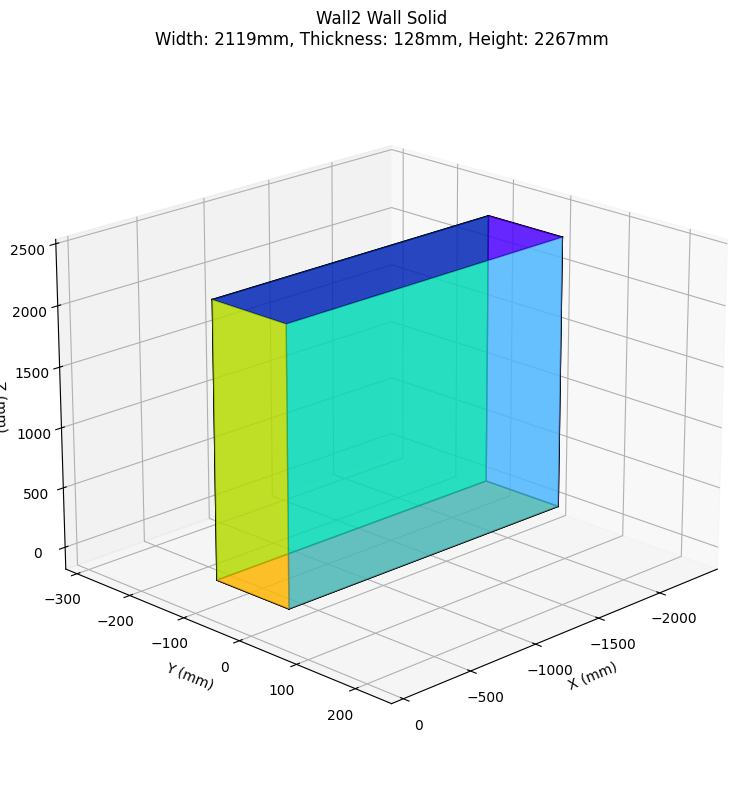


Wall3 Wall Solid Results:
Width: 188.83 mm
Thickness: 1845.99 mm
Height: 2469.41 mm
Volume: 860771290.95 cubic mm


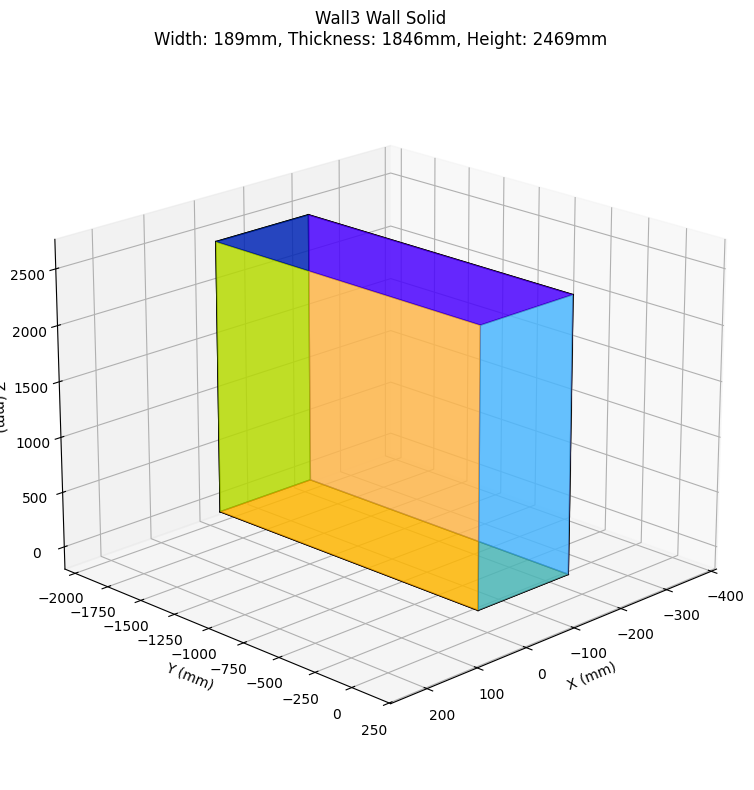


Wall6 Wall Solid Results:
Width: 4118.03 mm
Thickness: 118.25 mm
Height: 2359.51 mm
Volume: 1148981256.17 cubic mm


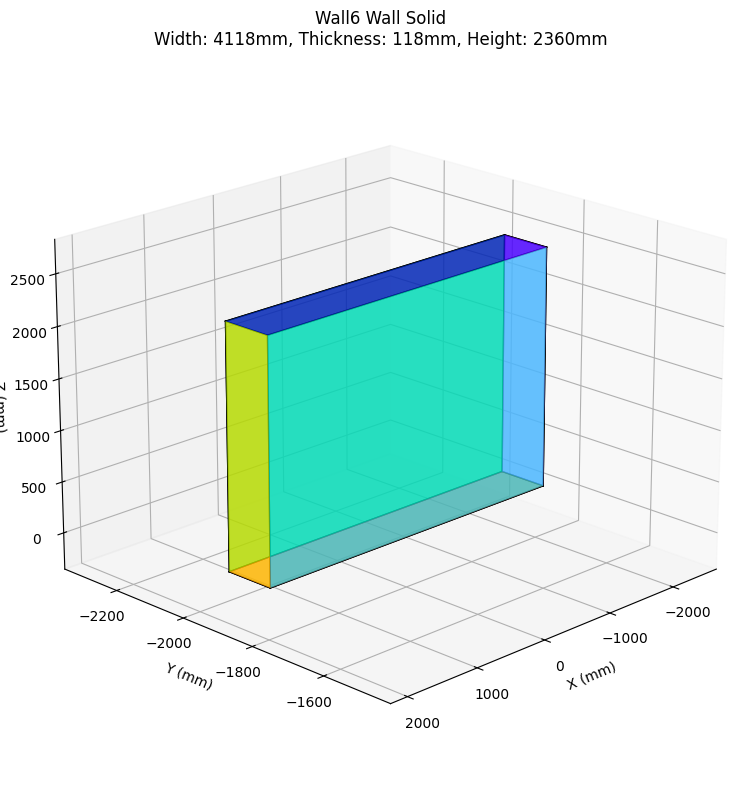


Wall4 Wall Solid Results:
Width: 811.40 mm
Thickness: 118.44 mm
Height: 2252.87 mm
Volume: 216498347.93 cubic mm


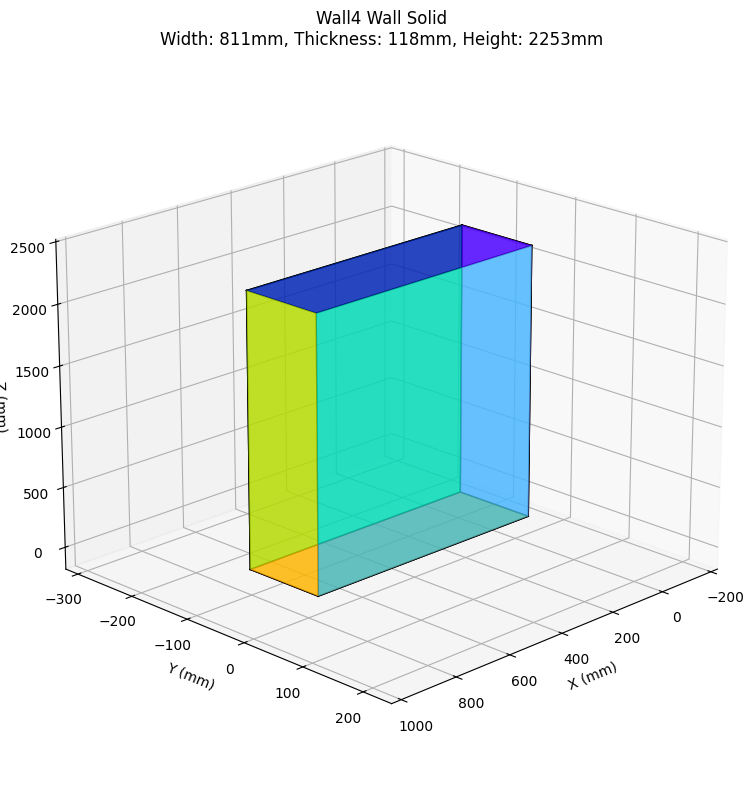


Wall5 Wall Solid Results:
Width: 187.62 mm
Thickness: 1830.11 mm
Height: 2469.54 mm
Volume: 847949901.94 cubic mm


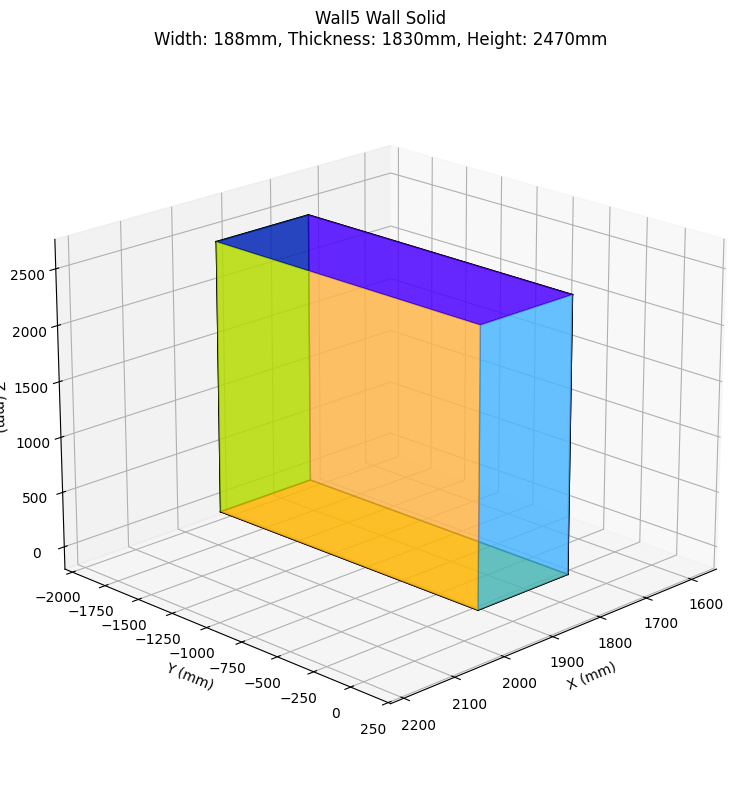


Wall1 Wall Solid Results:
Width: 384.98 mm
Thickness: 2268.87 mm
Height: 2401.42 mm
Volume: 2097555109.54 cubic mm


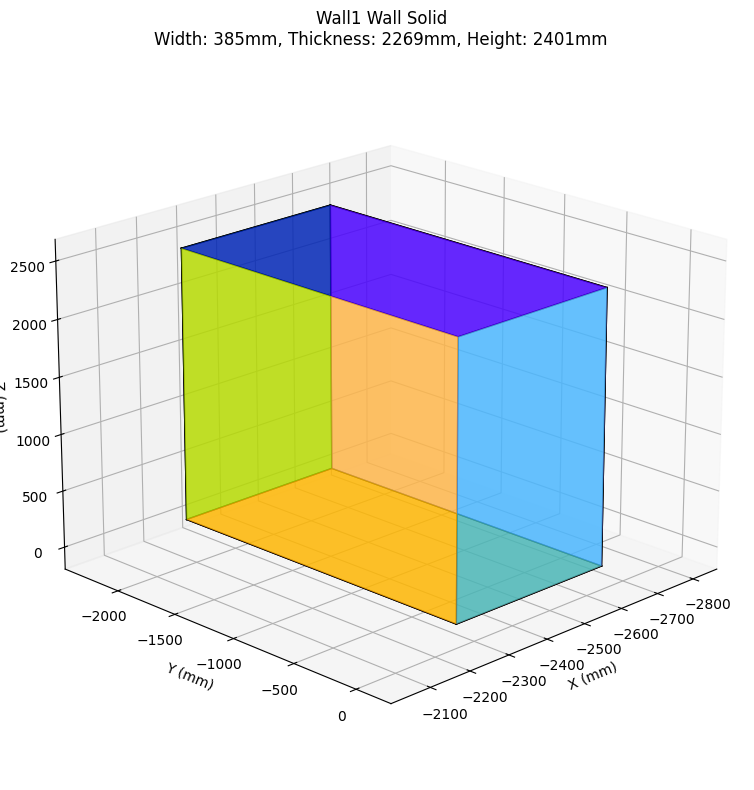

CPU times: total: 1.27 s
Wall time: 1.24 s


In [43]:
%%time
import numpy as np
from scipy.optimize import minimize
from shapely.geometry import Polygon, box
from shapely.affinity import translate
from scipy.spatial import ConvexHull
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.mplot3d.art3d import Poly3DCollection

def ensure_point_format(wall_data):
    """
    Ensure point cloud data is in the correct format for processing.
    """
    if isinstance(wall_data, dict) and 'original_points' in wall_data:
        points = np.array(wall_data['original_points'])
    elif isinstance(wall_data, dict) and 'vertices' in wall_data:
        all_vertices = []
        for face_vertices in wall_data['vertices'].values():
            all_vertices.extend(face_vertices)
        points = np.array(all_vertices)
    else:
        points = np.array(wall_data)
    
    if points.ndim == 1:
        if len(points) % 3 == 0:
            points = points.reshape(-1, 3)
        else:
            raise ValueError("Points array cannot be reshaped to Nx3 array")
            
    return points

def create_wall_solid(params, z_min, z_max):
    """
    Create wall solid vertices and faces based on rectangular profile and height.
    """
    center_x, center_y = params['center']
    width = params['width']
    thickness = params['thickness']
    height = z_max - z_min
    
    # Create vertices for the wall solid (8 vertices)
    vertices = np.array([
        # Bottom face vertices (0-3)
        [center_x - width/2, center_y - thickness/2, z_min],
        [center_x + width/2, center_y - thickness/2, z_min],
        [center_x + width/2, center_y + thickness/2, z_min],
        [center_x - width/2, center_y + thickness/2, z_min],
        # Top face vertices (4-7)
        [center_x - width/2, center_y - thickness/2, z_max],
        [center_x + width/2, center_y - thickness/2, z_max],
        [center_x + width/2, center_y + thickness/2, z_max],
        [center_x - width/2, center_y + thickness/2, z_max]
    ])
    
    # Define faces using vertex indices
    faces = {
        'bottom': [0, 1, 2, 3],  # Bottom face
        'top': [4, 5, 6, 7],     # Top face
        'front': [0, 1, 5, 4],   # Front face
        'right': [1, 2, 6, 5],   # Right face
        'back': [2, 3, 7, 6],    # Back face
        'left': [3, 0, 4, 7]     # Left face
    }
    
    wall_solid = {
        'vertices': vertices,
        'faces': faces,
        'dimensions': {
            'width': width,
            'thickness': thickness,
            'height': height
        },
        'bounds': {
            'x': [center_x - width/2, center_x + width/2],
            'y': [center_y - thickness/2, center_y + thickness/2],
            'z': [z_min, z_max]
        }
    }
    
    return wall_solid

def visualize_wall_solid(wall_solid, wall_name):
    """
    Visualize the wall solid in 3D using Poly3DCollection.
    """
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    vertices = wall_solid['vertices']
    faces = wall_solid['faces']
    
    # Create face polygons for Poly3DCollection
    polygons = []
    face_colors = []
    colors = ['red', 'blue', 'green', 'yellow', 'cyan', 'magenta']
    
    for (face_name, face_vertices), color in zip(faces.items(), colors):
        # Get vertices for this face
        face_coords = vertices[face_vertices]
        polygons.append(face_coords)
        face_colors.append(color)
    
    # Create Poly3DCollection and add to plot
    poly3d = Poly3DCollection(polygons, alpha=0.6)
    poly3d.set_facecolor(face_colors)
    ax.add_collection3d(poly3d)
    
    # Plot edges
    for face_vertices in faces.values():
        for i in range(len(face_vertices)):
            j = (i + 1) % len(face_vertices)
            v1 = vertices[face_vertices[i]]
            v2 = vertices[face_vertices[j]]
            ax.plot([v1[0], v2[0]], [v1[1], v2[1]], [v1[2], v2[2]], 'k-', linewidth=1)
    
    # Set axis limits based on vertices
    x_min, y_min, z_min = np.min(vertices, axis=0)
    x_max, y_max, z_max = np.max(vertices, axis=0)
    
    # Add some padding to the limits
    padding = max(wall_solid['dimensions']['width'], 
                 wall_solid['dimensions']['thickness'], 
                 wall_solid['dimensions']['height']) * 0.1
    
    ax.set_xlim([x_min - padding, x_max + padding])
    ax.set_ylim([y_min - padding, y_max + padding])
    ax.set_zlim([z_min - padding, z_max + padding])
    
    # Set labels and title
    ax.set_xlabel('X (mm)')
    ax.set_ylabel('Y (mm)')
    ax.set_zlabel('Z (mm)')
    ax.set_title(f'{wall_name} Wall Solid\n'
                f'Width: {wall_solid["dimensions"]["width"]:.0f}mm, '
                f'Thickness: {wall_solid["dimensions"]["thickness"]:.0f}mm, '
                f'Height: {wall_solid["dimensions"]["height"]:.0f}mm')
    
    # Add some default viewing angles
    ax.view_init(elev=20, azim=45)
    
    plt.tight_layout()
    plt.show()

def process_wall_solids(rectangle_results, wall_entities):
    """
    Process wall entities and create wall solids.
    """
    wall_solids = {}
    
    for wall_name, params in rectangle_results.items():
        try:
            # Get original points to determine z bounds
            points = ensure_point_format(wall_entities[wall_name])
            z_min = np.min(points[:, 2])
            z_max = np.max(points[:, 2])
            
            # Create wall solid
            wall_solid = create_wall_solid(params, z_min, z_max)
            wall_solids[wall_name] = wall_solid
            
            # Print results
            print(f"\n{wall_name} Wall Solid Results:")
            print(f"Width: {wall_solid['dimensions']['width']:.2f} mm")
            print(f"Thickness: {wall_solid['dimensions']['thickness']:.2f} mm")
            print(f"Height: {wall_solid['dimensions']['height']:.2f} mm")
            print(f"Volume: {wall_solid['dimensions']['width'] * wall_solid['dimensions']['thickness'] * wall_solid['dimensions']['height']:.2f} cubic mm")
            
            # Visualize wall solid
            visualize_wall_solid(wall_solid, wall_name)
            
        except Exception as e:
            print(f"Error processing {wall_name} wall solid: {str(e)}")
    
    return wall_solids

# Execute wall solid creation
if 'rectangle_results' in globals() and 'wall_entities' in globals():
    wall_solids = process_wall_solids(rectangle_results, wall_entities)
else:
    print("Please run the previous cells to generate rectangle_results and ensure wall_entities is available.")


Wall2 Wall Solid Results:
Width: 2119.24 mm
Thickness: 128.48 mm
Height: 2267.30 mm
Volume: 617347924.01 cubic mm

Wall3 Wall Solid Results:
Width: 188.83 mm
Thickness: 1845.99 mm
Height: 2469.41 mm
Volume: 860771290.95 cubic mm

Wall6 Wall Solid Results:
Width: 4118.03 mm
Thickness: 118.25 mm
Height: 2359.51 mm
Volume: 1148981256.17 cubic mm

Wall4 Wall Solid Results:
Width: 811.40 mm
Thickness: 118.44 mm
Height: 2252.87 mm
Volume: 216498347.93 cubic mm

Wall5 Wall Solid Results:
Width: 187.62 mm
Thickness: 1830.11 mm
Height: 2469.54 mm
Volume: 847949901.94 cubic mm

Wall1 Wall Solid Results:
Width: 384.98 mm
Thickness: 2268.87 mm
Height: 2401.42 mm
Volume: 2097555109.54 cubic mm


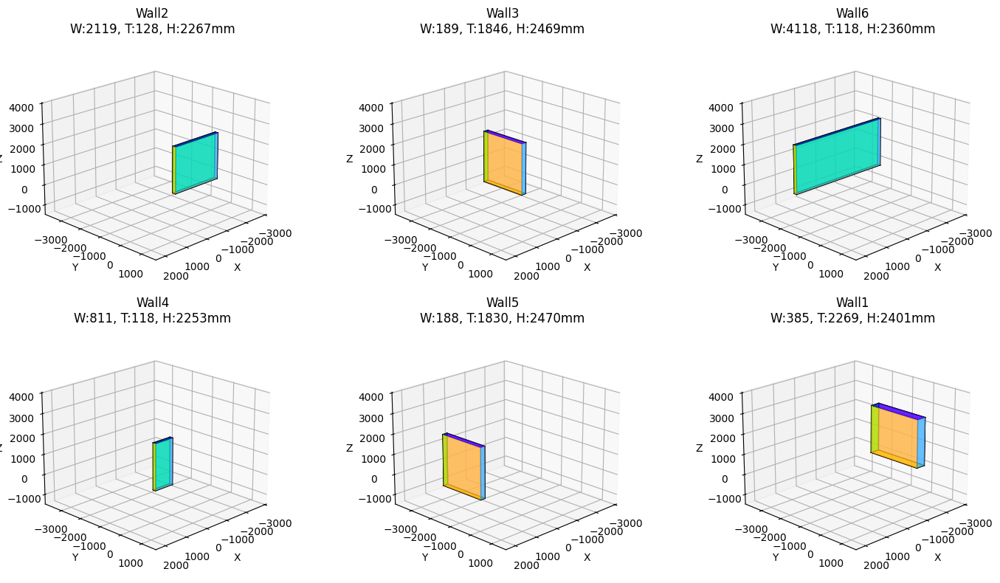

CPU times: total: 1.08 s
Wall time: 1.08 s


In [44]:
%%time
def create_wall_solid(params, points):
    """
    Create wall solid vertices and faces using geometric height estimation
    """
    try:
        # Get and validate points
        points = ensure_point_format(points)
        if len(points) < 3:
            raise ValueError(f"Insufficient points: {len(points)} (minimum 3 required)")

        center_x, center_y = params['center']
        width = params['width']
        thickness = params['thickness']
        
        # Calculate height using geometric method
        try:
            height, vertical_dir = extract_wall_height_geometric(points)
        except Exception as e:
            print(f"Warning: Using simple height calculation due to: {str(e)}")
            height = np.max(points[:, 2]) - np.min(points[:, 2])
            vertical_dir = np.array([0, 0, 1])
        
        # Get the z bounds
        z_min = np.min(points[:, 2])
        z_max = z_min + height
        
        # Create vertices for the wall solid
        vertices = np.array([
            # Bottom face vertices (0-3)
            [center_x - width/2, center_y - thickness/2, z_min],
            [center_x + width/2, center_y - thickness/2, z_min],
            [center_x + width/2, center_y + thickness/2, z_min],
            [center_x - width/2, center_y + thickness/2, z_min],
            # Top face vertices (4-7)
            [center_x - width/2, center_y - thickness/2, z_max],
            [center_x + width/2, center_y - thickness/2, z_max],
            [center_x + width/2, center_y + thickness/2, z_max],
            [center_x - width/2, center_y + thickness/2, z_max]
        ])
        
        # Define faces
        faces = {
            'bottom': [0, 1, 2, 3],
            'top': [4, 5, 6, 7],
            'front': [0, 1, 5, 4],
            'right': [1, 2, 6, 5],
            'back': [2, 3, 7, 6],
            'left': [3, 0, 4, 7]
        }
        
        return {
            'vertices': vertices,
            'faces': faces,
            'dimensions': {
                'width': width,
                'thickness': thickness,
                'height': height
            },
            'bounds': {
                'x': [center_x - width/2, center_x + width/2],
                'y': [center_y - thickness/2, center_y + thickness/2],
                'z': [z_min, z_max]
            },
            'vertical_dir': vertical_dir
        }
        
    except Exception as e:
        raise ValueError(f"Error creating wall solid: {str(e)}")

def visualize_wall_solid(ax, wall_solid, wall_name):
    """
    Visualize the wall solid in 3D using Poly3DCollection with consistent scale
    """
    vertices = wall_solid['vertices']
    faces = wall_solid['faces']
    
    # Create face polygons for Poly3DCollection
    polygons = []
    face_colors = []
    colors = ['red', 'blue', 'green', 'yellow', 'cyan', 'magenta']
    
    for (face_name, face_vertices), color in zip(faces.items(), colors):
        face_coords = vertices[face_vertices]
        polygons.append(face_coords)
        face_colors.append(color)
    
    # Create Poly3DCollection and add to plot
    poly3d = Poly3DCollection(polygons, alpha=0.6)
    poly3d.set_facecolor(face_colors)
    ax.add_collection3d(poly3d)
    
    # Plot edges
    for face_vertices in faces.values():
        for i in range(len(face_vertices)):
            j = (i + 1) % len(face_vertices)
            v1 = vertices[face_vertices[i]]
            v2 = vertices[face_vertices[j]]
            ax.plot([v1[0], v2[0]], [v1[1], v2[1]], [v1[2], v2[2]], 
                   'k-', linewidth=1)
    
    # Set title with dimensions
    ax.set_title(f'{wall_name}\n'
                f'W:{wall_solid["dimensions"]["width"]:.0f}, '
                f'T:{wall_solid["dimensions"]["thickness"]:.0f}, '
                f'H:{wall_solid["dimensions"]["height"]:.0f}mm')
    
    return vertices

def process_wall_solids(rectangle_results, wall_entities):
    """
    Process wall entities and create wall solids with consistent visualization
    """
    wall_solids = {}
    all_vertices = []
    
    # Create figure
    fig = plt.figure(figsize=(15, 8))
    
    # First pass: create wall solids and collect vertices
    for wall_name, params in rectangle_results.items():
        try:
            if wall_name not in wall_entities:
                print(f"Warning: No data found for {wall_name}")
                continue
                
            points = ensure_point_format(wall_entities[wall_name])
            if len(points) < 3:
                print(f"Warning: Insufficient points for {wall_name}")
                continue
            
            # Create wall solid
            wall_solid = create_wall_solid(params, points)
            wall_solids[wall_name] = wall_solid
            all_vertices.extend(wall_solid['vertices'])
            
        except Exception as e:
            print(f"Error processing {wall_name}: {str(e)}")
            continue
    
    if not wall_solids:
        print("No valid wall solids created")
        return {}
    
    # Calculate global limits
    all_vertices = np.array(all_vertices)
    global_min = np.min(all_vertices, axis=0)
    global_max = np.max(all_vertices, axis=0)
    ranges = global_max - global_min
    max_range = np.max(ranges)
    padding = max_range * 0.1
    
    # Second pass: visualize with consistent scale
    for i, (wall_name, wall_solid) in enumerate(wall_solids.items(), 1):
        ax = fig.add_subplot(2, 3, i, projection='3d')
        
        # Visualize wall
        vertices = visualize_wall_solid(ax, wall_solid, wall_name)
        
        # Set consistent axis limits
        centers = (global_max + global_min) / 2
        for axis, center in zip(['x', 'y', 'z'], centers):
            getattr(ax, f'set_{axis}lim')(
                [center - max_range/2 - padding, 
                 center + max_range/2 + padding]
            )
        
        # Set labels
        ax.set_xlabel('X')
        ax.set_ylabel('Y')
        ax.set_zlabel('Z')
        ax.view_init(elev=20, azim=45)
        
        # Print results
        print(f"\n{wall_name} Wall Solid Results:")
        print(f"Width: {wall_solid['dimensions']['width']:.2f} mm")
        print(f"Thickness: {wall_solid['dimensions']['thickness']:.2f} mm")
        print(f"Height: {wall_solid['dimensions']['height']:.2f} mm")
        print(f"Volume: {wall_solid['dimensions']['width'] * wall_solid['dimensions']['thickness'] * wall_solid['dimensions']['height']:.2f} cubic mm")
    
    plt.tight_layout()
    plt.show()
    
    return wall_solids

# Execute wall solid creation
if 'rectangle_results' in globals() and 'wall_entities' in globals():
    wall_solids = process_wall_solids(rectangle_results, wall_entities)
else:
    print("Please run the previous cells to generate rectangle_results and ensure wall_entities is available.")


Wall Dimensions Summary:
Wall Name   Width(mm)   Thickness(mm)   Height(mm)    Volume(mm³)
-----------------------------------------------------------------
Wall2           2119           128        2267     617347924
Wall3            189          1846        2469     860771291
Wall6           4118           118        2360    1148981256
Wall4            811           118        2253     216498348
Wall5            188          1830        2470     847949902
Wall1            385          2269        2401    2097555110


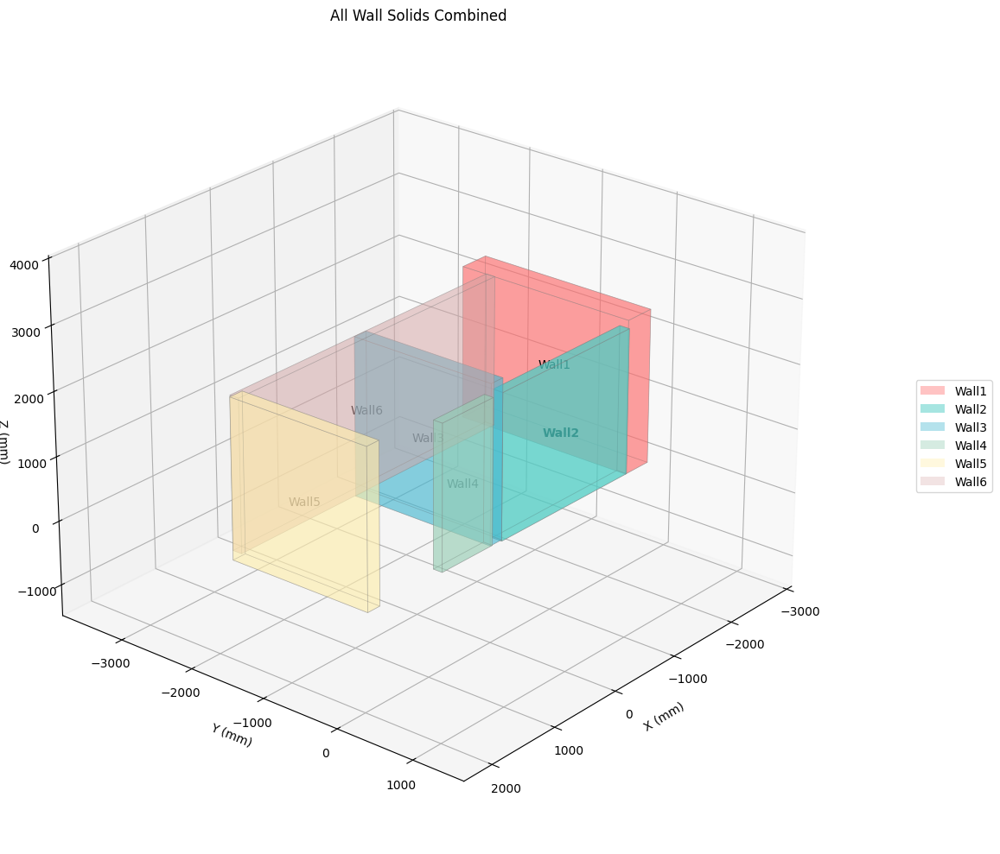

In [45]:
def visualize_all_walls_together(wall_solids):
    """
    Visualize all wall solids together in a single 3D plot with improved visibility
    and depth handling.
    """
    fig = plt.figure(figsize=(12, 10))
    ax = fig.add_subplot(111, projection='3d')
    
    # Define distinct colors for each wall with adjusted alpha values
    wall_colors = {
        'Wall1': ('#FF6B6B', 0.4),  # Red
        'Wall2': ('#4ECDC4', 0.5),  # Turquoise (more opaque)
        'Wall3': ('#45B7D1', 0.4),  # Blue
        'Wall4': ('#96CEB4', 0.4),  # Green
        'Wall5': ('#FFEEAD', 0.4),  # Yellow
        'Wall6': ('#D4A5A5', 0.3)   # Pink (more transparent)
    }
    
    # Collect all vertices for global scaling
    all_vertices = []
    for wall_solid in wall_solids.values():
        all_vertices.extend(wall_solid['vertices'])
    all_vertices = np.array(all_vertices)
    
    # Calculate global limits
    global_min = np.min(all_vertices, axis=0)
    global_max = np.max(all_vertices, axis=0)
    ranges = global_max - global_min
    max_range = np.max(ranges)
    padding = max_range * 0.1
    
    # Calculate wall centers for depth sorting
    wall_centers = {}
    for wall_name, wall_solid in wall_solids.items():
        vertices = np.array(wall_solid['vertices'])
        center = np.mean(vertices, axis=0)
        wall_centers[wall_name] = center
    
    # Sort walls by distance from viewpoint (assuming default view angle)
    view_point = np.array([1, 1, 0.5])  # Adjusted for better perspective
    wall_distances = {
        wall_name: np.dot(center - view_point, view_point)
        for wall_name, center in wall_centers.items()
    }
    sorted_walls = sorted(wall_distances.items(), key=lambda x: x[1], reverse=True)
    
    # Plot walls in order from farthest to nearest
    for wall_name, _ in sorted_walls:
        wall_solid = wall_solids[wall_name]
        vertices = wall_solid['vertices']
        faces = wall_solid['faces']
        
        # Create polygons for this wall
        polygons = []
        for face_vertices in faces.values():
            face_coords = vertices[face_vertices]
            polygons.append(face_coords)
        
        # Create Poly3DCollection with adjusted transparency
        poly3d = Poly3DCollection(polygons)
        color, alpha = wall_colors[wall_name]
        poly3d.set_facecolor(color)
        poly3d.set_alpha(alpha)
        
        # Add enhanced edge visibility for Wall2
        if wall_name == 'Wall2':
            poly3d.set_edgecolor('gray')
            poly3d.set_linewidth(0.5)
        else:
            poly3d.set_edgecolor('gray')
            poly3d.set_linewidth(0.5)
            
        ax.add_collection3d(poly3d)
        
        # Add text label for the wall with adjusted position
        center = wall_centers[wall_name]
        ax.text(center[0], center[1], center[2], 
                wall_name, 
                horizontalalignment='center',
                verticalalignment='center',
                fontweight='bold' if wall_name == 'Wall2' else 'normal')
    
    # Set consistent axis limits
    centers = (global_max + global_min) / 2
    for axis, center in zip(['x', 'y', 'z'], centers):
        getattr(ax, f'set_{axis}lim')(
            [center - max_range/2 - padding, 
             center + max_range/2 + padding]
        )
    
    # Add labels and title
    ax.set_xlabel('X (mm)')
    ax.set_ylabel('Y (mm)')
    ax.set_zlabel('Z (mm)')
    ax.set_title('All Wall Solids Combined')
    
    # Add legend with transparency information
    legend_elements = [plt.Rectangle((0, 0), 1, 1, fc=color, alpha=alpha) 
                      for color, alpha in wall_colors.values()]
    ax.legend(legend_elements, wall_colors.keys(), 
             loc='center left', bbox_to_anchor=(1.1, 0.5))
    
    # Set optimized viewing angle for better Wall2 visibility
    ax.view_init(elev=25, azim=40)
    
    # Adjust layout to prevent legend cutoff
    plt.tight_layout()
    plt.subplots_adjust(right=0.85)
    
    # Print dimensions for all walls
    print("\nWall Dimensions Summary:")
    print("Wall Name   Width(mm)   Thickness(mm)   Height(mm)    Volume(mm³)")
    print("-" * 65)
    for wall_name, wall_solid in wall_solids.items():
        dims = wall_solid['dimensions']
        volume = dims['width'] * dims['thickness'] * dims['height']
        print(f"{wall_name:<10} {dims['width']:>9.0f} {dims['thickness']:>13.0f} "
              f"{dims['height']:>11.0f} {volume:>13.0f}")
    
    plt.show()

# Execute the combined visualization
if 'wall_solids' in globals():
    visualize_all_walls_together(wall_solids)
else:
    print("Please run the previous cells to generate wall_solids first.")

# Identify Wall Void


Processing Wall2 for voids...
Wall dimensions - Width: 2119.2mm, Thickness: 128.5mm
Wall dimensions - Width: 2119.2mm, Thickness: 128.5mm
Adaptive block size - Width: 150.0mm, Height: 150.0mm
Created 3696 surface blocks:
Block size: 150.0x150.0x150.0mm
Step size: 50.0mm
Clustering results - Significant clusters: 1
Minimum cluster size: 100 blocks
Clustering distance (eps): 225.0mm


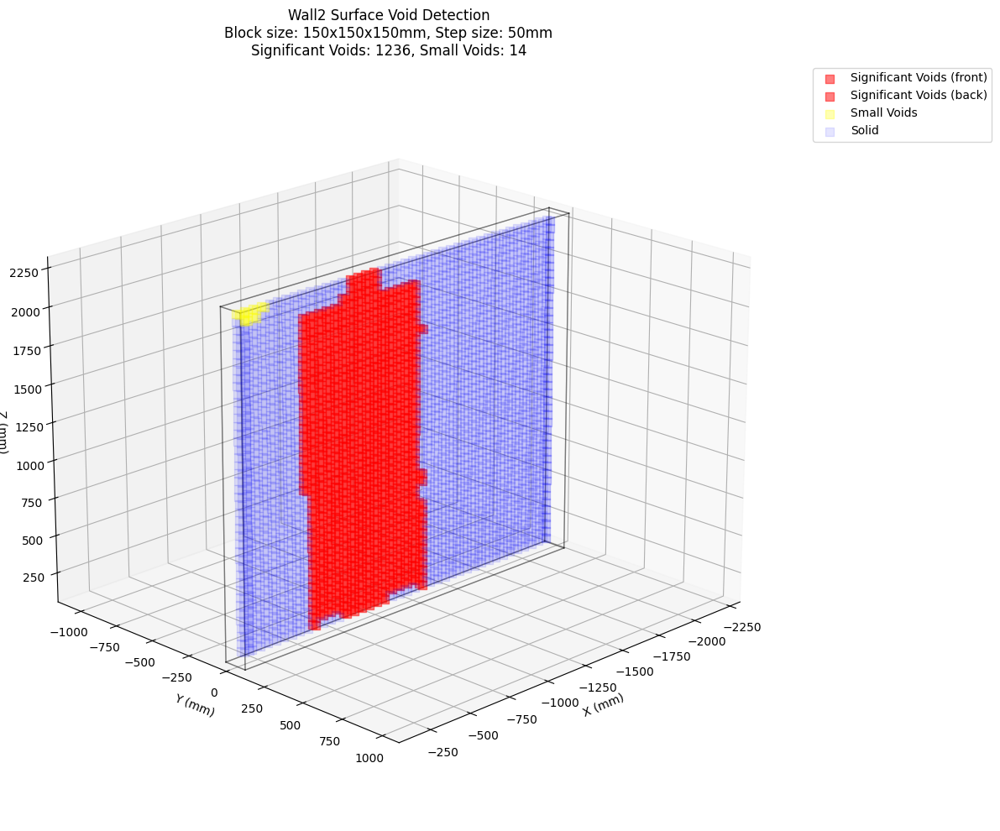


Results for Wall2:
Total blocks checked: 3696
Significant void blocks: 1236 (33.4%)
Small void blocks: 14 (0.4%)
Solid blocks: 2446 (66.2%)
Total void percentage: 33.8%
Significant void percentage: 33.4%

Processing Wall3 for voids...
Wall dimensions - Width: 188.8mm, Thickness: 1846.0mm
Wall dimensions - Width: 188.8mm, Thickness: 1846.0mm
Adaptive block size - Width: 150.0mm, Height: 150.0mm
Created 3552 surface blocks:
Block size: 150.0x150.0x150.0mm
Step size: 50.0mm
Clustering results - Significant clusters: 0
Minimum cluster size: 100 blocks
Clustering distance (eps): 225.0mm


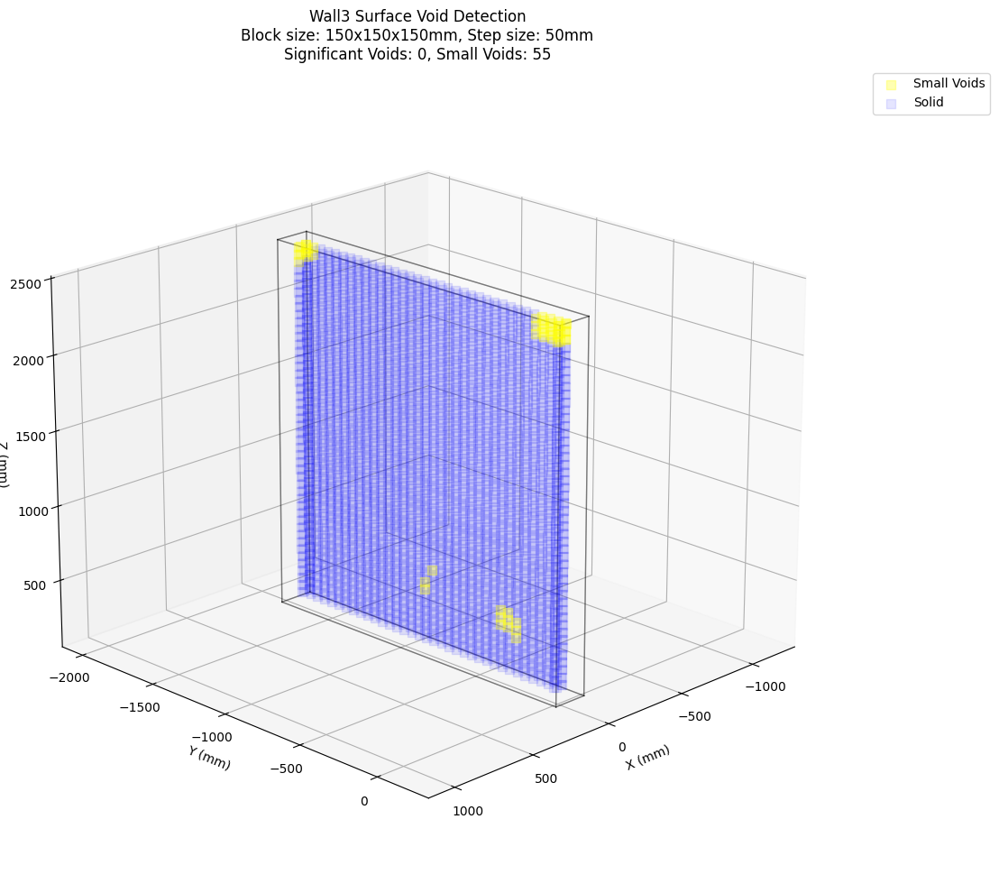


Results for Wall3:
Total blocks checked: 3552
Significant void blocks: 0 (0.0%)
Small void blocks: 55 (1.5%)
Solid blocks: 3497 (98.5%)
Total void percentage: 1.5%
Significant void percentage: 0.0%

Processing Wall6 for voids...
Wall dimensions - Width: 4118.0mm, Thickness: 118.3mm
Wall dimensions - Width: 4118.0mm, Thickness: 118.3mm
Adaptive block size - Width: 150.0mm, Height: 150.0mm
Created 7544 surface blocks:
Block size: 150.0x150.0x150.0mm
Step size: 50.0mm
Clustering results - Significant clusters: 2
Minimum cluster size: 100 blocks
Clustering distance (eps): 225.0mm


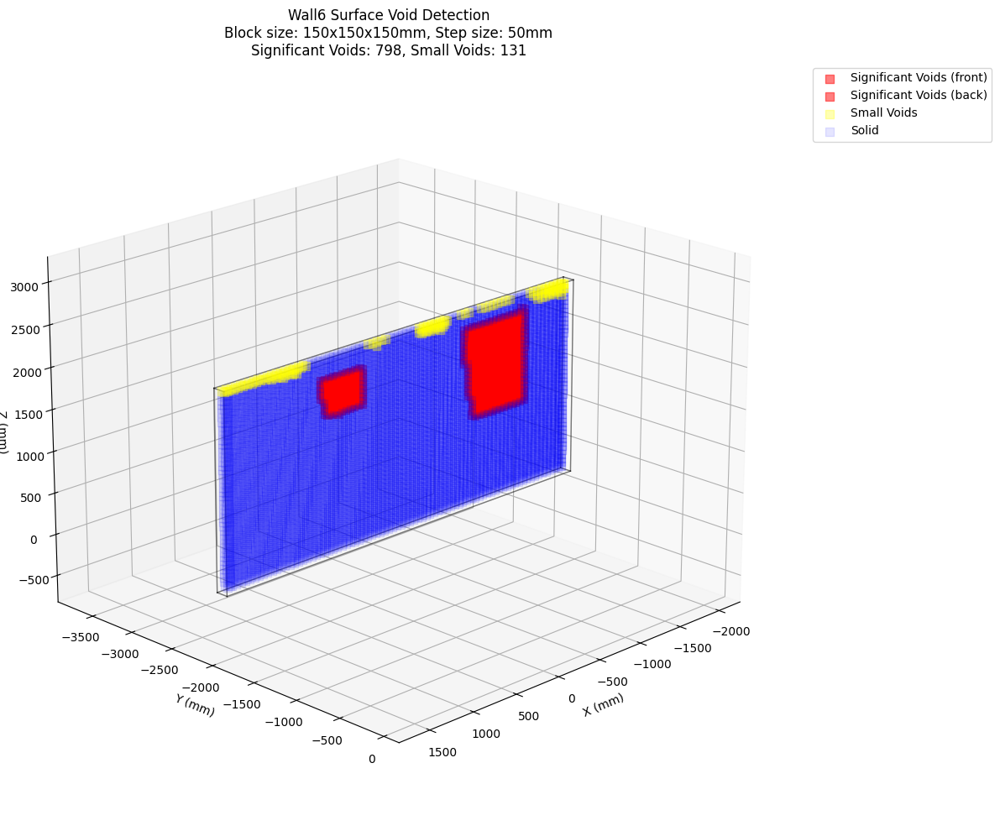


Results for Wall6:
Total blocks checked: 7544
Significant void blocks: 798 (10.6%)
Small void blocks: 131 (1.7%)
Solid blocks: 6615 (87.7%)
Total void percentage: 12.3%
Significant void percentage: 10.6%

Processing Wall4 for voids...
Wall dimensions - Width: 811.4mm, Thickness: 118.4mm
Wall dimensions - Width: 811.4mm, Thickness: 118.4mm
Adaptive block size - Width: 150.0mm, Height: 150.0mm
Created 1408 surface blocks:
Block size: 150.0x150.0x150.0mm
Step size: 50.0mm


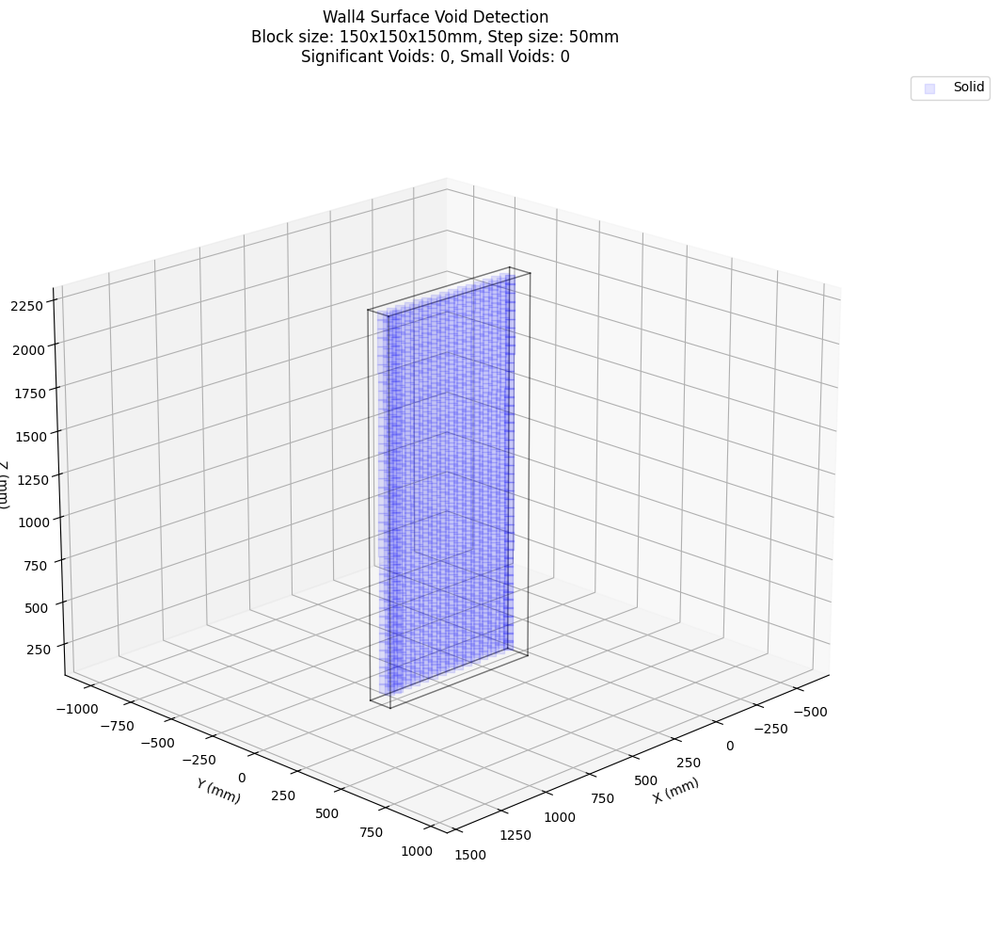


Results for Wall4:
Total blocks checked: 1408
Significant void blocks: 0 (0.0%)
Small void blocks: 0 (0.0%)
Solid blocks: 1408 (100.0%)
Total void percentage: 0.0%
Significant void percentage: 0.0%

Processing Wall5 for voids...
Wall dimensions - Width: 187.6mm, Thickness: 1830.1mm
Wall dimensions - Width: 187.6mm, Thickness: 1830.1mm
Adaptive block size - Width: 150.0mm, Height: 150.0mm
Created 3552 surface blocks:
Block size: 150.0x150.0x150.0mm
Step size: 50.0mm
Clustering results - Significant clusters: 0
Minimum cluster size: 100 blocks
Clustering distance (eps): 225.0mm


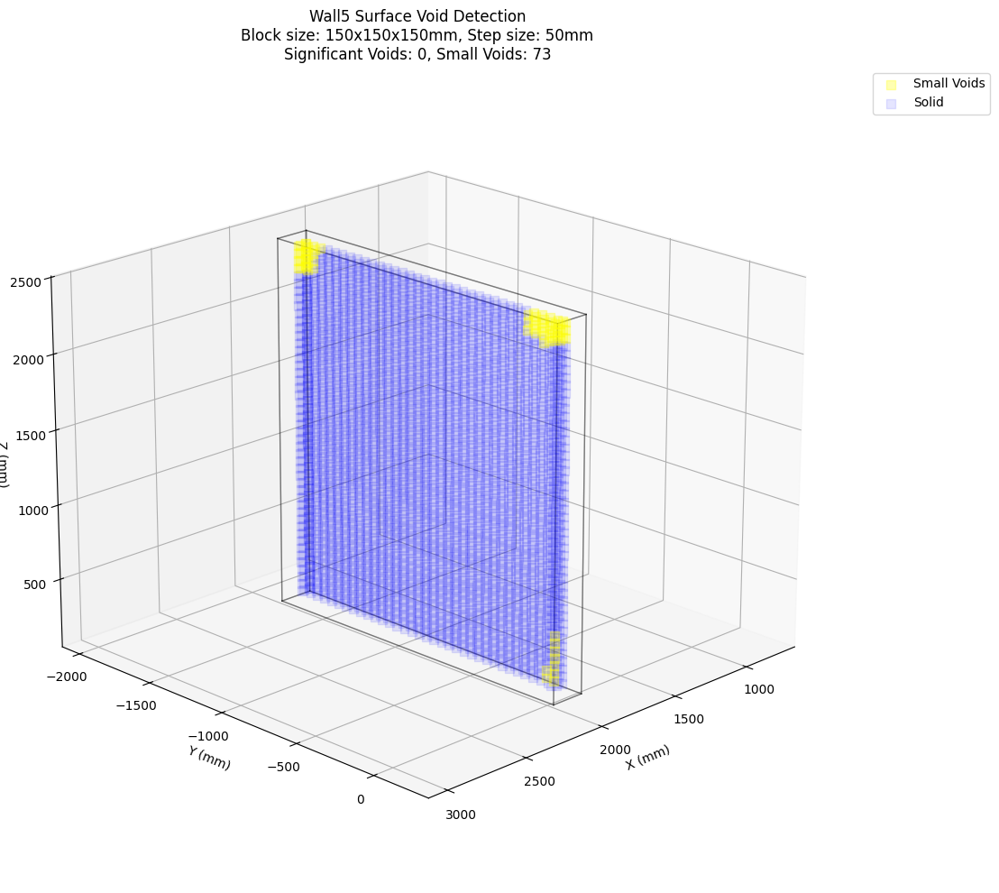


Results for Wall5:
Total blocks checked: 3552
Significant void blocks: 0 (0.0%)
Small void blocks: 73 (2.1%)
Solid blocks: 3479 (97.9%)
Total void percentage: 2.1%
Significant void percentage: 0.0%

Processing Wall1 for voids...
Wall dimensions - Width: 385.0mm, Thickness: 2268.9mm
Wall dimensions - Width: 385.0mm, Thickness: 2268.9mm
Adaptive block size - Width: 385.0mm, Height: 385.0mm
Created 3360 surface blocks:
Block size: 385.0x385.0x385.0mm
Step size: 50.0mm


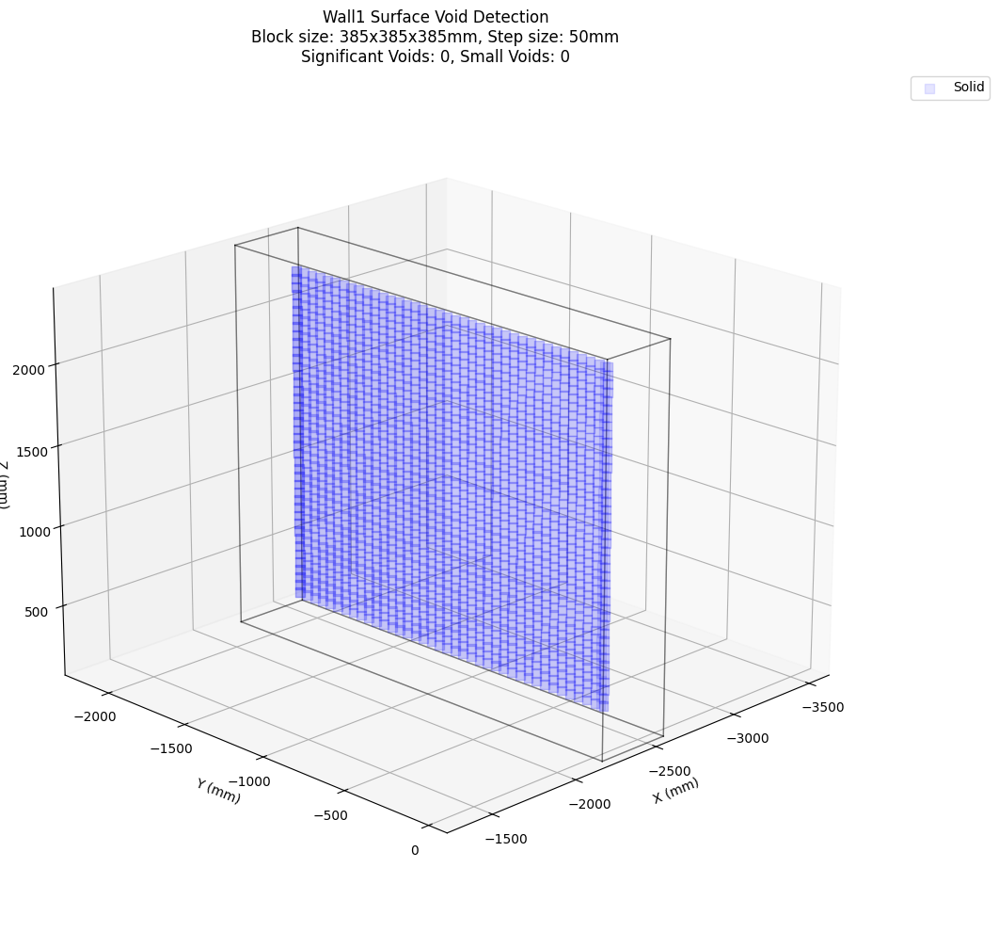


Results for Wall1:
Total blocks checked: 3360
Significant void blocks: 0 (0.0%)
Small void blocks: 0 (0.0%)
Solid blocks: 3360 (100.0%)
Total void percentage: 0.0%
Significant void percentage: 0.0%
CPU times: total: 34.7 s
Wall time: 34.7 s


In [48]:
%%time
import numpy as np
from scipy.spatial import ConvexHull, cKDTree
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
from sklearn.cluster import DBSCAN

def create_sliding_blocks_for_surfaces(wall_solid, block_width, block_height, step_size):
    """
    Create sliding block positions only on wall surfaces.
    """
    bounds = wall_solid['bounds']
    dims = wall_solid['dimensions']
    
    # Calculate adaptive step size based on block size
    step_size = min(step_size, block_width/3)
    
    blocks = []
    
    # Z range for height scanning
    z_range = np.arange(bounds['z'][0] + block_height/2, 
                       bounds['z'][1] - block_height/2 + step_size, 
                       step_size)
    
    # X-direction faces (front and back surfaces)
    x_range = np.arange(bounds['x'][0] + block_width/2, 
                       bounds['x'][1] - block_width/2 + step_size, 
                       step_size)
    
    # Front face (y_min)
    y_min = bounds['y'][0]
    for x in x_range:
        for z in z_range:
            block = {
                'center': np.array([x, y_min + block_width/2, z]),
                'bounds': {
                    'x': [x - block_width/2, x + block_width/2],
                    'y': [y_min, y_min + block_width],
                    'z': [z - block_height/2, z + block_height/2]
                },
                'size': {'width': block_width, 'height': block_height},
                'surface': 'front'
            }
            blocks.append(block)
    
    # Back face (y_max)
    y_max = bounds['y'][1]
    for x in x_range:
        for z in z_range:
            block = {
                'center': np.array([x, y_max - block_width/2, z]),
                'bounds': {
                    'x': [x - block_width/2, x + block_width/2],
                    'y': [y_max - block_width, y_max],
                    'z': [z - block_height/2, z + block_height/2]
                },
                'size': {'width': block_width, 'height': block_height},
                'surface': 'back'
            }
            blocks.append(block)
    
    # Y-direction faces (left and right surfaces)
    y_range = np.arange(bounds['y'][0] + block_width/2, 
                       bounds['y'][1] - block_width/2 + step_size, 
                       step_size)
    
    # Left face (x_min)
    x_min = bounds['x'][0]
    for y in y_range:
        for z in z_range:
            block = {
                'center': np.array([x_min + block_width/2, y, z]),
                'bounds': {
                    'x': [x_min, x_min + block_width],
                    'y': [y - block_width/2, y + block_width/2],
                    'z': [z - block_height/2, z + block_height/2]
                },
                'size': {'width': block_width, 'height': block_height},
                'surface': 'left'
            }
            blocks.append(block)
    
    # Right face (x_max)
    x_max = bounds['x'][1]
    for y in y_range:
        for z in z_range:
            block = {
                'center': np.array([x_max - block_width/2, y, z]),
                'bounds': {
                    'x': [x_max - block_width, x_max],
                    'y': [y - block_width/2, y + block_width/2],
                    'z': [z - block_height/2, z + block_height/2]
                },
                'size': {'width': block_width, 'height': block_height},
                'surface': 'right'
            }
            blocks.append(block)
    
    print(f"Created {len(blocks)} surface blocks:")
    print(f"Block size: {block_width:.1f}x{block_width:.1f}x{block_height:.1f}mm")
    print(f"Step size: {step_size:.1f}mm")
    
    return blocks, step_size

def calculate_block_size(wall_solid, default_block_width=150, default_block_height=150):
    """
    Calculate adaptive block size based on wall dimensions.
    If both width and thickness are > 2x default size, use minimum of wall width/thickness
    for both block width and height.
    """
    width = wall_solid['dimensions']['width']
    thickness = wall_solid['dimensions']['thickness']
    
    if width > 2 * default_block_width and thickness > 2 * default_block_width:
        # Use the minimum of wall width or thickness for both dimensions
        block_size = min(width, thickness)
        block_width = block_size
        block_height = block_size
    else:
        block_width = default_block_width
        block_height = default_block_height
    
    print(f"Wall dimensions - Width: {width:.1f}mm, Thickness: {thickness:.1f}mm")
    print(f"Adaptive block size - Width: {block_width:.1f}mm, Height: {block_height:.1f}mm")
    return block_width, block_height

def check_block_for_void(block, points, min_points=10):
    """
    Check if a block contains enough points to be considered solid.
    """
    mask = ((points[:, 0] >= block['bounds']['x'][0]) & 
            (points[:, 0] <= block['bounds']['x'][1]) & 
            (points[:, 1] >= block['bounds']['y'][0]) & 
            (points[:, 1] <= block['bounds']['y'][1]) & 
            (points[:, 2] >= block['bounds']['z'][0]) & 
            (points[:, 2] <= block['bounds']['z'][1]))
    
    points_in_block = points[mask]
    return len(points_in_block) < min_points

def cluster_voids(void_blocks, eps=200, min_samples=100):
    """
    Cluster void blocks using DBSCAN and filter small clusters.
    """
    if not void_blocks:
        return [], []
    
    centers = np.array([block['center'] for block in void_blocks])
    
    block_size = void_blocks[0]['size']['width']
    adaptive_eps = max(eps, block_size * 1.5)
    
    clustering = DBSCAN(eps=adaptive_eps, min_samples=min_samples).fit(centers)
    labels = clustering.labels_
    
    significant_voids = []
    small_voids = []
    
    for i, block in enumerate(void_blocks):
        if labels[i] != -1:
            cluster_size = np.sum(labels == labels[i])
            if cluster_size >= min_samples:
                significant_voids.append(block)
            else:
                small_voids.append(block)
        else:
            small_voids.append(block)
    
    print(f"Clustering results - Significant clusters: {len(set(labels[labels >= 0]))}")
    print(f"Minimum cluster size: {min_samples} blocks")
    print(f"Clustering distance (eps): {adaptive_eps:.1f}mm")
    
    return significant_voids, small_voids

def detect_voids(wall_solid, original_points, default_block_width=150, 
                default_block_height=150, step_size=50, min_points=10):
    """
    Detect voids in the wall using adaptive block sizes.
    """
    block_width, block_height = calculate_block_size(
        wall_solid, default_block_width, default_block_height
    )
    
    blocks, adapted_step_size = create_sliding_blocks_for_surfaces(
        wall_solid, block_width, block_height, step_size
    )
    
    void_blocks = []
    solid_blocks = []
    
    for block in blocks:
        if check_block_for_void(block, original_points, min_points):
            void_blocks.append(block)
        else:
            solid_blocks.append(block)
    
    significant_voids, small_voids = cluster_voids(void_blocks)
    
    return significant_voids, solid_blocks, small_voids, {'block_width': block_width, 
                                                        'block_height': block_height,
                                                        'step_size': adapted_step_size}

def visualize_voids(wall_solid, void_blocks, solid_blocks, small_voids, wall_name, params):
    """
    Visualize the wall with detected voids using consistent axis scaling.
    """
    fig = plt.figure(figsize=(12, 10))
    ax = fig.add_subplot(111, projection='3d')
    
    # Plot wall edges
    vertices = wall_solid['vertices']
    faces = wall_solid['faces']
    for face_vertices in faces.values():
        for i in range(len(face_vertices)):
            j = (i + 1) % len(face_vertices)
            v1 = vertices[face_vertices[i]]
            v2 = vertices[face_vertices[j]]
            ax.plot([v1[0], v2[0]], [v1[1], v2[1]], [v1[2], v2[2]], 
                   'k-', linewidth=1, alpha=0.3)
    
    # Plot voids by surface
    if void_blocks:
        for surface in ['front', 'back', 'left', 'right']:
            surface_voids = [b for b in void_blocks if b['surface'] == surface]
            if surface_voids:
                centers = np.array([block['center'] for block in surface_voids])
                ax.scatter(centers[:, 0], centers[:, 1], centers[:, 2], 
                          c='red', marker='s', s=50, alpha=0.5,
                          label=f'Significant Voids ({surface})')
    
    if small_voids:
        centers = np.array([block['center'] for block in small_voids])
        ax.scatter(centers[:, 0], centers[:, 1], centers[:, 2], 
                  c='yellow', marker='s', s=50, alpha=0.3, label='Small Voids')
    
    if solid_blocks:
        centers = np.array([block['center'] for block in solid_blocks])
        ax.scatter(centers[:, 0], centers[:, 1], centers[:, 2], 
                  c='blue', marker='s', s=50, alpha=0.1, label='Solid')
    
    # Set equal scaling
    all_points = vertices
    if void_blocks:
        all_points = np.vstack([all_points, np.array([b['center'] for b in void_blocks])])
    if solid_blocks:
        all_points = np.vstack([all_points, np.array([b['center'] for b in solid_blocks])])
    
    max_range = np.ptp(all_points, axis=0).max() / 2
    mid_x = np.mean(all_points[:, 0])
    mid_y = np.mean(all_points[:, 1])
    mid_z = np.mean(all_points[:, 2])
    
    ax.set_xlim(mid_x - max_range, mid_x + max_range)
    ax.set_ylim(mid_y - max_range, mid_y + max_range)
    ax.set_zlim(mid_z - max_range, mid_z + max_range)
    
    ax.set_xlabel('X (mm)')
    ax.set_ylabel('Y (mm)')
    ax.set_zlabel('Z (mm)')
    ax.set_title(f'{wall_name} Surface Void Detection\n'
                f'Block size: {params["block_width"]:.0f}x{params["block_width"]:.0f}x{params["block_height"]:.0f}mm, '
                f'Step size: {params["step_size"]:.0f}mm\n'
                f'Significant Voids: {len(void_blocks)}, Small Voids: {len(small_voids)}')
    
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    ax.view_init(elev=20, azim=45)
    
    plt.tight_layout()
    plt.show()
    
    return fig, ax

def process_wall_voids(wall_solids, wall_entities, default_block_width=150, 
                      default_block_height=150, step_size=50, min_points=10):
    """
    Process all walls for void detection.
    """
    void_results = {}
    
    for wall_name, wall_solid in wall_solids.items():
        print(f"\nProcessing {wall_name} for voids...")
        print(f"Wall dimensions - Width: {wall_solid['dimensions']['width']:.1f}mm, "
              f"Thickness: {wall_solid['dimensions']['thickness']:.1f}mm")
        
        points = ensure_point_format(wall_entities[wall_name])
        
        significant_voids, solid_blocks, small_voids, adapted_params = detect_voids(
            wall_solid, points, default_block_width, default_block_height, step_size, min_points
        )
        
        void_results[wall_name] = {
            'significant_voids': significant_voids,
            'small_voids': small_voids,
            'solid_blocks': solid_blocks,
            'parameters': adapted_params
        }
        
        visualize_voids(wall_solid, significant_voids, solid_blocks, small_voids, wall_name, adapted_params)
        
        # Print summary
        total_blocks = len(significant_voids) + len(small_voids) + len(solid_blocks)
        print(f"\nResults for {wall_name}:")
        print(f"Total blocks checked: {total_blocks}")
        print(f"Significant void blocks: {len(significant_voids)} ({(len(significant_voids)/total_blocks*100):.1f}%)")
        print(f"Small void blocks: {len(small_voids)} ({(len(small_voids)/total_blocks*100):.1f}%)")
        print(f"Solid blocks: {len(solid_blocks)} ({(len(solid_blocks)/total_blocks*100):.1f}%)")
        void_percentage = (len(significant_voids) + len(small_voids)) / total_blocks * 100
        print(f"Total void percentage: {void_percentage:.1f}%")
        significant_void_percentage = len(significant_voids) / total_blocks * 100
        print(f"Significant void percentage: {significant_void_percentage:.1f}%")
    
    return void_results

# Execute void detection
if 'wall_solids' in globals() and 'wall_entities' in globals():
    void_results = process_wall_voids(wall_solids, wall_entities)
else:
    print("Please run the previous cells to generate wall_solids and ensure wall_entities is available.")

In [49]:
def calculate_correct_void_dimensions(void_blocks, surface_type):
    """
    Calculate the actual dimensions of void areas correctly, accounting for block size.
    """
    if not void_blocks:
        return {}
    
    surface_voids = {}
    block_size = void_blocks[0]['size']['width']
    
    for surface in ['front', 'back', 'left', 'right']:
        surface_blocks = [b for b in void_blocks if b.get('surface') == surface]
        if surface_blocks:
            centers = np.array([b['center'] for b in surface_blocks])
            
            # Get the actual bounds of all blocks (not just centers)
            all_bounds_x = []
            all_bounds_y = []
            all_bounds_z = []
            
            for block in surface_blocks:
                all_bounds_x.extend([block['bounds']['x'][0], block['bounds']['x'][1]])
                all_bounds_y.extend([block['bounds']['y'][0], block['bounds']['y'][1]])
                all_bounds_z.extend([block['bounds']['z'][0], block['bounds']['z'][1]])
            
            # Calculate actual void extents
            x_extent = max(all_bounds_x) - min(all_bounds_x)
            y_extent = max(all_bounds_y) - min(all_bounds_y)
            z_extent = max(all_bounds_z) - min(all_bounds_z)
            
            # For surface analysis, width and height depend on surface orientation
            if surface in ['front', 'back']:
                void_width = x_extent
                void_height = z_extent
                void_depth = y_extent
            else:  # left, right
                void_width = y_extent
                void_height = z_extent
                void_depth = x_extent
            
            surface_voids[surface] = {
                'count': len(surface_blocks),
                'center_span_x': centers[:, 0].max() - centers[:, 0].min(),
                'center_span_y': centers[:, 1].max() - centers[:, 1].min(),
                'center_span_z': centers[:, 2].max() - centers[:, 2].min(),
                'actual_width': void_width,
                'actual_height': void_height,
                'actual_depth': void_depth,
                'area_m2': (void_width * void_height) / 1000000,
                'volume_m3': (void_width * void_height * void_depth) / 1000000000,
                'bounds': {
                    'x': [min(all_bounds_x), max(all_bounds_x)],
                    'y': [min(all_bounds_y), max(all_bounds_y)],
                    'z': [min(all_bounds_z), max(all_bounds_z)]
                }
            }
    
    return surface_voids

def analyze_void_overlap_and_coverage(void_blocks, step_size, block_size):
    """
    Analyze the overlap and coverage characteristics of the void detection.
    """
    if not void_blocks:
        return {}
    
    overlap_ratio = block_size / step_size
    coverage_efficiency = 1 / overlap_ratio if overlap_ratio > 1 else 1
    
    # Calculate unique void area (accounting for overlap)
    unique_positions = set()
    for block in void_blocks:
        # Round position to step size to identify unique positions
        pos = (
            round(block['center'][0] / step_size) * step_size,
            round(block['center'][1] / step_size) * step_size,
            round(block['center'][2] / step_size) * step_size
        )
        unique_positions.add(pos)
    
    return {
        'overlap_ratio': overlap_ratio,
        'coverage_efficiency': coverage_efficiency,
        'total_blocks': len(void_blocks),
        'effective_unique_positions': len(unique_positions),
        'redundancy_factor': len(void_blocks) / len(unique_positions) if unique_positions else 0
    }

def recalculate_void_results_with_correct_dimensions(refined_positioning_results):
    """
    Recalculate the void analysis results with corrected dimension calculations.
    """
    corrected_results = {}
    
    for wall_name, results in refined_positioning_results.items():
        print(f"\n" + "="*80)
        print(f"CORRECTED VOID DIMENSION ANALYSIS FOR {wall_name}")
        print(f"="*80)
        
        refined_voids = results['refined_significant_voids']
        refined_params = results['refined_parameters']
        original_voids = results['original_voids']
        
        # Calculate correct void dimensions
        corrected_void_dims = calculate_correct_void_dimensions(refined_voids, 'refined')
        original_void_dims = calculate_correct_void_dimensions(original_voids, 'original')
        
        # Analyze overlap characteristics
        block_size = refined_params['block_width']
        step_size = refined_params['step_size']
        overlap_analysis = analyze_void_overlap_and_coverage(refined_voids, step_size, block_size)
        
        print(f"ANALYSIS PARAMETERS:")
        print(f"  Block size: {block_size:.0f}mm")
        print(f"  Step size: {step_size:.0f}mm")
        print(f"  Overlap ratio: {overlap_analysis['overlap_ratio']:.1f}x (each position sampled {overlap_analysis['overlap_ratio']:.0f} times)")
        print(f"  Total refined blocks: {overlap_analysis['total_blocks']}")
        print(f"  Effective unique positions: {overlap_analysis['effective_unique_positions']}")
        print(f"  Redundancy factor: {overlap_analysis['redundancy_factor']:.1f}x")
        
        print(f"\nCORRECTED VOID DIMENSIONS COMPARISON:")
        print(f"{'Surface':<8} {'Original Area':<15} {'Refined Area':<15} {'Width':<10} {'Height':<10} {'Depth':<10}")
        print("-" * 80)
        
        total_original_area = 0
        total_refined_area = 0
        
        for surface in ['front', 'back', 'left', 'right']:
            orig_area = 0
            refined_area = 0
            width = 0
            height = 0
            depth = 0
            
            if surface in original_void_dims:
                orig_area = original_void_dims[surface]['area_m2']
                total_original_area += orig_area
            
            if surface in corrected_void_dims:
                refined_area = corrected_void_dims[surface]['area_m2']
                width = corrected_void_dims[surface]['actual_width']
                height = corrected_void_dims[surface]['actual_height'] 
                depth = corrected_void_dims[surface]['actual_depth']
                total_refined_area += refined_area
            
            print(f"{surface:<8} {orig_area:<15.3f} {refined_area:<15.3f} {width:<10.0f} {height:<10.0f} {depth:<10.0f}")
        
        print("-" * 80)
        print(f"{'TOTAL':<8} {total_original_area:<15.3f} {total_refined_area:<15.3f}")
        
        # Calculate void volume and impact
        total_volume = sum([dims['volume_m3'] for dims in corrected_void_dims.values()])
        
        print(f"\nVOID IMPACT ANALYSIS:")
        print(f"  Total void area: {total_refined_area:.3f} m²")
        print(f"  Total void volume: {total_volume:.3f} m³")
        print(f"  Area increase vs original: {(total_refined_area/max(0.001, total_original_area)):.2f}x")
        
        # Individual cluster analysis
        if 'cluster_centers' in refined_params:
            print(f"\nINDIVIDUAL VOID CLUSTERS:")
            for i, cluster in enumerate(refined_params['cluster_centers']):
                cluster_bounds = cluster['bounds']
                cluster_width = cluster_bounds['x'][1] - cluster_bounds['x'][0]
                cluster_height = cluster_bounds['z'][1] - cluster_bounds['z'][0]
                cluster_depth = cluster_bounds['y'][1] - cluster_bounds['y'][0]
                cluster_volume = (cluster_width * cluster_height * cluster_depth) / 1000000000
                
                print(f"  Cluster {i+1} at ({cluster['center'][0]:.0f}, {cluster['center'][1]:.0f}, {cluster['center'][2]:.0f}):")
                print(f"    Dimensions: {cluster_width:.0f} × {cluster_height:.0f} × {cluster_depth:.0f} mm")
                print(f"    Volume: {cluster_volume:.3f} m³")
                print(f"    Original detection blocks: {cluster['size']}")
        
        corrected_results[wall_name] = {
            'corrected_void_dimensions': corrected_void_dims,
            'original_void_dimensions': original_void_dims,
            'overlap_analysis': overlap_analysis,
            'total_void_area': total_refined_area,
            'total_void_volume': total_volume,
            'refined_parameters': refined_params
        }
    
    return corrected_results

def summarize_all_walls_void_analysis(corrected_results):
    """
    Provide a summary of void analysis across all walls.
    """
    print(f"\n" + "="*100)
    print(f"SUMMARY: VOID ANALYSIS ACROSS ALL WALLS")
    print(f"="*100)
    
    print(f"{'Wall':<8} {'Thickness':<10} {'Block Size':<10} {'Total Area':<12} {'Total Volume':<12} {'Status':<15}")
    print("-" * 100)
    
    total_building_area = 0
    total_building_volume = 0
    
    for wall_name, results in corrected_results.items():
        thickness = results['refined_parameters']['block_width']  # Approximate from block size
        area = results['total_void_area']
        volume = results['total_void_volume']
        
        total_building_area += area
        total_building_volume += volume
        
        status = "Significant" if area > 0.5 else "Minor" if area > 0.1 else "Minimal"
        
        print(f"{wall_name:<8} {thickness:<10.0f} {thickness:<10.0f} {area:<12.3f} {volume:<12.3f} {status:<15}")
    
    print("-" * 100)
    print(f"{'TOTAL':<8} {'':<10} {'':<10} {total_building_area:<12.3f} {total_building_volume:<12.3f}")
    
    print(f"\nBUILDING-LEVEL IMPACT:")
    print(f"  Total void area: {total_building_area:.3f} m²")
    print(f"  Total void volume: {total_building_volume:.3f} m³")
    print(f"  Walls with significant voids (>0.5m²): {len([w for w, r in corrected_results.items() if r['total_void_area'] > 0.5])}")
    
    return {
        'total_area': total_building_area,
        'total_volume': total_building_volume,
        'wall_count': len(corrected_results)
    }

# Execute corrected void dimension analysis
if 'refined_positioning_results' in globals():
    corrected_void_results = recalculate_void_results_with_correct_dimensions(refined_positioning_results)
    building_summary = summarize_all_walls_void_analysis(corrected_void_results)
else:
    print("Please run the refined positioning analysis first.")

Please run the refined positioning analysis first.


IMPROVED VOID DETECTION FOR ALL WALLS
Key improvements:
- Block size rule: if block_size < wall_thickness, block_size = wall_thickness + 10mm
- Accurate void dimensions: center_span + block_size
- Reliable cluster analysis
- No confusing boundary mapping

PROCESSING Wall2
Starting improved void detection...
Wall dimensions - Width: 2119.2mm, Thickness: 128.5mm
Final block size - Width: 150.0mm, Height: 150.0mm
Block vs Thickness ratio: 1.17x
Created 3696 surface blocks:
Block size: 150.0x150.0x150.0mm
Step size: 50.0mm
Created 3696 surface blocks for analysis
Found 1250 void blocks, 2446 solid blocks

Clustering parameters:
  Clustering distance (eps): 225mm
  Minimum cluster size: 62 blocks
  Found 1 significant clusters
  Cluster 0:
    Center: (-954, -31, 1153)
    Blocks: 1236
    Dimensions: 900 × 2300 × 172 mm
    Volume: 0.355 m³

Calculating accurate void dimensions:
  FRONT surface:
    Blocks: 618
    Center spans: 750 × 0 × 2150 mm
    Void dimensions: 900 × 2300 × 150 mm
  

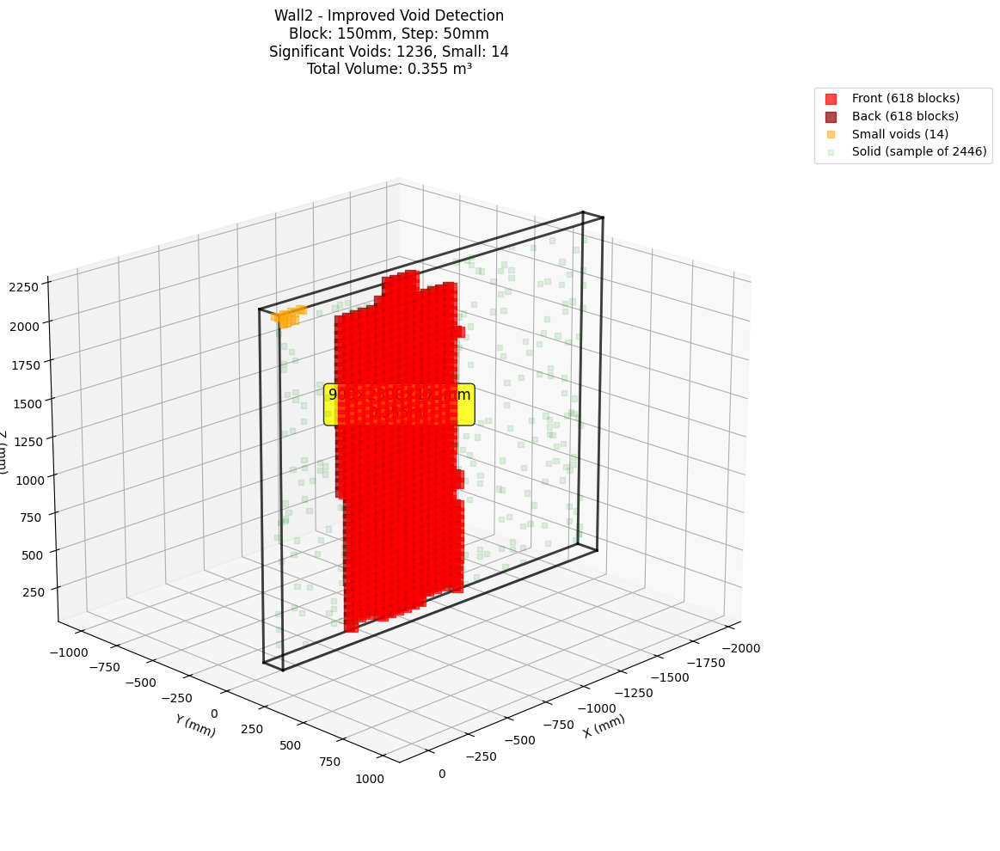


PROCESSING Wall3
Starting improved void detection...
Block size adjusted: 1856mm (wall thickness + 10mm)
Wall dimensions - Width: 188.8mm, Thickness: 1846.0mm
Final block size - Width: 1856.0mm, Height: 1856.0mm
Block vs Thickness ratio: 1.01x
Created 28 surface blocks:
Block size: 1856.0x1856.0x1856.0mm
Step size: 50.0mm
Created 28 surface blocks for analysis
Found 0 void blocks, 28 solid blocks
No voids detected

DETAILED RESULTS FOR Wall3:
--------------------------------------------------

NO SIGNIFICANT VOIDS DETECTED - 🟢 WALL IS STRUCTURALLY SOUND


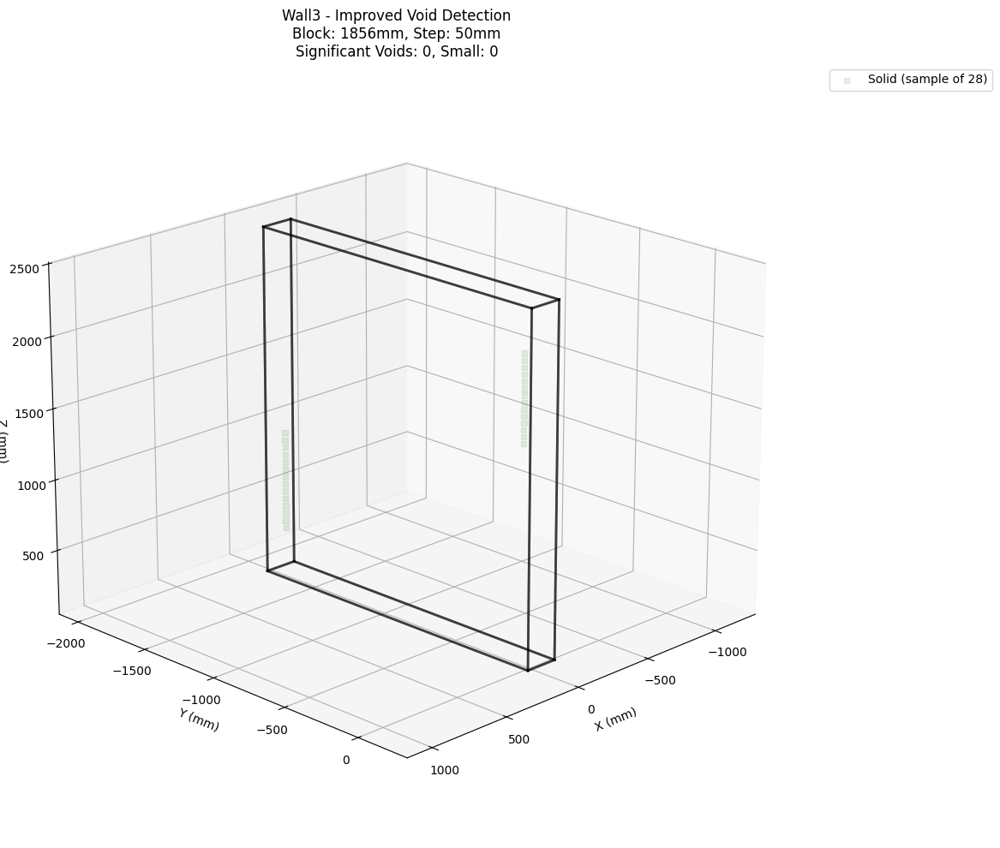


PROCESSING Wall6
Starting improved void detection...
Wall dimensions - Width: 4118.0mm, Thickness: 118.3mm
Final block size - Width: 150.0mm, Height: 150.0mm
Block vs Thickness ratio: 1.27x
Created 7544 surface blocks:
Block size: 150.0x150.0x150.0mm
Step size: 50.0mm
Created 7544 surface blocks for analysis
Found 929 void blocks, 6615 solid blocks

Clustering parameters:
  Clustering distance (eps): 225mm
  Minimum cluster size: 50 blocks
  Found 2 significant clusters
  Cluster 0:
    Center: (-1386, -1890, 1682)
    Blocks: 636
    Dimensions: 900 × 1400 × 182 mm
    Volume: 0.229 m³
  Cluster 1:
    Center: (448, -1890, 1932)
    Blocks: 173
    Dimensions: 600 × 600 × 182 mm
    Volume: 0.065 m³

Calculating accurate void dimensions:
  FRONT surface:
    Blocks: 398
    Center spans: 2400 × 0 × 1100 mm
    Void dimensions: 2550 × 1250 × 150 mm
    Surface area: 3.187 m²
  BACK surface:
    Blocks: 411
    Center spans: 2400 × 0 × 1250 mm
    Void dimensions: 2550 × 1400 × 150 mm


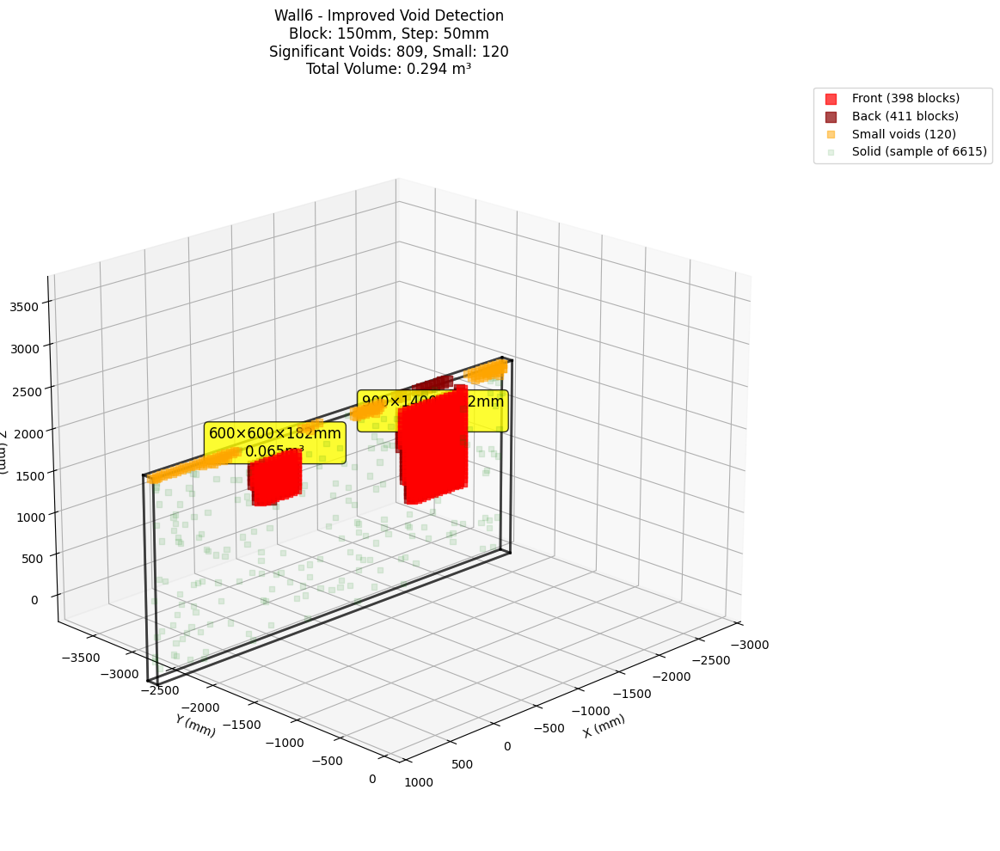


PROCESSING Wall4
Starting improved void detection...
Wall dimensions - Width: 811.4mm, Thickness: 118.4mm
Final block size - Width: 150.0mm, Height: 150.0mm
Block vs Thickness ratio: 1.27x
Created 1408 surface blocks:
Block size: 150.0x150.0x150.0mm
Step size: 50.0mm
Created 1408 surface blocks for analysis
Found 0 void blocks, 1408 solid blocks
No voids detected

DETAILED RESULTS FOR Wall4:
--------------------------------------------------

NO SIGNIFICANT VOIDS DETECTED - 🟢 WALL IS STRUCTURALLY SOUND


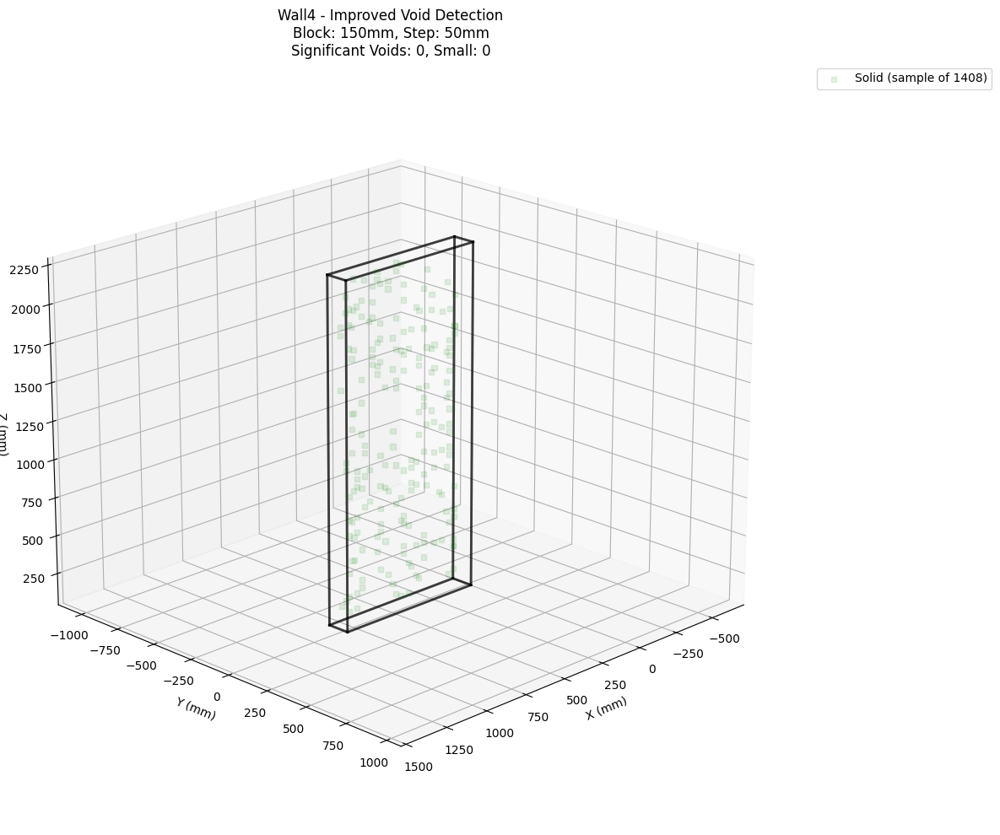


PROCESSING Wall5
Starting improved void detection...
Block size adjusted: 1840mm (wall thickness + 10mm)
Wall dimensions - Width: 187.6mm, Thickness: 1830.1mm
Final block size - Width: 1840.1mm, Height: 1840.1mm
Block vs Thickness ratio: 1.01x
Created 28 surface blocks:
Block size: 1840.1x1840.1x1840.1mm
Step size: 50.0mm
Created 28 surface blocks for analysis
Found 0 void blocks, 28 solid blocks
No voids detected

DETAILED RESULTS FOR Wall5:
--------------------------------------------------

NO SIGNIFICANT VOIDS DETECTED - 🟢 WALL IS STRUCTURALLY SOUND


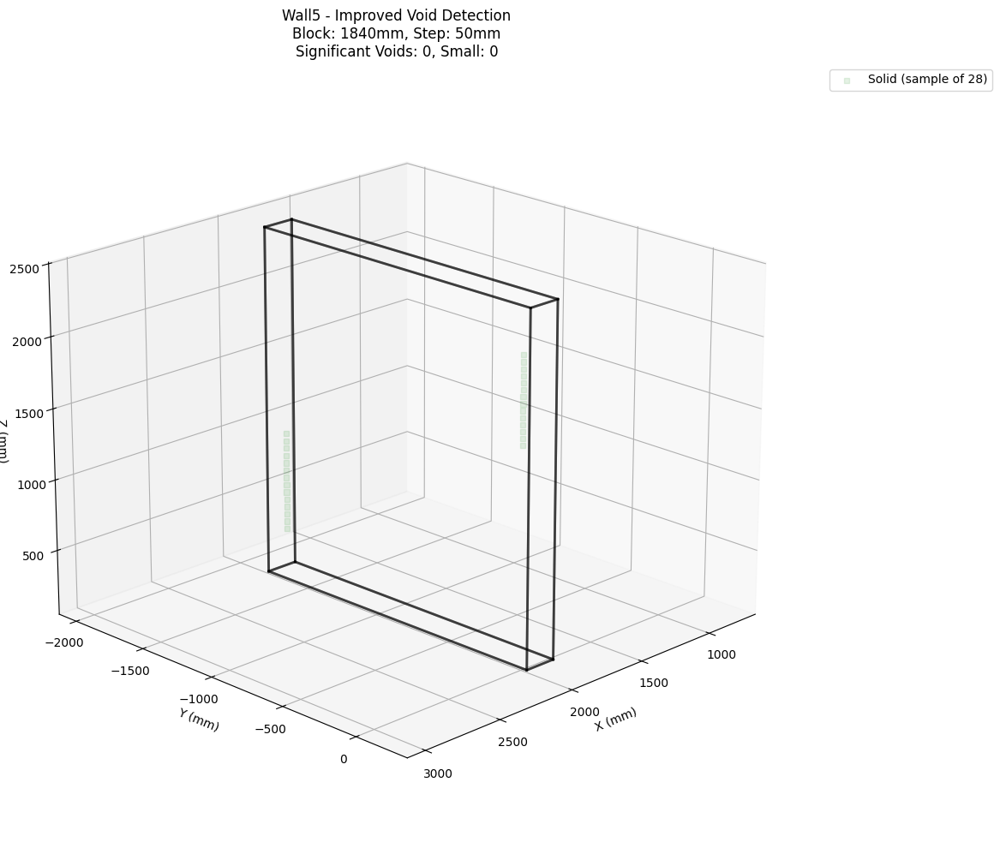


PROCESSING Wall1
Starting improved void detection...
Block size adjusted: 2279mm (wall thickness + 10mm)
Wall dimensions - Width: 385.0mm, Thickness: 2268.9mm
Final block size - Width: 2278.9mm, Height: 2278.9mm
Block vs Thickness ratio: 1.00x
Created 8 surface blocks:
Block size: 2278.9x2278.9x2278.9mm
Step size: 50.0mm
Created 8 surface blocks for analysis
Found 0 void blocks, 8 solid blocks
No voids detected

DETAILED RESULTS FOR Wall1:
--------------------------------------------------

NO SIGNIFICANT VOIDS DETECTED - 🟢 WALL IS STRUCTURALLY SOUND


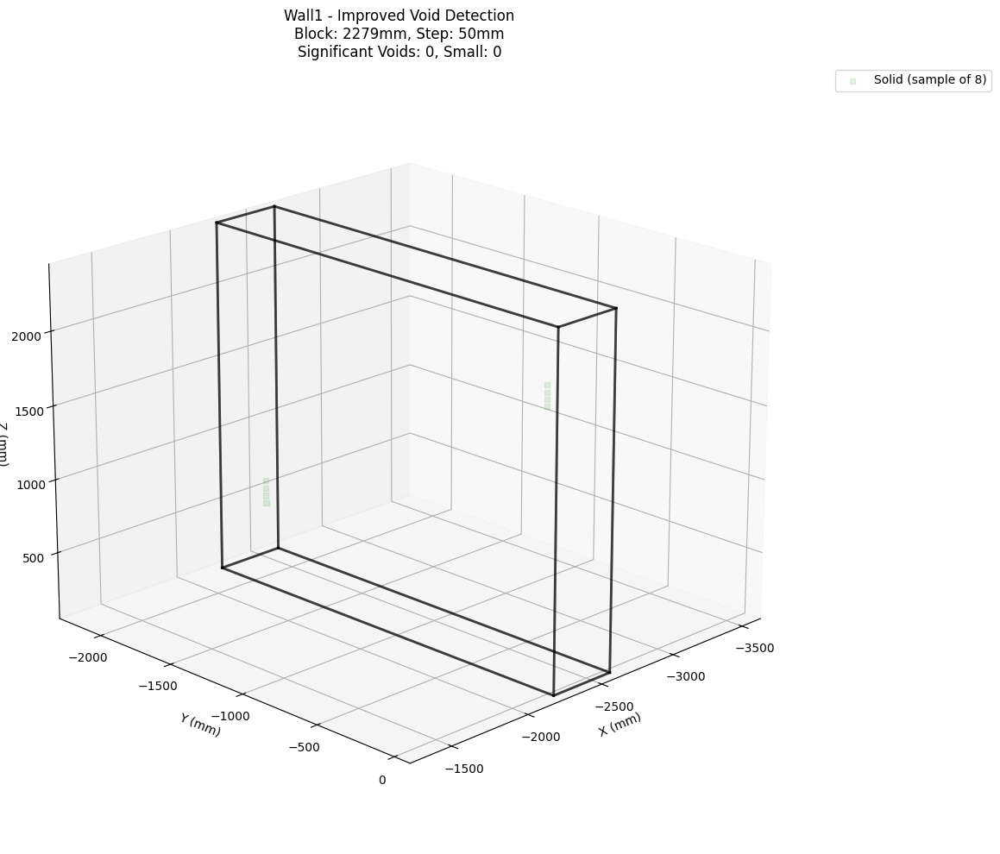


FINAL BUILDING VOID SUMMARY
Wall     Thickness  Block Size Void Dimensions           Volume     Severity    
----------------------------------------------------------------------------------------------------
Wall2    N/A        150        900×2300×172mm            0.355      🟡 SIGNIFICANT
Wall3    N/A        1856       No voids                  0.000      🟢 GOOD      
Wall6    N/A        150        900×1400×182mm            0.294      🟡 SIGNIFICANT
Wall4    N/A        150        No voids                  0.000      🟢 GOOD      
Wall5    N/A        1840       No voids                  0.000      🟢 GOOD      
Wall1    N/A        2279       No voids                  0.000      🟢 GOOD      
----------------------------------------------------------------------------------------------------
TOTAL BUILDING VOID VOLUME: 0.649 m³

BUILDING ASSESSMENT:
  Total void volume: 0.649 m³
  Walls analyzed: 6
  Walls with voids: 2
  Critical walls (>0.5m³): 0
  ✅ No critical voids found
CPU times: t

In [50]:
%%time
import numpy as np
from scipy.spatial import ConvexHull, cKDTree
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
from sklearn.cluster import DBSCAN

def calculate_improved_block_size(wall_solid, default_block_width=150, default_block_height=150):
    """
    Calculate improved block size with rule: if block_size < wall_thickness, 
    then block_size = wall_thickness + 10mm
    """
    width = wall_solid['dimensions']['width']
    thickness = wall_solid['dimensions']['thickness']
    
    # Start with adaptive sizing
    if width > 2 * default_block_width and thickness > 2 * default_block_width:
        block_size = min(width, thickness)
        block_width = block_size
        block_height = block_size
    else:
        block_width = default_block_width
        block_height = default_block_height
    
    # IMPROVED RULE: Ensure block size is larger than wall thickness
    if block_width < thickness:
        block_width = thickness + 10  # 10mm larger than thickness
        block_height = thickness + 10
        print(f"Block size adjusted: {block_width:.0f}mm (wall thickness + 10mm)")
    
    print(f"Wall dimensions - Width: {width:.1f}mm, Thickness: {thickness:.1f}mm")
    print(f"Final block size - Width: {block_width:.1f}mm, Height: {block_height:.1f}mm")
    print(f"Block vs Thickness ratio: {(block_width/thickness):.2f}x")
    
    return block_width, block_height

def calculate_accurate_void_dimensions(void_blocks, block_size):
    """
    Calculate void dimensions accurately by including block extents.
    """
    if not void_blocks:
        return {}
    
    surface_voids = {}
    
    for surface in ['front', 'back', 'left', 'right']:
        surface_blocks = [b for b in void_blocks if b.get('surface') == surface]
        if surface_blocks:
            centers = np.array([b['center'] for b in surface_blocks])
            
            # Get center spans (distance between outermost block centers)
            center_span_x = centers[:, 0].max() - centers[:, 0].min() if len(centers) > 1 else 0
            center_span_y = centers[:, 1].max() - centers[:, 1].min() if len(centers) > 1 else 0
            center_span_z = centers[:, 2].max() - centers[:, 2].min() if len(centers) > 1 else 0
            
            # CORRECT CALCULATION: Add block size to get actual void extents
            # This accounts for the fact that blocks extend beyond their centers
            actual_extent_x = center_span_x + block_size
            actual_extent_y = center_span_y + block_size
            actual_extent_z = center_span_z + block_size
            
            # For surface analysis, determine width and height based on surface orientation
            if surface in ['front', 'back']:
                void_width = actual_extent_x   # X direction
                void_height = actual_extent_z  # Z direction (vertical)
                void_depth = actual_extent_y   # Y direction (wall thickness)
            else:  # left, right
                void_width = actual_extent_y   # Y direction
                void_height = actual_extent_z  # Z direction (vertical)
                void_depth = actual_extent_x   # X direction (wall thickness)
            
            surface_voids[surface] = {
                'block_count': len(surface_blocks),
                'center_spans': {
                    'x': center_span_x,
                    'y': center_span_y, 
                    'z': center_span_z
                },
                'void_dimensions': {
                    'width': void_width,
                    'height': void_height,
                    'depth': void_depth
                },
                'area_m2': (void_width * void_height) / 1000000,
                'volume_m3': (void_width * void_height * void_depth) / 1000000000,
                'center_bounds': {
                    'x': [centers[:, 0].min(), centers[:, 0].max()],
                    'y': [centers[:, 1].min(), centers[:, 1].max()],
                    'z': [centers[:, 2].min(), centers[:, 2].max()]
                }
            }
            
            print(f"  {surface.upper()} surface:")
            print(f"    Blocks: {len(surface_blocks)}")
            print(f"    Center spans: {center_span_x:.0f} × {center_span_y:.0f} × {center_span_z:.0f} mm")
            print(f"    Void dimensions: {void_width:.0f} × {void_height:.0f} × {void_depth:.0f} mm")
            print(f"    Surface area: {surface_voids[surface]['area_m2']:.3f} m²")
    
    return surface_voids

def improved_cluster_analysis(void_blocks, block_size, eps_factor=1.5, min_samples=50):
    """
    Improved clustering that provides reliable void cluster dimensions.
    """
    if not void_blocks:
        return [], [], {}
    
    centers = np.array([block['center'] for block in void_blocks])
    
    # Adaptive clustering parameters based on block size
    adaptive_eps = block_size * eps_factor
    adaptive_min_samples = max(min_samples, len(void_blocks) // 20)  # At least 5% of blocks
    
    print(f"\nClustering parameters:")
    print(f"  Clustering distance (eps): {adaptive_eps:.0f}mm")
    print(f"  Minimum cluster size: {adaptive_min_samples} blocks")
    
    clustering = DBSCAN(eps=adaptive_eps, min_samples=adaptive_min_samples).fit(centers)
    labels = clustering.labels_
    
    significant_voids = []
    small_voids = []
    cluster_analysis = {}
    
    # Separate blocks by cluster classification
    for i, block in enumerate(void_blocks):
        if labels[i] != -1:
            cluster_size = np.sum(labels == labels[i])
            if cluster_size >= adaptive_min_samples:
                significant_voids.append(block)
            else:
                small_voids.append(block)
        else:
            small_voids.append(block)
    
    # Analyze each significant cluster
    unique_labels = set(labels[labels >= 0])
    print(f"  Found {len(unique_labels)} significant clusters")
    
    for cluster_id in unique_labels:
        cluster_mask = labels == cluster_id
        cluster_centers = centers[cluster_mask]
        cluster_size = np.sum(cluster_mask)
        
        if cluster_size >= adaptive_min_samples:
            # Calculate cluster bounds
            cluster_center = np.mean(cluster_centers, axis=0)
            
            # Center spans within cluster
            center_span_x = cluster_centers[:, 0].max() - cluster_centers[:, 0].min()
            center_span_y = cluster_centers[:, 1].max() - cluster_centers[:, 1].min()
            center_span_z = cluster_centers[:, 2].max() - cluster_centers[:, 2].min()
            
            # ACCURATE cluster dimensions (center spans + block size)
            cluster_width = center_span_x + block_size
            cluster_height = center_span_z + block_size  # Height is typically Z direction
            cluster_depth = center_span_y + block_size
            
            cluster_volume = (cluster_width * cluster_height * cluster_depth) / 1000000000
            
            cluster_analysis[f'cluster_{cluster_id}'] = {
                'center': cluster_center,
                'block_count': cluster_size,
                'center_spans': [center_span_x, center_span_y, center_span_z],
                'actual_dimensions': [cluster_width, cluster_height, cluster_depth],
                'volume_m3': cluster_volume,
                'bounds': {
                    'x': [cluster_centers[:, 0].min(), cluster_centers[:, 0].max()],
                    'y': [cluster_centers[:, 1].min(), cluster_centers[:, 1].max()],
                    'z': [cluster_centers[:, 2].min(), cluster_centers[:, 2].max()]
                }
            }
            
            print(f"  Cluster {cluster_id}:")
            print(f"    Center: ({cluster_center[0]:.0f}, {cluster_center[1]:.0f}, {cluster_center[2]:.0f})")
            print(f"    Blocks: {cluster_size}")
            print(f"    Dimensions: {cluster_width:.0f} × {cluster_height:.0f} × {cluster_depth:.0f} mm")
            print(f"    Volume: {cluster_volume:.3f} m³")
    
    return significant_voids, small_voids, cluster_analysis

def improved_void_detection(wall_solid, original_points, default_block_width=150, 
                           default_block_height=150, step_size=50, min_points=10):
    """
    Improved void detection with accurate block sizing and dimension calculation.
    """
    print(f"Starting improved void detection...")
    
    # Calculate improved block size
    block_width, block_height = calculate_improved_block_size(
        wall_solid, default_block_width, default_block_height
    )
    
    # Create surface blocks
    blocks, adapted_step_size = create_sliding_blocks_for_surfaces(
        wall_solid, block_width, block_height, step_size
    )
    
    print(f"Created {len(blocks)} surface blocks for analysis")
    
    # Check each block for voids
    void_blocks = []
    solid_blocks = []
    
    for block in blocks:
        if check_block_for_void(block, original_points, min_points):
            void_blocks.append(block)
        else:
            solid_blocks.append(block)
    
    print(f"Found {len(void_blocks)} void blocks, {len(solid_blocks)} solid blocks")
    
    if not void_blocks:
        print("No voids detected")
        return [], solid_blocks, [], {
            'block_width': block_width,
            'block_height': block_height,
            'step_size': adapted_step_size,
            'surface_void_dimensions': {},
            'cluster_analysis': {}
        }
    
    # Perform clustering analysis
    significant_voids, small_voids, cluster_analysis = improved_cluster_analysis(
        void_blocks, block_width
    )
    
    # Calculate accurate surface void dimensions
    print(f"\nCalculating accurate void dimensions:")
    surface_void_dims = calculate_accurate_void_dimensions(significant_voids, block_width)
    
    return significant_voids, solid_blocks, small_voids, {
        'block_width': block_width,
        'block_height': block_height,
        'step_size': adapted_step_size,
        'surface_void_dimensions': surface_void_dims,
        'cluster_analysis': cluster_analysis
    }

def visualize_improved_void_detection(wall_solid, significant_voids, solid_blocks, small_voids, 
                                    wall_name, params):
    """
    Visualize improved void detection with accurate dimensions.
    """
    fig = plt.figure(figsize=(15, 10))
    ax = fig.add_subplot(111, projection='3d')
    
    # Plot wall edges
    vertices = wall_solid['vertices']
    faces = wall_solid['faces']
    for face_vertices in faces.values():
        for i in range(len(face_vertices)):
            j = (i + 1) % len(face_vertices)
            v1 = vertices[face_vertices[i]]
            v2 = vertices[face_vertices[j]]
            ax.plot([v1[0], v2[0]], [v1[1], v2[1]], [v1[2], v2[2]], 
                   'k-', linewidth=2, alpha=0.5)
    
    # Plot voids by surface with different colors
    colors = {'front': 'red', 'back': 'darkred', 'left': 'blue', 'right': 'darkblue'}
    
    if significant_voids:
        for surface, color in colors.items():
            surface_voids = [b for b in significant_voids if b.get('surface') == surface]
            if surface_voids:
                centers = np.array([b['center'] for b in surface_voids])
                ax.scatter(centers[:, 0], centers[:, 1], centers[:, 2], 
                          c=color, marker='s', s=80, alpha=0.7, 
                          label=f'{surface.title()} ({len(surface_voids)} blocks)')
    
    if small_voids:
        centers = np.array([block['center'] for block in small_voids])
        ax.scatter(centers[:, 0], centers[:, 1], centers[:, 2], 
                  c='orange', marker='s', s=40, alpha=0.5, label=f'Small voids ({len(small_voids)})')
    
    # Sample solid blocks for visualization (to avoid overcrowding)
    if solid_blocks:
        sample_size = min(200, len(solid_blocks))
        sample_solid = np.random.choice(solid_blocks, sample_size, replace=False)
        centers = np.array([block['center'] for block in sample_solid])
        ax.scatter(centers[:, 0], centers[:, 1], centers[:, 2], 
                  c='green', marker='s', s=20, alpha=0.1, label=f'Solid (sample of {len(solid_blocks)})')
    
    # Add dimension annotations for clusters
    if 'cluster_analysis' in params:
        for cluster_id, cluster_info in params['cluster_analysis'].items():
            center = cluster_info['center']
            dims = cluster_info['actual_dimensions']
            ax.text(center[0], center[1], center[2] + 200, 
                   f'{dims[0]:.0f}×{dims[1]:.0f}×{dims[2]:.0f}mm\n{cluster_info["volume_m3"]:.3f}m³', 
                   fontsize=12, ha='center', va='bottom', 
                   bbox=dict(boxstyle="round,pad=0.3", facecolor="yellow", alpha=0.8))
    
    # Set equal scaling
    all_points = vertices
    if significant_voids:
        all_points = np.vstack([all_points, np.array([b['center'] for b in significant_voids])])
    
    max_range = np.ptp(all_points, axis=0).max() / 2
    mid_x = np.mean(all_points[:, 0])
    mid_y = np.mean(all_points[:, 1])
    mid_z = np.mean(all_points[:, 2])
    
    ax.set_xlim(mid_x - max_range, mid_x + max_range)
    ax.set_ylim(mid_y - max_range, mid_y + max_range)
    ax.set_zlim(mid_z - max_range, mid_z + max_range)
    
    ax.set_xlabel('X (mm)')
    ax.set_ylabel('Y (mm)')
    ax.set_zlabel('Z (mm)')
    
    # Create comprehensive title
    title_lines = [
        f'{wall_name} - Improved Void Detection',
        f'Block: {params["block_width"]:.0f}mm, Step: {params["step_size"]:.0f}mm',
        f'Significant Voids: {len(significant_voids)}, Small: {len(small_voids)}'
    ]
    
    if 'cluster_analysis' in params and params['cluster_analysis']:
        total_volume = sum([info['volume_m3'] for info in params['cluster_analysis'].values()])
        title_lines.append(f'Total Volume: {total_volume:.3f} m³')
    
    ax.set_title('\n'.join(title_lines))
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    ax.view_init(elev=20, azim=45)
    
    plt.tight_layout()
    plt.show()
    
    return fig

def process_all_walls_improved_detection(wall_solids, wall_entities, default_block_width=150, 
                                        default_block_height=150, step_size=50, min_points=10):
    """
    Process improved void detection for all walls.
    """
    all_results = {}
    
    print("IMPROVED VOID DETECTION FOR ALL WALLS")
    print("="*60)
    print("Key improvements:")
    print("- Block size rule: if block_size < wall_thickness, block_size = wall_thickness + 10mm")
    print("- Accurate void dimensions: center_span + block_size")
    print("- Reliable cluster analysis")
    print("- No confusing boundary mapping")
    
    for wall_name, wall_solid in wall_solids.items():
        print(f"\n{'='*80}")
        print(f"PROCESSING {wall_name}")
        print(f"{'='*80}")
        
        points = ensure_point_format(wall_entities[wall_name])
        
        # Run improved void detection
        significant_voids, solid_blocks, small_voids, params = improved_void_detection(
            wall_solid, points, default_block_width, default_block_height, step_size, min_points
        )
        
        all_results[wall_name] = {
            'significant_voids': significant_voids,
            'small_voids': small_voids,
            'solid_blocks': solid_blocks,
            'parameters': params
        }
        
        # Print detailed results
        print_detailed_wall_results(wall_name, params)
        
        # Visualize results
        visualize_improved_void_detection(
            wall_solid, significant_voids, solid_blocks, small_voids, wall_name, params
        )
    
    # Print final summary
    print_final_building_summary(all_results)
    
    return all_results

def print_detailed_wall_results(wall_name, params):
    """
    Print detailed results for a single wall.
    """
    print(f"\nDETAILED RESULTS FOR {wall_name}:")
    print("-" * 50)
    
    # Surface void analysis
    if 'surface_void_dimensions' in params and params['surface_void_dimensions']:
        surface_dims = params['surface_void_dimensions']
        total_surface_area = sum([dims['area_m2'] for dims in surface_dims.values()])
        
        print("SURFACE VOID ANALYSIS:")
        for surface, dims in surface_dims.items():
            void_dims = dims['void_dimensions']
            print(f"  {surface.upper()}: {void_dims['width']:.0f} × {void_dims['height']:.0f} mm")
            print(f"    Area: {dims['area_m2']:.3f} m², Volume: {dims['volume_m3']:.3f} m³")
        
        print(f"  TOTAL SURFACE AREA: {total_surface_area:.3f} m²")
    
    # Cluster analysis
    if 'cluster_analysis' in params and params['cluster_analysis']:
        cluster_info = params['cluster_analysis']
        total_cluster_volume = sum([info['volume_m3'] for info in cluster_info.values()])
        
        print(f"\nCLUSTER ANALYSIS (GROUND TRUTH):")
        for cluster_id, info in cluster_info.items():
            dims = info['actual_dimensions']
            print(f"  {cluster_id.upper()}: {dims[0]:.0f} × {dims[1]:.0f} × {dims[2]:.0f} mm")
            print(f"    Volume: {info['volume_m3']:.3f} m³, Blocks: {info['block_count']}")
        
        print(f"  TOTAL CLUSTER VOLUME: {total_cluster_volume:.3f} m³")
        
        # Severity assessment
        if total_cluster_volume > 0.5:
            severity = "🔴 CRITICAL"
        elif total_cluster_volume > 0.2:
            severity = "🟡 SIGNIFICANT"
        elif total_cluster_volume > 0.05:
            severity = "🟠 MODERATE"
        else:
            severity = "🟢 MINOR"
        
        print(f"  SEVERITY: {severity}")
    else:
        print(f"\nNO SIGNIFICANT VOIDS DETECTED - 🟢 WALL IS STRUCTURALLY SOUND")

def print_final_building_summary(all_results):
    """
    Print final summary across all walls.
    """
    print(f"\n{'='*100}")
    print("FINAL BUILDING VOID SUMMARY")
    print(f"{'='*100}")
    
    print(f"{'Wall':<8} {'Thickness':<10} {'Block Size':<10} {'Void Dimensions':<25} {'Volume':<10} {'Severity':<12}")
    print("-" * 100)
    
    total_building_volume = 0
    critical_walls = []
    
    for wall_name, results in all_results.items():
        params = results['parameters']
        thickness = wall_name.split('_')[-1] if '_' in wall_name else "N/A"  # Try to extract from name
        block_size = params['block_width']
        
        if 'cluster_analysis' in params and params['cluster_analysis']:
            cluster_info = params['cluster_analysis']
            wall_volume = sum([info['volume_m3'] for info in cluster_info.values()])
            total_building_volume += wall_volume
            
            # Get largest cluster dimensions for display
            largest_cluster = max(cluster_info.values(), key=lambda x: x['volume_m3'])
            dims = largest_cluster['actual_dimensions']
            dim_str = f"{dims[0]:.0f}×{dims[1]:.0f}×{dims[2]:.0f}mm"
            
            if wall_volume > 0.5:
                severity = "🔴 CRITICAL"
                critical_walls.append(wall_name)
            elif wall_volume > 0.2:
                severity = "🟡 SIGNIFICANT"
            elif wall_volume > 0.05:
                severity = "🟠 MODERATE"
            else:
                severity = "🟢 MINOR"
            
            print(f"{wall_name:<8} {thickness:<10} {block_size:<10.0f} {dim_str:<25} {wall_volume:<10.3f} {severity:<12}")
        else:
            print(f"{wall_name:<8} {thickness:<10} {block_size:<10.0f} {'No voids':<25} {0:<10.3f} {'🟢 GOOD':<12}")
    
    print("-" * 100)
    print(f"TOTAL BUILDING VOID VOLUME: {total_building_volume:.3f} m³")
    
    print(f"\nBUILDING ASSESSMENT:")
    print(f"  Total void volume: {total_building_volume:.3f} m³")
    print(f"  Walls analyzed: {len(all_results)}")
    print(f"  Walls with voids: {len([w for w, r in all_results.items() if 'cluster_analysis' in r['parameters'] and r['parameters']['cluster_analysis']])}")
    print(f"  Critical walls (>0.5m³): {len(critical_walls)}")
    
    if critical_walls:
        print(f"  🔴 URGENT ACTION REQUIRED for: {', '.join(critical_walls)}")
    else:
        print(f"  ✅ No critical voids found")

# Execute improved void detection
if 'wall_solids' in globals() and 'wall_entities' in globals():
    improved_results = process_all_walls_improved_detection(wall_solids, wall_entities)
else:
    print("Please run the previous cells to generate wall_solids and ensure wall_entities is available.")


Analyzing combined voids for Wall2
Found 1 combined void clusters

Cluster 1:
Center: (-959.9, -30.8, 1191.0)
Width (X): 750.0mm
Thickness (Y): 21.5mm
Height (Z): 2150.0mm
Volume: 34699071.0 cubic mm
Surface Area: 3349809.1 square mm
Number of void blocks: 1236

Analyzing combined voids for Wall3
No significant voids found in Wall3

Analyzing combined voids for Wall6
Found 2 combined void clusters

Cluster 1:
Center: (-1367.1, -1889.6, 1677.4)
Width (X): 700.0mm
Thickness (Y): 31.7mm
Height (Z): 1100.0mm
Volume: 24447481.0 cubic mm
Surface Area: 1654299.9 square mm
Number of void blocks: 625

Cluster 2:
Center: (457.9, -1889.6, 1902.4)
Width (X): 450.0mm
Thickness (Y): 31.7mm
Height (Z): 450.0mm
Volume: 6429370.0 cubic mm
Surface Area: 462150.0 square mm
Number of void blocks: 173

Analyzing combined voids for Wall4
No significant voids found in Wall4

Analyzing combined voids for Wall5
No significant voids found in Wall5


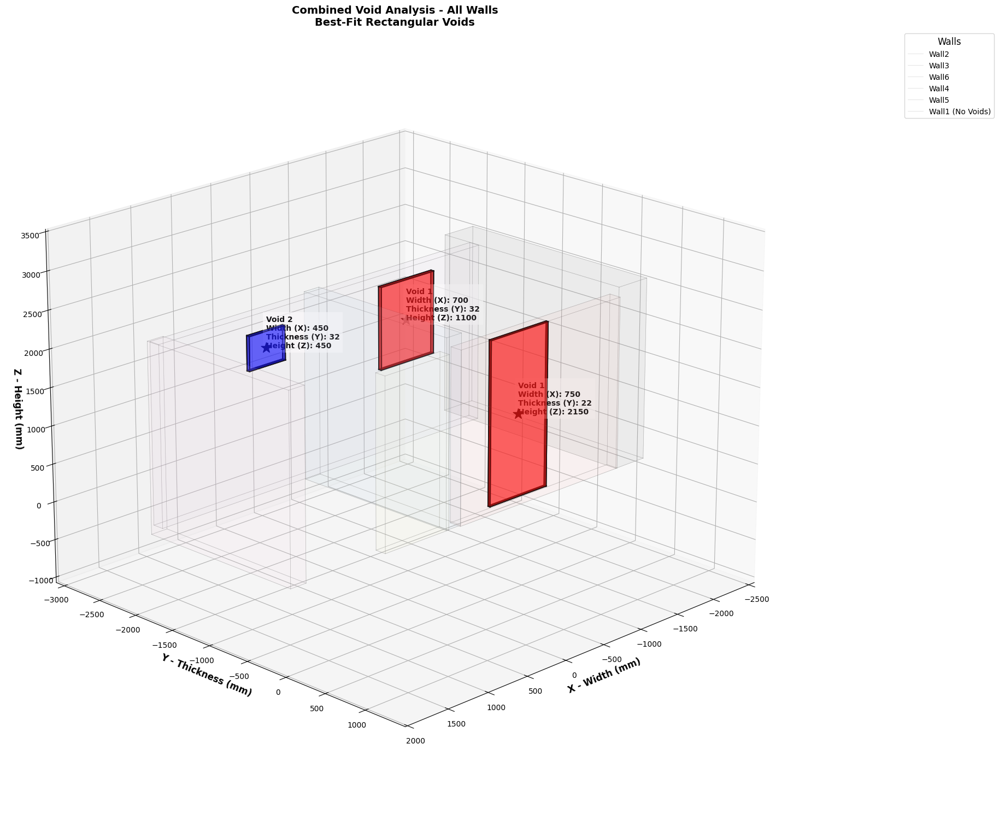

In [51]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
from sklearn.cluster import DBSCAN
import itertools
from matplotlib import cm

def find_best_fit_rectangle(void_centers):
    """
    Find the best-fit rectangular box aligned with coordinate axes.
    Width along x, thickness along y, height along z.
    """
    # Calculate bounding box directly in coordinate axes
    min_coords = np.min(void_centers, axis=0)
    max_coords = np.max(void_centers, axis=0)
    
    # Calculate dimensions in each axis - explicitly ordered as [x, y, z]
    dimensions = max_coords - min_coords
    
    # Calculate center
    center = (min_coords + max_coords) / 2
    
    # Create identity transform to keep alignment with coordinate axes
    transform_matrix = np.eye(3)
    
    return {
        'center': center,
        'dimensions': dimensions,  # [width (x), thickness (y), height (z)]
        'transform': transform_matrix,
        'min_coords': min_coords,
        'max_coords': max_coords
    }

def analyze_combined_voids(void_results, wall_solids):
    """
    Analyze and combine significant voids, finding best-fit rectangles for void clusters.
    Wall1 is excluded from void analysis but included in visualization.
    """
    combined_void_analysis = {}
    
    for wall_name, results in void_results.items():
        if wall_name == 'Wall1':  # Skip void analysis for Wall1
            continue
            
        print(f"\nAnalyzing combined voids for {wall_name}")
        significant_voids = results['significant_voids']
        
        if not significant_voids:
            print(f"No significant voids found in {wall_name}")
            continue
        
        void_centers = np.array([void['center'] for void in significant_voids])
        block_size = significant_voids[0]['size']['width']
        eps = block_size * 2
        min_samples = 5
        
        clustering = DBSCAN(eps=eps, min_samples=min_samples).fit(void_centers)
        labels = clustering.labels_
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        
        print(f"Found {n_clusters} combined void clusters")
        
        wall_void_clusters = []
        
        for cluster_id in range(n_clusters):
            cluster_mask = (labels == cluster_id)
            cluster_centers = void_centers[cluster_mask]
            
            if len(cluster_centers) < 4:
                continue
            
            rect_info = find_best_fit_rectangle(cluster_centers)
            width, thickness, height = rect_info['dimensions']  # x, y, z order
            
            volume = width * thickness * height
            surface_area = 2 * (width * height + width * thickness + height * thickness)
            
            cluster_info = {
                'center': rect_info['center'],
                'width': width,          # x dimension
                'thickness': thickness,   # y dimension
                'height': height,        # z dimension
                'volume': volume,
                'surface_area': surface_area,
                'n_voids': len(cluster_centers),
                'void_centers': cluster_centers,
                'transform': rect_info['transform'],
                'min_coords': rect_info['min_coords'],
                'max_coords': rect_info['max_coords']
            }
            
            wall_void_clusters.append(cluster_info)
            
            print(f"\nCluster {cluster_id + 1}:")
            print(f"Center: ({rect_info['center'][0]:.1f}, {rect_info['center'][1]:.1f}, {rect_info['center'][2]:.1f})")
            print(f"Width (X): {width:.1f}mm")
            print(f"Thickness (Y): {thickness:.1f}mm")
            print(f"Height (Z): {height:.1f}mm")
            print(f"Volume: {volume:.1f} cubic mm")
            print(f"Surface Area: {surface_area:.1f} square mm")
            print(f"Number of void blocks: {len(cluster_centers)}")
        
        combined_void_analysis[wall_name] = wall_void_clusters
    
    visualize_all_walls_voids(wall_solids, combined_void_analysis)
    
    return combined_void_analysis

def create_box_vertices_and_faces(center, dimensions, transform):
    """
    Create vertices and faces for a rectangular box aligned with coordinate axes.
    Dimensions order: [width (x), thickness (y), height (z)]
    """
    width, thickness, height = dimensions
    
    # Create box corners in coordinate axis alignment
    corners = np.array([
        # Bottom face (z = -height/2)
        [center[0] - width/2, center[1] - thickness/2, center[2] - height/2],  # front-left-bottom
        [center[0] + width/2, center[1] - thickness/2, center[2] - height/2],  # front-right-bottom
        [center[0] + width/2, center[1] + thickness/2, center[2] - height/2],  # back-right-bottom
        [center[0] - width/2, center[1] + thickness/2, center[2] - height/2],  # back-left-bottom
        # Top face (z = +height/2)
        [center[0] - width/2, center[1] - thickness/2, center[2] + height/2],  # front-left-top
        [center[0] + width/2, center[1] - thickness/2, center[2] + height/2],  # front-right-top
        [center[0] + width/2, center[1] + thickness/2, center[2] + height/2],  # back-right-top
        [center[0] - width/2, center[1] + thickness/2, center[2] + height/2]   # back-left-top
    ])
    
    # Define faces using vertex indices (order matters for normal direction)
    faces = [
        [0, 1, 2, 3],  # bottom (z-)
        [4, 5, 6, 7],  # top (z+)
        [0, 1, 5, 4],  # front (y-)
        [2, 3, 7, 6],  # back (y+)
        [0, 3, 7, 4],  # left (x-)
        [1, 2, 6, 5]   # right (x+)
    ]
    
    # Create face vertices
    face_vertices = [[corners[idx] for idx in face] for face in faces]
    
    return corners, face_vertices

def visualize_all_walls_voids(wall_solids, combined_void_analysis):
    """
    Create a comprehensive visualization with more visible void boxes.
    """
    fig = plt.figure(figsize=(20, 15))
    ax = fig.add_subplot(111, projection='3d')
    
    # Create color maps - using stronger colors for voids
    wall_colors = plt.cm.Pastel1(np.linspace(0, 1, len(wall_solids)))
    cluster_colors = ['red', 'blue', 'green', 'purple', 'orange', 'cyan', 'magenta', 'yellow', 'brown', 'pink']
    
    # Plot all walls
    for (wall_name, wall_solid), wall_color in zip(wall_solids.items(), wall_colors):
        # Plot wall solid with high transparency
        vertices = wall_solid['vertices']
        faces = wall_solid['faces']
        wall_polygons = [vertices[face_vertices] for face_vertices in faces.values()]
        
        if wall_name == 'Wall1':
            poly3d = Poly3DCollection(wall_polygons, alpha=0.05, facecolor='gray')
            label = f'{wall_name} (No Voids)'
        else:
            poly3d = Poly3DCollection(wall_polygons, alpha=0.05, facecolor=wall_color)
            label = wall_name
            
        ax.add_collection3d(poly3d)
        
        # Plot wall edges with thin lines
        for face_vertices in faces.values():
            for i in range(len(face_vertices)):
                j = (i + 1) % len(face_vertices)
                v1 = vertices[face_vertices[i]]
                v2 = vertices[face_vertices[j]]
                ax.plot([v1[0], v2[0]], [v1[1], v2[1]], [v1[2], v2[2]], 
                       color='gray', linewidth=0.5, alpha=0.3,
                       label=label if i == 0 and j == 1 else "")
        
        # Plot void clusters with enhanced visibility
        if wall_name in combined_void_analysis:
            for cluster_id, cluster_info in enumerate(combined_void_analysis[wall_name]):
                color = cluster_colors[cluster_id % len(cluster_colors)]
                
                # Create void box with higher opacity
                corners, face_vertices = create_box_vertices_and_faces(
                    cluster_info['center'],
                    [cluster_info['width'],      # x dimension
                     cluster_info['thickness'],   # y dimension
                     cluster_info['height']],     # z dimension
                    cluster_info['transform']
                )
                
                # Create void faces with higher opacity
                void_poly = Poly3DCollection(face_vertices, alpha=0.4)
                void_poly.set_facecolor(color)
                void_poly.set_edgecolor('black')  # Black edges for contrast
                ax.add_collection3d(void_poly)
                
                # Plot edges with thicker lines
                for face in face_vertices:
                    for i in range(len(face)):
                        j = (i + 1) % len(face)
                        ax.plot([face[i][0], face[j][0]],
                               [face[i][1], face[j][1]],
                               [face[i][2], face[j][2]],
                               color='black', alpha=1.0, linewidth=2)
                
                # Add prominent label with correct dimension ordering
                center = cluster_info['center']
                ax.text(center[0], center[1], center[2],
                       f'Void {cluster_id+1}\n'
                       f'Width (X): {cluster_info["width"]:.0f}\n'
                       f'Thickness (Y): {cluster_info["thickness"]:.0f}\n'
                       f'Height (Z): {cluster_info["height"]:.0f}',
                       fontsize=10, fontweight='bold',
                       bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))
                
                # Add void center marker
                ax.scatter([center[0]], [center[1]], [center[2]], 
                          c='black', marker='*', s=200, alpha=1.0)
    
    # Set equal aspect ratio
    all_points = np.vstack([wall['vertices'] for wall in wall_solids.values()])
    max_range = np.ptp(all_points, axis=0).max() / 2
    mid_x = np.mean(all_points[:, 0])
    mid_y = np.mean(all_points[:, 1])
    mid_z = np.mean(all_points[:, 2])
    
    ax.set_xlim(mid_x - max_range, mid_x + max_range)
    ax.set_ylim(mid_y - max_range, mid_y + max_range)
    ax.set_zlim(mid_z - max_range, mid_z + max_range)
    
    # Customize axis appearance with correct dimension labels
    ax.set_xlabel('X - Width (mm)', fontsize=12, fontweight='bold')
    ax.set_ylabel('Y - Thickness (mm)', fontsize=12, fontweight='bold')
    ax.set_zlabel('Z - Height (mm)', fontsize=12, fontweight='bold')
    ax.set_title('Combined Void Analysis - All Walls\nBest-Fit Rectangular Voids',
                fontsize=14, fontweight='bold')
    
    # Customize grid
    ax.grid(True, linestyle='--', alpha=0.3)
    
    # Add legend with custom ordering
    handles, labels = ax.get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    ax.legend(by_label.values(), by_label.keys(), 
             title="Walls", bbox_to_anchor=(1.15, 1), loc='upper left',
             fontsize=10, title_fontsize=12)
    
    # Set optimal viewing angle
    ax.view_init(elev=20, azim=45)
    
    plt.tight_layout()
    plt.show()

# Execute combined void analysis if void_results and wall_solids are available
if 'void_results' in globals() and 'wall_solids' in globals():
    combined_void_analysis = analyze_combined_voids(void_results, wall_solids)
else:
    print("Please run the void detection first to generate void_results and ensure wall_solids is available.")

In [52]:
def extract_dimensions(wall_solids, combined_void_analysis):
    """
    Extract and display dimensions for walls and their voids.
    
    Parameters:
    wall_solids (dict): Dictionary containing wall geometry data
    combined_void_analysis (dict): Dictionary containing void analysis results
    
    Returns:
    dict: Structured data containing wall and void dimensions
    """
    dimension_data = {}
    
    # Process each wall
    for wall_name, wall_data in wall_solids.items():
        vertices = wall_data['vertices']
        
        # Calculate wall dimensions
        min_coords = np.min(vertices, axis=0)
        max_coords = np.max(vertices, axis=0)
        dimensions = max_coords - min_coords
        center = (min_coords + max_coords) / 2
        
        wall_info = {
            'dimensions': {
                'width': dimensions[0],      # X direction
                'thickness': dimensions[1],   # Y direction
                'height': dimensions[2]       # Z direction
            },
            'center': {
                'x': center[0],
                'y': center[1],
                'z': center[2]
            },
            'voids': []
        }
        
        # Add void information if present
        if wall_name in combined_void_analysis:
            for void_idx, void_info in enumerate(combined_void_analysis[wall_name], 1):
                void_data = {
                    'void_number': void_idx,
                    'dimensions': {
                        'width': void_info['width'],        # X direction
                        'thickness': void_info['thickness'], # Y direction
                        'height': void_info['height']        # Z direction
                    },
                    'center': {
                        'x': void_info['center'][0],
                        'y': void_info['center'][1],
                        'z': void_info['center'][2]
                    },
                    'volume': void_info['volume'],
                    'surface_area': void_info['surface_area'],
                    'number_of_void_blocks': void_info['n_voids']
                }
                wall_info['voids'].append(void_data)
        
        dimension_data[wall_name] = wall_info
        
        # Print formatted output
        print(f"\n{'='*80}")
        print(f"Wall: {wall_name}")
        print(f"{'='*80}")
        
        print("\nWall Dimensions:")
        print(f"Width (X):      {wall_info['dimensions']['width']:.2f} mm")
        print(f"Thickness (Y):  {wall_info['dimensions']['thickness']:.2f} mm")
        print(f"Height (Z):     {wall_info['dimensions']['height']:.2f} mm")
        
        print("\nWall Center Point:")
        print(f"X: {wall_info['center']['x']:.2f} mm")
        print(f"Y: {wall_info['center']['y']:.2f} mm")
        print(f"Z: {wall_info['center']['z']:.2f} mm")
        
        if wall_info['voids']:
            print(f"\nVoids Found: {len(wall_info['voids'])}")
            for void in wall_info['voids']:
                print(f"\nVoid {void['void_number']}:")
                print("Dimensions:")
                print(f"  Width (X):     {void['dimensions']['width']:.2f} mm")
                print(f"  Thickness (Y): {void['dimensions']['thickness']:.2f} mm")
                print(f"  Height (Z):    {void['dimensions']['height']:.2f} mm")
                print("Center Point:")
                print(f"  X: {void['center']['x']:.2f} mm")
                print(f"  Y: {void['center']['y']:.2f} mm")
                print(f"  Z: {void['center']['z']:.2f} mm")
                print(f"Volume:          {void['volume']:.2f} cubic mm")
                print(f"Surface Area:    {void['surface_area']:.2f} square mm")
                print(f"Void Blocks:     {void['number_of_void_blocks']}")
        else:
            print("\nNo voids detected in this wall")
    
    return dimension_data

# Execute the function if the required data is available
if 'wall_solids' in globals() and 'combined_void_analysis' in globals():
    dimension_data = extract_dimensions(wall_solids, combined_void_analysis)
else:
    print("Please ensure wall_solids and combined_void_analysis are available.")


Wall: Wall2

Wall Dimensions:
Width (X):      2119.24 mm
Thickness (Y):  128.48 mm
Height (Z):     2267.30 mm

Wall Center Point:
X: -1200.26 mm
Y: -30.79 mm
Z: 1174.70 mm

Voids Found: 1

Void 1:
Dimensions:
  Width (X):     750.00 mm
  Thickness (Y): 21.52 mm
  Height (Z):    2150.00 mm
Center Point:
  X: -959.88 mm
  Y: -30.79 mm
  Z: 1191.04 mm
Volume:          34699070.97 cubic mm
Surface Area:    3349809.06 square mm
Void Blocks:     1236

Wall: Wall3

Wall Dimensions:
Width (X):      188.83 mm
Thickness (Y):  1845.99 mm
Height (Z):     2469.41 mm

Wall Center Point:
X: -70.61 mm
Y: -909.55 mm
Z: 1276.27 mm

No voids detected in this wall

Wall: Wall6

Wall Dimensions:
Width (X):      4118.03 mm
Thickness (Y):  118.25 mm
Height (Z):     2359.51 mm

Wall Center Point:
X: -233.04 mm
Y: -1889.64 mm
Z: 1232.14 mm

Voids Found: 2

Void 1:
Dimensions:
  Width (X):     700.00 mm
  Thickness (Y): 31.75 mm
  Height (Z):    1100.00 mm
Center Point:
  X: -1367.06 mm
  Y: -1889.64 mm
  Z: 1

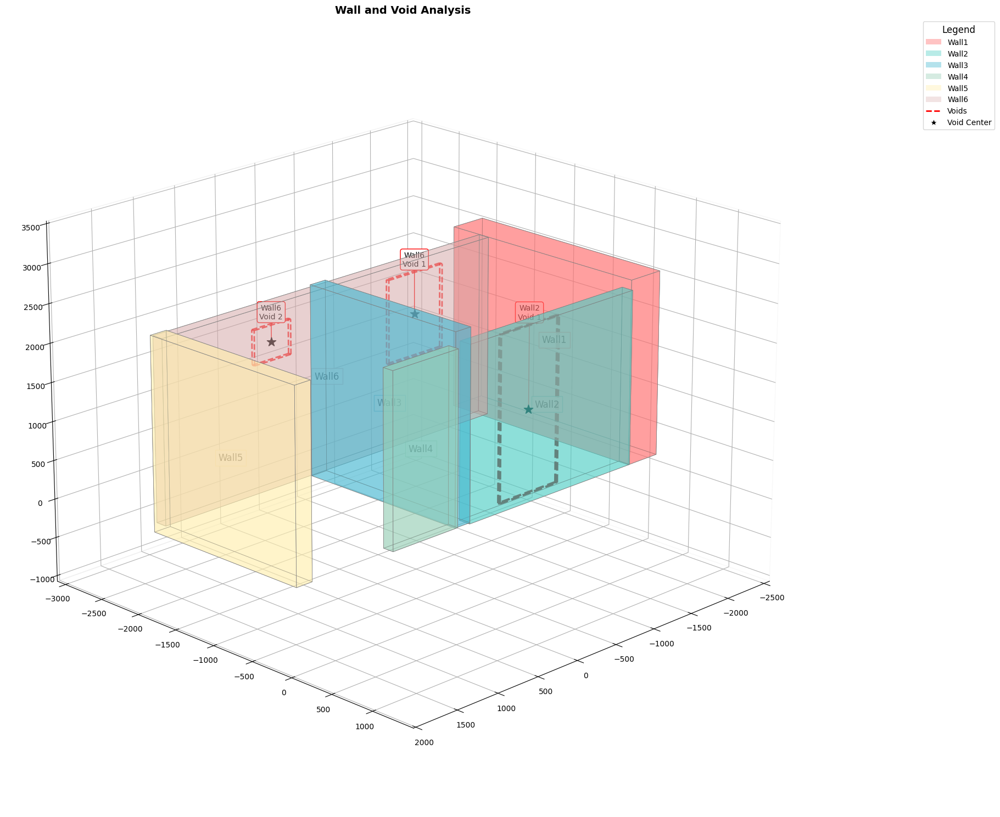

In [53]:
def visualize_walls_with_dimensions(wall_solids, combined_void_analysis):
    """
    Create an enhanced 3D visualization with simplified void labels.
    """
    fig = plt.figure(figsize=(20, 15))
    ax = fig.add_subplot(111, projection='3d')
    
    # Define distinct colors for each wall with adjusted alpha values
    wall_colors = {
        'Wall1': ('#FF6B6B', 0.4),  # Red
        'Wall2': ('#4ECDC4', 0.4),  # Turquoise (more opaque)
        'Wall3': ('#45B7D1', 0.4),  # Blue
        'Wall4': ('#96CEB4', 0.4),  # Green
        'Wall5': ('#FFEEAD', 0.4),  # Yellow
        'Wall6': ('#D4A5A5', 0.3)   # Pink (more transparent)
    }
    
    # Define void visualization properties
    void_line_color = 'red'
    void_line_style = '--'
    void_line_width = 2
    void_line_alpha = 0.8
    
    # Special void properties for Wall2 and Wall4
    wall_specific_void_properties = {
        'Wall2': {'color': 'darkred', 'width': 3, 'alpha': 1.0},
        'Wall4': {'color': 'darkred', 'width': 3, 'alpha': 1.0}
    }
    
    # Store void labels for later plotting
    void_labels = []
    
    for wall_name, wall_solid in wall_solids.items():
        vertices = wall_solid['vertices']
        faces = wall_solid['faces']
        
        # Get wall color and alpha from dictionary
        wall_color, wall_alpha = wall_colors.get(wall_name, ('#CCCCCC', 0.4))
        
        # Plot wall with custom transparency
        wall_polygons = [vertices[face_vertices] for face_vertices in faces.values()]
        wall_poly = Poly3DCollection(wall_polygons, alpha=wall_alpha, edgecolors='grey', linewidths=0.5)
        wall_poly.set_facecolor(wall_color)
        ax.add_collection3d(wall_poly)
        
        # Calculate wall dimensions
        min_coords = np.min(vertices, axis=0)
        max_coords = np.max(vertices, axis=0)
        dimensions = max_coords - min_coords
        center = (min_coords + max_coords) / 2
        
        # Add wall dimensions text
        wall_text = f'{wall_name}'
        ax.text(center[0], center[1], center[2], wall_text,
                fontsize=12, ha='center', va='center',
                bbox=dict(facecolor='white', alpha=0.8, edgecolor=wall_color, pad=4))
        
        # Plot voids if they exist
        if wall_name in combined_void_analysis:
            # Get wall-specific void properties if they exist
            void_props = wall_specific_void_properties.get(wall_name, {
                'color': void_line_color,
                'width': void_line_width,
                'alpha': void_line_alpha
            })
            
            for void_idx, void_info in enumerate(combined_void_analysis[wall_name]):
                void_center = void_info['center']
                
                # Calculate void box corners
                half_width = void_info['width'] / 2
                half_thickness = void_info['thickness'] / 2
                half_height = void_info['height'] / 2
                
                # Create void box vertices
                void_points = np.array([
                    # Bottom face
                    [void_center[0] - half_width, void_center[1] - half_thickness, void_center[2] - half_height],
                    [void_center[0] + half_width, void_center[1] - half_thickness, void_center[2] - half_height],
                    [void_center[0] + half_width, void_center[1] + half_thickness, void_center[2] - half_height],
                    [void_center[0] - half_width, void_center[1] + half_thickness, void_center[2] - half_height],
                    # Top face
                    [void_center[0] - half_width, void_center[1] - half_thickness, void_center[2] + half_height],
                    [void_center[0] + half_width, void_center[1] - half_thickness, void_center[2] + half_height],
                    [void_center[0] + half_width, void_center[1] + half_thickness, void_center[2] + half_height],
                    [void_center[0] - half_width, void_center[1] + half_thickness, void_center[2] + half_height],
                ])
                
                # Draw void edges with customized lines
                for i, j in [(0,1), (1,2), (2,3), (3,0),  # bottom face
                            (4,5), (5,6), (6,7), (7,4),  # top face
                            (0,4), (1,5), (2,6), (3,7)]:  # vertical edges
                    ax.plot3D([void_points[i,0], void_points[j,0]],
                             [void_points[i,1], void_points[j,1]],
                             [void_points[i,2], void_points[j,2]],
                             color=void_props['color'],
                             linestyle=void_line_style,
                             linewidth=void_props['width'],
                             alpha=void_props['alpha'])
                
                # Plot void center point
                ax.scatter(*void_center, color='black', marker='*', s=150, edgecolor='black', linewidth=1)
                
                # Store simplified void label information
                void_labels.append({
                    'position': void_center,
                    'height': void_info['height'],
                    'text': f'{wall_name}\nVoid {void_idx + 1}',
                    'wall_name': wall_name
                })
    
    # Plot void labels after all walls are drawn
    for label in void_labels:
        center = label['position']
        # Adjust label position to be more visible
        offset = np.array([0, 0, label['height']/2 + 50])  # Reduced offset
        label_pos = center + offset
        
        # Draw short leader line
        ax.plot([center[0], label_pos[0]],
                [center[1], label_pos[1]],
                [center[2], label_pos[2]],
                color='red', linestyle='-', linewidth=1)
        
        # Add simplified text label
        ax.text(label_pos[0], label_pos[1], label_pos[2],
                label['text'],
                fontsize=10,
                ha='center', va='bottom',
                bbox=dict(facecolor='white',
                         alpha=1.0,
                         edgecolor='red',
                         pad=2,
                         boxstyle='round,pad=0.3'))
    
    # Set labels and title
    ax.set_title('Wall and Void Analysis', 
                fontsize=14, fontweight='bold')
    
    # Set equal aspect ratio
    all_points = np.vstack([wall['vertices'] for wall in wall_solids.values()])
    max_range = np.ptp(all_points, axis=0).max() / 2
    mid_x = np.mean(all_points[:, 0])
    mid_y = np.mean(all_points[:, 1])
    mid_z = np.mean(all_points[:, 2])
    
    ax.set_xlim(mid_x - max_range, mid_x + max_range)
    ax.set_ylim(mid_y - max_range, mid_y + max_range)
    ax.set_zlim(mid_z - max_range, mid_z + max_range)
    
    # Customize grid and background
    ax.grid(True, linestyle='--', alpha=0.3)
    ax.xaxis.pane.fill = False
    ax.yaxis.pane.fill = False
    ax.zaxis.pane.fill = False
    
    # Set optimal viewing angle
    ax.view_init(elev=20, azim=45)
    
    # Create legend
    legend_elements = []
    legend_labels = []
    
    # Add wall colors to legend
    for wall_name, (color, alpha) in wall_colors.items():
        legend_elements.append(plt.Rectangle((0, 0), 1, 1, fc=color, alpha=alpha))
        legend_labels.append(wall_name)
    
    # Add void representation to legend
    legend_elements.append(plt.Line2D([0], [0], color=void_line_color, linestyle=void_line_style,
                                    linewidth=void_line_width))
    legend_labels.append('Voids')
    
    # Add void center point to legend
    legend_elements.append(plt.Line2D([0], [0], marker='*', color='w', 
                                    markerfacecolor='black', markersize=10))
    legend_labels.append('Void Center')
    
    ax.legend(legend_elements, legend_labels,
             title="Legend", bbox_to_anchor=(1.15, 1),
             loc='upper left', fontsize=10, title_fontsize=12)
    
    plt.tight_layout()
    plt.show()

# Execute the visualization if required data is available
if 'wall_solids' in globals() and 'combined_void_analysis' in globals():
    visualize_walls_with_dimensions(wall_solids, combined_void_analysis)
else:
    print("Please ensure wall_solids and combined_void_analysis are available.")

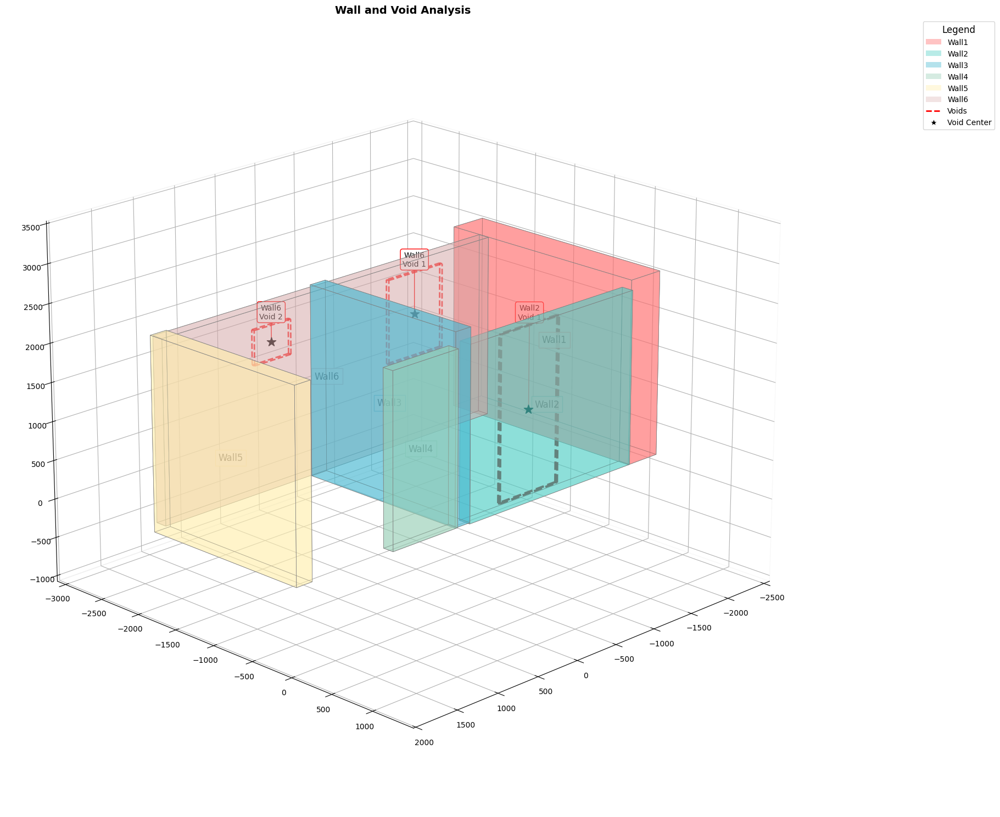

In [54]:
def visualize_walls_with_dimensions(wall_solids, combined_void_analysis):
    """
    Create an enhanced 3D visualization with simplified void labels.
    """
    fig = plt.figure(figsize=(20, 15))
    ax = fig.add_subplot(111, projection='3d')
    
    # Define distinct colors for each wall with adjusted alpha values
    wall_colors = {
        'Wall1': ('#FF6B6B', 0.4),  # Red
        'Wall2': ('#4ECDC4', 0.4),  # Turquoise (more opaque)
        'Wall3': ('#45B7D1', 0.4),  # Blue
        'Wall4': ('#96CEB4', 0.4),  # Green
        'Wall5': ('#FFEEAD', 0.4),  # Yellow
        'Wall6': ('#D4A5A5', 0.3)   # Pink (more transparent)
    }
    
    # Define void visualization properties
    void_line_color = 'red'
    void_line_style = '--'
    void_line_width = 2
    void_line_alpha = 0.8
    
    # Special void properties for Wall2 and Wall4
    wall_specific_void_properties = {
        'Wall2': {'color': 'darkred', 'width': 3, 'alpha': 1.0},
        'Wall4': {'color': 'darkred', 'width': 3, 'alpha': 1.0}
    }
    
    # Store void labels for later plotting
    void_labels = []
    
    for wall_name, wall_solid in wall_solids.items():
        vertices = wall_solid['vertices']
        faces = wall_solid['faces']
        
        # Get wall color and alpha from dictionary
        wall_color, wall_alpha = wall_colors.get(wall_name, ('#CCCCCC', 0.4))
        
        # Plot wall with custom transparency
        wall_polygons = [vertices[face_vertices] for face_vertices in faces.values()]
        wall_poly = Poly3DCollection(wall_polygons, alpha=wall_alpha, edgecolors='grey', linewidths=0.5)
        wall_poly.set_facecolor(wall_color)
        ax.add_collection3d(wall_poly)
        
        # Calculate wall dimensions
        min_coords = np.min(vertices, axis=0)
        max_coords = np.max(vertices, axis=0)
        dimensions = max_coords - min_coords
        center = (min_coords + max_coords) / 2
        
        # Add wall dimensions text
        wall_text = f'{wall_name}'
        ax.text(center[0], center[1], center[2], wall_text,
                fontsize=12, ha='center', va='center',
                bbox=dict(facecolor='white', alpha=0.8, edgecolor=wall_color, pad=4))
        
        # Plot voids if they exist
        if wall_name in combined_void_analysis:
            # Get wall-specific void properties if they exist
            void_props = wall_specific_void_properties.get(wall_name, {
                'color': void_line_color,
                'width': void_line_width,
                'alpha': void_line_alpha
            })
            
            for void_idx, void_info in enumerate(combined_void_analysis[wall_name]):
                void_center = void_info['center']
                
                # Calculate void box corners
                half_width = void_info['width'] / 2
                half_thickness = void_info['thickness'] / 2
                half_height = void_info['height'] / 2
                
                # Create void box vertices
                void_points = np.array([
                    # Bottom face
                    [void_center[0] - half_width, void_center[1] - half_thickness, void_center[2] - half_height],
                    [void_center[0] + half_width, void_center[1] - half_thickness, void_center[2] - half_height],
                    [void_center[0] + half_width, void_center[1] + half_thickness, void_center[2] - half_height],
                    [void_center[0] - half_width, void_center[1] + half_thickness, void_center[2] - half_height],
                    # Top face
                    [void_center[0] - half_width, void_center[1] - half_thickness, void_center[2] + half_height],
                    [void_center[0] + half_width, void_center[1] - half_thickness, void_center[2] + half_height],
                    [void_center[0] + half_width, void_center[1] + half_thickness, void_center[2] + half_height],
                    [void_center[0] - half_width, void_center[1] + half_thickness, void_center[2] + half_height],
                ])
                
                # Draw void edges with customized lines
                for i, j in [(0,1), (1,2), (2,3), (3,0),  # bottom face
                            (4,5), (5,6), (6,7), (7,4),  # top face
                            (0,4), (1,5), (2,6), (3,7)]:  # vertical edges
                    ax.plot3D([void_points[i,0], void_points[j,0]],
                             [void_points[i,1], void_points[j,1]],
                             [void_points[i,2], void_points[j,2]],
                             color=void_props['color'],
                             linestyle=void_line_style,
                             linewidth=void_props['width'],
                             alpha=void_props['alpha'])
                
                # Plot void center point
                ax.scatter(*void_center, color='black', marker='*', s=150, edgecolor='black', linewidth=1)
                
                # Store simplified void label information
                void_labels.append({
                    'position': void_center,
                    'height': void_info['height'],
                    'text': f'{wall_name}\nVoid {void_idx + 1}',
                    'wall_name': wall_name
                })
    
    # Plot void labels after all walls are drawn
    for label in void_labels:
        center = label['position']
        # Adjust label position to be more visible
        offset = np.array([0, 0, label['height']/2 + 50])  # Reduced offset
        label_pos = center + offset
        
        # Draw short leader line
        ax.plot([center[0], label_pos[0]],
                [center[1], label_pos[1]],
                [center[2], label_pos[2]],
                color='red', linestyle='-', linewidth=1)
        
        # Add simplified text label
        ax.text(label_pos[0], label_pos[1], label_pos[2],
                label['text'],
                fontsize=10,
                ha='center', va='bottom',
                bbox=dict(facecolor='white',
                         alpha=1.0,
                         edgecolor='red',
                         pad=2,
                         boxstyle='round,pad=0.3'))
    
    # Set labels and title
    ax.set_title('Wall and Void Analysis', 
                fontsize=14, fontweight='bold')
    
    # Set equal aspect ratio
    all_points = np.vstack([wall['vertices'] for wall in wall_solids.values()])
    max_range = np.ptp(all_points, axis=0).max() / 2
    mid_x = np.mean(all_points[:, 0])
    mid_y = np.mean(all_points[:, 1])
    mid_z = np.mean(all_points[:, 2])
    
    ax.set_xlim(mid_x - max_range, mid_x + max_range)
    ax.set_ylim(mid_y - max_range, mid_y + max_range)
    ax.set_zlim(mid_z - max_range, mid_z + max_range)
    
    # Customize grid and background
    ax.grid(True, linestyle='--', alpha=0.3)
    ax.xaxis.pane.fill = False
    ax.yaxis.pane.fill = False
    ax.zaxis.pane.fill = False
    
    # Set optimal viewing angle
    ax.view_init(elev=20, azim=45)
    
    # Create legend
    legend_elements = []
    legend_labels = []
    
    # Add wall colors to legend
    for wall_name, (color, alpha) in wall_colors.items():
        legend_elements.append(plt.Rectangle((0, 0), 1, 1, fc=color, alpha=alpha))
        legend_labels.append(wall_name)
    
    # Add void representation to legend
    legend_elements.append(plt.Line2D([0], [0], color=void_line_color, linestyle=void_line_style,
                                    linewidth=void_line_width))
    legend_labels.append('Voids')
    
    # Add void center point to legend
    legend_elements.append(plt.Line2D([0], [0], marker='*', color='w', 
                                    markerfacecolor='black', markersize=10))
    legend_labels.append('Void Center')
    
    ax.legend(legend_elements, legend_labels,
             title="Legend", bbox_to_anchor=(1.15, 1),
             loc='upper left', fontsize=10, title_fontsize=12)
    
    plt.tight_layout()
    plt.show()

# Execute the visualization if required data is available
if 'wall_solids' in globals() and 'combined_void_analysis' in globals():
    visualize_walls_with_dimensions(wall_solids, combined_void_analysis)
else:
    print("Please ensure wall_solids and combined_void_analysis are available.")


Step 1: Adjusting void thicknesses to match wall thicknesses...

Step 2: Reducing Wall6 and void thickness by 0mm...

Preparing entities for visualization with reduced wall geometry...
Creating integrated visualization with maintained voids...


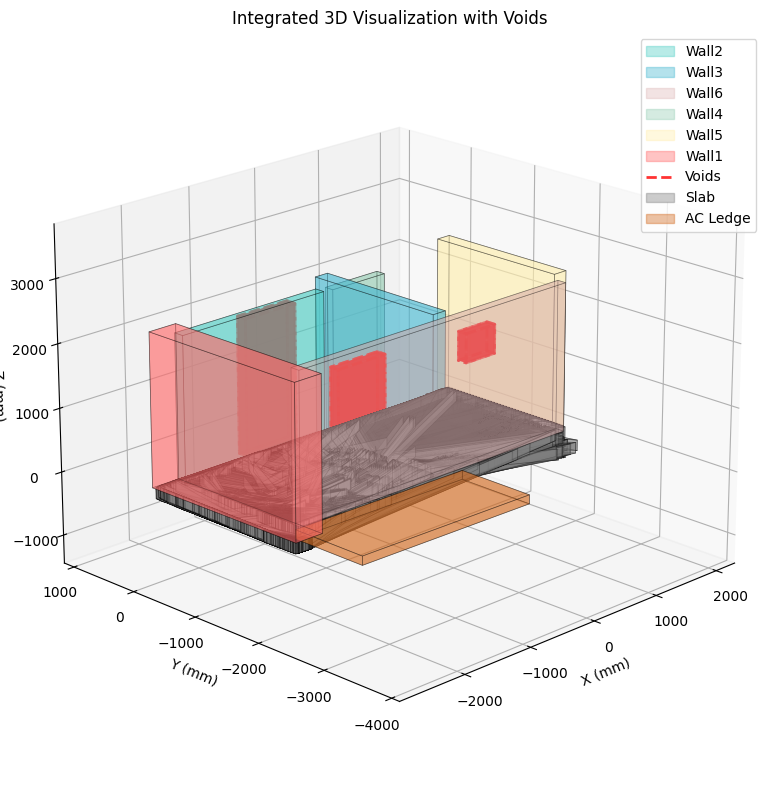

In [55]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
from matplotlib.patches import Patch
from sklearn.decomposition import PCA

# ------------------ VISUALIZATION FUNCTION ------------------
def visualize_integrated_entities(wall_solids, combined_void_analysis, slab_entity, ac_ledge_entity, 
                              azim_angle=225, elev_angle=20):
    """
    Create 3D visualization with solid entities and proper face handling.
    """
    # Define color scheme
    wall_colors = {
        'Wall1': ('#FF6B6B', 0.4),  # Red
        'Wall2': ('#4ECDC4', 0.4),  # Turquoise
        'Wall3': ('#45B7D1', 0.4),  # Blue
        'Wall4': ('#96CEB4', 0.4),  # Green
        'Wall5': ('#FFEEAD', 0.4),  # Yellow
        'Wall6': ('#D4A5A5', 0.3)   # Pink
    }
    
    # Define void visualization properties
    void_line_color = 'red'
    void_line_style = '--'
    void_line_width = 2
    void_line_alpha = 0.8
    
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    def plot_solid_entity(vertices, color, alpha, is_void=False):
        n = len(vertices) // 2
        top_vertices = vertices[:n]
        bottom_vertices = vertices[n:]
        faces = []
        faces.append(top_vertices)
        faces.append(bottom_vertices)
        for i in range(n):
            j = (i + 1) % n
            side_face = np.array([
                vertices[i],
                vertices[j],
                vertices[j + n],
                vertices[i + n]
            ])
            faces.append(side_face)
        poly_collection = Poly3DCollection(faces)
        poly_collection.set_facecolor(color)
        poly_collection.set_alpha(alpha)
        
        # Apply special styling for voids
        if is_void:
            poly_collection.set_edgecolor(void_line_color)
            poly_collection.set_linestyle(void_line_style)
            poly_collection.set_linewidth(void_line_width)
            poly_collection.set_alpha(void_line_alpha)
        else:
            poly_collection.set_edgecolor('black')
            poly_collection.set_linewidth(0.5)
            
        ax.add_collection3d(poly_collection)
    
    # Plot walls
    legend_handles = []
    for wall_id, wall_data in wall_solids.items():
        vertices = wall_data['vertices']
        color, alpha = wall_colors.get(wall_id, ('#808080', 0.4))
        plot_solid_entity(vertices, color, alpha)
        # Add wall to legend
        wall_patch = Patch(color=color, alpha=alpha, label=wall_id)
        legend_handles.append(wall_patch)

    # Plot voids - IMPROVED HANDLING FOR BETTER VISUALIZATION
    if combined_void_analysis is not None:
        void_added = False
        for wall_name, void_clusters in combined_void_analysis.items():
            for void in void_clusters:
                if 'vertices' in void:
                    void_vertices = np.array(void['vertices'])
                    # Ensure we have enough vertices to form a solid
                    if len(void_vertices) >= 6:
                        plot_solid_entity(void_vertices, '#FF0000', 0.7, is_void=True)
                        void_added = True
                    # Handle case where we just have a surface
                    elif len(void_vertices) >= 3:
                        poly = Poly3DCollection([void_vertices])
                        poly.set_alpha(0.7)
                        poly.set_facecolor('red')
                        poly.set_edgecolor(void_line_color)
                        poly.set_linestyle(void_line_style)
                        poly.set_linewidth(void_line_width)
                        ax.add_collection3d(poly)
                        void_added = True
                # Handle voids without explicit vertices but with coordinates
                elif 'center' in void and 'width' in void and 'height' in void and 'thickness' in void:
                    # Create vertices for the void based on dimensions
                    center = np.array(void['center'])
                    width = void['width']
                    height = void['height']
                    thickness = void['thickness']
                    
                    # Calculate half dimensions
                    half_width = width / 2
                    half_height = height / 2
                    half_thickness = thickness / 2
                    
                    # Create vertices for top and bottom faces
                    void_vertices = np.array([
                        # Top face
                        [center[0] - half_width, center[1] - half_thickness, center[2] + half_height],
                        [center[0] + half_width, center[1] - half_thickness, center[2] + half_height],
                        [center[0] + half_width, center[1] + half_thickness, center[2] + half_height],
                        [center[0] - half_width, center[1] + half_thickness, center[2] + half_height],
                        # Bottom face
                        [center[0] - half_width, center[1] - half_thickness, center[2] - half_height],
                        [center[0] + half_width, center[1] - half_thickness, center[2] - half_height],
                        [center[0] + half_width, center[1] + half_thickness, center[2] - half_height],
                        [center[0] - half_width, center[1] + half_thickness, center[2] - half_height]
                    ])
                    
                    plot_solid_entity(void_vertices, '#FF0000', 0.7, is_void=True)
                    void_added = True

        # Add void to legend if at least one void was added
        if void_added:
            # Create custom void patch for legend that shows the dashed line style
            from matplotlib.lines import Line2D
            void_patch = Line2D([0], [0], color=void_line_color, linestyle=void_line_style, 
                               linewidth=void_line_width, alpha=void_line_alpha, label='Voids')
            legend_handles.append(void_patch)

    # Plot slab
    if slab_entity is not None:
        plot_solid_entity(slab_entity['vertices'], '#808080', 0.4)
        slab_patch = Patch(color='#808080', alpha=0.4, label='Slab')
        legend_handles.append(slab_patch)

    # Plot AC ledge
    if ac_ledge_entity is not None:
        plot_solid_entity(ac_ledge_entity['vertices'], '#D2691E', 0.4)
        ac_ledge_patch = Patch(color='#D2691E', alpha=0.4, label='AC Ledge')
        legend_handles.append(ac_ledge_patch)

    # Add comprehensive legend
    plt.legend(handles=legend_handles, loc='upper right')

    ax.set_xlabel('X (mm)')
    ax.set_ylabel('Y (mm)')
    ax.set_zlabel('Z (mm)')
    ax.view_init(elev=elev_angle, azim=azim_angle)

    limits = np.array([
        ax.get_xlim3d(),
        ax.get_ylim3d(),
        ax.get_zlim3d(),
    ])
    center = np.mean(limits, axis=1)
    radius = 0.5 * np.max(np.abs(limits[:, 1] - limits[:, 0]))
    ax.set_xlim3d([center[0] - radius, center[0] + radius])
    ax.set_ylim3d([center[1] - radius, center[1] + radius])
    ax.set_zlim3d([center[2] - radius, center[2] + radius])

    plt.title('Integrated 3D Visualization with Voids')
    plt.tight_layout()
    plt.show()

# ------------------ UTILITIES ------------------
def find_minimum_area_rectangle(points_2d):
    pca = PCA(n_components=2)
    pca.fit(points_2d)
    points_pca = pca.transform(points_2d)
    min_coords = np.min(points_pca, axis=0)
    max_coords = np.max(points_pca, axis=0)
    corners_pca = np.array([
        [min_coords[0], min_coords[1]],
        [max_coords[0], min_coords[1]],
        [max_coords[0], max_coords[1]],
        [min_coords[0], max_coords[1]]
    ])
    rect_points = pca.inverse_transform(corners_pca)
    return rect_points

def create_slab_entity(rect_points, z_bottom, thickness, wall_solids):
    top_vertices = np.column_stack((rect_points, np.full(len(rect_points), z_bottom + thickness)))
    bottom_vertices = np.column_stack((rect_points, np.full(len(rect_points), z_bottom)))
    vertices = np.vstack((top_vertices, bottom_vertices))
    width = np.linalg.norm(rect_points[1] - rect_points[0])
    length = np.linalg.norm(rect_points[2] - rect_points[1])
    return {
        'vertices': vertices,
        'width': width,
        'length': length,
        'thickness': thickness,
        'z_bottom': z_bottom
    }

def create_ac_ledge_entity(points_2d, z_min, ac_ledge_thickness, wall_solids):
    rect_points = find_minimum_area_rectangle(points_2d)
    top_vertices = np.column_stack((rect_points, np.full(len(rect_points), z_min + ac_ledge_thickness)))
    bottom_vertices = np.column_stack((rect_points, np.full(len(rect_points), z_min)))
    vertices = np.vstack((bottom_vertices, top_vertices))
    faces = {
        'bottom': [0, 1, 2, 3],
        'top': [4, 5, 6, 7],
        'front': [0, 1, 5, 4],
        'right': [1, 2, 6, 5],
        'back': [2, 3, 7, 6],
        'left': [3, 0, 4, 7]
    }
    return {
        'vertices': vertices,
        'faces': faces
    }

def prepare_entities_for_visualization(slab_points, ac_ledge_points, slab_thickness, ac_ledge_thickness, reduced_wall_solids):
    slab_xyz = slab_points[:, :3]
    ac_ledge_xyz = ac_ledge_points[:, :3]
    wall_z_min = float('inf')
    for wall in reduced_wall_solids.values():
        wall_z_min = min(wall_z_min, np.min(wall['vertices'][:, 2]))
    slab_top = wall_z_min
    slab_bottom = slab_top - slab_thickness
    slab_entity = create_slab_entity(slab_xyz[:, :2], slab_bottom, slab_thickness, reduced_wall_solids)
    ac_ledge_z_min = np.min(ac_ledge_xyz[:, 2])
    ac_ledge_entity = create_ac_ledge_entity(ac_ledge_xyz[:, :2], ac_ledge_z_min, ac_ledge_thickness, reduced_wall_solids)
    return slab_entity, ac_ledge_entity

# ------------------ VOID & WALL HANDLING ------------------
def adjust_void_thickness(wall_solids, combined_void_analysis):
    adjusted_void_analysis = {}
    dimension_data = extract_dimensions(wall_solids, combined_void_analysis)
    for wall_name, wall_info in dimension_data.items():
        if wall_name == 'Wall1' or wall_name not in combined_void_analysis:
            continue
        wall_thickness = wall_info['dimensions']['thickness']
        wall_clusters = combined_void_analysis[wall_name]
        adjusted_clusters = []
        for cluster_info in wall_clusters:
            adjusted_cluster = cluster_info.copy()
            adjusted_cluster['thickness'] = wall_thickness
            adjusted_cluster['dimensions'] = {
                'width': cluster_info['width'],
                'thickness': wall_thickness,
                'height': cluster_info['height']
            }
            adjusted_cluster['volume'] = cluster_info['width'] * wall_thickness * cluster_info['height']
            adjusted_cluster['surface_area'] = 2 * (cluster_info['width'] * wall_thickness + cluster_info['width'] * cluster_info['height'] + wall_thickness * cluster_info['height'])
            
            # Ensure vertices exist for visualization
            if 'center' in cluster_info and 'vertices' not in cluster_info:
                # Create vertices for the cluster
                center = np.array(cluster_info['center'])
                width = cluster_info['width']
                height = cluster_info['height']
                
                # Calculate vertices
                half_width = width / 2
                half_height = height / 2
                half_thickness = wall_thickness / 2
                
                vertices = np.array([
                    # Top face
                    [center[0] - half_width, center[1] - half_thickness, center[2] + half_height],
                    [center[0] + half_width, center[1] - half_thickness, center[2] + half_height],
                    [center[0] + half_width, center[1] + half_thickness, center[2] + half_height],
                    [center[0] - half_width, center[1] + half_thickness, center[2] + half_height],
                    # Bottom face
                    [center[0] - half_width, center[1] - half_thickness, center[2] - half_height],
                    [center[0] + half_width, center[1] - half_thickness, center[2] - half_height],
                    [center[0] + half_width, center[1] + half_thickness, center[2] - half_height],
                    [center[0] - half_width, center[1] + half_thickness, center[2] - half_height]
                ])
                
                adjusted_cluster['vertices'] = vertices
            
            adjusted_clusters.append(adjusted_cluster)
        adjusted_void_analysis[wall_name] = adjusted_clusters
    return adjusted_void_analysis

def extract_dimensions(wall_solids, combined_void_analysis):
    """
    Extract dimensions from wall solids and voids.
    This function would be provided elsewhere - adding stub for completeness
    """
    dimensions = {}
    for wall_id, wall_data in wall_solids.items():
        vertices = wall_data['vertices']
        x_min, x_max = np.min(vertices[:, 0]), np.max(vertices[:, 0])
        y_min, y_max = np.min(vertices[:, 1]), np.max(vertices[:, 1])
        z_min, z_max = np.min(vertices[:, 2]), np.max(vertices[:, 2])
        
        width = max(x_max - x_min, 0.1)  # Ensure non-zero width
        thickness = max(y_max - y_min, 0.1)  # Ensure non-zero thickness
        height = max(z_max - z_min, 0.1)  # Ensure non-zero height
        
        dimensions[wall_id] = {
            'dimensions': {
                'width': width,
                'thickness': thickness,
                'height': height
            },
            'bounds': {
                'x': [x_min, x_max],
                'y': [y_min, y_max],
                'z': [z_min, z_max]
            }
        }
    return dimensions

def reduce_thickness(wall_solids, adjusted_void_analysis, reduction=0):
    reduced_wall_solids = wall_solids.copy()
    reduced_void_analysis = adjusted_void_analysis.copy()
    return reduced_wall_solids, reduced_void_analysis

# ------------------ MAIN EXECUTION ------------------
print("\nStep 1: Adjusting void thicknesses to match wall thicknesses...")
adjusted_void_analysis = adjust_void_thickness(wall_solids, combined_void_analysis)

print("\nStep 2: Reducing Wall6 and void thickness by 0mm...")
reduced_wall_solids, reduced_void_analysis = reduce_thickness(wall_solids, adjusted_void_analysis, reduction=0)

if ('reduced_wall_solids' in globals() and 'reduced_void_analysis' in globals() and 'slab_points' in globals() and 'ac_ledge_points' in globals()):
    slab_thickness = 170.19
    ac_ledge_thickness = 140.39
    print("\nPreparing entities for visualization with reduced wall geometry...")
    slab_entity, ac_ledge_entity = prepare_entities_for_visualization(slab_points, ac_ledge_points, slab_thickness, ac_ledge_thickness, reduced_wall_solids)
    print("Creating integrated visualization with maintained voids...")
    visualize_integrated_entities(reduced_wall_solids, reduced_void_analysis, slab_entity, ac_ledge_entity, azim_angle=225)
else:
    print("Missing required variables!")

Performing sequential component adjustments...

Step 2: Adjusting Slab Position
--------------------------------------------------
Original slab Y min: -2289.79mm
Overlap length: 368.88mm
New slab Y min: -1920.91mm
Total Y adjustment: 368.88mm

Step 3: Extending Walls
--------------------------------------------------
Extended Wall6 bottom by 11.34mm

Adjustments complete!

Analyzing adjusted components...

Analyzing Wall-Slab Interactions:
--------------------------------------------------
Wall2-Slab: Good contact (gap: 0.00mm)
Wall3-Slab: Good contact (gap: 0.52mm)
Wall6-Slab: Good contact (gap: 0.00mm)
Wall4-Slab: Good contact (gap: 0.12mm)
Wall5-Slab: Good contact (gap: 0.14mm)
Wall1-Slab: Good contact (gap: 1.53mm)

Analyzing Wall-AC Ledge Interactions:
--------------------------------------------------

Analyzing Slab-AC Ledge Interactions:
--------------------------------------------------
Slab-AC Ledge: Vertical overlap detected (165.28mm)
Overlap area: 0.00 sq mm
Visualization

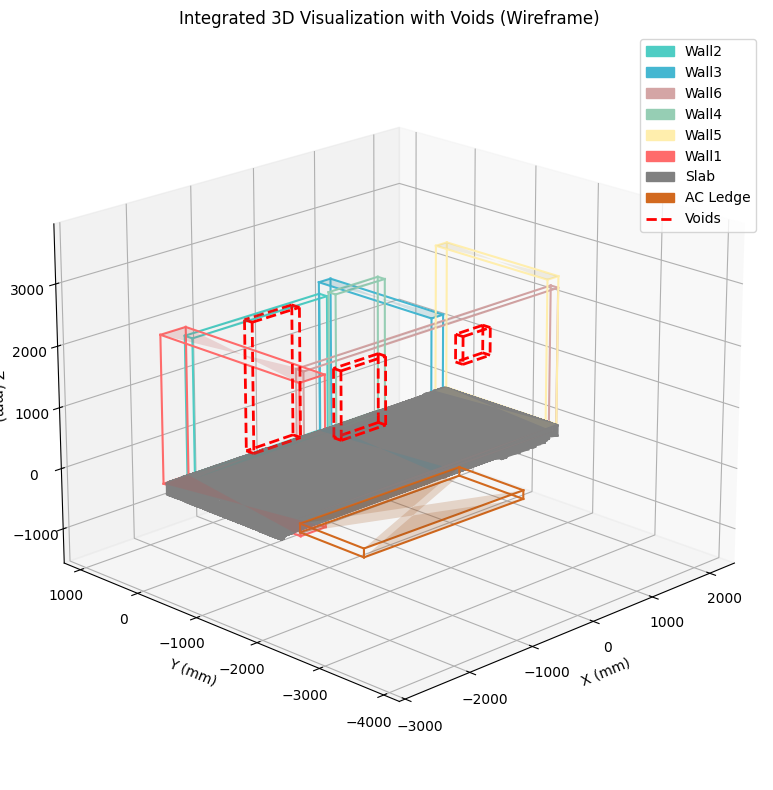

Visualization completed successfully.
Visualization created successfully.


In [58]:
def find_overlap_coordinates(slab_entity, ac_ledge_entity):
    """
    Find overlap coordinates between slab and AC ledge.
    """
    # Placeholder implementation
    overlap_bounds = {
        'x_min': 0,
        'x_max': 0,
        'y_min': 0,
        'y_max': 0
    }
    
    # Add actual implementation if needed
    if slab_entity is not None and ac_ledge_entity is not None:
        slab_vertices = slab_entity['vertices']
        ac_ledge_vertices = ac_ledge_entity['vertices']
        
        # Find overlapping bounds in X-Y plane
        slab_x_min, slab_x_max = np.min(slab_vertices[:, 0]), np.max(slab_vertices[:, 0])
        slab_y_min, slab_y_max = np.min(slab_vertices[:, 1]), np.max(slab_vertices[:, 1])
        
        ac_x_min, ac_x_max = np.min(ac_ledge_vertices[:, 0]), np.max(ac_ledge_vertices[:, 0])
        ac_y_min, ac_y_max = np.min(ac_ledge_vertices[:, 1]), np.max(ac_ledge_vertices[:, 1])
        
        overlap_bounds = {
            'x_min': max(slab_x_min, ac_x_min),
            'x_max': min(slab_x_max, ac_x_max),
            'y_min': max(slab_y_min, ac_y_min),
            'y_max': min(slab_y_max, ac_y_max)
        }
    
    return overlap_bounds

def analyze_component_interactions(wall_solids, slab_entity, ac_ledge_entity, tolerance=2.0):
    """
    Analyze overlaps and gaps between all components including slab-AC ledge interactions.
    
    Args:
        wall_solids: dict of wall geometries
        slab_entity: dict containing slab geometry
        ac_ledge_entity: dict containing AC ledge geometry
        tolerance: float, tolerance in mm for considering gaps/overlaps
    """
    import matplotlib.pyplot as plt
    import numpy as np
    from mpl_toolkits.mplot3d.art3d import Poly3DCollection
    
    results = {
        'overlaps': [],
        'gaps': [],
        'contacts': []
    }
    
    # Extract vertices
    slab_vertices = slab_entity['vertices']
    ac_ledge_vertices = ac_ledge_entity['vertices']
    
    def get_bounds(vertices):
        min_coords = np.min(vertices, axis=0)
        max_coords = np.max(vertices, axis=0)
        return min_coords, max_coords
    
    slab_min, slab_max = get_bounds(slab_vertices)
    ac_ledge_min, ac_ledge_max = get_bounds(ac_ledge_vertices)
    
    # Analyze wall-slab interactions
    print("\nAnalyzing Wall-Slab Interactions:")
    print("-" * 50)
    for wall_name, wall_data in wall_solids.items():
        wall_vertices = wall_data['vertices']
        wall_min, wall_max = get_bounds(wall_vertices)
        
        # Check wall-slab interaction
        vertical_gap = wall_min[2] - slab_max[2]
        
        # Check XY overlap
        x_overlap = not (wall_max[0] < slab_min[0] or wall_min[0] > slab_max[0])
        y_overlap = not (wall_max[1] < slab_min[1] or wall_min[1] > slab_max[1])
        xy_overlap = x_overlap and y_overlap
        
        if xy_overlap:
            if abs(vertical_gap) < tolerance:
                results['contacts'].append({
                    'components': (wall_name, 'Slab'),
                    'type': 'contact',
                    'location': 'vertical',
                    'gap': vertical_gap
                })
                print(f"{wall_name}-Slab: Good contact (gap: {vertical_gap:.2f}mm)")
            elif vertical_gap < -tolerance:
                results['overlaps'].append({
                    'components': (wall_name, 'Slab'),
                    'type': 'overlap',
                    'amount': -vertical_gap,
                    'location': 'vertical'
                })
                print(f"{wall_name}-Slab: Overlap detected ({-vertical_gap:.2f}mm)")
            else:
                results['gaps'].append({
                    'components': (wall_name, 'Slab'),
                    'type': 'gap',
                    'amount': vertical_gap,
                    'location': 'vertical'
                })
                print(f"{wall_name}-Slab: Gap detected ({vertical_gap:.2f}mm)")
    
    # Analyze wall-AC ledge interactions
    print("\nAnalyzing Wall-AC Ledge Interactions:")
    print("-" * 50)
    for wall_name, wall_data in wall_solids.items():
        wall_vertices = wall_data['vertices']
        wall_min, wall_max = get_bounds(wall_vertices)
        
        # Check XY overlap
        x_overlap = not (wall_max[0] < ac_ledge_min[0] or wall_min[0] > ac_ledge_max[0])
        y_overlap = not (wall_max[1] < ac_ledge_min[1] or wall_min[1] > ac_ledge_max[1])
        xy_overlap = x_overlap and y_overlap
        
        if xy_overlap:
            # Check vertical interaction
            vertical_overlap = min(wall_max[2], ac_ledge_max[2]) - max(wall_min[2], ac_ledge_min[2])
            
            if vertical_overlap > tolerance:
                results['overlaps'].append({
                    'components': (wall_name, 'AC Ledge'),
                    'type': 'overlap',
                    'amount': vertical_overlap,
                    'location': 'vertical'
                })
                print(f"{wall_name}-AC Ledge: Overlap detected ({vertical_overlap:.2f}mm)")
            elif abs(vertical_overlap) < tolerance:
                results['contacts'].append({
                    'components': (wall_name, 'AC Ledge'),
                    'type': 'contact',
                    'location': 'vertical',
                    'gap': 0
                })
                print(f"{wall_name}-AC Ledge: Good contact")

    # Analyze slab-AC ledge interactions
    print("\nAnalyzing Slab-AC Ledge Interactions:")
    print("-" * 50)
    
    # Check XY overlap between slab and AC ledge
    x_overlap = not (ac_ledge_max[0] < slab_min[0] or ac_ledge_min[0] > slab_max[0])
    y_overlap = not (ac_ledge_max[1] < slab_min[1] or ac_ledge_min[1] > slab_max[1])
    xy_overlap = x_overlap and y_overlap
    
    if xy_overlap:
        # Calculate overlap area
        overlap_min_x = max(slab_min[0], ac_ledge_min[0])
        overlap_max_x = min(slab_max[0], ac_ledge_max[0])
        overlap_min_y = max(slab_min[1], ac_ledge_min[1])
        overlap_max_y = min(slab_max[1], ac_ledge_max[1])
        
        overlap_area = (overlap_max_x - overlap_min_x) * (overlap_max_y - overlap_min_y)
        
        # Check vertical separation
        vertical_gap = ac_ledge_min[2] - slab_max[2]
        
        if vertical_gap < -tolerance:
            results['overlaps'].append({
                'components': ('Slab', 'AC Ledge'),
                'type': 'overlap',
                'amount': -vertical_gap,
                'location': 'vertical',
                'area': overlap_area
            })
            print(f"Slab-AC Ledge: Vertical overlap detected ({-vertical_gap:.2f}mm)")
            print(f"Overlap area: {overlap_area:.2f} sq mm")
        elif vertical_gap > tolerance:
            results['gaps'].append({
                'components': ('Slab', 'AC Ledge'),
                'type': 'gap',
                'amount': vertical_gap,
                'location': 'vertical',
                'area': overlap_area
            })
            print(f"Slab-AC Ledge: Vertical gap detected ({vertical_gap:.2f}mm)")
        else:
            results['contacts'].append({
                'components': ('Slab', 'AC Ledge'),
                'type': 'contact',
                'location': 'vertical',
                'gap': vertical_gap,
                'area': overlap_area
            })
            print(f"Slab-AC Ledge: Good contact (gap: {vertical_gap:.2f}mm)")
            print(f"Contact area: {overlap_area:.2f} sq mm")
    
    # Visualize analysis results
    try:
        visualize_interaction_analysis(wall_solids, slab_entity, ac_ledge_entity, results)
    except Exception as e:
        print(f"Visualization error: {str(e)}")
        print("Continuing without visualization...")
    
    return results
    
def remove_overlapping_portion(slab_entity, overlap_bounds):
    """
    Adjust slab by moving its Y min boundary to remove overlap with AC ledge.
    """
    slab_vertices = slab_entity['vertices']
    n_total_vertices = len(slab_vertices)
    half_vertices = n_total_vertices // 2
    
    # Separate bottom and top vertices
    bottom_vertices = slab_vertices[:half_vertices]
    top_vertices = slab_vertices[half_vertices:]
    
    # Calculate overlap length
    overlap_length = overlap_bounds['y_max'] - overlap_bounds['y_min']
    
    # Function to adjust Y coordinate
    def adjust_y_coordinate(vertex):
        new_vertex = vertex.copy()
        if vertex[1] <= overlap_bounds['y_max']:
            # Shift Y coordinate by overlap length
            new_vertex[1] = vertex[1] + overlap_length
        return new_vertex
    
    # Adjust vertices
    new_bottom_vertices = [adjust_y_coordinate(vertex) for vertex in bottom_vertices]
    new_top_vertices = [adjust_y_coordinate(vertex) for vertex in top_vertices]
    
    # Combine vertices
    trimmed_vertices = np.vstack([new_bottom_vertices, new_top_vertices])
    
    return trimmed_vertices

def adjust_components_sequentially(wall_solids, slab_entity, ac_ledge_entity, combined_void_analysis=None, tolerance=2.0):
    """
    Sequentially adjust components:
    1. Find overlap and adjust slab Y min
    2. Extend walls to meet adjusted slab
    3. Maintain void data for visualization
    """
    import copy
    
    adjusted_walls = copy.deepcopy(wall_solids)
    adjusted_slab = copy.deepcopy(slab_entity)
    adjusted_voids = copy.deepcopy(combined_void_analysis) if combined_void_analysis is not None else None
    
    # Find overlap coordinates
    overlap_bounds = find_overlap_coordinates(adjusted_slab, ac_ledge_entity)
    
    # Calculate overlap length
    overlap_length = overlap_bounds['y_max'] - overlap_bounds['y_min']
    
    print("\nStep 2: Adjusting Slab Position")
    print("-" * 50)
    original_vertices = adjusted_slab['vertices']
    original_y_min = np.min(original_vertices[:, 1])
    
    # Remove overlapping portion from slab
    trimmed_vertices = remove_overlapping_portion(adjusted_slab, overlap_bounds)
    adjusted_slab['vertices'] = trimmed_vertices
    
    # Calculate new bounds
    new_y_min = np.min(trimmed_vertices[:, 1])
    
    print(f"Original slab Y min: {original_y_min:.2f}mm")
    print(f"Overlap length: {overlap_length:.2f}mm")
    print(f"New slab Y min: {new_y_min:.2f}mm")
    print(f"Total Y adjustment: {new_y_min - original_y_min:.2f}mm")
    
    print("\nStep 3: Extending Walls")
    print("-" * 50)
    
    # Extend walls to meet adjusted slab
    slab_max_z = np.max(trimmed_vertices[:, 2])
    
    for wall_name, wall_data in adjusted_walls.items():
        wall_vertices = wall_data['vertices']
        wall_min_z = np.min(wall_vertices[:, 2])
        
        # Calculate gap to slab
        gap = wall_min_z - slab_max_z
        
        if gap > tolerance:
            # Extend wall bottom to meet slab
            bottom_mask = np.isclose(wall_vertices[:, 2], wall_min_z)
            wall_vertices[bottom_mask, 2] = slab_max_z
            print(f"Extended {wall_name} bottom by {gap:.2f}mm")
            
            # Update vertices
            adjusted_walls[wall_name]['vertices'] = wall_vertices
    
    print("\nAdjustments complete!")
    return adjusted_walls, adjusted_slab, adjusted_voids

def visualize_integrated_entities_simple(wall_solids, combined_void_analysis, slab_entity, ac_ledge_entity, 
                              azim_angle=225, elev_angle=20):
    """
    Create 3D visualization with solid entities using simpler matplotlib primitives
    that are more robust to errors.
    """
    import numpy as np
    import matplotlib.pyplot as plt
    from mpl_toolkits.mplot3d import Axes3D
    from matplotlib.patches import Patch
    from matplotlib.lines import Line2D
    
    # Define color scheme
    wall_colors = {
        'Wall1': '#FF6B6B',  # Red
        'Wall2': '#4ECDC4',  # Turquoise
        'Wall3': '#45B7D1',  # Blue
        'Wall4': '#96CEB4',  # Green
        'Wall5': '#FFEEAD',  # Yellow
        'Wall6': '#D4A5A5'   # Pink
    }
    
    # Define void visualization properties
    void_color = 'red'
    void_line_style = '--'
    void_line_width = 2
    
    # Create figure and axis
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')
    legend_handles = []
    
    # Track all points to set axis limits
    all_points = []
    
    # Plot walls as simple line segments
    for wall_id, wall_data in wall_solids.items():
        if 'vertices' not in wall_data or not isinstance(wall_data['vertices'], np.ndarray):
            print(f"Warning: Wall {wall_id} has missing or invalid vertices")
            continue
            
        vertices = wall_data['vertices']
        if len(vertices) < 6:
            print(f"Warning: Wall {wall_id} has too few vertices ({len(vertices)})")
            continue
        
        # Add to all points
        all_points.append(vertices)
        
        # Get color for this wall
        color = wall_colors.get(wall_id, '#808080')
        
        # Plot wall as a wireframe
        n = len(vertices) // 2
        top_vertices = vertices[:n]
        bottom_vertices = vertices[n:]
        
        # Plot top face
        for i in range(n):
            j = (i + 1) % n
            ax.plot([top_vertices[i, 0], top_vertices[j, 0]], 
                    [top_vertices[i, 1], top_vertices[j, 1]], 
                    [top_vertices[i, 2], top_vertices[j, 2]], 
                    color=color, linewidth=1.5)
        
        # Plot bottom face
        for i in range(n):
            j = (i + 1) % n
            ax.plot([bottom_vertices[i, 0], bottom_vertices[j, 0]], 
                    [bottom_vertices[i, 1], bottom_vertices[j, 1]], 
                    [bottom_vertices[i, 2], bottom_vertices[j, 2]], 
                    color=color, linewidth=1.5)
        
        # Plot connecting lines
        for i in range(n):
            ax.plot([top_vertices[i, 0], bottom_vertices[i, 0]], 
                    [top_vertices[i, 1], bottom_vertices[i, 1]], 
                    [top_vertices[i, 2], bottom_vertices[i, 2]], 
                    color=color, linewidth=1.5)
        
        # Fill the faces with transparent color for better visualization
        try:
            # Only attempt to fill if we have a rectangular shape (4 vertices per face)
            if n == 4:
                # Top face
                ax.plot_surface(
                    top_vertices[:, 0].reshape((2, 2)),
                    top_vertices[:, 1].reshape((2, 2)),
                    top_vertices[:, 2].reshape((2, 2)),
                    color=color, alpha=0.2
                )
                
                # Bottom face
                ax.plot_surface(
                    bottom_vertices[:, 0].reshape((2, 2)),
                    bottom_vertices[:, 1].reshape((2, 2)),
                    bottom_vertices[:, 2].reshape((2, 2)),
                    color=color, alpha=0.2
                )
        except Exception as e:
            # If we can't plot the surface, just continue with the wireframe
            pass
        
        # Add to legend
        wall_patch = Patch(color=color, label=wall_id)
        legend_handles.append(wall_patch)
    
    # Plot slab if it exists
    if slab_entity is not None and 'vertices' in slab_entity and isinstance(slab_entity['vertices'], np.ndarray):
        vertices = slab_entity['vertices']
        if len(vertices) >= 6:
            # Add to all points
            all_points.append(vertices)
            
            # Plot as wireframe
            n = len(vertices) // 2
            top_vertices = vertices[:n]
            bottom_vertices = vertices[n:]
            
            # Plot top face
            for i in range(n):
                j = (i + 1) % n
                ax.plot([top_vertices[i, 0], top_vertices[j, 0]], 
                        [top_vertices[i, 1], top_vertices[j, 1]], 
                        [top_vertices[i, 2], top_vertices[j, 2]], 
                        color='gray', linewidth=1.5)
            
            # Plot bottom face
            for i in range(n):
                j = (i + 1) % n
                ax.plot([bottom_vertices[i, 0], bottom_vertices[j, 0]], 
                        [bottom_vertices[i, 1], bottom_vertices[j, 1]], 
                        [bottom_vertices[i, 2], bottom_vertices[j, 2]], 
                        color='gray', linewidth=1.5)
            
            # Plot connecting lines
            for i in range(n):
                ax.plot([top_vertices[i, 0], bottom_vertices[i, 0]], 
                        [top_vertices[i, 1], bottom_vertices[i, 1]], 
                        [top_vertices[i, 2], bottom_vertices[i, 2]], 
                        color='gray', linewidth=1.5)
            
            # Try to fill faces
            try:
                # Only attempt to fill if we have a rectangular shape (4 vertices per face)
                if n == 4:
                    # Top face
                    ax.plot_surface(
                        top_vertices[:, 0].reshape((2, 2)),
                        top_vertices[:, 1].reshape((2, 2)),
                        top_vertices[:, 2].reshape((2, 2)),
                        color='gray', alpha=0.2
                    )
                    
                    # Bottom face
                    ax.plot_surface(
                        bottom_vertices[:, 0].reshape((2, 2)),
                        bottom_vertices[:, 1].reshape((2, 2)),
                        bottom_vertices[:, 2].reshape((2, 2)),
                        color='gray', alpha=0.2
                    )
            except Exception as e:
                pass
            
            # Add to legend
            slab_patch = Patch(color='gray', label='Slab')
            legend_handles.append(slab_patch)
    
    # Plot AC ledge if it exists
    if ac_ledge_entity is not None and 'vertices' in ac_ledge_entity and isinstance(ac_ledge_entity['vertices'], np.ndarray):
        vertices = ac_ledge_entity['vertices']
        if len(vertices) >= 6:
            # Add to all points
            all_points.append(vertices)
            
            # Plot as wireframe
            n = len(vertices) // 2
            top_vertices = vertices[:n]
            bottom_vertices = vertices[n:]
            
            # Plot top face
            for i in range(n):
                j = (i + 1) % n
                ax.plot([top_vertices[i, 0], top_vertices[j, 0]], 
                        [top_vertices[i, 1], top_vertices[j, 1]], 
                        [top_vertices[i, 2], top_vertices[j, 2]], 
                        color='#D2691E', linewidth=1.5)
            
            # Plot bottom face
            for i in range(n):
                j = (i + 1) % n
                ax.plot([bottom_vertices[i, 0], bottom_vertices[j, 0]], 
                        [bottom_vertices[i, 1], bottom_vertices[j, 1]], 
                        [bottom_vertices[i, 2], bottom_vertices[j, 2]], 
                        color='#D2691E', linewidth=1.5)
            
            # Plot connecting lines
            for i in range(n):
                ax.plot([top_vertices[i, 0], bottom_vertices[i, 0]], 
                        [top_vertices[i, 1], bottom_vertices[i, 1]], 
                        [top_vertices[i, 2], bottom_vertices[i, 2]], 
                        color='#D2691E', linewidth=1.5)
            
            # Try to fill faces
            try:
                # Only attempt to fill if we have a rectangular shape (4 vertices per face)
                if n == 4:
                    # Top face
                    ax.plot_surface(
                        top_vertices[:, 0].reshape((2, 2)),
                        top_vertices[:, 1].reshape((2, 2)),
                        top_vertices[:, 2].reshape((2, 2)),
                        color='#D2691E', alpha=0.2
                    )
                    
                    # Bottom face
                    ax.plot_surface(
                        bottom_vertices[:, 0].reshape((2, 2)),
                        bottom_vertices[:, 1].reshape((2, 2)),
                        bottom_vertices[:, 2].reshape((2, 2)),
                        color='#D2691E', alpha=0.2
                    )
            except Exception as e:
                pass
            
            # Add to legend
            ac_ledge_patch = Patch(color='#D2691E', label='AC Ledge')
            legend_handles.append(ac_ledge_patch)
    
    # Plot voids if they exist - Using ONLY line segments for robustness
    void_added = False
    if combined_void_analysis is not None:
        try:
            print("Processing voids using line segments...")
            
            def plot_void_wireframe(void_vertices):
                """Plot a void as a wireframe with dashed lines."""
                if not isinstance(void_vertices, np.ndarray):
                    void_vertices = np.array(void_vertices)
                
                if len(void_vertices) < 6:
                    print(f"Warning: Void has too few vertices ({len(void_vertices)})")
                    return False
                
                # Add to all points for bounding box
                all_points.append(void_vertices)
                
                n = len(void_vertices) // 2
                top_vertices = void_vertices[:n]
                bottom_vertices = void_vertices[n:]
                
                # Plot top face with dashed lines
                for i in range(n):
                    j = (i + 1) % n
                    ax.plot([top_vertices[i, 0], top_vertices[j, 0]], 
                            [top_vertices[i, 1], top_vertices[j, 1]], 
                            [top_vertices[i, 2], top_vertices[j, 2]], 
                            color=void_color, linestyle=void_line_style, 
                            linewidth=void_line_width)
                
                # Plot bottom face with dashed lines
                for i in range(n):
                    j = (i + 1) % n
                    ax.plot([bottom_vertices[i, 0], bottom_vertices[j, 0]], 
                            [bottom_vertices[i, 1], bottom_vertices[j, 1]], 
                            [bottom_vertices[i, 2], bottom_vertices[j, 2]], 
                            color=void_color, linestyle=void_line_style, 
                            linewidth=void_line_width)
                
                # Plot connecting lines with dashed lines
                for i in range(n):
                    ax.plot([top_vertices[i, 0], bottom_vertices[i, 0]], 
                            [top_vertices[i, 1], bottom_vertices[i, 1]], 
                            [top_vertices[i, 2], bottom_vertices[i, 2]], 
                            color=void_color, linestyle=void_line_style, 
                            linewidth=void_line_width)
                
                return True
            
            # Process voids based on data structure
            if isinstance(combined_void_analysis, dict):
                for wall_name, void_clusters in combined_void_analysis.items():
                    print(f"Processing voids for {wall_name}...")
                    
                    if isinstance(void_clusters, list):
                        for void_idx, void in enumerate(void_clusters):
                            try:
                                if 'vertices' in void and isinstance(void['vertices'], (list, np.ndarray)):
                                    success = plot_void_wireframe(void['vertices'])
                                    if success:
                                        void_added = True
                                # Handle voids without explicit vertices but with dimensions
                                elif all(k in void for k in ['center', 'width', 'height', 'thickness']):
                                    print(f"Creating vertices for void with dimensions in {wall_name}...")
                                    
                                    center = np.array(void['center']) if isinstance(void['center'], list) else void['center']
                                    width = void['width']
                                    height = void['height']
                                    thickness = void['thickness']
                                    
                                    # Calculate half dimensions
                                    half_width = width / 2
                                    half_height = height / 2
                                    half_thickness = thickness / 2
                                    
                                    # Create vertices for top and bottom faces
                                    void_vertices = np.array([
                                        # Top face
                                        [center[0] - half_width, center[1] - half_thickness, center[2] + half_height],
                                        [center[0] + half_width, center[1] - half_thickness, center[2] + half_height],
                                        [center[0] + half_width, center[1] + half_thickness, center[2] + half_height],
                                        [center[0] - half_width, center[1] + half_thickness, center[2] + half_height],
                                        # Bottom face
                                        [center[0] - half_width, center[1] - half_thickness, center[2] - half_height],
                                        [center[0] + half_width, center[1] - half_thickness, center[2] - half_height],
                                        [center[0] + half_width, center[1] + half_thickness, center[2] - half_height],
                                        [center[0] - half_width, center[1] + half_thickness, center[2] - half_height]
                                    ])
                                    
                                    success = plot_void_wireframe(void_vertices)
                                    if success:
                                        void_added = True
                            except Exception as e:
                                print(f"Error processing void {void_idx} in {wall_name}: {str(e)}")
                    elif isinstance(void_clusters, dict) and 'vertices' in void_clusters:
                        success = plot_void_wireframe(void_clusters['vertices'])
                        if success:
                            void_added = True
            elif isinstance(combined_void_analysis, list):
                for i, void_item in enumerate(combined_void_analysis):
                    try:
                        if isinstance(void_item, (list, np.ndarray)):
                            success = plot_void_wireframe(void_item)
                            if success:
                                void_added = True
                    except Exception as e:
                        print(f"Error processing void {i} in list: {str(e)}")
        except Exception as e:
            print(f"Error processing voids: {str(e)}")
    
    # Add void to legend if any voids were added
    if void_added:
        void_legend = Line2D([0], [0], color=void_color, linestyle=void_line_style, 
                           linewidth=void_line_width, label='Voids')
        legend_handles.append(void_legend)
    
    # Calculate bounds if we have points
    if all_points:
        try:
            all_points = np.vstack(all_points)
            
            min_x, max_x = np.min(all_points[:, 0]), np.max(all_points[:, 0])
            min_y, max_y = np.min(all_points[:, 1]), np.max(all_points[:, 1])
            min_z, max_z = np.min(all_points[:, 2]), np.max(all_points[:, 2])
            
            # Add some padding
            padding = 0.1 * max(max_x - min_x, max_y - min_y, max_z - min_z)
            
            ax.set_xlim(min_x - padding, max_x + padding)
            ax.set_ylim(min_y - padding, max_y + padding)
            ax.set_zlim(min_z - padding, max_z + padding)
        except Exception as e:
            print(f"Error setting axis limits: {str(e)}")
            # Default limits if no points
            ax.set_xlim(-100, 100)
            ax.set_ylim(-100, 100)
            ax.set_zlim(-100, 100)
    else:
        # Default limits if no points
        ax.set_xlim(-100, 100)
        ax.set_ylim(-100, 100)
        ax.set_zlim(-100, 100)
    
    # Add equal aspect ratio for better 3D visualization
    try:
        # Get current axis limits
        x_limits = ax.get_xlim3d()
        y_limits = ax.get_ylim3d()
        z_limits = ax.get_zlim3d()
        
        # Calculate the range for each axis
        x_range = abs(x_limits[1] - x_limits[0])
        y_range = abs(y_limits[1] - y_limits[0])
        z_range = abs(z_limits[1] - z_limits[0])
        
        # Find the max range to ensure equal aspect ratio
        max_range = max(x_range, y_range, z_range)
        
        # Calculate the midpoints
        x_mid = (x_limits[1] + x_limits[0]) / 2
        y_mid = (y_limits[1] + y_limits[0]) / 2
        z_mid = (z_limits[1] + z_limits[0]) / 2
        
        # Set new limits
        ax.set_xlim(x_mid - max_range / 2, x_mid + max_range / 2)
        ax.set_ylim(y_mid - max_range / 2, y_mid + max_range / 2)
        ax.set_zlim(z_mid - max_range / 2, z_mid + max_range / 2)
    except Exception as e:
        print(f"Error setting equal aspect ratio: {str(e)}")
    
    # Add comprehensive legend
    if legend_handles:
        plt.legend(handles=legend_handles, loc='upper right')
    
    # Set labels and view angle
    ax.set_xlabel('X (mm)')
    ax.set_ylabel('Y (mm)')
    ax.set_zlabel('Z (mm)')
    ax.view_init(elev=elev_angle, azim=azim_angle)
    
    plt.title('Integrated 3D Visualization with Voids (Wireframe)')
    plt.tight_layout()
    
    # Show plot with try-except to catch any errors
    try:
        plt.show()
        print("Visualization completed successfully.")
    except Exception as e:
        print(f"Error showing visualization: {str(e)}")
        
    return fig, ax

# Run the sequential adjustment
if all(var in globals() for var in ['wall_solids', 'slab_entity', 'ac_ledge_entity', 'reduced_void_analysis']):
    print("Performing sequential component adjustments...")
    
    # Adjust components, now also including voids
    adjusted_walls, adjusted_slab, adjusted_voids = adjust_components_sequentially(
        wall_solids, 
        slab_entity, 
        ac_ledge_entity,
        reduced_void_analysis,  # Pass the void data
        tolerance=2.0
    )
    
    # Analyze adjusted components
    print("\nAnalyzing adjusted components...")
    try:
        interaction_results = analyze_component_interactions(
            adjusted_walls,
            adjusted_slab,
            ac_ledge_entity,
            tolerance=2.0
        )
    except Exception as e:
        print(f"Error during component interaction analysis: {str(e)}")
    
    # Visualize the adjusted components with voids using the simplified visualization
    print("\nCreating visualization of adjusted components with voids...")
    try:
        visualize_integrated_entities_simple(
            adjusted_walls, 
            adjusted_voids,  # Include voids in visualization
            adjusted_slab,
            ac_ledge_entity,
            azim_angle=225
        )
        print("Visualization created successfully.")
    except Exception as e:
        print(f"Error creating visualization: {str(e)}")
        # Fall back to original visualization if simplified version fails
        try:
            print("Attempting original visualization method...")
            visualize_integrated_entities(
                adjusted_walls, 
                adjusted_voids,
                adjusted_slab, 
                ac_ledge_entity,
                azim_angle=225
            )
        except Exception as e2:
            print(f"Original visualization also failed: {str(e2)}")
else:
    missing_vars = []
    for var in ['wall_solids', 'slab_entity', 'ac_ledge_entity', 'reduced_void_analysis']:
        if var not in globals():
            missing_vars.append(var)
    print(f"Missing required variables: {', '.join(missing_vars)}")
    print("Please ensure all required geometry data is available.")


ARCHITECTURAL ELEMENT DIMENSIONS SUMMARY

WALL DIMENSIONS:
--------------------------------------------------------------------------------
Wall ID    Width (mm)      Length (mm)     Height (mm)     Volume (m³)     Center Point        
--------------------------------------------------------------------------------
Wall2      2119.24         128.48          2267.30         0.617           (-1200.3, -30.8, 1174.7)
Wall3      188.83          1845.99         2469.41         0.861           (-70.6, -909.5, 1276.3)
Wall6      4118.03         118.25          2359.51         1.149           (-233.0, -1889.6, 1232.1)
Wall4      811.40          118.44          2252.87         0.216           (403.4, -38.3, 1167.6)
Wall5      187.62          1830.11         2469.54         0.848           (1884.5, -895.4, 1276.0)
Wall1      384.98          2268.87         2401.42         2.098           (-2435.4, -1101.0, 1243.3)

SLAB DIMENSIONS:
----------------------------------------------------------------

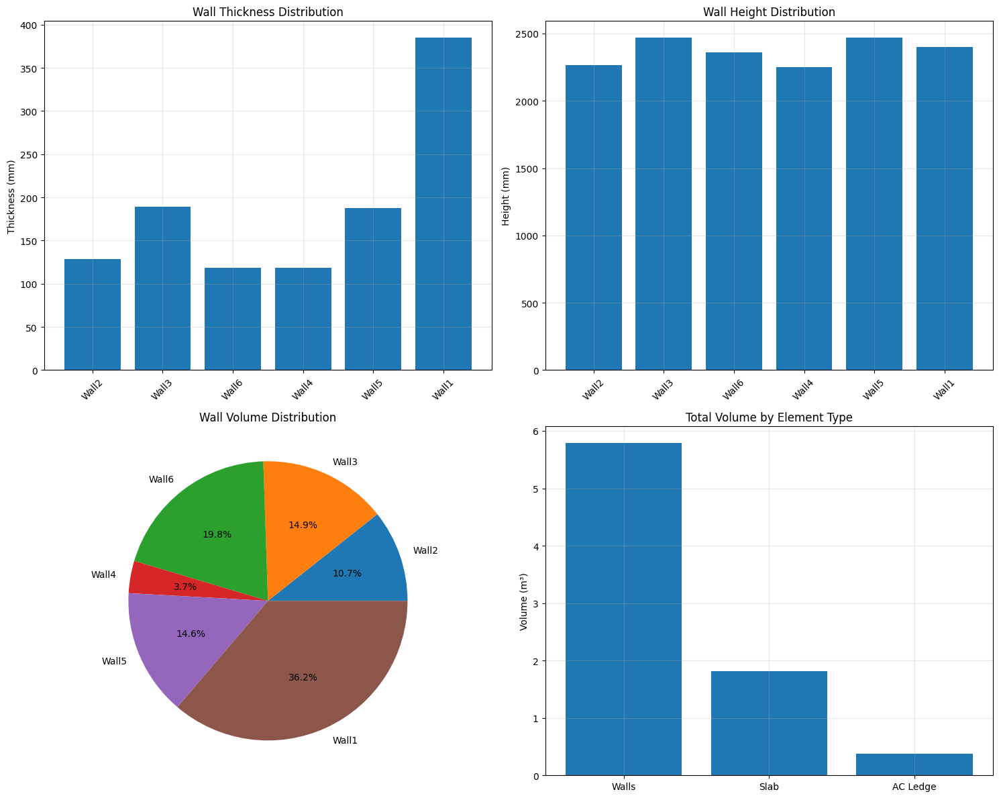


TOTAL QUANTITIES:
--------------------------------------------------------------------------------
Total wall volume: 5.789 m³
Slab volume: 1.813 m³
AC ledge volume: 0.377 m³
Total structural volume: 7.980 m³

Structural element breakdown:
Walls: 72.5%
Slab: 22.7%
AC ledge: 4.7%

Estimated concrete required: 19150.9 kg (19.15 metric tons)


In [59]:
def summarize_element_dimensions(wall_solids, slab_entity, ac_ledge_entity, void_analysis=None):
    """
    Generate a comprehensive summary of all element dimensions in the model.
    
    Args:
        wall_solids: Dictionary of wall entities
        slab_entity: Slab entity dictionary
        ac_ledge_entity: AC ledge entity dictionary
        void_analysis: Optional void analysis data
        
    Returns:
        summary_data: Dictionary containing dimension summaries for all elements
    """
    import numpy as np
    import pandas as pd
    import matplotlib.pyplot as plt
    
    print("\n" + "="*80)
    print("ARCHITECTURAL ELEMENT DIMENSIONS SUMMARY")
    print("="*80)
    
    summary_data = {
        'walls': {},
        'slab': {},
        'ac_ledge': {},
        'voids': {}
    }
    
    # Helper function to calculate dimensions
    def get_element_dimensions(vertices):
        min_coords = np.min(vertices, axis=0)
        max_coords = np.max(vertices, axis=0)
        
        dimensions = {
            'width': max_coords[0] - min_coords[0],    # X dimension
            'length': max_coords[1] - min_coords[1],   # Y dimension
            'height': max_coords[2] - min_coords[2],   # Z dimension
            'volume': None,  # Will calculate based on geometry
            'min_coords': min_coords,
            'max_coords': max_coords,
            'center': (max_coords + min_coords) / 2
        }
        
        # For regular prismatic shapes, estimate volume
        dimensions['volume'] = dimensions['width'] * dimensions['length'] * dimensions['height']
        
        return dimensions
    
    # Analyze wall dimensions
    print("\nWALL DIMENSIONS:")
    print("-" * 80)
    print(f"{'Wall ID':<10} {'Width (mm)':<15} {'Length (mm)':<15} {'Height (mm)':<15} {'Volume (m³)':<15} {'Center Point':<20}")
    print("-" * 80)
    
    wall_data = []
    for wall_id, wall in wall_solids.items():
        vertices = wall['vertices']
        dim = get_element_dimensions(vertices)
        summary_data['walls'][wall_id] = dim
        
        # Determine wall orientation (X-aligned or Y-aligned)
        if dim['width'] > dim['length']:
            orientation = "X-aligned"
            primary_dim = dim['width']
            secondary_dim = dim['length']
        else:
            orientation = "Y-aligned"
            primary_dim = dim['length']
            secondary_dim = dim['width']
        
        # Store for DataFrame
        wall_data.append({
            'ID': wall_id,
            'Width (mm)': dim['width'],
            'Length (mm)': dim['length'],
            'Height (mm)': dim['height'],
            'Volume (m³)': dim['volume'] / 1e9,  # Convert mm³ to m³
            'Orientation': orientation,
            'Primary Dimension (mm)': primary_dim,
            'Thickness (mm)': secondary_dim,
            'Center X': dim['center'][0],
            'Center Y': dim['center'][1],
            'Center Z': dim['center'][2]
        })
        
        print(f"{wall_id:<10} {dim['width']:<15.2f} {dim['length']:<15.2f} {dim['height']:<15.2f} "
              f"{dim['volume']/1e9:<15.3f} ({dim['center'][0]:.1f}, {dim['center'][1]:.1f}, {dim['center'][2]:.1f})")
    
    # Convert to DataFrame for further analysis
    walls_df = pd.DataFrame(wall_data)
    summary_data['walls_df'] = walls_df
    
    # Analyze slab dimensions
    print("\nSLAB DIMENSIONS:")
    print("-" * 80)
    slab_dim = get_element_dimensions(slab_entity['vertices'])
    summary_data['slab'] = slab_dim
    
    print(f"Width (X): {slab_dim['width']:.2f} mm")
    print(f"Length (Y): {slab_dim['length']:.2f} mm")
    print(f"Thickness (Z): {slab_dim['height']:.2f} mm")
    print(f"Area: {slab_dim['width'] * slab_dim['length'] / 1e6:.2f} m²")
    print(f"Volume: {slab_dim['volume'] / 1e9:.3f} m³")
    print(f"Center point: ({slab_dim['center'][0]:.1f}, {slab_dim['center'][1]:.1f}, {slab_dim['center'][2]:.1f})")
    
    # Analyze AC ledge dimensions
    print("\nAC LEDGE DIMENSIONS:")
    print("-" * 80)
    ac_ledge_dim = get_element_dimensions(ac_ledge_entity['vertices'])
    summary_data['ac_ledge'] = ac_ledge_dim
    
    print(f"Width (X): {ac_ledge_dim['width']:.2f} mm")
    print(f"Length (Y): {ac_ledge_dim['length']:.2f} mm")
    print(f"Thickness (Z): {ac_ledge_dim['height']:.2f} mm")
    print(f"Area: {ac_ledge_dim['width'] * ac_ledge_dim['length'] / 1e6:.2f} m²")
    print(f"Volume: {ac_ledge_dim['volume'] / 1e9:.3f} m³")
    print(f"Center point: ({ac_ledge_dim['center'][0]:.1f}, {ac_ledge_dim['center'][1]:.1f}, {ac_ledge_dim['center'][2]:.1f})")
    
    # Analyze voids if available
    if void_analysis is not None:
        print("\nVOID DIMENSIONS:")
        print("-" * 80)
        print(f"{'Void ID':<10} {'Width (mm)':<15} {'Height (mm)':<15} {'Thickness (mm)':<15} {'Volume (m³)':<15}")
        print("-" * 80)
        
        void_count = 0
        if isinstance(void_analysis, dict):
            # Process dictionary-style void data
            for void_id, void_data in void_analysis.items():
                if 'vertices' in void_data:
                    void_dim = get_element_dimensions(void_data['vertices'])
                    summary_data['voids'][void_id] = void_dim
                    
                    print(f"{void_id:<10} {void_dim['width']:<15.2f} {void_dim['height']:<15.2f} "
                          f"{void_dim['length']:<15.2f} {void_dim['volume']/1e9:<15.3f}")
                    void_count += 1
        elif isinstance(void_analysis, list):
            # Process list-style void data
            for i, void_vertices in enumerate(void_analysis):
                if len(void_vertices) > 0:
                    void_dim = get_element_dimensions(void_vertices)
                    summary_data['voids'][f'Void_{i+1}'] = void_dim
                    
                    print(f"Void_{i+1:<6} {void_dim['width']:<15.2f} {void_dim['height']:<15.2f} "
                          f"{void_dim['length']:<15.2f} {void_dim['volume']/1e9:<15.3f}")
                    void_count += 1
        
        if void_count == 0:
            print("No void data available.")
    
    # Create summary visualizations
    fig, axs = plt.subplots(2, 2, figsize=(15, 12))
    
    # Wall thickness distribution
    axs[0, 0].bar(walls_df['ID'], walls_df['Thickness (mm)'])
    axs[0, 0].set_title('Wall Thickness Distribution')
    axs[0, 0].set_ylabel('Thickness (mm)')
    axs[0, 0].set_xticklabels(walls_df['ID'], rotation=45)
    axs[0, 0].grid(True, alpha=0.3)
    
    # Wall height distribution
    axs[0, 1].bar(walls_df['ID'], walls_df['Height (mm)'])
    axs[0, 1].set_title('Wall Height Distribution')
    axs[0, 1].set_ylabel('Height (mm)')
    axs[0, 1].set_xticklabels(walls_df['ID'], rotation=45)
    axs[0, 1].grid(True, alpha=0.3)
    
    # Wall volume comparison
    axs[1, 0].pie(walls_df['Volume (m³)'], labels=walls_df['ID'], autopct='%1.1f%%')
    axs[1, 0].set_title('Wall Volume Distribution')
    
    # Element volume comparison
    total_volumes = [
        sum(walls_df['Volume (m³)']),
        slab_dim['volume'] / 1e9,
        ac_ledge_dim['volume'] / 1e9
    ]
    labels = ['Walls', 'Slab', 'AC Ledge']
    axs[1, 1].bar(labels, total_volumes)
    axs[1, 1].set_title('Total Volume by Element Type')
    axs[1, 1].set_ylabel('Volume (m³)')
    axs[1, 1].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    # Print total quantities
    print("\nTOTAL QUANTITIES:")
    print("-" * 80)
    total_wall_volume = sum(walls_df['Volume (m³)'])
    total_volume = total_wall_volume + slab_dim['volume']/1e9 + ac_ledge_dim['volume']/1e9
    
    print(f"Total wall volume: {total_wall_volume:.3f} m³")
    print(f"Slab volume: {slab_dim['volume']/1e9:.3f} m³")
    print(f"AC ledge volume: {ac_ledge_dim['volume']/1e9:.3f} m³")
    print(f"Total structural volume: {total_volume:.3f} m³")
    
    print("\nStructural element breakdown:")
    print(f"Walls: {total_wall_volume/total_volume*100:.1f}%")
    print(f"Slab: {slab_dim['volume']/1e9/total_volume*100:.1f}%")
    print(f"AC ledge: {ac_ledge_dim['volume']/1e9/total_volume*100:.1f}%")
    
    # Calculate material quantities (assuming concrete)
    concrete_density = 2400  # kg/m³
    total_concrete = total_volume * concrete_density
    print(f"\nEstimated concrete required: {total_concrete:.1f} kg ({total_concrete/1000:.2f} metric tons)")
    
    print("="*80)
    
    return summary_data

# Example usage:
dimensions_summary = summarize_element_dimensions(
    wall_solids, 
    slab_entity, 
    ac_ledge_entity, 
    void_analysis=reduced_void_analysis
)